In [1]:
%matplotlib inline

In [2]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cPickle
from sklearn.linear_model import LogisticRegression
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.metrics import accuracy_score, log_loss
import graphviz
from keras.models import Sequential
from keras.layers import Input, Dense, Activation, Flatten, Dropout, BatchNormalization, Conv2D, MaxPooling2D, GlobalAveragePooling2D
from SpatialPyramidPooling  import SpatialPyramidPooling
from PIL import Image
import cv2

Using Theano backend.
Using cuDNN version 5103 on context None
Preallocating 10869/11441 Mb (0.950000) on cuda
Mapped name None to device cuda: Tesla K40c (0000:81:00.0)


### Helper functions

In [3]:
def loadData():
    with open('pkl_data/notes_pos.pkl','rb') as f:
        dpos = cPickle.load(f)
    with open('pkl_data/notes_neg.pkl','rb') as f:
        dneg = cPickle.load(f)
    return (dpos, dneg)

In [4]:
def concatFolds(pos, neg, scores):
    X_pos = np.concatenate([pos[score] for score in scores], axis=0)
    Y_pos = np.ones(X_pos.shape[0])
    X_neg = np.concatenate([neg[score] for score in scores], axis=0)
    Y_neg = np.zeros(X_neg.shape[0])
    X = np.concatenate((X_pos, X_neg), axis=0)
    Y = np.concatenate((Y_pos, Y_neg))
    return (X,Y)

In [5]:
def getTrainTestSplit(pos, neg, test_fold):
    all_folds = pos.keys()
    train_folds = [fold for fold in all_folds if fold != test_fold]
    (X_train, Y_train) = concatFolds(pos, neg, train_folds)
    (X_test, Y_test) = concatFolds(pos, neg, [test_fold])
    return (X_train, Y_train, X_test, Y_test)

In [6]:
def flattenImages(tensor):
    A = tensor.reshape((tensor.shape[0], -1))
    return A

In [7]:
def runCrossValidation(clf, dpos, dneg, flatten = True, pca_dims = None):
    
    labels = np.array([]) # ground truth labels
    preds = np.array([])  # predicted labels 
    probs = np.array([]) # predicted probabilities
    clfs = []
    
    for score in dpos.keys():

        # prep data
        (X_train, Y_train, X_test, Y_test) = getTrainTestSplit(dpos, dneg, score)
        if flatten:
            X_train = flattenImages(X_train)
            X_test = flattenImages(X_test)
        if pca_dims:            
            pca = PCA(n_components = pca_dims)
            pca = pca.fit(X_train)
            X_train = pca.transform(X_train)
            X_test = pca.transform(X_test)

        # fit model
        clf = clf.fit(X_train, Y_train)
        clfs.append(clf)

        # accumulate across folds
        Y_pred = clf.predict(X_test)
        Y_prob = clf.predict_proba(X_test)
        labels = np.concatenate((labels, Y_test))
        preds = np.concatenate((preds, Y_pred))
        probs = np.concatenate((probs, Y_prob[:,1]))

    # cumulative metrics
    acc = accuracy_score(labels, preds)
    logloss = log_loss(labels, probs)  
    
    return (acc, logloss, clfs)

In [8]:
def showImage(X, sz = (4,4)):
    plt.figure(figsize=sz)
    plt.imshow(1-X, cmap='gray', vmin=0, vmax=1)

### PCA Analysis

Determine number of dimensions to retain 95% of variance

In [9]:
def calcNumPCADimensions(dpos, dneg, var):
    X_pos = np.concatenate([dpos[score] for score in dpos.keys()], axis=0)
    X_neg = np.concatenate([dneg[score] for score in dpos.keys()], axis=0)
    X_all = np.concatenate((X_pos, X_neg))
    pca = PCA()
    pca = pca.fit(flattenImages(X_all))
    cumvar = pca.explained_variance_ratio_.cumsum()
    nComponents = np.where(cumvar > var)[0][0]
    return (nComponents, pca)

In [10]:
def visualizePCAComponents(comp, rows = 4, cols = 4):
    fig=plt.figure(figsize=(8, 8))
    for i in range(0, cols*rows):
        fig.add_subplot(rows, cols, i+1)
        plt.imshow(comp[i].reshape(15,15), cmap='gray')
        plt.title('Comp %d' % i)
    plt.show()

In [11]:
(dpos, dneg) = loadData()
nComponents, pca = calcNumPCADimensions(dpos, dneg, .95)
nComponents

22

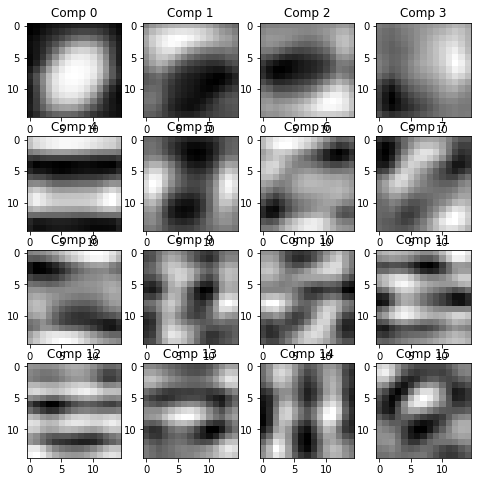

In [12]:
visualizePCAComponents(pca.components_)

### Logistic Regression

In [13]:
clf = LogisticRegression()
(acc, logloss, clfs) = runCrossValidation(clf, dpos, dneg)
(acc, logloss)

(0.96073985680190932, 0.11700017028771709)

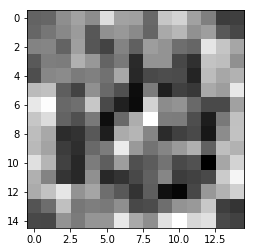

In [14]:
plt.imshow(-1*clfs[0].coef_.reshape(15,15), cmap='gray')
plt.show()

In [16]:
with open('models/lr8.pkl','wb') as f:
    cPickle.dump(clf, f)

### Decision tree

Train decision tree on PCA-reduced data

In [17]:
clf = DecisionTreeClassifier(max_depth=5)
(acc, logloss, clfs) = runCrossValidation(clf, dpos, dneg, pca_dims=nComponents)
(acc, logloss)

(0.94128878281622907, 0.31811885980769378)

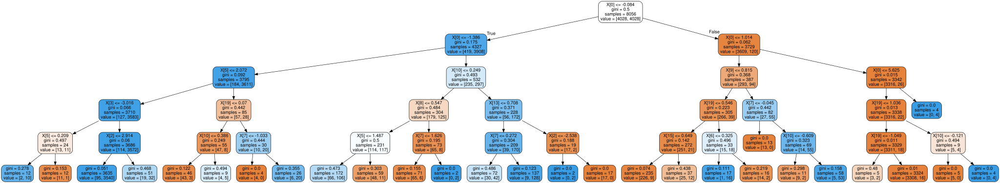

In [18]:
tree_data = tree.export_graphviz(clfs[0], out_file=None, filled=True, rounded=True)
graph = graphviz.Source(tree_data)  
graph 

### Random Forest

In [19]:
clf = RandomForestClassifier(max_depth=5, random_state=0)
(acc, logloss, clfs) = runCrossValidation(clf, dpos, dneg, pca_dims=nComponents)
(acc, logloss)

(0.9504773269689738, 0.29614574775057251)

In [20]:
[(i, imp) for i, imp in enumerate(clfs[0].feature_importances_)][0:15]

[(0, 0.52864060026137205),
 (1, 0.096037678614205133),
 (2, 0.034889953936267697),
 (3, 0.011689834683975305),
 (4, 0.037032077226495139),
 (5, 0.028217545385985792),
 (6, 0.015103056378377338),
 (7, 0.032842523650134826),
 (8, 0.020007171113626425),
 (9, 0.011294056945079246),
 (10, 0.017910080667483418),
 (11, 0.010245003941016097),
 (12, 0.061193332545094514),
 (13, 0.011763498025617772),
 (14, 0.0094996632678015537)]

### Adaboost with tree stumps

In [21]:
clf = AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=1), random_state=0)
(acc, logloss, clfs) = runCrossValidation(clf, dpos, dneg, pca_dims=nComponents)
(acc, logloss)

(0.95286396181384247, 0.61661539307344593)

In [22]:
[(i, imp) for i, imp in enumerate(clfs[0].feature_importances_)][0:20]

[(0, 0.28000000000000003),
 (1, 0.080000000000000002),
 (2, 0.040000000000000001),
 (3, 0.059999999999999998),
 (4, 0.02),
 (5, 0.12),
 (6, 0.040000000000000001),
 (7, 0.0),
 (8, 0.059999999999999998),
 (9, 0.040000000000000001),
 (10, 0.02),
 (11, 0.0),
 (12, 0.02),
 (13, 0.02),
 (14, 0.040000000000000001),
 (15, 0.059999999999999998),
 (16, 0.02),
 (17, 0.0),
 (18, 0.0),
 (19, 0.059999999999999998)]

### Neural Network

In [34]:
def runCrossValidation_keras(getModel_callback, dpos, dneg, nb_epoch=10, cnn=False):
    
    labels = np.array([]) # ground truth labels
    probs = np.array([]) # predicted probabilities
    models = [] 
    
    for score in sorted(dpos.keys()):

        print 'Test fold %s' % score
        (X_train, Y_train, X_test, Y_test) = getTrainTestSplit(dpos, dneg, score)
        if cnn:
            X_train = np.expand_dims(X_train, axis=3)
            X_test = np.expand_dims(X_test, axis=3)
        model = getModel_callback()
        model.fit(X_train, Y_train, nb_epoch=nb_epoch, validation_data=(X_test,Y_test))
        Y_pred = model.predict(X_test)
        labels = np.concatenate((labels, Y_test))
        probs = np.concatenate((probs, np.squeeze(Y_pred)))
        models.append(model)
        
    acc = accuracy_score(labels, np.round(probs))
    logloss = log_loss(labels, probs)  
    
    return (acc, logloss, models)

Single dense layer

In [23]:
def getModel_dense1():
    model = Sequential([
        Flatten(input_shape=(15,15)),
        Dense(1, activation = 'sigmoid'),
    ])
    model.compile(optimizer='rmsprop',loss='binary_crossentropy',metrics=['accuracy'])
    return model

In [24]:
(acc, logloss, models) = runCrossValidation_keras(getModel_dense1, dpos, dneg, nb_epoch=50)

Test fold score1
Train on 8100 samples, validate on 280 samples
Epoch 1/50
8100/8100 [==============================] - 0s - loss: 0.4116 - acc: 0.8204 - val_loss: 0.3276 - val_acc: 0.9071
Epoch 2/50
8100/8100 [==============================] - 0s - loss: 0.2887 - acc: 0.8967 - val_loss: 0.2875 - val_acc: 0.9143
Epoch 3/50
8100/8100 [==============================] - 0s - loss: 0.2554 - acc: 0.9115 - val_loss: 0.2549 - val_acc: 0.9321
Epoch 4/50
6656/8100 [=======================>......] - ETA: 0s - loss: 0.2358 - acc: 0.9232

KeyboardInterrupt: 

In [38]:
(acc, logloss)

(0.96014319809069215, 0.12003898100561645)

Two dense layers (with dropout & batchnorm)

In [39]:
def getModel_dense2():
    model = Sequential([
        Flatten(input_shape=(15,15)),
        BatchNormalization(),
        Dense(20, activation = 'relu'),
        Dropout(.25),
        BatchNormalization(),
        Dense(1, activation = 'sigmoid')
    ])
    model.compile(optimizer='rmsprop',loss='binary_crossentropy',metrics=['accuracy'])
    return model

In [40]:
(acc, logloss, models) = runCrossValidation_keras(getModel_dense2, dpos, dneg, nb_epoch=25)

Test fold score1
Train on 8100 samples, validate on 280 samples
Epoch 1/25
8100/8100 [==============================] - 0s - loss: 0.1822 - acc: 0.9337 - val_loss: 0.1226 - val_acc: 0.9679
Epoch 2/25
8100/8100 [==============================] - 0s - loss: 0.1280 - acc: 0.9559 - val_loss: 0.1973 - val_acc: 0.9286
Epoch 3/25
8100/8100 [==============================] - 0s - loss: 0.1149 - acc: 0.9615 - val_loss: 0.1425 - val_acc: 0.9643
Epoch 4/25
8100/8100 [==============================] - 0s - loss: 0.1016 - acc: 0.9651 - val_loss: 0.2034 - val_acc: 0.9143
Epoch 5/25
8100/8100 [==============================] - 0s - loss: 0.1045 - acc: 0.9644 - val_loss: 0.1646 - val_acc: 0.9464
Epoch 6/25
8100/8100 [==============================] - 0s - loss: 0.1014 - acc: 0.9668 - val_loss: 0.2500 - val_acc: 0.8929
Epoch 7/25
8100/8100 [==============================] - 0s - loss: 0.0956 - acc: 0.9690 - val_loss: 0.2318 - val_acc: 0.9036
Epoch 8/25
8100/8100 [==============================] - 0s - 

8044/8044 [==============================] - 0s - loss: 0.1321 - acc: 0.9530 - val_loss: 0.0843 - val_acc: 0.9792
Epoch 3/25
8044/8044 [==============================] - 0s - loss: 0.1242 - acc: 0.9584 - val_loss: 0.0692 - val_acc: 0.9792
Epoch 4/25
8044/8044 [==============================] - 0s - loss: 0.1146 - acc: 0.9636 - val_loss: 0.0567 - val_acc: 0.9851
Epoch 5/25
8044/8044 [==============================] - 0s - loss: 0.1108 - acc: 0.9611 - val_loss: 0.0547 - val_acc: 0.9911
Epoch 6/25
8044/8044 [==============================] - 0s - loss: 0.1062 - acc: 0.9632 - val_loss: 0.0544 - val_acc: 0.9911
Epoch 7/25
8044/8044 [==============================] - 0s - loss: 0.1036 - acc: 0.9653 - val_loss: 0.0558 - val_acc: 0.9821
Epoch 8/25
8044/8044 [==============================] - 0s - loss: 0.1053 - acc: 0.9656 - val_loss: 0.0612 - val_acc: 0.9821
Epoch 9/25
8044/8044 [==============================] - 0s - loss: 0.1022 - acc: 0.9692 - val_loss: 0.0496 - val_acc: 0.9911
Epoch 10/25

8274/8274 [==============================] - 0s - loss: 0.1053 - acc: 0.9646 - val_loss: 0.0271 - val_acc: 0.9811
Epoch 5/25
8274/8274 [==============================] - 0s - loss: 0.1076 - acc: 0.9642 - val_loss: 0.0244 - val_acc: 0.9906
Epoch 6/25
8274/8274 [==============================] - 0s - loss: 0.1026 - acc: 0.9665 - val_loss: 0.0145 - val_acc: 0.9906
Epoch 7/25
8274/8274 [==============================] - 0s - loss: 0.0997 - acc: 0.9672 - val_loss: 0.0293 - val_acc: 0.9811
Epoch 8/25
8274/8274 [==============================] - 0s - loss: 0.1031 - acc: 0.9670 - val_loss: 0.0206 - val_acc: 0.9811
Epoch 9/25
8274/8274 [==============================] - 0s - loss: 0.0970 - acc: 0.9679 - val_loss: 0.0222 - val_acc: 0.9811
Epoch 10/25
8274/8274 [==============================] - 0s - loss: 0.0953 - acc: 0.9712 - val_loss: 0.0254 - val_acc: 0.9906
Epoch 11/25
8274/8274 [==============================] - 0s - loss: 0.0955 - acc: 0.9694 - val_loss: 0.0149 - val_acc: 0.9906
Epoch 12/

7962/7962 [==============================] - 0s - loss: 0.1014 - acc: 0.9647 - val_loss: 0.1001 - val_acc: 0.9737
Epoch 7/25
7962/7962 [==============================] - 0s - loss: 0.0978 - acc: 0.9676 - val_loss: 0.0915 - val_acc: 0.9785
Epoch 8/25
7962/7962 [==============================] - 0s - loss: 0.0980 - acc: 0.9690 - val_loss: 0.0936 - val_acc: 0.9809
Epoch 9/25
7962/7962 [==============================] - 0s - loss: 0.0973 - acc: 0.9696 - val_loss: 0.0997 - val_acc: 0.9761
Epoch 10/25
7962/7962 [==============================] - 0s - loss: 0.0960 - acc: 0.9685 - val_loss: 0.0838 - val_acc: 0.9785
Epoch 11/25
7962/7962 [==============================] - 0s - loss: 0.0968 - acc: 0.9697 - val_loss: 0.0895 - val_acc: 0.9809
Epoch 12/25
7962/7962 [==============================] - 0s - loss: 0.0884 - acc: 0.9724 - val_loss: 0.0993 - val_acc: 0.9713
Epoch 13/25
7962/7962 [==============================] - 0s - loss: 0.0900 - acc: 0.9734 - val_loss: 0.0915 - val_acc: 0.9761
Epoch 1

8210/8210 [==============================] - 0s - loss: 0.0993 - acc: 0.9671 - val_loss: 0.0226 - val_acc: 0.9941
Epoch 9/25
8210/8210 [==============================] - 0s - loss: 0.0963 - acc: 0.9700 - val_loss: 0.0245 - val_acc: 0.9941
Epoch 10/25
8210/8210 [==============================] - 0s - loss: 0.1022 - acc: 0.9691 - val_loss: 0.0187 - val_acc: 0.9941
Epoch 11/25
8210/8210 [==============================] - 0s - loss: 0.0975 - acc: 0.9672 - val_loss: 0.0188 - val_acc: 0.9941
Epoch 12/25
8210/8210 [==============================] - 0s - loss: 0.0988 - acc: 0.9687 - val_loss: 0.0211 - val_acc: 0.9941
Epoch 13/25
8210/8210 [==============================] - 0s - loss: 0.0903 - acc: 0.9705 - val_loss: 0.0203 - val_acc: 0.9941
Epoch 14/25
8210/8210 [==============================] - 0s - loss: 0.0976 - acc: 0.9677 - val_loss: 0.0193 - val_acc: 0.9941
Epoch 15/25
8210/8210 [==============================] - 0s - loss: 0.0906 - acc: 0.9705 - val_loss: 0.0206 - val_acc: 0.9941
Epoch

8044/8044 [==============================] - 0s - loss: 0.0907 - acc: 0.9690 - val_loss: 0.0960 - val_acc: 0.9643
Epoch 11/25
8044/8044 [==============================] - 0s - loss: 0.0981 - acc: 0.9666 - val_loss: 0.0897 - val_acc: 0.9732
Epoch 12/25
8044/8044 [==============================] - 0s - loss: 0.0923 - acc: 0.9704 - val_loss: 0.0861 - val_acc: 0.9673
Epoch 13/25
8044/8044 [==============================] - 0s - loss: 0.0900 - acc: 0.9694 - val_loss: 0.0848 - val_acc: 0.9821
Epoch 14/25
8044/8044 [==============================] - 0s - loss: 0.0882 - acc: 0.9720 - val_loss: 0.0823 - val_acc: 0.9732
Epoch 15/25
8044/8044 [==============================] - 0s - loss: 0.0897 - acc: 0.9709 - val_loss: 0.0826 - val_acc: 0.9792
Epoch 16/25
8044/8044 [==============================] - 0s - loss: 0.0926 - acc: 0.9722 - val_loss: 0.0857 - val_acc: 0.9792
Epoch 17/25
8044/8044 [==============================] - 0s - loss: 0.0891 - acc: 0.9718 - val_loss: 0.0867 - val_acc: 0.9821
Epoc

In [41]:
acc, logloss

(0.97362768496420049, 0.089552351331542795)

Three dense layers (with dropout & batchnorm)

In [42]:
def getModel_dense3():
    model = Sequential([
        Flatten(input_shape=(15,15)),
        BatchNormalization(),
        Dense(30, activation = 'relu'),
        Dropout(.1),
        BatchNormalization(),
        Dense(30, activation = 'relu'),
        Dropout(.25),
        BatchNormalization(),
        Dense(1, activation = 'sigmoid')
    ])
    model.compile(optimizer='rmsprop',loss='binary_crossentropy',metrics=['accuracy'])
    return model

In [43]:
(acc, logloss, models) = runCrossValidation_keras(getModel_dense3, dpos, dneg, nb_epoch=25)

Test fold score1
Train on 8100 samples, validate on 280 samples
Epoch 1/25
8100/8100 [==============================] - 0s - loss: 0.2014 - acc: 0.9222 - val_loss: 0.1648 - val_acc: 0.9571
Epoch 2/25
8100/8100 [==============================] - 0s - loss: 0.1282 - acc: 0.9553 - val_loss: 0.2330 - val_acc: 0.9000
Epoch 3/25
8100/8100 [==============================] - 0s - loss: 0.1165 - acc: 0.9580 - val_loss: 0.1978 - val_acc: 0.9214
Epoch 4/25
8100/8100 [==============================] - 0s - loss: 0.0990 - acc: 0.9663 - val_loss: 0.1743 - val_acc: 0.9500
Epoch 5/25
8100/8100 [==============================] - 0s - loss: 0.1044 - acc: 0.9635 - val_loss: 0.1639 - val_acc: 0.9571
Epoch 6/25
8100/8100 [==============================] - 0s - loss: 0.1032 - acc: 0.9664 - val_loss: 0.1684 - val_acc: 0.9393
Epoch 7/25
8100/8100 [==============================] - 0s - loss: 0.0955 - acc: 0.9700 - val_loss: 0.2592 - val_acc: 0.8964
Epoch 8/25
8100/8100 [==============================] - 0s - 

8044/8044 [==============================] - 0s - loss: 0.1279 - acc: 0.9566 - val_loss: 0.0721 - val_acc: 0.9762
Epoch 3/25
8044/8044 [==============================] - 0s - loss: 0.1183 - acc: 0.9582 - val_loss: 0.0552 - val_acc: 0.9792
Epoch 4/25
8044/8044 [==============================] - 0s - loss: 0.1120 - acc: 0.9621 - val_loss: 0.0544 - val_acc: 0.9851
Epoch 5/25
8044/8044 [==============================] - 0s - loss: 0.1009 - acc: 0.9661 - val_loss: 0.0627 - val_acc: 0.9762
Epoch 6/25
8044/8044 [==============================] - 0s - loss: 0.1022 - acc: 0.9674 - val_loss: 0.0441 - val_acc: 0.9881
Epoch 7/25
8044/8044 [==============================] - 0s - loss: 0.0936 - acc: 0.9685 - val_loss: 0.0532 - val_acc: 0.9881
Epoch 8/25
8044/8044 [==============================] - 0s - loss: 0.0959 - acc: 0.9700 - val_loss: 0.0510 - val_acc: 0.9881
Epoch 9/25
8044/8044 [==============================] - 0s - loss: 0.0875 - acc: 0.9722 - val_loss: 0.0481 - val_acc: 0.9851
Epoch 10/25

8274/8274 [==============================] - 0s - loss: 0.1051 - acc: 0.9659 - val_loss: 0.0263 - val_acc: 0.9906
Epoch 5/25
8274/8274 [==============================] - 0s - loss: 0.1017 - acc: 0.9669 - val_loss: 0.0133 - val_acc: 0.9906
Epoch 6/25
8274/8274 [==============================] - 0s - loss: 0.0967 - acc: 0.9698 - val_loss: 0.0108 - val_acc: 0.9906
Epoch 7/25
8274/8274 [==============================] - 0s - loss: 0.0979 - acc: 0.9710 - val_loss: 0.0313 - val_acc: 0.9906
Epoch 8/25
8274/8274 [==============================] - 0s - loss: 0.0915 - acc: 0.9706 - val_loss: 0.0169 - val_acc: 0.9906
Epoch 9/25
8274/8274 [==============================] - 0s - loss: 0.0904 - acc: 0.9699 - val_loss: 0.0185 - val_acc: 0.9906
Epoch 10/25
8274/8274 [==============================] - 0s - loss: 0.0857 - acc: 0.9722 - val_loss: 0.0276 - val_acc: 0.9906
Epoch 11/25
8274/8274 [==============================] - 0s - loss: 0.0923 - acc: 0.9716 - val_loss: 0.0179 - val_acc: 0.9906
Epoch 12/

7962/7962 [==============================] - 0s - loss: 0.0945 - acc: 0.9683 - val_loss: 0.0862 - val_acc: 0.9737
Epoch 7/25
7962/7962 [==============================] - 0s - loss: 0.0964 - acc: 0.9692 - val_loss: 0.0669 - val_acc: 0.9833
Epoch 8/25
7962/7962 [==============================] - 0s - loss: 0.0900 - acc: 0.9715 - val_loss: 0.0648 - val_acc: 0.9833
Epoch 9/25
7962/7962 [==============================] - 0s - loss: 0.0908 - acc: 0.9712 - val_loss: 0.0696 - val_acc: 0.9785
Epoch 10/25
7962/7962 [==============================] - 0s - loss: 0.0876 - acc: 0.9711 - val_loss: 0.0697 - val_acc: 0.9785
Epoch 11/25
7962/7962 [==============================] - 0s - loss: 0.0872 - acc: 0.9734 - val_loss: 0.0683 - val_acc: 0.9833
Epoch 12/25
7962/7962 [==============================] - 0s - loss: 0.0809 - acc: 0.9766 - val_loss: 0.0675 - val_acc: 0.9833
Epoch 13/25
7962/7962 [==============================] - 0s - loss: 0.0776 - acc: 0.9732 - val_loss: 0.0617 - val_acc: 0.9809
Epoch 1

8210/8210 [==============================] - 0s - loss: 0.0898 - acc: 0.9710 - val_loss: 0.0122 - val_acc: 0.9882
Epoch 9/25
8210/8210 [==============================] - 0s - loss: 0.0868 - acc: 0.9728 - val_loss: 0.0104 - val_acc: 0.9941
Epoch 10/25
8210/8210 [==============================] - 0s - loss: 0.0835 - acc: 0.9741 - val_loss: 0.0100 - val_acc: 0.9941
Epoch 11/25
8210/8210 [==============================] - 0s - loss: 0.0888 - acc: 0.9721 - val_loss: 0.0049 - val_acc: 1.0000
Epoch 12/25
8210/8210 [==============================] - 0s - loss: 0.0849 - acc: 0.9731 - val_loss: 0.0067 - val_acc: 1.0000
Epoch 13/25
8210/8210 [==============================] - 0s - loss: 0.0846 - acc: 0.9727 - val_loss: 0.0089 - val_acc: 0.9941
Epoch 14/25
8210/8210 [==============================] - 0s - loss: 0.0765 - acc: 0.9765 - val_loss: 0.0067 - val_acc: 1.0000
Epoch 15/25
8210/8210 [==============================] - 0s - loss: 0.0813 - acc: 0.9744 - val_loss: 0.0038 - val_acc: 1.0000
Epoch

8044/8044 [==============================] - 0s - loss: 0.0818 - acc: 0.9729 - val_loss: 0.0958 - val_acc: 0.9732
Epoch 11/25
8044/8044 [==============================] - 0s - loss: 0.0885 - acc: 0.9712 - val_loss: 0.0835 - val_acc: 0.9702
Epoch 12/25
8044/8044 [==============================] - 0s - loss: 0.0816 - acc: 0.9748 - val_loss: 0.0963 - val_acc: 0.9732
Epoch 13/25
8044/8044 [==============================] - 0s - loss: 0.0837 - acc: 0.9753 - val_loss: 0.0906 - val_acc: 0.9821
Epoch 14/25
8044/8044 [==============================] - 0s - loss: 0.0825 - acc: 0.9751 - val_loss: 0.0930 - val_acc: 0.9792
Epoch 15/25
8044/8044 [==============================] - 0s - loss: 0.0822 - acc: 0.9741 - val_loss: 0.1032 - val_acc: 0.9732
Epoch 16/25
8044/8044 [==============================] - 0s - loss: 0.0792 - acc: 0.9748 - val_loss: 0.0931 - val_acc: 0.9762
Epoch 17/25
8044/8044 [==============================] - 0s - loss: 0.0809 - acc: 0.9760 - val_loss: 0.0879 - val_acc: 0.9792
Epoc

In [44]:
acc, logloss

(0.97350835322195706, 0.090204685181857008)

CNN: 1 conv layer, 1 dense layer

In [47]:
def getModel_conv1():
    model = Sequential([
        Conv2D(16, 3, 3, activation='relu', input_shape=(15, 15, 1)),
        Dropout(.25),
        BatchNormalization(),
        Flatten(),
        Dense(1, activation = 'sigmoid')
    ])
    model.compile(optimizer='rmsprop',loss='binary_crossentropy',metrics=['accuracy'])
    return model

In [ ]:
(acc, logloss, models) = runCrossValidation_keras(getModel_conv1, dpos, dneg, nb_epoch=25, cnn=True)

Test fold score1
Train on 8100 samples, validate on 280 samples
Epoch 1/25
8100/8100 [==============================] - 4s - loss: 0.1341 - acc: 0.9501 - val_loss: 0.9376 - val_acc: 0.5000
Epoch 2/25
8100/8100 [==============================] - 4s - loss: 0.0829 - acc: 0.9714 - val_loss: 0.4249 - val_acc: 0.7714
Epoch 3/25
8100/8100 [==============================] - 4s - loss: 0.0765 - acc: 0.9764 - val_loss: 0.3994 - val_acc: 0.8214
Epoch 4/25
8100/8100 [==============================] - 4s - loss: 0.0701 - acc: 0.9788 - val_loss: 0.3513 - val_acc: 0.8643
Epoch 5/25
8100/8100 [==============================] - 4s - loss: 0.0680 - acc: 0.9777 - val_loss: 0.2503 - val_acc: 0.9000
Epoch 6/25
8100/8100 [==============================] - 4s - loss: 0.0663 - acc: 0.9789 - val_loss: 0.3890 - val_acc: 0.8607
Epoch 7/25
8100/8100 [==============================] - 4s - loss: 0.0623 - acc: 0.9804 - val_loss: 0.2305 - val_acc: 0.9143
Epoch 8/25
8100/8100 [==============================] - 4s - 

8044/8044 [==============================] - 4s - loss: 0.0958 - acc: 0.9676 - val_loss: 0.2298 - val_acc: 0.9375
Epoch 3/25
8044/8044 [==============================] - 4s - loss: 0.0864 - acc: 0.9720 - val_loss: 0.1231 - val_acc: 0.9732
Epoch 4/25
8044/8044 [==============================] - 4s - loss: 0.0782 - acc: 0.9769 - val_loss: 0.0806 - val_acc: 0.9732
Epoch 5/25
8044/8044 [==============================] - 4s - loss: 0.0740 - acc: 0.9753 - val_loss: 0.0791 - val_acc: 0.9732
Epoch 6/25
8044/8044 [==============================] - 4s - loss: 0.0700 - acc: 0.9774 - val_loss: 0.0692 - val_acc: 0.9762
Epoch 7/25
8044/8044 [==============================] - 4s - loss: 0.0708 - acc: 0.9779 - val_loss: 0.0775 - val_acc: 0.9673
Epoch 8/25
8044/8044 [==============================] - 4s - loss: 0.0681 - acc: 0.9797 - val_loss: 0.0795 - val_acc: 0.9821
Epoch 9/25
8044/8044 [==============================] - 4s - loss: 0.0656 - acc: 0.9806 - val_loss: 0.1035 - val_acc: 0.9702
Epoch 10/25

In [39]:
acc, logloss

(0.93917624521072796, 0.21691957187977096)

CNN: VGG-like

In [40]:
def getModel_conv2():
    model = Sequential([
        BatchNormalization(input_shape=(15, 15, 1)),
        Conv2D(8, 3, 3, activation='relu'),
        Conv2D(8, 3, 3, activation='relu'),
        MaxPooling2D(pool_size=(2,2)),
        Dropout(.25),
        BatchNormalization(),
        Conv2D(16, 3, 3, activation='relu'),
        Flatten(),
        Dense(1, activation = 'sigmoid')
    ])
    model.compile(optimizer='rmsprop',loss='binary_crossentropy',metrics=['accuracy'])
    return model

In [41]:
(acc, logloss, models) = runCrossValidation_keras(getModel_conv2, dpos, dneg, nb_epoch=25, cnn=True)

Test fold score1
Train on 1808 samples, validate on 280 samples
Epoch 1/25
1808/1808 [==============================] - 3s 1ms/step - loss: 0.2436 - acc: 0.9098 - val_loss: 0.1348 - val_acc: 0.9571
Epoch 2/25
1808/1808 [==============================] - 1s 333us/step - loss: 0.1527 - acc: 0.9430 - val_loss: 0.1580 - val_acc: 0.9571
Epoch 3/25
1808/1808 [==============================] - 1s 352us/step - loss: 0.1243 - acc: 0.9596 - val_loss: 0.1979 - val_acc: 0.9179
Epoch 4/25
1808/1808 [==============================] - 1s 318us/step - loss: 0.1060 - acc: 0.9596 - val_loss: 0.3152 - val_acc: 0.8286
Epoch 5/25
1808/1808 [==============================] - 1s 324us/step - loss: 0.0919 - acc: 0.9679 - val_loss: 0.2717 - val_acc: 0.8750
Epoch 6/25
1808/1808 [==============================] - 1s 344us/step - loss: 0.0842 - acc: 0.9751 - val_loss: 0.2489 - val_acc: 0.8714
Epoch 7/25
1808/1808 [==============================] - 1s 332us/step - loss: 0.0720 - acc: 0.9735 - val_loss: 0.3236 - va

Epoch 18/25
1752/1752 [==============================] - 1s 367us/step - loss: 0.0615 - acc: 0.9817 - val_loss: 0.4859 - val_acc: 0.7470
Epoch 19/25
1752/1752 [==============================] - 1s 376us/step - loss: 0.0571 - acc: 0.9783 - val_loss: 0.1104 - val_acc: 0.9732
Epoch 20/25
1752/1752 [==============================] - 1s 362us/step - loss: 0.0535 - acc: 0.9829 - val_loss: 0.1063 - val_acc: 0.9762
Epoch 21/25
1752/1752 [==============================] - 1s 409us/step - loss: 0.0556 - acc: 0.9812 - val_loss: 0.0995 - val_acc: 0.9762
Epoch 22/25
1752/1752 [==============================] - 1s 446us/step - loss: 0.0515 - acc: 0.9812 - val_loss: 0.1165 - val_acc: 0.9643
Epoch 23/25
1752/1752 [==============================] - 1s 450us/step - loss: 0.0541 - acc: 0.9829 - val_loss: 0.1018 - val_acc: 0.9792
Epoch 24/25
1752/1752 [==============================] - 1s 428us/step - loss: 0.0487 - acc: 0.9846 - val_loss: 0.1061 - val_acc: 0.9762
Epoch 25/25
1752/1752 [==================

In [42]:
acc, logloss

(0.97174329501915713, 0.10267391737811297)

In [48]:
models[0].save('models/cnn8.h5')

# CNN Models (Daniel)

### Helper

In [13]:
def runCrossValidation_keras(getModel_callback, dpos, dneg, nb_epoch=10, cnn=False):
    
    labels = np.array([]) # ground truth labels
    probs = np.array([]) # predicted probabilities
    models = [] 
    
    for score in sorted(dpos.keys()):

        print 'Test fold %s' % score
        (X_train, Y_train, X_test, Y_test) = getTrainTestSplit(dpos, dneg, score)
        if cnn:
            X_train = np.expand_dims(X_train, axis=3)
            X_test = np.expand_dims(X_test, axis=3)
        model = getModel_callback()
        model.fit(X_train, Y_train, nb_epoch=nb_epoch, validation_data=(X_test,Y_test))
        Y_pred = model.predict(X_test)
        labels = np.concatenate((labels, Y_test))
        probs = np.concatenate((probs, np.squeeze(Y_pred)))
        models.append(model)
        
    acc = accuracy_score(labels, np.round(probs))
    logloss = log_loss(labels, probs)  
    
    return (acc, logloss, models)

### INPUT -> [[CONV -> RELU]*N -> POOL?] x M -> [FC -> RELU] x K -> FC

In [14]:
def getModel_convcommon():
    model = Sequential([
        BatchNormalization(input_shape=(15, 15, 1)),
        Conv2D(8, 3, 3, activation='relu'),
        MaxPooling2D(pool_size=(2,2)),
        Conv2D(8, 3, 3, activation='relu'),
        MaxPooling2D(pool_size=(2,2)),
        Flatten(),
        Dense(225, activation = 'relu'),
        Dense(1, activation = 'sigmoid')
    ])
    model.compile(optimizer='rmsprop',loss='binary_crossentropy',metrics=['accuracy'])
    return model

In [15]:
(acc, logloss, models) = runCrossValidation_keras(getModel_convcommon, dpos, dneg, nb_epoch=25, cnn=True)

Test fold score1
Train on 8100 samples, validate on 280 samples
Epoch 1/25
8100/8100 [==============================] - 0s - loss: 0.1697 - acc: 0.9410 - val_loss: 0.1264 - val_acc: 0.9679
Epoch 2/25
8100/8100 [==============================] - 0s - loss: 0.1072 - acc: 0.9637 - val_loss: 0.1782 - val_acc: 0.9321
Epoch 3/25
8100/8100 [==============================] - 0s - loss: 0.0941 - acc: 0.9683 - val_loss: 0.2169 - val_acc: 0.9250
Epoch 4/25
8100/8100 [==============================] - 0s - loss: 0.0838 - acc: 0.9709 - val_loss: 0.1569 - val_acc: 0.9571
Epoch 5/25
8100/8100 [==============================] - 0s - loss: 0.0780 - acc: 0.9726 - val_loss: 0.2982 - val_acc: 0.8857
Epoch 6/25
8100/8100 [==============================] - 0s - loss: 0.0732 - acc: 0.9762 - val_loss: 0.1520 - val_acc: 0.9536
Epoch 7/25
8100/8100 [==============================] - 0s - loss: 0.0690 - acc: 0.9777 - val_loss: 0.2886 - val_acc: 0.8893
Epoch 8/25
8100/8100 [==============================] - 0s - 

8044/8044 [==============================] - 0s - loss: 0.1074 - acc: 0.9630 - val_loss: 0.0700 - val_acc: 0.9792
Epoch 3/25
8044/8044 [==============================] - 0s - loss: 0.0932 - acc: 0.9690 - val_loss: 0.0801 - val_acc: 0.9732
Epoch 4/25
8044/8044 [==============================] - 0s - loss: 0.0844 - acc: 0.9700 - val_loss: 0.0687 - val_acc: 0.9762
Epoch 5/25
8044/8044 [==============================] - 0s - loss: 0.0804 - acc: 0.9740 - val_loss: 0.0841 - val_acc: 0.9762
Epoch 6/25
8044/8044 [==============================] - 0s - loss: 0.0769 - acc: 0.9735 - val_loss: 0.0858 - val_acc: 0.9702
Epoch 7/25
8044/8044 [==============================] - 0s - loss: 0.0716 - acc: 0.9745 - val_loss: 0.0767 - val_acc: 0.9732
Epoch 8/25
8044/8044 [==============================] - 0s - loss: 0.0713 - acc: 0.9753 - val_loss: 0.0779 - val_acc: 0.9762
Epoch 9/25
8044/8044 [==============================] - 0s - loss: 0.0669 - acc: 0.9768 - val_loss: 0.0854 - val_acc: 0.9762
Epoch 10/25

8274/8274 [==============================] - 0s - loss: 0.0849 - acc: 0.9724 - val_loss: 0.0421 - val_acc: 0.9906
Epoch 5/25
8274/8274 [==============================] - 0s - loss: 0.0786 - acc: 0.9757 - val_loss: 0.0261 - val_acc: 0.9906
Epoch 6/25
8274/8274 [==============================] - 0s - loss: 0.0728 - acc: 0.9761 - val_loss: 0.0136 - val_acc: 0.9906
Epoch 7/25
8274/8274 [==============================] - 0s - loss: 0.0685 - acc: 0.9785 - val_loss: 0.0475 - val_acc: 0.9906
Epoch 8/25
8274/8274 [==============================] - 0s - loss: 0.0698 - acc: 0.9782 - val_loss: 0.0465 - val_acc: 0.9906
Epoch 9/25
8274/8274 [==============================] - 0s - loss: 0.0641 - acc: 0.9797 - val_loss: 0.0126 - val_acc: 0.9906
Epoch 10/25
8274/8274 [==============================] - 0s - loss: 0.0618 - acc: 0.9808 - val_loss: 0.0110 - val_acc: 0.9906
Epoch 11/25
8274/8274 [==============================] - 0s - loss: 0.0606 - acc: 0.9805 - val_loss: 0.0371 - val_acc: 0.9906
Epoch 12/

7962/7962 [==============================] - 0s - loss: 0.0748 - acc: 0.9755 - val_loss: 0.1347 - val_acc: 0.9522
Epoch 7/25
7962/7962 [==============================] - 0s - loss: 0.0712 - acc: 0.9768 - val_loss: 0.1291 - val_acc: 0.9522
Epoch 8/25
7962/7962 [==============================] - 0s - loss: 0.0688 - acc: 0.9771 - val_loss: 0.0859 - val_acc: 0.9737
Epoch 9/25
7962/7962 [==============================] - 0s - loss: 0.0644 - acc: 0.9784 - val_loss: 0.0967 - val_acc: 0.9689
Epoch 10/25
7962/7962 [==============================] - 0s - loss: 0.0635 - acc: 0.9797 - val_loss: 0.0828 - val_acc: 0.9761
Epoch 11/25
7962/7962 [==============================] - 0s - loss: 0.0621 - acc: 0.9813 - val_loss: 0.0862 - val_acc: 0.9737
Epoch 12/25
7962/7962 [==============================] - 0s - loss: 0.0588 - acc: 0.9813 - val_loss: 0.1048 - val_acc: 0.9641
Epoch 13/25
7962/7962 [==============================] - 0s - loss: 0.0557 - acc: 0.9825 - val_loss: 0.0805 - val_acc: 0.9761
Epoch 1

8210/8210 [==============================] - 0s - loss: 0.0660 - acc: 0.9790 - val_loss: 0.0053 - val_acc: 1.0000
Epoch 9/25
8210/8210 [==============================] - 0s - loss: 0.0642 - acc: 0.9809 - val_loss: 0.0014 - val_acc: 1.0000
Epoch 10/25
8210/8210 [==============================] - 0s - loss: 0.0618 - acc: 0.9801 - val_loss: 0.0119 - val_acc: 0.9941
Epoch 11/25
8210/8210 [==============================] - 0s - loss: 0.0594 - acc: 0.9827 - val_loss: 0.0011 - val_acc: 1.0000
Epoch 12/25
8210/8210 [==============================] - 0s - loss: 0.0571 - acc: 0.9833 - val_loss: 0.0084 - val_acc: 1.0000
Epoch 13/25
8210/8210 [==============================] - 0s - loss: 0.0562 - acc: 0.9819 - val_loss: 0.0063 - val_acc: 1.0000
Epoch 14/25
8210/8210 [==============================] - 0s - loss: 0.0542 - acc: 0.9837 - val_loss: 5.0010e-04 - val_acc: 1.0000
Epoch 15/25
8210/8210 [==============================] - 0s - loss: 0.0520 - acc: 0.9844 - val_loss: 0.0014 - val_acc: 1.0000
E

8136/8136 [==============================] - 0s - loss: 0.0458 - acc: 0.9865 - val_loss: 0.0450 - val_acc: 0.9836
Epoch 23/25
8136/8136 [==============================] - 0s - loss: 0.0438 - acc: 0.9875 - val_loss: 0.0309 - val_acc: 0.9877
Epoch 24/25
8136/8136 [==============================] - 0s - loss: 0.0433 - acc: 0.9873 - val_loss: 0.0343 - val_acc: 0.9877
Epoch 25/25
8136/8136 [==============================] - 0s - loss: 0.0424 - acc: 0.9871 - val_loss: 0.0474 - val_acc: 0.9877
Test fold score30
Train on 8048 samples, validate on 332 samples
Epoch 1/25
8048/8048 [==============================] - 0s - loss: 0.1548 - acc: 0.9477 - val_loss: 0.0807 - val_acc: 0.9699
Epoch 2/25
8048/8048 [==============================] - 0s - loss: 0.0978 - acc: 0.9681 - val_loss: 0.1018 - val_acc: 0.9789
Epoch 3/25
8048/8048 [==============================] - 0s - loss: 0.0880 - acc: 0.9699 - val_loss: 0.0409 - val_acc: 0.9910
Epoch 4/25
8048/8048 [==============================] - 0s - loss: 0

8062/8062 [==============================] - 0s - loss: 0.0487 - acc: 0.9856 - val_loss: 0.2120 - val_acc: 0.9465
Epoch 25/25
8062/8062 [==============================] - 0s - loss: 0.0472 - acc: 0.9860 - val_loss: 0.2321 - val_acc: 0.9434
Test fold score8
Train on 8152 samples, validate on 228 samples
Epoch 1/25
8152/8152 [==============================] - 0s - loss: 0.1471 - acc: 0.9491 - val_loss: 0.1933 - val_acc: 0.9342
Epoch 2/25
8152/8152 [==============================] - 0s - loss: 0.0906 - acc: 0.9687 - val_loss: 0.0935 - val_acc: 0.9605
Epoch 3/25
8152/8152 [==============================] - 0s - loss: 0.0803 - acc: 0.9729 - val_loss: 0.1144 - val_acc: 0.9605
Epoch 4/25
8152/8152 [==============================] - 0s - loss: 0.0736 - acc: 0.9752 - val_loss: 0.0839 - val_acc: 0.9605
Epoch 5/25
8152/8152 [==============================] - 0s - loss: 0.0693 - acc: 0.9782 - val_loss: 0.0849 - val_acc: 0.9649
Epoch 6/25
8152/8152 [==============================] - 0s - loss: 0.06

### INPUT -> [CONV -> RELU -> CONV -> RELU -> POOL] x 3 -> [FC -> RELU] x 2 -> FC

In [13]:
def getModel_convcommon2():
    model = Sequential([
        BatchNormalization(input_shape=(15, 15, 1)),
        Conv2D(8, 3, 3, activation='relu'),
        Conv2D(8, 3, 3, activation='relu'),
        MaxPooling2D(pool_size=(2,2)),
        Conv2D(8, 1, 1, activation='relu'),
        Conv2D(8, 1, 1, activation='relu'),
        MaxPooling2D(pool_size=(2,2)),
        Conv2D(8, 1, 1, activation='relu'),
        Conv2D(8, 1, 1, activation='relu'),
        MaxPooling2D(pool_size=(2,2)),
        Flatten(),
        Dense(225, activation = 'relu'),
        Dense(225, activation = 'relu'),
        Dense(1, activation = 'sigmoid')
    ])
    model.compile(optimizer='rmsprop',loss='binary_crossentropy',metrics=['accuracy'])
    return model

In [21]:
(acc, logloss, models) = runCrossValidation_keras(getModel_convcommon2, dpos, dneg, nb_epoch=25, cnn=True)

Test fold score1
Train on 8100 samples, validate on 280 samples
Epoch 1/25
8100/8100 [==============================] - 1s - loss: 0.2594 - acc: 0.9030 - val_loss: 0.1771 - val_acc: 0.9607
Epoch 2/25
8100/8100 [==============================] - 1s - loss: 0.1596 - acc: 0.9474 - val_loss: 0.1037 - val_acc: 0.9750
Epoch 3/25
8100/8100 [==============================] - 1s - loss: 0.1377 - acc: 0.9540 - val_loss: 0.3170 - val_acc: 0.8571
Epoch 4/25
8100/8100 [==============================] - 1s - loss: 0.1207 - acc: 0.9620 - val_loss: 0.1045 - val_acc: 0.9679
Epoch 5/25
8100/8100 [==============================] - 1s - loss: 0.1183 - acc: 0.9630 - val_loss: 0.1211 - val_acc: 0.9536
Epoch 6/25
8100/8100 [==============================] - 1s - loss: 0.1116 - acc: 0.9646 - val_loss: 0.2952 - val_acc: 0.8643
Epoch 7/25
8100/8100 [==============================] - 1s - loss: 0.1001 - acc: 0.9678 - val_loss: 0.1660 - val_acc: 0.9250
Epoch 8/25
8100/8100 [==============================] - 1s - 

8044/8044 [==============================] - 1s - loss: 0.1562 - acc: 0.9463 - val_loss: 0.1356 - val_acc: 0.9464
Epoch 3/25
8044/8044 [==============================] - 1s - loss: 0.1319 - acc: 0.9539 - val_loss: 0.1006 - val_acc: 0.9643
Epoch 4/25
8044/8044 [==============================] - 1s - loss: 0.1190 - acc: 0.9620 - val_loss: 0.1446 - val_acc: 0.9464
Epoch 5/25
8044/8044 [==============================] - 1s - loss: 0.1100 - acc: 0.9633 - val_loss: 0.0902 - val_acc: 0.9702
Epoch 6/25
8044/8044 [==============================] - 1s - loss: 0.1081 - acc: 0.9647 - val_loss: 0.0930 - val_acc: 0.9673
Epoch 7/25
8044/8044 [==============================] - 1s - loss: 0.1044 - acc: 0.9654 - val_loss: 0.1502 - val_acc: 0.9524
Epoch 8/25
8044/8044 [==============================] - 1s - loss: 0.1015 - acc: 0.9652 - val_loss: 0.1256 - val_acc: 0.9554
Epoch 9/25
8044/8044 [==============================] - 1s - loss: 0.0990 - acc: 0.9683 - val_loss: 0.1055 - val_acc: 0.9583
Epoch 10/25

8274/8274 [==============================] - 1s - loss: 0.1163 - acc: 0.9590 - val_loss: 0.0357 - val_acc: 0.9906
Epoch 5/25
8274/8274 [==============================] - 1s - loss: 0.1106 - acc: 0.9614 - val_loss: 0.0482 - val_acc: 0.9906
Epoch 6/25
8274/8274 [==============================] - 1s - loss: 0.1079 - acc: 0.9645 - val_loss: 0.0437 - val_acc: 0.9906
Epoch 7/25
8274/8274 [==============================] - 1s - loss: 0.1020 - acc: 0.9668 - val_loss: 0.0388 - val_acc: 0.9906
Epoch 8/25
8274/8274 [==============================] - 1s - loss: 0.0997 - acc: 0.9659 - val_loss: 0.0727 - val_acc: 0.9906
Epoch 9/25
8274/8274 [==============================] - 1s - loss: 0.0952 - acc: 0.9692 - val_loss: 0.0595 - val_acc: 0.9811
Epoch 10/25
8274/8274 [==============================] - 1s - loss: 0.0953 - acc: 0.9699 - val_loss: 0.0511 - val_acc: 0.9906
Epoch 11/25
8274/8274 [==============================] - 1s - loss: 0.0908 - acc: 0.9712 - val_loss: 0.0726 - val_acc: 0.9811
Epoch 12/

7962/7962 [==============================] - 1s - loss: 0.0943 - acc: 0.9692 - val_loss: 0.0898 - val_acc: 0.9785
Epoch 7/25
7962/7962 [==============================] - 1s - loss: 0.0925 - acc: 0.9706 - val_loss: 0.1351 - val_acc: 0.9450
Epoch 8/25
7962/7962 [==============================] - 1s - loss: 0.0924 - acc: 0.9712 - val_loss: 0.1065 - val_acc: 0.9641
Epoch 9/25
7962/7962 [==============================] - 1s - loss: 0.0887 - acc: 0.9712 - val_loss: 0.0859 - val_acc: 0.9809
Epoch 10/25
7962/7962 [==============================] - 1s - loss: 0.0886 - acc: 0.9732 - val_loss: 0.0939 - val_acc: 0.9809
Epoch 11/25
7962/7962 [==============================] - 1s - loss: 0.0842 - acc: 0.9739 - val_loss: 0.0883 - val_acc: 0.9737
Epoch 12/25
7962/7962 [==============================] - 1s - loss: 0.0851 - acc: 0.9735 - val_loss: 0.0804 - val_acc: 0.9833
Epoch 13/25
7962/7962 [==============================] - 1s - loss: 0.0836 - acc: 0.9731 - val_loss: 0.1076 - val_acc: 0.9665
Epoch 1

8210/8210 [==============================] - 1s - loss: 0.1047 - acc: 0.9641 - val_loss: 0.0149 - val_acc: 0.9941
Epoch 9/25
8210/8210 [==============================] - 1s - loss: 0.1017 - acc: 0.9650 - val_loss: 0.0337 - val_acc: 0.9941
Epoch 10/25
8210/8210 [==============================] - 1s - loss: 0.0977 - acc: 0.9674 - val_loss: 0.0534 - val_acc: 0.9882
Epoch 11/25
8210/8210 [==============================] - 1s - loss: 0.0952 - acc: 0.9683 - val_loss: 0.0324 - val_acc: 0.9941
Epoch 12/25
8210/8210 [==============================] - 1s - loss: 0.0942 - acc: 0.9706 - val_loss: 0.0149 - val_acc: 0.9941
Epoch 13/25
8210/8210 [==============================] - 1s - loss: 0.0893 - acc: 0.9720 - val_loss: 0.0087 - val_acc: 1.0000
Epoch 14/25
8210/8210 [==============================] - 1s - loss: 0.0913 - acc: 0.9687 - val_loss: 0.0080 - val_acc: 1.0000
Epoch 15/25
8210/8210 [==============================] - 1s - loss: 0.0907 - acc: 0.9704 - val_loss: 0.0080 - val_acc: 1.0000
Epoch

8044/8044 [==============================] - 1s - loss: 0.0927 - acc: 0.9709 - val_loss: 0.0915 - val_acc: 0.9732
Epoch 11/25
8044/8044 [==============================] - 1s - loss: 0.0902 - acc: 0.9720 - val_loss: 0.0793 - val_acc: 0.9821
Epoch 12/25
8044/8044 [==============================] - 1s - loss: 0.0879 - acc: 0.9723 - val_loss: 0.0878 - val_acc: 0.9821
Epoch 13/25
8044/8044 [==============================] - 1s - loss: 0.0843 - acc: 0.9736 - val_loss: 0.0850 - val_acc: 0.9851
Epoch 14/25
8044/8044 [==============================] - 1s - loss: 0.0827 - acc: 0.9741 - val_loss: 0.0981 - val_acc: 0.9792
Epoch 15/25
8044/8044 [==============================] - 1s - loss: 0.0827 - acc: 0.9745 - val_loss: 0.0817 - val_acc: 0.9821
Epoch 16/25
8044/8044 [==============================] - 1s - loss: 0.0837 - acc: 0.9730 - val_loss: 0.0949 - val_acc: 0.9792
Epoch 17/25
8044/8044 [==============================] - 1s - loss: 0.0815 - acc: 0.9746 - val_loss: 0.1001 - val_acc: 0.9762
Epoc

### AlexNet-like

In [30]:
def getModel_alex():
    model = Sequential([
        BatchNormalization(input_shape=(15, 15, 1)),
        Conv2D(8, 3, 3, activation='relu'),
        MaxPooling2D(pool_size=(2,2)),
        BatchNormalization(),
        Conv2D(8, 2, 2, activation='relu'),
        MaxPooling2D(pool_size=(2,2)),
        BatchNormalization(),
        Conv2D(8, 1, 1, activation='relu'),
        Conv2D(8, 1, 1, activation='relu'),
        Conv2D(8, 1, 1, activation='relu'),
        MaxPooling2D(pool_size=(2,2)),
        Flatten(),
        Dense(225, activation = 'relu'),
        Dense(225, activation = 'relu'),
        Dense(1, activation = 'sigmoid')
    ])
    model.compile(optimizer='rmsprop',loss='binary_crossentropy',metrics=['accuracy'])
    return model

In [31]:
(acc, logloss, models) = runCrossValidation_keras(getModel_alex, dpos, dneg, nb_epoch=25, cnn=True)

Test fold score1
Train on 8100 samples, validate on 280 samples
Epoch 1/25
8100/8100 [==============================] - 2s - loss: 0.1944 - acc: 0.9298 - val_loss: 0.6788 - val_acc: 0.5500
Epoch 2/25
8100/8100 [==============================] - 2s - loss: 0.1471 - acc: 0.9549 - val_loss: 0.1529 - val_acc: 0.9464
Epoch 3/25
8100/8100 [==============================] - 2s - loss: 0.1320 - acc: 0.9572 - val_loss: 0.1217 - val_acc: 0.9607
Epoch 4/25
8100/8100 [==============================] - 2s - loss: 0.1215 - acc: 0.9622 - val_loss: 0.1413 - val_acc: 0.9571
Epoch 5/25
8100/8100 [==============================] - 2s - loss: 0.1171 - acc: 0.9628 - val_loss: 0.1230 - val_acc: 0.9679
Epoch 6/25
8100/8100 [==============================] - 2s - loss: 0.1151 - acc: 0.9622 - val_loss: 0.1310 - val_acc: 0.9679
Epoch 7/25
8100/8100 [==============================] - 2s - loss: 0.1044 - acc: 0.9660 - val_loss: 0.2517 - val_acc: 0.9036
Epoch 8/25
8100/8100 [==============================] - 2s - 

8044/8044 [==============================] - 2s - loss: 0.1375 - acc: 0.9538 - val_loss: 0.1116 - val_acc: 0.9613
Epoch 3/25
8044/8044 [==============================] - 2s - loss: 0.1225 - acc: 0.9581 - val_loss: 0.0980 - val_acc: 0.9643
Epoch 4/25
8044/8044 [==============================] - 2s - loss: 0.1209 - acc: 0.9620 - val_loss: 0.1107 - val_acc: 0.9673
Epoch 5/25
8044/8044 [==============================] - 2s - loss: 0.1121 - acc: 0.9656 - val_loss: 0.1071 - val_acc: 0.9643
Epoch 6/25
8044/8044 [==============================] - 2s - loss: 0.1128 - acc: 0.9656 - val_loss: 0.1217 - val_acc: 0.9554
Epoch 7/25
8044/8044 [==============================] - 2s - loss: 0.1064 - acc: 0.9653 - val_loss: 0.1015 - val_acc: 0.9643
Epoch 8/25
8044/8044 [==============================] - 2s - loss: 0.0994 - acc: 0.9678 - val_loss: 0.1283 - val_acc: 0.9613
Epoch 9/25
8044/8044 [==============================] - 2s - loss: 0.0955 - acc: 0.9704 - val_loss: 0.1587 - val_acc: 0.9435
Epoch 10/25

8274/8274 [==============================] - 2s - loss: 0.1254 - acc: 0.9550 - val_loss: 0.0773 - val_acc: 0.9717
Epoch 5/25
8274/8274 [==============================] - 2s - loss: 0.1230 - acc: 0.9588 - val_loss: 0.0933 - val_acc: 0.9811
Epoch 6/25
8274/8274 [==============================] - 2s - loss: 0.1140 - acc: 0.9601 - val_loss: 0.0475 - val_acc: 0.9811
Epoch 7/25
8274/8274 [==============================] - 2s - loss: 0.1072 - acc: 0.9634 - val_loss: 0.0634 - val_acc: 0.9811
Epoch 8/25
8274/8274 [==============================] - 2s - loss: 0.1030 - acc: 0.9659 - val_loss: 0.0497 - val_acc: 0.9906
Epoch 9/25
8274/8274 [==============================] - 2s - loss: 0.0976 - acc: 0.9683 - val_loss: 0.0360 - val_acc: 0.9906
Epoch 10/25
8274/8274 [==============================] - 2s - loss: 0.0959 - acc: 0.9699 - val_loss: 0.0828 - val_acc: 0.9906
Epoch 11/25
8274/8274 [==============================] - 2s - loss: 0.0963 - acc: 0.9685 - val_loss: 0.0452 - val_acc: 0.9906
Epoch 12/

7962/7962 [==============================] - 2s - loss: 0.1121 - acc: 0.9623 - val_loss: 0.0958 - val_acc: 0.9593
Epoch 7/25
7962/7962 [==============================] - 2s - loss: 0.1110 - acc: 0.9636 - val_loss: 0.1016 - val_acc: 0.9689
Epoch 8/25
7962/7962 [==============================] - 2s - loss: 0.1147 - acc: 0.9641 - val_loss: 0.0991 - val_acc: 0.9617
Epoch 9/25
7962/7962 [==============================] - 2s - loss: 0.1062 - acc: 0.9682 - val_loss: 0.1376 - val_acc: 0.9402
Epoch 10/25
7962/7962 [==============================] - 2s - loss: 0.1003 - acc: 0.9675 - val_loss: 0.1271 - val_acc: 0.9450
Epoch 11/25
7962/7962 [==============================] - 2s - loss: 0.0998 - acc: 0.9683 - val_loss: 0.1474 - val_acc: 0.9450
Epoch 12/25
7962/7962 [==============================] - 2s - loss: 0.0967 - acc: 0.9697 - val_loss: 0.0805 - val_acc: 0.9809
Epoch 13/25
7962/7962 [==============================] - 2s - loss: 0.0989 - acc: 0.9682 - val_loss: 0.0858 - val_acc: 0.9761
Epoch 1

8210/8210 [==============================] - 2s - loss: 0.0967 - acc: 0.9682 - val_loss: 0.0812 - val_acc: 0.9647
Epoch 9/25
8210/8210 [==============================] - 2s - loss: 0.0929 - acc: 0.9702 - val_loss: 0.0198 - val_acc: 1.0000
Epoch 10/25
8210/8210 [==============================] - 2s - loss: 0.0915 - acc: 0.9716 - val_loss: 0.0190 - val_acc: 1.0000
Epoch 11/25
8210/8210 [==============================] - 2s - loss: 0.0909 - acc: 0.9697 - val_loss: 0.0256 - val_acc: 1.0000
Epoch 12/25
8210/8210 [==============================] - 2s - loss: 0.0880 - acc: 0.9719 - val_loss: 0.0546 - val_acc: 0.9706
Epoch 13/25
8210/8210 [==============================] - 2s - loss: 0.0826 - acc: 0.9728 - val_loss: 0.0319 - val_acc: 0.9706
Epoch 14/25
8210/8210 [==============================] - 2s - loss: 0.0863 - acc: 0.9717 - val_loss: 0.1167 - val_acc: 0.9706
Epoch 15/25
8210/8210 [==============================] - 2s - loss: 0.0854 - acc: 0.9728 - val_loss: 0.0144 - val_acc: 1.0000
Epoch

8044/8044 [==============================] - 2s - loss: 0.1020 - acc: 0.9685 - val_loss: 0.0832 - val_acc: 0.9762
Epoch 11/25
8044/8044 [==============================] - 2s - loss: 0.0986 - acc: 0.9684 - val_loss: 0.0849 - val_acc: 0.9792
Epoch 12/25
8044/8044 [==============================] - 2s - loss: 0.0935 - acc: 0.9700 - val_loss: 0.1073 - val_acc: 0.9762
Epoch 13/25
8044/8044 [==============================] - 2s - loss: 0.0959 - acc: 0.9690 - val_loss: 0.0859 - val_acc: 0.9762
Epoch 14/25
8044/8044 [==============================] - 2s - loss: 0.0928 - acc: 0.9705 - val_loss: 0.0762 - val_acc: 0.9881
Epoch 15/25
8044/8044 [==============================] - 2s - loss: 0.0934 - acc: 0.9700 - val_loss: 0.1109 - val_acc: 0.9702
Epoch 16/25
8044/8044 [==============================] - 2s - loss: 0.0906 - acc: 0.9709 - val_loss: 0.0876 - val_acc: 0.9762
Epoch 17/25
8044/8044 [==============================] - 2s - loss: 0.0907 - acc: 0.9707 - val_loss: 0.0984 - val_acc: 0.9792
Epoc

### Conv w Dropout

In [36]:
def getModel_convdrop1():
    model = Sequential([
        BatchNormalization(input_shape=(15, 15, 1)),
        Conv2D(8, 3, 3, activation='relu'),
        MaxPooling2D(pool_size=(2,2)),
        Conv2D(8, 3, 3, activation='relu'),
        MaxPooling2D(pool_size=(2,2)),
        Flatten(),
        Dense(225, activation = 'relu'),
        Dropout(.25),
        BatchNormalization(),
        Dense(1, activation = 'sigmoid')
    ])
    model.compile(optimizer='rmsprop',loss='binary_crossentropy',metrics=['accuracy'])
    return model

In [37]:
(acc, logloss, models) = runCrossValidation_keras(getModel_convdrop1, dpos, dneg, nb_epoch=25, cnn=True)

Test fold score1
Train on 8100 samples, validate on 280 samples
Epoch 1/25
8100/8100 [==============================] - 1s - loss: 0.1402 - acc: 0.9501 - val_loss: 0.2507 - val_acc: 0.9786
Epoch 2/25
8100/8100 [==============================] - 0s - loss: 0.0924 - acc: 0.9683 - val_loss: 0.1569 - val_acc: 0.9464
Epoch 3/25
8100/8100 [==============================] - 0s - loss: 0.0827 - acc: 0.9731 - val_loss: 0.1115 - val_acc: 0.9750
Epoch 4/25
8100/8100 [==============================] - 1s - loss: 0.0749 - acc: 0.9768 - val_loss: 0.2619 - val_acc: 0.9036
Epoch 5/25
8100/8100 [==============================] - 1s - loss: 0.0685 - acc: 0.9794 - val_loss: 0.2455 - val_acc: 0.9107
Epoch 6/25
8100/8100 [==============================] - 1s - loss: 0.0634 - acc: 0.9809 - val_loss: 0.1680 - val_acc: 0.9607
Epoch 7/25
8100/8100 [==============================] - 0s - loss: 0.0609 - acc: 0.9823 - val_loss: 0.1122 - val_acc: 0.9750
Epoch 8/25
8100/8100 [==============================] - 0s - 

8044/8044 [==============================] - 1s - loss: 0.1043 - acc: 0.9668 - val_loss: 0.0670 - val_acc: 0.9911
Epoch 3/25
8044/8044 [==============================] - 1s - loss: 0.0962 - acc: 0.9682 - val_loss: 0.0872 - val_acc: 0.9673
Epoch 4/25
8044/8044 [==============================] - 1s - loss: 0.0875 - acc: 0.9712 - val_loss: 0.0723 - val_acc: 0.9732
Epoch 5/25
8044/8044 [==============================] - 1s - loss: 0.0855 - acc: 0.9730 - val_loss: 0.0813 - val_acc: 0.9732
Epoch 6/25
8044/8044 [==============================] - 1s - loss: 0.0796 - acc: 0.9739 - val_loss: 0.0715 - val_acc: 0.9762
Epoch 7/25
8044/8044 [==============================] - 1s - loss: 0.0755 - acc: 0.9749 - val_loss: 0.0842 - val_acc: 0.9702
Epoch 8/25
8044/8044 [==============================] - 0s - loss: 0.0701 - acc: 0.9777 - val_loss: 0.0858 - val_acc: 0.9702
Epoch 9/25
8044/8044 [==============================] - 0s - loss: 0.0700 - acc: 0.9761 - val_loss: 0.0741 - val_acc: 0.9673
Epoch 10/25

8274/8274 [==============================] - 1s - loss: 0.0883 - acc: 0.9721 - val_loss: 0.0243 - val_acc: 0.9906
Epoch 5/25
8274/8274 [==============================] - 1s - loss: 0.0823 - acc: 0.9721 - val_loss: 0.0265 - val_acc: 0.9906
Epoch 6/25
8274/8274 [==============================] - 1s - loss: 0.0809 - acc: 0.9755 - val_loss: 0.0440 - val_acc: 0.9906
Epoch 7/25
8274/8274 [==============================] - 1s - loss: 0.0778 - acc: 0.9751 - val_loss: 0.0162 - val_acc: 0.9906
Epoch 8/25
8274/8274 [==============================] - 1s - loss: 0.0779 - acc: 0.9762 - val_loss: 0.0196 - val_acc: 0.9906
Epoch 9/25
8274/8274 [==============================] - 1s - loss: 0.0754 - acc: 0.9770 - val_loss: 0.0205 - val_acc: 0.9906
Epoch 10/25
8274/8274 [==============================] - 1s - loss: 0.0737 - acc: 0.9781 - val_loss: 0.0395 - val_acc: 0.9906
Epoch 11/25
8274/8274 [==============================] - 1s - loss: 0.0686 - acc: 0.9788 - val_loss: 0.0189 - val_acc: 0.9906
Epoch 12/

7962/7962 [==============================] - 1s - loss: 0.0698 - acc: 0.9784 - val_loss: 0.0765 - val_acc: 0.9737
Epoch 7/25
7962/7962 [==============================] - 1s - loss: 0.0697 - acc: 0.9799 - val_loss: 0.1129 - val_acc: 0.9569
Epoch 8/25
7962/7962 [==============================] - 0s - loss: 0.0674 - acc: 0.9781 - val_loss: 0.0869 - val_acc: 0.9761
Epoch 9/25
7962/7962 [==============================] - 1s - loss: 0.0629 - acc: 0.9808 - val_loss: 0.1616 - val_acc: 0.9450
Epoch 10/25
7962/7962 [==============================] - 1s - loss: 0.0624 - acc: 0.9814 - val_loss: 0.0851 - val_acc: 0.9761
Epoch 11/25
7962/7962 [==============================] - 1s - loss: 0.0614 - acc: 0.9824 - val_loss: 0.0962 - val_acc: 0.9641
Epoch 12/25
7962/7962 [==============================] - 0s - loss: 0.0639 - acc: 0.9815 - val_loss: 0.0742 - val_acc: 0.9785
Epoch 13/25
7962/7962 [==============================] - 0s - loss: 0.0578 - acc: 0.9832 - val_loss: 0.1109 - val_acc: 0.9665
Epoch 1

8210/8210 [==============================] - 1s - loss: 0.0665 - acc: 0.9799 - val_loss: 0.0043 - val_acc: 1.0000
Epoch 9/25
8210/8210 [==============================] - 1s - loss: 0.0675 - acc: 0.9801 - val_loss: 0.0087 - val_acc: 1.0000
Epoch 10/25
8210/8210 [==============================] - 1s - loss: 0.0676 - acc: 0.9794 - val_loss: 0.0034 - val_acc: 1.0000
Epoch 11/25
8210/8210 [==============================] - 1s - loss: 0.0656 - acc: 0.9808 - val_loss: 0.0017 - val_acc: 1.0000
Epoch 12/25
8210/8210 [==============================] - 1s - loss: 0.0612 - acc: 0.9820 - val_loss: 0.0017 - val_acc: 1.0000
Epoch 13/25
8210/8210 [==============================] - 1s - loss: 0.0592 - acc: 0.9812 - val_loss: 0.0071 - val_acc: 1.0000
Epoch 14/25
8210/8210 [==============================] - 1s - loss: 0.0593 - acc: 0.9816 - val_loss: 0.0025 - val_acc: 1.0000
Epoch 15/25
8210/8210 [==============================] - 0s - loss: 0.0622 - acc: 0.9819 - val_loss: 0.0034 - val_acc: 1.0000
Epoch

8044/8044 [==============================] - 1s - loss: 0.0691 - acc: 0.9786 - val_loss: 0.0711 - val_acc: 0.9792
Epoch 11/25
8044/8044 [==============================] - 1s - loss: 0.0619 - acc: 0.9812 - val_loss: 0.0863 - val_acc: 0.9762
Epoch 12/25
8044/8044 [==============================] - 1s - loss: 0.0616 - acc: 0.9815 - val_loss: 0.0920 - val_acc: 0.9762
Epoch 13/25
8044/8044 [==============================] - 0s - loss: 0.0604 - acc: 0.9815 - val_loss: 0.0988 - val_acc: 0.9792
Epoch 14/25
8044/8044 [==============================] - 1s - loss: 0.0553 - acc: 0.9830 - val_loss: 0.0747 - val_acc: 0.9851
Epoch 15/25
8044/8044 [==============================] - 0s - loss: 0.0538 - acc: 0.9830 - val_loss: 0.0892 - val_acc: 0.9821
Epoch 16/25
8044/8044 [==============================] - 0s - loss: 0.0564 - acc: 0.9822 - val_loss: 0.0844 - val_acc: 0.9821
Epoch 17/25
8044/8044 [==============================] - 1s - loss: 0.0541 - acc: 0.9835 - val_loss: 0.0852 - val_acc: 0.9702
Epoc

In [38]:
def getModel_convdrop2():
    model = Sequential([
        BatchNormalization(input_shape=(15, 15, 1)),
        Conv2D(8, 3, 3, activation='relu'),
        Conv2D(8, 3, 3, activation='relu'),
        MaxPooling2D(pool_size=(2,2)),
        Conv2D(8, 1, 1, activation='relu'),
        Conv2D(8, 1, 1, activation='relu'),
        MaxPooling2D(pool_size=(2,2)),
        Conv2D(8, 1, 1, activation='relu'),
        Conv2D(8, 1, 1, activation='relu'),
        MaxPooling2D(pool_size=(2,2)),
        Flatten(),
        Dense(225, activation = 'relu'),
        Dropout(.25),
        BatchNormalization(),
        Dense(225, activation = 'relu'),
        Dropout(.25),
        BatchNormalization(),
        Dense(1, activation = 'sigmoid')
    ])
    model.compile(optimizer='rmsprop',loss='binary_crossentropy',metrics=['accuracy'])
    return model

In [39]:
(acc, logloss, models) = runCrossValidation_keras(getModel_convdrop2, dpos, dneg, nb_epoch=25, cnn=True)

Test fold score1
Train on 8100 samples, validate on 280 samples
Epoch 1/25
8100/8100 [==============================] - 2s - loss: 0.2264 - acc: 0.9172 - val_loss: 0.5897 - val_acc: 0.5286
Epoch 2/25
8100/8100 [==============================] - 1s - loss: 0.1432 - acc: 0.9521 - val_loss: 0.1608 - val_acc: 0.9643
Epoch 3/25
8100/8100 [==============================] - 1s - loss: 0.1183 - acc: 0.9612 - val_loss: 0.1268 - val_acc: 0.9679
Epoch 4/25
8100/8100 [==============================] - 1s - loss: 0.1113 - acc: 0.9627 - val_loss: 0.1884 - val_acc: 0.9464
Epoch 5/25
8100/8100 [==============================] - 1s - loss: 0.1067 - acc: 0.9638 - val_loss: 0.0941 - val_acc: 0.9786
Epoch 6/25
8100/8100 [==============================] - 1s - loss: 0.1043 - acc: 0.9649 - val_loss: 0.1392 - val_acc: 0.9714
Epoch 7/25
8100/8100 [==============================] - 1s - loss: 0.1006 - acc: 0.9689 - val_loss: 0.1350 - val_acc: 0.9607
Epoch 8/25
8100/8100 [==============================] - 1s - 

8044/8044 [==============================] - 1s - loss: 0.1593 - acc: 0.9464 - val_loss: 0.3021 - val_acc: 0.9613
Epoch 3/25
8044/8044 [==============================] - 1s - loss: 0.1333 - acc: 0.9557 - val_loss: 0.1115 - val_acc: 0.9613
Epoch 4/25
8044/8044 [==============================] - 1s - loss: 0.1244 - acc: 0.9600 - val_loss: 0.1075 - val_acc: 0.9554
Epoch 5/25
8044/8044 [==============================] - 1s - loss: 0.1206 - acc: 0.9601 - val_loss: 0.1428 - val_acc: 0.9494
Epoch 6/25
8044/8044 [==============================] - 1s - loss: 0.1104 - acc: 0.9620 - val_loss: 0.1059 - val_acc: 0.9613
Epoch 7/25
8044/8044 [==============================] - 1s - loss: 0.1071 - acc: 0.9638 - val_loss: 0.1537 - val_acc: 0.9435
Epoch 8/25
8044/8044 [==============================] - 1s - loss: 0.1051 - acc: 0.9664 - val_loss: 0.1032 - val_acc: 0.9702
Epoch 9/25
8044/8044 [==============================] - 1s - loss: 0.1048 - acc: 0.9671 - val_loss: 0.0984 - val_acc: 0.9643
Epoch 10/25

8274/8274 [==============================] - 2s - loss: 0.1361 - acc: 0.9570 - val_loss: 0.0448 - val_acc: 0.9906
Epoch 5/25
8274/8274 [==============================] - 1s - loss: 0.1259 - acc: 0.9604 - val_loss: 0.0667 - val_acc: 0.9906
Epoch 6/25
8274/8274 [==============================] - 1s - loss: 0.1214 - acc: 0.9604 - val_loss: 0.0465 - val_acc: 0.9906
Epoch 7/25
8274/8274 [==============================] - 1s - loss: 0.1104 - acc: 0.9669 - val_loss: 0.0336 - val_acc: 0.9906
Epoch 8/25
8274/8274 [==============================] - 1s - loss: 0.1074 - acc: 0.9672 - val_loss: 0.0438 - val_acc: 0.9906
Epoch 9/25
8274/8274 [==============================] - 1s - loss: 0.1044 - acc: 0.9701 - val_loss: 0.0830 - val_acc: 0.9906
Epoch 10/25
8274/8274 [==============================] - 2s - loss: 0.1025 - acc: 0.9680 - val_loss: 0.1249 - val_acc: 0.9811
Epoch 11/25
8274/8274 [==============================] - 1s - loss: 0.1010 - acc: 0.9675 - val_loss: 0.0620 - val_acc: 0.9906
Epoch 12/

7962/7962 [==============================] - 1s - loss: 0.1210 - acc: 0.9618 - val_loss: 0.1202 - val_acc: 0.9569
Epoch 7/25
7962/7962 [==============================] - 1s - loss: 0.1147 - acc: 0.9660 - val_loss: 0.1292 - val_acc: 0.9641
Epoch 8/25
7962/7962 [==============================] - 1s - loss: 0.1140 - acc: 0.9633 - val_loss: 0.1680 - val_acc: 0.9330
Epoch 9/25
7962/7962 [==============================] - 1s - loss: 0.1110 - acc: 0.9661 - val_loss: 0.1024 - val_acc: 0.9761
Epoch 10/25
7962/7962 [==============================] - 1s - loss: 0.1065 - acc: 0.9695 - val_loss: 0.0833 - val_acc: 0.9809
Epoch 11/25
7962/7962 [==============================] - 1s - loss: 0.1078 - acc: 0.9676 - val_loss: 0.1127 - val_acc: 0.9737
Epoch 12/25
7962/7962 [==============================] - 1s - loss: 0.1006 - acc: 0.9696 - val_loss: 0.0996 - val_acc: 0.9737
Epoch 13/25
7962/7962 [==============================] - 1s - loss: 0.0997 - acc: 0.9686 - val_loss: 0.0989 - val_acc: 0.9713
Epoch 1

8210/8210 [==============================] - 2s - loss: 0.1038 - acc: 0.9678 - val_loss: 0.0967 - val_acc: 0.9882
Epoch 9/25
8210/8210 [==============================] - 1s - loss: 0.0999 - acc: 0.9674 - val_loss: 0.1475 - val_acc: 0.9706
Epoch 10/25
8210/8210 [==============================] - 1s - loss: 0.1002 - acc: 0.9691 - val_loss: 0.0907 - val_acc: 0.9882
Epoch 11/25
8210/8210 [==============================] - 1s - loss: 0.0953 - acc: 0.9703 - val_loss: 0.0824 - val_acc: 1.0000
Epoch 12/25
8210/8210 [==============================] - 1s - loss: 0.0977 - acc: 0.9711 - val_loss: 0.0990 - val_acc: 1.0000
Epoch 13/25
8210/8210 [==============================] - 1s - loss: 0.0954 - acc: 0.9700 - val_loss: 0.0272 - val_acc: 0.9941
Epoch 14/25
8210/8210 [==============================] - 1s - loss: 0.0913 - acc: 0.9713 - val_loss: 0.0855 - val_acc: 0.9941
Epoch 15/25
8210/8210 [==============================] - 1s - loss: 0.0916 - acc: 0.9726 - val_loss: 0.1106 - val_acc: 1.0000
Epoch

8044/8044 [==============================] - 1s - loss: 0.1062 - acc: 0.9658 - val_loss: 0.0991 - val_acc: 0.9673
Epoch 11/25
8044/8044 [==============================] - 1s - loss: 0.1017 - acc: 0.9693 - val_loss: 0.0896 - val_acc: 0.9732
Epoch 12/25
8044/8044 [==============================] - 1s - loss: 0.0971 - acc: 0.9700 - val_loss: 0.0753 - val_acc: 0.9762
Epoch 13/25
8044/8044 [==============================] - 1s - loss: 0.0979 - acc: 0.9699 - val_loss: 0.0753 - val_acc: 0.9792
Epoch 14/25
8044/8044 [==============================] - 1s - loss: 0.0975 - acc: 0.9702 - val_loss: 0.0772 - val_acc: 0.9762
Epoch 15/25
8044/8044 [==============================] - 1s - loss: 0.0980 - acc: 0.9692 - val_loss: 0.0796 - val_acc: 0.9702
Epoch 16/25
8044/8044 [==============================] - 2s - loss: 0.0955 - acc: 0.9728 - val_loss: 0.0975 - val_acc: 0.9673
Epoch 17/25
8044/8044 [==============================] - 1s - loss: 0.0955 - acc: 0.9717 - val_loss: 0.1014 - val_acc: 0.9673
Epoc

## (acc, logloss, models) = runCrossValidation_keras(getModel_convdrop2, dpos, dneg, nb_epoch=25, cnn=True)

In [40]:
def getModel_convdrop3():
    model = Sequential([
        BatchNormalization(input_shape=(15, 15, 1)),
        Conv2D(8, 3, 3, activation='relu'),
        Dropout(.7),
        MaxPooling2D(pool_size=(2,2)),
        Conv2D(8, 3, 3, activation='relu'),
        Dropout(.7),
        MaxPooling2D(pool_size=(2,2)),
        Flatten(),
        Dense(225, activation = 'relu'),
        Dropout(.25),
        BatchNormalization(),
        Dense(1, activation = 'sigmoid')
    ])
    model.compile(optimizer='rmsprop',loss='binary_crossentropy',metrics=['accuracy'])
    return model

In [41]:
(acc, logloss, models) = runCrossValidation_keras(getModel_convdrop3, dpos, dneg, nb_epoch=25, cnn=True)

Test fold score1
Train on 8100 samples, validate on 280 samples
Epoch 1/25
8100/8100 [==============================] - 1s - loss: 0.2349 - acc: 0.9175 - val_loss: 0.4945 - val_acc: 0.7464
Epoch 2/25
8100/8100 [==============================] - 1s - loss: 0.1791 - acc: 0.9373 - val_loss: 0.4258 - val_acc: 0.8750
Epoch 3/25
8100/8100 [==============================] - 1s - loss: 0.1552 - acc: 0.9502 - val_loss: 0.3856 - val_acc: 0.9607
Epoch 4/25
8100/8100 [==============================] - 1s - loss: 0.1418 - acc: 0.9530 - val_loss: 0.3556 - val_acc: 0.9643
Epoch 5/25
8100/8100 [==============================] - 1s - loss: 0.1351 - acc: 0.9572 - val_loss: 0.3703 - val_acc: 0.9679
Epoch 6/25
8100/8100 [==============================] - 1s - loss: 0.1295 - acc: 0.9580 - val_loss: 0.3674 - val_acc: 0.9607
Epoch 7/25
8100/8100 [==============================] - 1s - loss: 0.1253 - acc: 0.9595 - val_loss: 0.4103 - val_acc: 0.9536
Epoch 8/25
8100/8100 [==============================] - 1s - 

8044/8044 [==============================] - 1s - loss: 0.1813 - acc: 0.9387 - val_loss: 0.4173 - val_acc: 0.9673
Epoch 3/25
8044/8044 [==============================] - 1s - loss: 0.1674 - acc: 0.9448 - val_loss: 0.3091 - val_acc: 0.9732
Epoch 4/25
8044/8044 [==============================] - 1s - loss: 0.1496 - acc: 0.9488 - val_loss: 0.3393 - val_acc: 0.9256
Epoch 5/25
8044/8044 [==============================] - 1s - loss: 0.1511 - acc: 0.9499 - val_loss: 0.3545 - val_acc: 0.9673
Epoch 6/25
8044/8044 [==============================] - 1s - loss: 0.1365 - acc: 0.9547 - val_loss: 0.3306 - val_acc: 0.9435
Epoch 7/25
8044/8044 [==============================] - 1s - loss: 0.1422 - acc: 0.9531 - val_loss: 0.3486 - val_acc: 0.9554
Epoch 8/25
8044/8044 [==============================] - 1s - loss: 0.1392 - acc: 0.9530 - val_loss: 0.3942 - val_acc: 0.9732
Epoch 9/25
8044/8044 [==============================] - 1s - loss: 0.1351 - acc: 0.9557 - val_loss: 0.3470 - val_acc: 0.9345
Epoch 10/25

KeyboardInterrupt: 

The model above is performing pretty badly (stopped in the middle)

In [42]:
def getModel_convdrop4():
    model = Sequential([
        BatchNormalization(input_shape=(15, 15, 1)),
        Conv2D(8, 3, 3, activation='relu'),
        Dropout(.7),
        Conv2D(8, 3, 3, activation='relu'),
        MaxPooling2D(pool_size=(2,2)),
        Conv2D(8, 1, 1, activation='relu'),
        Dropout(.7),
        Conv2D(8, 1, 1, activation='relu'),
        MaxPooling2D(pool_size=(2,2)),
        Conv2D(8, 1, 1, activation='relu'),
        Dropout(.7),
        Conv2D(8, 1, 1, activation='relu'),
        MaxPooling2D(pool_size=(2,2)),
        Flatten(),
        Dense(225, activation = 'relu'),
        Dropout(.25),
        BatchNormalization(),
        Dense(225, activation = 'relu'),
        Dropout(.25),
        BatchNormalization(),
        Dense(1, activation = 'sigmoid')
    ])
    model.compile(optimizer='rmsprop',loss='binary_crossentropy',metrics=['accuracy'])
    return model

In [43]:
(acc, logloss, models) = runCrossValidation_keras(getModel_convdrop4, dpos, dneg, nb_epoch=25, cnn=True)

Test fold score1
Train on 8100 samples, validate on 280 samples
Epoch 1/25
8100/8100 [==============================] - 2s - loss: 0.5607 - acc: 0.7399 - val_loss: 0.9940 - val_acc: 0.5000
Epoch 2/25
8100/8100 [==============================] - 2s - loss: 0.3977 - acc: 0.8348 - val_loss: 1.3938 - val_acc: 0.5000
Epoch 3/25
8100/8100 [==============================] - 1s - loss: 0.3359 - acc: 0.8693 - val_loss: 1.5250 - val_acc: 0.5000
Epoch 4/25
8100/8100 [==============================] - 1s - loss: 0.3122 - acc: 0.8777 - val_loss: 1.8589 - val_acc: 0.5000
Epoch 5/25
8100/8100 [==============================] - 2s - loss: 0.2989 - acc: 0.8873 - val_loss: 1.6686 - val_acc: 0.5000
Epoch 6/25
8100/8100 [==============================] - 2s - loss: 0.2791 - acc: 0.8974 - val_loss: 1.9616 - val_acc: 0.5000
Epoch 7/25
8100/8100 [==============================] - 2s - loss: 0.2663 - acc: 0.9020 - val_loss: 1.7997 - val_acc: 0.5000
Epoch 8/25
8100/8100 [==============================] - 1s - 

KeyboardInterrupt: 

convdrop4 is also performing badly.

In [44]:
def getModel_convdrop5():
    model = Sequential([
        BatchNormalization(input_shape=(15, 15, 1)),
        Conv2D(8, 3, 3, activation='relu'),
        Conv2D(8, 3, 3, activation='relu'),
        MaxPooling2D(pool_size=(2,2)),
        Conv2D(8, 1, 1, activation='relu'),
        Conv2D(8, 1, 1, activation='relu'),
        MaxPooling2D(pool_size=(2,2)),
        Conv2D(8, 1, 1, activation='relu'),
        Dropout(.7),
        Conv2D(8, 1, 1, activation='relu'),
        MaxPooling2D(pool_size=(2,2)),
        Flatten(),
        Dense(225, activation = 'relu'),
        Dropout(.25),
        BatchNormalization(),
        Dense(225, activation = 'relu'),
        Dropout(.25),
        BatchNormalization(),
        Dense(1, activation = 'sigmoid')
    ])
    model.compile(optimizer='rmsprop',loss='binary_crossentropy',metrics=['accuracy'])
    return model

In [45]:
(acc, logloss, models) = runCrossValidation_keras(getModel_convdrop5, dpos, dneg, nb_epoch=25, cnn=True)

Test fold score1
Train on 8100 samples, validate on 280 samples
Epoch 1/25
8100/8100 [==============================] - 2s - loss: 0.3571 - acc: 0.8620 - val_loss: 0.6910 - val_acc: 0.5000
Epoch 2/25
8100/8100 [==============================] - 1s - loss: 0.2846 - acc: 0.9014 - val_loss: 0.6957 - val_acc: 0.5000
Epoch 3/25
8100/8100 [==============================] - 2s - loss: 0.2647 - acc: 0.9140 - val_loss: 0.6795 - val_acc: 0.5000
Epoch 4/25
8100/8100 [==============================] - 1s - loss: 0.2382 - acc: 0.9246 - val_loss: 0.5958 - val_acc: 0.5000
Epoch 5/25
8100/8100 [==============================] - 1s - loss: 0.2330 - acc: 0.9262 - val_loss: 0.7521 - val_acc: 0.5036
Epoch 6/25
8100/8100 [==============================] - 1s - loss: 0.2177 - acc: 0.9321 - val_loss: 0.4412 - val_acc: 0.9357
Epoch 7/25
8100/8100 [==============================] - 1s - loss: 0.2082 - acc: 0.9309 - val_loss: 0.7436 - val_acc: 0.5000
Epoch 8/25
8100/8100 [==============================] - 1s - 

KeyboardInterrupt: 

aand the same for the above.

### Test Models

In [46]:
def getModel_convtest():
    model = Sequential([
        BatchNormalization(input_shape=(15, 15, 1)),
        Conv2D(8,3,3, activation='relu'),
        Conv2D(16,3,3, activation='relu'),
        MaxPooling2D(pool_size=(2,2)),
        Dropout(0.25),
        Flatten(),
        Dense(128, activation='relu'),
        Dropout(0.5),
        Dense(1, activation='sigmoid')
    ])
    model.compile(optimizer='rmsprop',loss='binary_crossentropy',metrics=['accuracy'])
    return model

In [47]:
(acc, logloss, models) = runCrossValidation_keras(getModel_convtest, dpos, dneg, nb_epoch=25, cnn=True)

Test fold score1
Train on 8100 samples, validate on 280 samples
Epoch 1/25
8100/8100 [==============================] - 1s - loss: 0.1407 - acc: 0.9496 - val_loss: 0.1926 - val_acc: 0.9286
Epoch 2/25
8100/8100 [==============================] - 1s - loss: 0.0976 - acc: 0.9678 - val_loss: 0.1532 - val_acc: 0.9500
Epoch 3/25
8100/8100 [==============================] - 1s - loss: 0.0814 - acc: 0.9733 - val_loss: 0.1758 - val_acc: 0.9464
Epoch 4/25
8100/8100 [==============================] - 1s - loss: 0.0810 - acc: 0.9747 - val_loss: 0.2288 - val_acc: 0.9036
Epoch 5/25
8100/8100 [==============================] - 1s - loss: 0.0725 - acc: 0.9764 - val_loss: 0.1280 - val_acc: 0.9643
Epoch 6/25
8100/8100 [==============================] - 1s - loss: 0.0711 - acc: 0.9784 - val_loss: 0.1629 - val_acc: 0.9607
Epoch 7/25
8100/8100 [==============================] - 1s - loss: 0.0702 - acc: 0.9781 - val_loss: 0.2376 - val_acc: 0.9107
Epoch 8/25
8100/8100 [==============================] - 1s - 

8044/8044 [==============================] - 1s - loss: 0.1013 - acc: 0.9673 - val_loss: 0.0957 - val_acc: 0.9643
Epoch 3/25
8044/8044 [==============================] - 1s - loss: 0.0863 - acc: 0.9723 - val_loss: 0.0538 - val_acc: 0.9881
Epoch 4/25
8044/8044 [==============================] - 1s - loss: 0.0775 - acc: 0.9746 - val_loss: 0.0618 - val_acc: 0.9911
Epoch 5/25
8044/8044 [==============================] - 1s - loss: 0.0787 - acc: 0.9765 - val_loss: 0.0693 - val_acc: 0.9821
Epoch 6/25
8044/8044 [==============================] - 1s - loss: 0.0739 - acc: 0.9765 - val_loss: 0.0720 - val_acc: 0.9762
Epoch 7/25
8044/8044 [==============================] - 1s - loss: 0.0678 - acc: 0.9795 - val_loss: 0.0617 - val_acc: 0.9851
Epoch 8/25
8044/8044 [==============================] - 1s - loss: 0.0679 - acc: 0.9794 - val_loss: 0.0748 - val_acc: 0.9762
Epoch 9/25
8044/8044 [==============================] - 1s - loss: 0.0655 - acc: 0.9814 - val_loss: 0.0636 - val_acc: 0.9881
Epoch 10/25

8274/8274 [==============================] - 1s - loss: 0.0837 - acc: 0.9729 - val_loss: 0.0218 - val_acc: 0.9906
Epoch 5/25
8274/8274 [==============================] - 1s - loss: 0.0807 - acc: 0.9745 - val_loss: 0.0291 - val_acc: 0.9906
Epoch 6/25
8274/8274 [==============================] - 1s - loss: 0.0738 - acc: 0.9774 - val_loss: 0.0250 - val_acc: 0.9906
Epoch 7/25
8274/8274 [==============================] - 1s - loss: 0.0756 - acc: 0.9782 - val_loss: 0.0211 - val_acc: 0.9906
Epoch 8/25
8274/8274 [==============================] - 1s - loss: 0.0709 - acc: 0.9785 - val_loss: 0.0419 - val_acc: 0.9906
Epoch 9/25
8274/8274 [==============================] - 1s - loss: 0.0687 - acc: 0.9798 - val_loss: 0.0181 - val_acc: 0.9906
Epoch 10/25
8274/8274 [==============================] - 1s - loss: 0.0640 - acc: 0.9809 - val_loss: 0.0367 - val_acc: 0.9906
Epoch 11/25
8274/8274 [==============================] - 1s - loss: 0.0681 - acc: 0.9819 - val_loss: 0.0216 - val_acc: 0.9906
Epoch 12/

7962/7962 [==============================] - 1s - loss: 0.0774 - acc: 0.9768 - val_loss: 0.0624 - val_acc: 0.9856
Epoch 7/25
7962/7962 [==============================] - 1s - loss: 0.0716 - acc: 0.9776 - val_loss: 0.0671 - val_acc: 0.9833
Epoch 8/25
7962/7962 [==============================] - 1s - loss: 0.0728 - acc: 0.9774 - val_loss: 0.0784 - val_acc: 0.9833
Epoch 9/25
7962/7962 [==============================] - 1s - loss: 0.0715 - acc: 0.9781 - val_loss: 0.0538 - val_acc: 0.9856
Epoch 10/25
7962/7962 [==============================] - 1s - loss: 0.0680 - acc: 0.9794 - val_loss: 0.0575 - val_acc: 0.9880
Epoch 11/25
7962/7962 [==============================] - 1s - loss: 0.0686 - acc: 0.9786 - val_loss: 0.0583 - val_acc: 0.9833
Epoch 12/25
7962/7962 [==============================] - 1s - loss: 0.0669 - acc: 0.9798 - val_loss: 0.0529 - val_acc: 0.9880
Epoch 13/25
7962/7962 [==============================] - 1s - loss: 0.0665 - acc: 0.9804 - val_loss: 0.0630 - val_acc: 0.9880
Epoch 1

8018/8018 [==============================] - 1s - loss: 0.0636 - acc: 0.9803 - val_loss: 0.1243 - val_acc: 0.9641
Epoch 21/25
8018/8018 [==============================] - 1s - loss: 0.0626 - acc: 0.9815 - val_loss: 0.0880 - val_acc: 0.9696
Epoch 22/25
8018/8018 [==============================] - 1s - loss: 0.0589 - acc: 0.9813 - val_loss: 0.0854 - val_acc: 0.9669
Epoch 23/25
8018/8018 [==============================] - 1s - loss: 0.0563 - acc: 0.9833 - val_loss: 0.0781 - val_acc: 0.9834
Epoch 24/25
8018/8018 [==============================] - 1s - loss: 0.0592 - acc: 0.9823 - val_loss: 0.0802 - val_acc: 0.9696
Epoch 25/25
8018/8018 [==============================] - 1s - loss: 0.0614 - acc: 0.9830 - val_loss: 0.0724 - val_acc: 0.9724
Test fold score26
Train on 8032 samples, validate on 348 samples
Epoch 1/25
8032/8032 [==============================] - 1s - loss: 0.1469 - acc: 0.9486 - val_loss: 0.0748 - val_acc: 0.9626
Epoch 2/25
8032/8032 [==============================] - 1s - loss:

8136/8136 [==============================] - 1s - loss: 0.0593 - acc: 0.9825 - val_loss: 0.0330 - val_acc: 0.9877
Epoch 23/25
8136/8136 [==============================] - 1s - loss: 0.0607 - acc: 0.9830 - val_loss: 0.0338 - val_acc: 0.9877
Epoch 24/25
8136/8136 [==============================] - 1s - loss: 0.0591 - acc: 0.9827 - val_loss: 0.0283 - val_acc: 0.9918
Epoch 25/25
8136/8136 [==============================] - 1s - loss: 0.0592 - acc: 0.9819 - val_loss: 0.0496 - val_acc: 0.9877
Test fold score30
Train on 8048 samples, validate on 332 samples
Epoch 1/25
8048/8048 [==============================] - 1s - loss: 0.1556 - acc: 0.9472 - val_loss: 0.0670 - val_acc: 0.9759
Epoch 2/25
8048/8048 [==============================] - 1s - loss: 0.1112 - acc: 0.9628 - val_loss: 0.0550 - val_acc: 0.9759
Epoch 3/25
8048/8048 [==============================] - 1s - loss: 0.0912 - acc: 0.9709 - val_loss: 0.0439 - val_acc: 0.9880
Epoch 4/25
8048/8048 [==============================] - 1s - loss: 0

8062/8062 [==============================] - 1s - loss: 0.0611 - acc: 0.9823 - val_loss: 0.1865 - val_acc: 0.9560
Epoch 25/25
8062/8062 [==============================] - 1s - loss: 0.0555 - acc: 0.9833 - val_loss: 0.1783 - val_acc: 0.9623
Test fold score8
Train on 8152 samples, validate on 228 samples
Epoch 1/25
8152/8152 [==============================] - 1s - loss: 0.1507 - acc: 0.9498 - val_loss: 0.1570 - val_acc: 0.9386
Epoch 2/25
8152/8152 [==============================] - 1s - loss: 0.1073 - acc: 0.9642 - val_loss: 0.1399 - val_acc: 0.9430
Epoch 3/25
8152/8152 [==============================] - 1s - loss: 0.0920 - acc: 0.9701 - val_loss: 0.0767 - val_acc: 0.9693
Epoch 4/25
8152/8152 [==============================] - 1s - loss: 0.0840 - acc: 0.9744 - val_loss: 0.1032 - val_acc: 0.9561
Epoch 5/25
8152/8152 [==============================] - 1s - loss: 0.0803 - acc: 0.9756 - val_loss: 0.1198 - val_acc: 0.9605
Epoch 6/25
8152/8152 [==============================] - 1s - loss: 0.07

In [48]:
def getModel_convtest2():
    model = Sequential([
        BatchNormalization(input_shape=(15, 15, 1)),
        Conv2D(8,3,3, activation='relu'),
        Dropout(.7),
        Conv2D(16,3,3, activation='relu'),
        MaxPooling2D(pool_size=(2,2)),
        Dropout(0.25),
        Flatten(),
        Dense(128, activation='relu'),
        Dropout(0.5),
        Dense(1, activation='sigmoid')
    ])
    model.compile(optimizer='rmsprop',loss='binary_crossentropy',metrics=['accuracy'])
    return model

In [49]:
(acc, logloss, models) = runCrossValidation_keras(getModel_convtest2, dpos, dneg, nb_epoch=25, cnn=True)

Test fold score1
Train on 8100 samples, validate on 280 samples
Epoch 1/25
8100/8100 [==============================] - 1s - loss: 0.1848 - acc: 0.9301 - val_loss: 0.2056 - val_acc: 0.9643
Epoch 2/25
8100/8100 [==============================] - 1s - loss: 0.1363 - acc: 0.9540 - val_loss: 0.1511 - val_acc: 0.9679
Epoch 3/25
8100/8100 [==============================] - 1s - loss: 0.1175 - acc: 0.9601 - val_loss: 0.1847 - val_acc: 0.9571
Epoch 4/25
8100/8100 [==============================] - 1s - loss: 0.1083 - acc: 0.9668 - val_loss: 0.2619 - val_acc: 0.8893
Epoch 5/25
8100/8100 [==============================] - 1s - loss: 0.0998 - acc: 0.9678 - val_loss: 0.1628 - val_acc: 0.9679
Epoch 6/25
8100/8100 [==============================] - 1s - loss: 0.1039 - acc: 0.9669 - val_loss: 0.2173 - val_acc: 0.9179
Epoch 7/25
8100/8100 [==============================] - 1s - loss: 0.0943 - acc: 0.9709 - val_loss: 0.2164 - val_acc: 0.9429
Epoch 8/25
8100/8100 [==============================] - 1s - 

8044/8044 [==============================] - 1s - loss: 0.1434 - acc: 0.9528 - val_loss: 0.1463 - val_acc: 0.9792
Epoch 3/25
8044/8044 [==============================] - 1s - loss: 0.1229 - acc: 0.9590 - val_loss: 0.1428 - val_acc: 0.9792
Epoch 4/25
8044/8044 [==============================] - 1s - loss: 0.1133 - acc: 0.9637 - val_loss: 0.1478 - val_acc: 0.9851
Epoch 5/25
8044/8044 [==============================] - 1s - loss: 0.1032 - acc: 0.9669 - val_loss: 0.1328 - val_acc: 0.9881
Epoch 6/25
8044/8044 [==============================] - 1s - loss: 0.0999 - acc: 0.9669 - val_loss: 0.1512 - val_acc: 0.9821
Epoch 7/25
8044/8044 [==============================] - 1s - loss: 0.1019 - acc: 0.9668 - val_loss: 0.1843 - val_acc: 0.9762
Epoch 8/25
8044/8044 [==============================] - 1s - loss: 0.0994 - acc: 0.9695 - val_loss: 0.1953 - val_acc: 0.9762
Epoch 9/25
8044/8044 [==============================] - 1s - loss: 0.0930 - acc: 0.9709 - val_loss: 0.1525 - val_acc: 0.9792
Epoch 10/25

8274/8274 [==============================] - 1s - loss: 0.1157 - acc: 0.9610 - val_loss: 0.0784 - val_acc: 0.9906
Epoch 5/25
8274/8274 [==============================] - 1s - loss: 0.1088 - acc: 0.9658 - val_loss: 0.1151 - val_acc: 0.9906
Epoch 6/25
8274/8274 [==============================] - 1s - loss: 0.1056 - acc: 0.9657 - val_loss: 0.1316 - val_acc: 0.9906
Epoch 7/25
8274/8274 [==============================] - 1s - loss: 0.1026 - acc: 0.9668 - val_loss: 0.0682 - val_acc: 0.9906
Epoch 8/25
8274/8274 [==============================] - 1s - loss: 0.1030 - acc: 0.9681 - val_loss: 0.1177 - val_acc: 0.9906
Epoch 9/25
8274/8274 [==============================] - 1s - loss: 0.1017 - acc: 0.9670 - val_loss: 0.1136 - val_acc: 0.9906
Epoch 10/25
8274/8274 [==============================] - 1s - loss: 0.1012 - acc: 0.9680 - val_loss: 0.0734 - val_acc: 0.9906
Epoch 11/25
8274/8274 [==============================] - 1s - loss: 0.0970 - acc: 0.9701 - val_loss: 0.0782 - val_acc: 0.9906
Epoch 12/

7962/7962 [==============================] - 1s - loss: 0.1058 - acc: 0.9624 - val_loss: 0.1823 - val_acc: 0.9665
Epoch 7/25
7962/7962 [==============================] - 1s - loss: 0.1055 - acc: 0.9658 - val_loss: 0.2055 - val_acc: 0.9665
Epoch 8/25
7962/7962 [==============================] - 1s - loss: 0.1004 - acc: 0.9650 - val_loss: 0.2078 - val_acc: 0.9593
Epoch 9/25
7962/7962 [==============================] - 1s - loss: 0.1012 - acc: 0.9673 - val_loss: 0.2511 - val_acc: 0.9115
Epoch 10/25
7962/7962 [==============================] - 1s - loss: 0.0994 - acc: 0.9685 - val_loss: 0.2080 - val_acc: 0.9809
Epoch 11/25
7962/7962 [==============================] - 1s - loss: 0.0987 - acc: 0.9694 - val_loss: 0.2894 - val_acc: 0.9665
Epoch 12/25
7962/7962 [==============================] - 1s - loss: 0.0895 - acc: 0.9705 - val_loss: 0.2131 - val_acc: 0.9689
Epoch 13/25
7962/7962 [==============================] - 1s - loss: 0.0916 - acc: 0.9712 - val_loss: 0.2065 - val_acc: 0.9689
Epoch 1

8210/8210 [==============================] - 1s - loss: 0.1018 - acc: 0.9654 - val_loss: 0.0411 - val_acc: 1.0000
Epoch 9/25
8210/8210 [==============================] - 1s - loss: 0.1057 - acc: 0.9675 - val_loss: 0.0689 - val_acc: 1.0000
Epoch 10/25
8210/8210 [==============================] - 1s - loss: 0.1015 - acc: 0.9677 - val_loss: 0.0676 - val_acc: 1.0000
Epoch 11/25
8210/8210 [==============================] - 1s - loss: 0.1028 - acc: 0.9663 - val_loss: 0.0461 - val_acc: 1.0000
Epoch 12/25
8210/8210 [==============================] - 1s - loss: 0.1027 - acc: 0.9666 - val_loss: 0.0647 - val_acc: 1.0000
Epoch 13/25
8210/8210 [==============================] - 1s - loss: 0.1045 - acc: 0.9677 - val_loss: 0.0532 - val_acc: 1.0000
Epoch 14/25
8210/8210 [==============================] - 1s - loss: 0.0984 - acc: 0.9688 - val_loss: 0.0505 - val_acc: 1.0000
Epoch 15/25
8210/8210 [==============================] - 1s - loss: 0.1015 - acc: 0.9676 - val_loss: 0.0613 - val_acc: 1.0000
Epoch

8044/8044 [==============================] - 1s - loss: 0.0980 - acc: 0.9692 - val_loss: 0.1812 - val_acc: 0.9613
Epoch 11/25
8044/8044 [==============================] - 1s - loss: 0.0922 - acc: 0.9694 - val_loss: 0.1545 - val_acc: 0.9673
Epoch 12/25
8044/8044 [==============================] - 1s - loss: 0.0942 - acc: 0.9708 - val_loss: 0.1203 - val_acc: 0.9673
Epoch 13/25
8044/8044 [==============================] - 1s - loss: 0.0965 - acc: 0.9714 - val_loss: 0.1544 - val_acc: 0.9613
Epoch 14/25
8044/8044 [==============================] - 1s - loss: 0.0968 - acc: 0.9704 - val_loss: 0.1643 - val_acc: 0.9673
Epoch 15/25
8044/8044 [==============================] - 1s - loss: 0.0940 - acc: 0.9710 - val_loss: 0.1864 - val_acc: 0.9732
Epoch 16/25
8044/8044 [==============================] - 1s - loss: 0.0897 - acc: 0.9717 - val_loss: 0.1403 - val_acc: 0.9643
Epoch 17/25
8044/8044 [==============================] - 1s - loss: 0.0889 - acc: 0.9728 - val_loss: 0.2263 - val_acc: 0.9583
Epoc

In [50]:
def getModel_convtest3():
    model = Sequential([
        BatchNormalization(input_shape=(15, 15, 1)),
        Conv2D(8,3,3, activation='relu'),
        Dropout(.7),
        BatchNormalization(),
        Conv2D(16,3,3, activation='relu'),
        MaxPooling2D(pool_size=(2,2)),
        Dropout(0.25),
        Flatten(),
        Dense(128, activation='relu'),
        Dropout(0.5),
        Dense(1, activation='sigmoid')
    ])
    model.compile(optimizer='rmsprop',loss='binary_crossentropy',metrics=['accuracy'])
    return model

In [51]:
(acc, logloss, models) = runCrossValidation_keras(getModel_convtest3, dpos, dneg, nb_epoch=25, cnn=True)

Test fold score1
Train on 8100 samples, validate on 280 samples
Epoch 1/25
8100/8100 [==============================] - 5s - loss: 0.1975 - acc: 0.9302 - val_loss: 0.1964 - val_acc: 0.9714
Epoch 2/25
8100/8100 [==============================] - 4s - loss: 0.1433 - acc: 0.9491 - val_loss: 0.1583 - val_acc: 0.9643
Epoch 3/25
8100/8100 [==============================] - 4s - loss: 0.1345 - acc: 0.9557 - val_loss: 0.2439 - val_acc: 0.9214
Epoch 4/25
8100/8100 [==============================] - 4s - loss: 0.1233 - acc: 0.9596 - val_loss: 0.1993 - val_acc: 0.9393
Epoch 5/25
8100/8100 [==============================] - 4s - loss: 0.1181 - acc: 0.9644 - val_loss: 0.2062 - val_acc: 0.9286
Epoch 6/25
8100/8100 [==============================] - 4s - loss: 0.1110 - acc: 0.9640 - val_loss: 0.1782 - val_acc: 0.9500
Epoch 7/25
8100/8100 [==============================] - 4s - loss: 0.1097 - acc: 0.9658 - val_loss: 0.2220 - val_acc: 0.9071
Epoch 8/25
8100/8100 [==============================] - 4s - 

8044/8044 [==============================] - 4s - loss: 0.1498 - acc: 0.9495 - val_loss: 0.1398 - val_acc: 0.9821
Epoch 3/25
8044/8044 [==============================] - 4s - loss: 0.1343 - acc: 0.9564 - val_loss: 0.1257 - val_acc: 0.9851
Epoch 4/25
8044/8044 [==============================] - 4s - loss: 0.1334 - acc: 0.9593 - val_loss: 0.1323 - val_acc: 0.9881
Epoch 5/25
8044/8044 [==============================] - 4s - loss: 0.1268 - acc: 0.9603 - val_loss: 0.0967 - val_acc: 0.9821
Epoch 6/25
8044/8044 [==============================] - 4s - loss: 0.1205 - acc: 0.9630 - val_loss: 0.1179 - val_acc: 0.9792
Epoch 7/25
8044/8044 [==============================] - 4s - loss: 0.1239 - acc: 0.9637 - val_loss: 0.1349 - val_acc: 0.9821
Epoch 8/25
8044/8044 [==============================] - 4s - loss: 0.1127 - acc: 0.9664 - val_loss: 0.0886 - val_acc: 0.9821
Epoch 9/25
8044/8044 [==============================] - 4s - loss: 0.1169 - acc: 0.9664 - val_loss: 0.1203 - val_acc: 0.9792
Epoch 10/25

8274/8274 [==============================] - 5s - loss: 0.1176 - acc: 0.9620 - val_loss: 0.0300 - val_acc: 0.9906
Epoch 5/25
8274/8274 [==============================] - 5s - loss: 0.1169 - acc: 0.9617 - val_loss: 0.0533 - val_acc: 0.9906
Epoch 6/25
8274/8274 [==============================] - 5s - loss: 0.1078 - acc: 0.9663 - val_loss: 0.0495 - val_acc: 0.9906
Epoch 7/25
8274/8274 [==============================] - 5s - loss: 0.1110 - acc: 0.9676 - val_loss: 0.0903 - val_acc: 1.0000
Epoch 8/25
8274/8274 [==============================] - 5s - loss: 0.1131 - acc: 0.9665 - val_loss: 0.1014 - val_acc: 1.0000
Epoch 9/25
8274/8274 [==============================] - 5s - loss: 0.1070 - acc: 0.9665 - val_loss: 0.0567 - val_acc: 0.9906
Epoch 10/25
8274/8274 [==============================] - 5s - loss: 0.1124 - acc: 0.9681 - val_loss: 0.1083 - val_acc: 1.0000
Epoch 11/25
8274/8274 [==============================] - 5s - loss: 0.1080 - acc: 0.9671 - val_loss: 0.1328 - val_acc: 1.0000
Epoch 12/

7962/7962 [==============================] - 4s - loss: 0.1064 - acc: 0.9636 - val_loss: 0.1333 - val_acc: 0.9689
Epoch 7/25
7962/7962 [==============================] - 4s - loss: 0.1043 - acc: 0.9658 - val_loss: 0.1389 - val_acc: 0.9713
Epoch 8/25
7962/7962 [==============================] - 4s - loss: 0.1110 - acc: 0.9650 - val_loss: 0.1737 - val_acc: 0.9665
Epoch 9/25
7962/7962 [==============================] - 4s - loss: 0.1100 - acc: 0.9661 - val_loss: 0.2003 - val_acc: 0.9689
Epoch 10/25
7962/7962 [==============================] - 4s - loss: 0.0999 - acc: 0.9677 - val_loss: 0.1928 - val_acc: 0.9665
Epoch 11/25
7962/7962 [==============================] - 4s - loss: 0.0994 - acc: 0.9691 - val_loss: 0.2297 - val_acc: 0.9593
Epoch 12/25
7962/7962 [==============================] - 4s - loss: 0.0969 - acc: 0.9692 - val_loss: 0.2355 - val_acc: 0.9737
Epoch 13/25
7962/7962 [==============================] - 4s - loss: 0.1040 - acc: 0.9661 - val_loss: 0.2476 - val_acc: 0.9737
Epoch 1

8210/8210 [==============================] - 5s - loss: 0.1156 - acc: 0.9661 - val_loss: 0.0558 - val_acc: 1.0000
Epoch 9/25
8210/8210 [==============================] - 5s - loss: 0.1130 - acc: 0.9646 - val_loss: 0.0615 - val_acc: 1.0000
Epoch 10/25
8210/8210 [==============================] - 5s - loss: 0.1145 - acc: 0.9657 - val_loss: 0.0845 - val_acc: 1.0000
Epoch 11/25
8210/8210 [==============================] - 5s - loss: 0.1062 - acc: 0.9683 - val_loss: 0.0793 - val_acc: 1.0000
Epoch 12/25
8210/8210 [==============================] - 5s - loss: 0.1068 - acc: 0.9675 - val_loss: 0.0978 - val_acc: 1.0000
Epoch 13/25
8210/8210 [==============================] - 5s - loss: 0.1115 - acc: 0.9675 - val_loss: 0.1495 - val_acc: 1.0000
Epoch 14/25
8210/8210 [==============================] - 5s - loss: 0.1044 - acc: 0.9700 - val_loss: 0.2112 - val_acc: 0.9882
Epoch 15/25
8210/8210 [==============================] - 5s - loss: 0.1020 - acc: 0.9667 - val_loss: 0.1259 - val_acc: 0.9941
Epoch

8044/8044 [==============================] - 4s - loss: 0.1119 - acc: 0.9648 - val_loss: 0.2117 - val_acc: 0.9464
Epoch 11/25
8044/8044 [==============================] - 4s - loss: 0.1085 - acc: 0.9685 - val_loss: 0.2657 - val_acc: 0.9554
Epoch 12/25
8044/8044 [==============================] - 4s - loss: 0.1016 - acc: 0.9688 - val_loss: 0.2403 - val_acc: 0.9554
Epoch 13/25
8044/8044 [==============================] - 4s - loss: 0.1070 - acc: 0.9643 - val_loss: 0.2740 - val_acc: 0.9345
Epoch 14/25
8044/8044 [==============================] - 4s - loss: 0.1028 - acc: 0.9684 - val_loss: 0.2663 - val_acc: 0.9435
Epoch 15/25
8044/8044 [==============================] - 4s - loss: 0.1034 - acc: 0.9689 - val_loss: 0.2448 - val_acc: 0.9375
Epoch 16/25
8044/8044 [==============================] - 4s - loss: 0.0981 - acc: 0.9681 - val_loss: 0.2589 - val_acc: 0.9256
Epoch 17/25
8044/8044 [==============================] - 4s - loss: 0.1031 - acc: 0.9694 - val_loss: 0.2882 - val_acc: 0.9464
Epoc

In [52]:
def getModel_convdense3():
    model = Sequential([
        BatchNormalization(input_shape=(15, 15, 1)),
        Conv2D(8,3,3, activation='relu'),
        BatchNormalization(),
        Conv2D(16,3,3, activation='relu'),
        MaxPooling2D(pool_size=(2,2)),
        Flatten(),
        BatchNormalization(),
        Dense(30, activation = 'relu'),
        Dropout(.1),
        BatchNormalization(),
        Dense(30, activation = 'relu'),
        Dropout(.25),
        BatchNormalization(),
        Dense(1, activation = 'sigmoid')
    ])
    model.compile(optimizer='rmsprop',loss='binary_crossentropy',metrics=['accuracy'])
    return model

In [53]:
(acc, logloss, models) = runCrossValidation_keras(getModel_convdense3, dpos, dneg, nb_epoch=25, cnn=True)

Test fold score1
Train on 8100 samples, validate on 280 samples
Epoch 1/25
8100/8100 [==============================] - 5s - loss: 0.1471 - acc: 0.9512 - val_loss: 0.3485 - val_acc: 0.8036
Epoch 2/25
8100/8100 [==============================] - 5s - loss: 0.0997 - acc: 0.9667 - val_loss: 0.2137 - val_acc: 0.9286
Epoch 3/25
8100/8100 [==============================] - 5s - loss: 0.0868 - acc: 0.9740 - val_loss: 0.2250 - val_acc: 0.9179
Epoch 4/25
8100/8100 [==============================] - 5s - loss: 0.0757 - acc: 0.9756 - val_loss: 0.1498 - val_acc: 0.9607
Epoch 5/25
8100/8100 [==============================] - 5s - loss: 0.0704 - acc: 0.9785 - val_loss: 0.3110 - val_acc: 0.8679
Epoch 6/25
8100/8100 [==============================] - 5s - loss: 0.0708 - acc: 0.9786 - val_loss: 0.2055 - val_acc: 0.9321
Epoch 7/25
8100/8100 [==============================] - 5s - loss: 0.0633 - acc: 0.9804 - val_loss: 0.1418 - val_acc: 0.9679
Epoch 8/25
8100/8100 [==============================] - 5s - 

8044/8044 [==============================] - 5s - loss: 0.1000 - acc: 0.9676 - val_loss: 0.0674 - val_acc: 0.9851
Epoch 3/25
8044/8044 [==============================] - 5s - loss: 0.0868 - acc: 0.9720 - val_loss: 0.0713 - val_acc: 0.9821
Epoch 4/25
8044/8044 [==============================] - 5s - loss: 0.0808 - acc: 0.9753 - val_loss: 0.0743 - val_acc: 0.9732
Epoch 5/25
8044/8044 [==============================] - 5s - loss: 0.0781 - acc: 0.9758 - val_loss: 0.0548 - val_acc: 0.9881
Epoch 6/25
8044/8044 [==============================] - 5s - loss: 0.0737 - acc: 0.9773 - val_loss: 0.0644 - val_acc: 0.9792
Epoch 7/25
8044/8044 [==============================] - 5s - loss: 0.0656 - acc: 0.9789 - val_loss: 0.0688 - val_acc: 0.9821
Epoch 8/25
8044/8044 [==============================] - 5s - loss: 0.0658 - acc: 0.9794 - val_loss: 0.0849 - val_acc: 0.9762
Epoch 9/25
8044/8044 [==============================] - 5s - loss: 0.0637 - acc: 0.9814 - val_loss: 0.0678 - val_acc: 0.9702
Epoch 10/25

KeyboardInterrupt: 

# Results

Observations: since the images in this dataset are low-res, we probably want fewer parameters so it seems that the CNNs that had not ~too many parameters performed really well. 

"convtest" does pretty well but got val_acc of 1 in some cases--overfit some places but in end didn't. 

"convdrop1" might be the best--it did a pretty consistent job and got to 98/99% in quite a few cases--it mostly didn't overfit

The AlexNet model was solid but overfit pretty heavily in some cases.

"convcommon2" should be in the running.

Final candidates:
    1. "convcommon2"
    2. "convdrop1"
    3. "convtest"

# Fully Convolutional Note-Detector

We'll take convncommon2 from above and convert it to an FCN so we can deal with input images of arbitrary size.

In [51]:
dpos['score27'].type

AttributeError: 'numpy.ndarray' object has no attribute 'type'

In [53]:
im = Image.fromarray(dpos['score27'].astype('uint16'))

TypeError: Cannot handle this data type

In [11]:
def getModel_FCN():
    model = Sequential([
        BatchNormalization(input_shape=(None,None,1)),
        Conv2D(8, 3, 3, activation='relu'),
        Conv2D(8, 3, 3, activation='relu'),
        MaxPooling2D(pool_size=(2,2)),
        Conv2D(8, 1, 1, activation='relu'),
        Conv2D(8, 1, 1, activation='relu'),
        MaxPooling2D(pool_size=(2,2)),
#         Conv2D(8, 1, 1, activation='relu'),
#         Conv2D(8, 1, 1, activation='relu'),
#         MaxPooling2D(pool_size=(2,2)),
        Conv2D(1, 1, 1, activation='relu'),
        Dropout(0.5),
        GlobalAveragePooling2D(),
        Flatten(),
        Activation('sigmoid'),
    ])
    model.compile(optimizer='rmsprop',loss='binary_crossentropy',metrics=['accuracy'])
    return model

In [12]:
model = getModel_FCN()
model.summary()

ValueError: Input 0 is incompatible with layer flatten_2: expected ndim >= 3, found ndim=2

In [64]:
(acc, logloss, models) = runCrossValidation_keras(getModel_FCN, dpos, dneg, nb_epoch=25, cnn=True)

Test fold score1
Train on 8100 samples, validate on 280 samples
Epoch 1/25
8100/8100 [==============================] - 1s - loss: 0.6931 - acc: 0.5000 - val_loss: 0.6931 - val_acc: 0.5000
Epoch 2/25
8100/8100 [==============================] - 0s - loss: 0.6931 - acc: 0.5000 - val_loss: 0.6931 - val_acc: 0.5000
Epoch 3/25
8100/8100 [==============================] - 1s - loss: 0.6931 - acc: 0.5000 - val_loss: 0.6931 - val_acc: 0.5000
Epoch 4/25
8100/8100 [==============================] - 1s - loss: 0.6931 - acc: 0.5000 - val_loss: 0.6931 - val_acc: 0.5000
Epoch 5/25
8100/8100 [==============================] - 1s - loss: 0.6931 - acc: 0.5000 - val_loss: 0.6931 - val_acc: 0.5000
Epoch 6/25
8100/8100 [==============================] - 1s - loss: 0.6931 - acc: 0.5000 - val_loss: 0.6931 - val_acc: 0.5000
Epoch 7/25
8100/8100 [==============================] - 1s - loss: 0.6931 - acc: 0.5000 - val_loss: 0.6931 - val_acc: 0.5000
Epoch 8/25
8100/8100 [==============================] - 1s - 

INFO (theano.gof.compilelock): Refreshing lock /home/dbashir/.theano/compiledir_Linux-4.4--generic-x86_64-with-debian-stretch-sid-x86_64-2.7.14-64/lock_dir/lock


Test fold score10
Train on 8062 samples, validate on 318 samples
Epoch 1/25
8062/8062 [==============================] - 1s - loss: 0.6931 - acc: 0.4999 - val_loss: 0.6931 - val_acc: 0.5000
Epoch 2/25
8062/8062 [==============================] - 0s - loss: 0.6931 - acc: 0.5000 - val_loss: 0.6931 - val_acc: 0.5000
Epoch 3/25
8062/8062 [==============================] - 0s - loss: 0.6931 - acc: 0.5000 - val_loss: 0.6931 - val_acc: 0.5000
Epoch 4/25
8062/8062 [==============================] - 0s - loss: 0.6931 - acc: 0.5000 - val_loss: 0.6931 - val_acc: 0.5000
Epoch 5/25
8062/8062 [==============================] - 1s - loss: 0.6931 - acc: 0.5000 - val_loss: 0.6931 - val_acc: 0.5000
Epoch 6/25
8062/8062 [==============================] - 1s - loss: 0.6931 - acc: 0.5000 - val_loss: 0.6931 - val_acc: 0.5000
Epoch 7/25
8062/8062 [==============================] - 1s - loss: 0.6931 - acc: 0.5000 - val_loss: 0.6931 - val_acc: 0.5000
Epoch 8/25
8062/8062 [==============================] - 1s -

8118/8118 [==============================] - 1s - loss: 0.5070 - acc: 0.8661 - val_loss: 0.4527 - val_acc: 0.9084
Epoch 3/25
8118/8118 [==============================] - 0s - loss: 0.5046 - acc: 0.8679 - val_loss: 0.4486 - val_acc: 0.9122
Epoch 4/25
8118/8118 [==============================] - 1s - loss: 0.4973 - acc: 0.8732 - val_loss: 0.4446 - val_acc: 0.9275
Epoch 5/25
8118/8118 [==============================] - 1s - loss: 0.5004 - acc: 0.8718 - val_loss: 0.4382 - val_acc: 0.9237
Epoch 6/25
8118/8118 [==============================] - 1s - loss: 0.4947 - acc: 0.8742 - val_loss: 0.4361 - val_acc: 0.9237
Epoch 7/25
8118/8118 [==============================] - 1s - loss: 0.4889 - acc: 0.8848 - val_loss: 0.4536 - val_acc: 0.9313
Epoch 8/25
8118/8118 [==============================] - 0s - loss: 0.4856 - acc: 0.8826 - val_loss: 0.4236 - val_acc: 0.9122
Epoch 9/25
8118/8118 [==============================] - 0s - loss: 0.4912 - acc: 0.8835 - val_loss: 0.4711 - val_acc: 0.9275
Epoch 10/25

8160/8160 [==============================] - 1s - loss: 0.5061 - acc: 0.8696 - val_loss: 0.4720 - val_acc: 0.8955
Epoch 5/25
8160/8160 [==============================] - 1s - loss: 0.5022 - acc: 0.8739 - val_loss: 0.4867 - val_acc: 0.9136
Epoch 6/25
8160/8160 [==============================] - 1s - loss: 0.4948 - acc: 0.8784 - val_loss: 0.4720 - val_acc: 0.9273
Epoch 7/25
8160/8160 [==============================] - 1s - loss: 0.4933 - acc: 0.8812 - val_loss: 0.4621 - val_acc: 0.9364
Epoch 8/25
8160/8160 [==============================] - 1s - loss: 0.4939 - acc: 0.8799 - val_loss: 0.4895 - val_acc: 0.9318
Epoch 9/25
8160/8160 [==============================] - 1s - loss: 0.4928 - acc: 0.8831 - val_loss: 0.4592 - val_acc: 0.9455
Epoch 10/25
8160/8160 [==============================] - 0s - loss: 0.4914 - acc: 0.8846 - val_loss: 0.4499 - val_acc: 0.9318
Epoch 11/25
8160/8160 [==============================] - 1s - loss: 0.4940 - acc: 0.8826 - val_loss: 0.4746 - val_acc: 0.9545
Epoch 12/

8270/8270 [==============================] - 0s - loss: 0.4924 - acc: 0.8920 - val_loss: 0.4675 - val_acc: 0.9818
Epoch 7/25
8270/8270 [==============================] - 0s - loss: 0.4860 - acc: 0.8894 - val_loss: 0.4899 - val_acc: 0.9818
Epoch 8/25
8270/8270 [==============================] - 0s - loss: 0.4891 - acc: 0.8867 - val_loss: 0.5400 - val_acc: 0.9818
Epoch 9/25
8270/8270 [==============================] - 1s - loss: 0.4908 - acc: 0.8846 - val_loss: 0.4778 - val_acc: 0.9818
Epoch 10/25
8270/8270 [==============================] - 0s - loss: 0.4847 - acc: 0.8898 - val_loss: 0.5033 - val_acc: 0.9818
Epoch 11/25
8270/8270 [==============================] - 1s - loss: 0.4834 - acc: 0.8920 - val_loss: 0.4997 - val_acc: 0.9818
Epoch 12/25
8270/8270 [==============================] - 1s - loss: 0.4779 - acc: 0.8966 - val_loss: 0.4123 - val_acc: 0.9818
Epoch 13/25
8270/8270 [==============================] - 1s - loss: 0.4850 - acc: 0.8913 - val_loss: 0.4878 - val_acc: 0.9818
Epoch 1

8086/8086 [==============================] - 0s - loss: 0.6931 - acc: 0.5000 - val_loss: 0.6931 - val_acc: 0.5000
Epoch 9/25
8086/8086 [==============================] - 1s - loss: 0.6931 - acc: 0.5000 - val_loss: 0.6931 - val_acc: 0.5000
Epoch 10/25
8086/8086 [==============================] - 1s - loss: 0.6931 - acc: 0.5000 - val_loss: 0.6931 - val_acc: 0.5000
Epoch 11/25
8086/8086 [==============================] - 1s - loss: 0.6931 - acc: 0.5000 - val_loss: 0.6931 - val_acc: 0.5000
Epoch 12/25
8086/8086 [==============================] - 0s - loss: 0.6931 - acc: 0.5000 - val_loss: 0.6931 - val_acc: 0.5000
Epoch 13/25
8086/8086 [==============================] - 0s - loss: 0.6931 - acc: 0.5000 - val_loss: 0.6931 - val_acc: 0.5000
Epoch 14/25
8086/8086 [==============================] - 1s - loss: 0.6931 - acc: 0.5000 - val_loss: 0.6931 - val_acc: 0.5000
Epoch 15/25
8086/8086 [==============================] - 1s - loss: 0.6931 - acc: 0.5000 - val_loss: 0.6931 - val_acc: 0.5000
Epoch

8124/8124 [==============================] - 1s - loss: 0.4955 - acc: 0.8813 - val_loss: 0.4529 - val_acc: 0.8555
Epoch 11/25
8124/8124 [==============================] - 1s - loss: 0.4959 - acc: 0.8810 - val_loss: 0.4521 - val_acc: 0.8633
Epoch 12/25
8124/8124 [==============================] - 0s - loss: 0.4873 - acc: 0.8945 - val_loss: 0.4524 - val_acc: 0.8516
Epoch 13/25
8124/8124 [==============================] - 1s - loss: 0.4899 - acc: 0.8831 - val_loss: 0.4553 - val_acc: 0.9062
Epoch 14/25
8124/8124 [==============================] - 1s - loss: 0.4865 - acc: 0.8879 - val_loss: 0.4482 - val_acc: 0.8672
Epoch 15/25
8124/8124 [==============================] - 1s - loss: 0.4863 - acc: 0.8870 - val_loss: 0.4399 - val_acc: 0.8594
Epoch 16/25
8124/8124 [==============================] - 1s - loss: 0.4881 - acc: 0.8870 - val_loss: 0.4526 - val_acc: 0.8555
Epoch 17/25
8124/8124 [==============================] - 1s - loss: 0.4856 - acc: 0.8903 - val_loss: 0.4364 - val_acc: 0.8711
Epoc

Figure out what the 8100 means

In [36]:
def getModel_FCN():
    model = Sequential([
        BatchNormalization(input_shape=(None,None,1)),
        Conv2D(8, 3, 3, activation='relu'),
#         Conv2D(8, 3, 3, activation='relu'),
#         MaxPooling2D(pool_size=(2,2)),
#         Conv2D(8, 1, 1, activation='relu'),
#         Conv2D(8, 1, 1, activation='relu'),
#         MaxPooling2D(pool_size=(2,2)),
#         Conv2D(8, 1, 1, activation='relu'),
#         Conv2D(8, 1, 1, activation='relu'),
#         #MaxPooling2D(pool_size=(2,2)),
#         Dropout(0.5),
        SpatialPyramidPooling([1,2,4]),
        Dense(1),
        Activation('sigmoid'),
    ])
    model.compile(optimizer='rmsprop',loss='binary_crossentropy',metrics=['accuracy'])
    return model

In [37]:
model = getModel_FCN()
model.summary()

____________________________________________________________________________________________________
Layer (type)                     Output Shape          Param #     Connected to                     
batchnormalization_13 (BatchNorm (None, None, None, 1) 4           batchnormalization_input_11[0][0]
____________________________________________________________________________________________________
convolution2d_13 (Convolution2D) (None, None, None, 8) 80          batchnormalization_13[0][0]      
____________________________________________________________________________________________________
spatialpyramidpooling_11 (Spatia (None, None, None, 8) 0           convolution2d_13[0][0]           
____________________________________________________________________________________________________
dense_6 (Dense)                  (None, None, None, 1) 9           spatialpyramidpooling_11[0][0]   
___________________________________________________________________________________________

In [38]:
(acc, logloss, models) = runCrossValidation_keras(getModel_FCN, dpos, dneg, nb_epoch=25, cnn=True)

Test fold score1


ValueError: Error when checking model target: expected activation_12 to have 4 dimensions, but got array with shape (8100, 1)

In [44]:
batch_size = 64
num_channels = 3
num_classes = 10

model = Sequential()

# uses theano ordering. Note that we leave the image size as None to allow multiple image sizes
model.add(Conv2D(32, 3, 3, input_shape=(None, None, 3)))
model.add(Activation('relu'))
model.add(Conv2D(32, 3, 3))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Conv2D(64, 3, 3, border_mode='same'))
model.add(Activation('relu'))
model.add(Conv2D(64, 3, 3))
model.add(Activation('relu'))
model.add(SpatialPyramidPooling([1, 2, 4]))
model.add(Dense(num_classes))
model.add(Activation('softmax'))

model.compile(loss='categorical_crossentropy', optimizer='sgd')

TypeError: rank mismatch between coding and true distributions

# Set/Get Weights

In [16]:
def getModel_convcommon2():
    model = Sequential([
        BatchNormalization(input_shape=(15, 15, 1)),
        Conv2D(8, 3, 3, activation='relu'),
        Conv2D(8, 3, 3, activation='relu'),
        MaxPooling2D(pool_size=(2,2)),
        Conv2D(8, 1, 1, activation='relu'),
        Conv2D(8, 1, 1, activation='relu'),
        MaxPooling2D(pool_size=(2,2)),
        Conv2D(8, 1, 1, activation='relu'),
        Conv2D(8, 1, 1, activation='relu'),
        MaxPooling2D(pool_size=(2,2)),
        Flatten(),
        Dense(225, activation = 'relu'),
        Dense(225, activation = 'relu'),
        Dense(1, activation = 'sigmoid')
    ])
    model.compile(optimizer='rmsprop',loss='binary_crossentropy',metrics=['accuracy'])
    return model

In [15]:
def getModel_FCN():
    model = Sequential([
        BatchNormalization(input_shape=(None,None,1)),
        Conv2D(8, 3, 3, activation='relu'),
        Conv2D(8, 3, 3, activation='relu'),
        MaxPooling2D(pool_size=(2,2)),
        Conv2D(8, 1, 1, activation='relu'),
        Conv2D(8, 1, 1, activation='relu'),
        MaxPooling2D(pool_size=(2,2)),
        Conv2D(8, 1, 1, activation='relu'),
        Conv2D(8, 1, 1, activation='relu'),
        MaxPooling2D(pool_size=(2,2)),
        Conv2D(1, 1, 1, activation='relu'),
        Dropout(0.5),
        GlobalAveragePooling2D(),
        Activation('sigmoid'),
    ])
    model.compile(optimizer='rmsprop',loss='binary_crossentropy',metrics=['accuracy'])
    return model

In [21]:
commonModel = getModel_convcommon2()
fcn = getModel_FCN()

In [17]:
(acc, logloss, models) = runCrossValidation_keras(commonModel, dpos, dneg, nb_epoch=25, cnn=True)

Test fold score1
Train on 8100 samples, validate on 280 samples
Epoch 1/25
8100/8100 [==============================] - 1s - loss: 0.2761 - acc: 0.9059 - val_loss: 0.2513 - val_acc: 0.8607
Epoch 2/25
8100/8100 [==============================] - 1s - loss: 0.2104 - acc: 0.9281 - val_loss: 0.1312 - val_acc: 0.9607
Epoch 3/25
8100/8100 [==============================] - 1s - loss: 0.1652 - acc: 0.9443 - val_loss: 0.2818 - val_acc: 0.8536
Epoch 4/25
8100/8100 [==============================] - 1s - loss: 0.1287 - acc: 0.9570 - val_loss: 0.1927 - val_acc: 0.9357
Epoch 5/25
8100/8100 [==============================] - 1s - loss: 0.1173 - acc: 0.9600 - val_loss: 0.1369 - val_acc: 0.9607
Epoch 6/25
8100/8100 [==============================] - 1s - loss: 0.1135 - acc: 0.9615 - val_loss: 0.2462 - val_acc: 0.8893
Epoch 7/25
8100/8100 [==============================] - 1s - loss: 0.1064 - acc: 0.9669 - val_loss: 0.1185 - val_acc: 0.9643
Epoch 8/25
8100/8100 [==============================] - 1s - 

8044/8044 [==============================] - 1s - loss: 0.1221 - acc: 0.9598 - val_loss: 0.0908 - val_acc: 0.9613
Epoch 3/25
8044/8044 [==============================] - 1s - loss: 0.1112 - acc: 0.9632 - val_loss: 0.0886 - val_acc: 0.9702
Epoch 4/25
8044/8044 [==============================] - 1s - loss: 0.1053 - acc: 0.9661 - val_loss: 0.0906 - val_acc: 0.9732
Epoch 5/25
8044/8044 [==============================] - 1s - loss: 0.0999 - acc: 0.9678 - val_loss: 0.0818 - val_acc: 0.9732
Epoch 6/25
8044/8044 [==============================] - 1s - loss: 0.0969 - acc: 0.9700 - val_loss: 0.1108 - val_acc: 0.9583
Epoch 7/25
8044/8044 [==============================] - 1s - loss: 0.0959 - acc: 0.9684 - val_loss: 0.0884 - val_acc: 0.9732
Epoch 8/25
8044/8044 [==============================] - 1s - loss: 0.0947 - acc: 0.9710 - val_loss: 0.0837 - val_acc: 0.9762
Epoch 9/25
8044/8044 [==============================] - 1s - loss: 0.0913 - acc: 0.9710 - val_loss: 0.0862 - val_acc: 0.9643
Epoch 10/25

8274/8274 [==============================] - 1s - loss: 0.1201 - acc: 0.9589 - val_loss: 0.0737 - val_acc: 0.9811
Epoch 5/25
8274/8274 [==============================] - 1s - loss: 0.1108 - acc: 0.9623 - val_loss: 0.0860 - val_acc: 0.9623
Epoch 6/25
8274/8274 [==============================] - 1s - loss: 0.1076 - acc: 0.9662 - val_loss: 0.0626 - val_acc: 0.9811
Epoch 7/25
8274/8274 [==============================] - 1s - loss: 0.1027 - acc: 0.9668 - val_loss: 0.0381 - val_acc: 0.9906
Epoch 8/25
8274/8274 [==============================] - 1s - loss: 0.0945 - acc: 0.9706 - val_loss: 0.0533 - val_acc: 0.9906
Epoch 9/25
8274/8274 [==============================] - 1s - loss: 0.0911 - acc: 0.9706 - val_loss: 0.0643 - val_acc: 0.9811
Epoch 10/25
8274/8274 [==============================] - 1s - loss: 0.0916 - acc: 0.9708 - val_loss: 0.0409 - val_acc: 0.9906
Epoch 11/25
8274/8274 [==============================] - 1s - loss: 0.0912 - acc: 0.9718 - val_loss: 0.0549 - val_acc: 0.9811
Epoch 12/

7962/7962 [==============================] - 1s - loss: 0.1229 - acc: 0.9592 - val_loss: 0.1720 - val_acc: 0.9306
Epoch 7/25
7962/7962 [==============================] - 1s - loss: 0.1180 - acc: 0.9586 - val_loss: 0.1254 - val_acc: 0.9569
Epoch 8/25
7962/7962 [==============================] - 1s - loss: 0.1070 - acc: 0.9642 - val_loss: 0.0919 - val_acc: 0.9761
Epoch 9/25
7962/7962 [==============================] - 1s - loss: 0.1132 - acc: 0.9618 - val_loss: 0.1027 - val_acc: 0.9737
Epoch 10/25
7962/7962 [==============================] - 1s - loss: 0.1028 - acc: 0.9656 - val_loss: 0.1265 - val_acc: 0.9617
Epoch 11/25
7962/7962 [==============================] - 1s - loss: 0.1019 - acc: 0.9672 - val_loss: 0.1138 - val_acc: 0.9593
Epoch 12/25
7962/7962 [==============================] - 1s - loss: 0.0977 - acc: 0.9672 - val_loss: 0.0942 - val_acc: 0.9665
Epoch 13/25
7962/7962 [==============================] - 1s - loss: 0.0971 - acc: 0.9672 - val_loss: 0.0972 - val_acc: 0.9785
Epoch 1

8210/8210 [==============================] - 1s - loss: 0.0950 - acc: 0.9692 - val_loss: 0.0422 - val_acc: 0.9706
Epoch 9/25
8210/8210 [==============================] - 1s - loss: 0.0914 - acc: 0.9695 - val_loss: 0.0401 - val_acc: 0.9824
Epoch 10/25
8210/8210 [==============================] - 1s - loss: 0.0913 - acc: 0.9705 - val_loss: 0.0290 - val_acc: 0.9882
Epoch 11/25
8210/8210 [==============================] - 1s - loss: 0.0902 - acc: 0.9698 - val_loss: 0.0363 - val_acc: 0.9824
Epoch 12/25
8210/8210 [==============================] - 1s - loss: 0.0904 - acc: 0.9716 - val_loss: 0.0261 - val_acc: 0.9941
Epoch 13/25
8210/8210 [==============================] - 1s - loss: 0.0892 - acc: 0.9705 - val_loss: 0.0114 - val_acc: 1.0000
Epoch 14/25
8210/8210 [==============================] - 1s - loss: 0.0846 - acc: 0.9720 - val_loss: 0.0436 - val_acc: 0.9706
Epoch 15/25
8210/8210 [==============================] - 1s - loss: 0.0831 - acc: 0.9719 - val_loss: 0.0506 - val_acc: 0.9647
Epoch

8044/8044 [==============================] - 1s - loss: 0.0913 - acc: 0.9703 - val_loss: 0.0943 - val_acc: 0.9792
Epoch 11/25
8044/8044 [==============================] - 1s - loss: 0.0907 - acc: 0.9710 - val_loss: 0.0827 - val_acc: 0.9851
Epoch 12/25
8044/8044 [==============================] - 1s - loss: 0.0900 - acc: 0.9712 - val_loss: 0.0886 - val_acc: 0.9792
Epoch 13/25
8044/8044 [==============================] - 1s - loss: 0.0868 - acc: 0.9714 - val_loss: 0.0889 - val_acc: 0.9821
Epoch 14/25
8044/8044 [==============================] - 1s - loss: 0.0881 - acc: 0.9733 - val_loss: 0.0921 - val_acc: 0.9821
Epoch 15/25
8044/8044 [==============================] - 1s - loss: 0.0856 - acc: 0.9722 - val_loss: 0.0871 - val_acc: 0.9792
Epoch 16/25
8044/8044 [==============================] - 1s - loss: 0.0871 - acc: 0.9725 - val_loss: 0.1033 - val_acc: 0.9762
Epoch 17/25
8044/8044 [==============================] - 1s - loss: 0.0843 - acc: 0.9730 - val_loss: 0.0911 - val_acc: 0.9762
Epoc

In [22]:
#fcn = getModel_FCN()
fcn.set_weights(commonModel.get_weights())

ValueError: Layer weight shape (1, 1, 8, 1) not compatible with provided weight shape (8, 225)

In [23]:
def copy_weights(from_layers, to_layers):
    for from_layer,to_layer in zip(from_layers, to_layers):
        to_layer.set_weights(from_layer.get_weights())

In [24]:
copy_weights(commonModel.layers, fcn.layers)

ValueError: You called `set_weights(weights)` on layer "convolution2d_207" with a  weight list of length 0, but the layer was expecting 2 weights. Provided weights: []...

# Visualize Activations

Credits: https://github.com/philipperemy/keras-visualize-activations and https://keras.io/getting-started/faq/#how-can-i-obtain-the-output-of-an-intermediate-layer

In [18]:
def runCrossValidation_keras_avg(getModel_callback, dpos, dneg, nb_epoch=10, cnn=False):
    
    labels = np.array([]) # ground truth labels
    probs = np.array([]) # predicted probabilities
    models = [] 
    totalAcc = 0
    avgAcc = 1
    totalLoss = 0
    avgLoss = 1
    counter = 0
    
    for score in sorted(dpos.keys()):

        print 'Test fold %s' % score
        (X_train, Y_train, X_test, Y_test) = getTrainTestSplit(dpos, dneg, score)
        if cnn:
            X_train = np.expand_dims(X_train, axis=3)
            X_test = np.expand_dims(X_test, axis=3)
        model = getModel_callback()
        model.fit(X_train, Y_train, nb_epoch=nb_epoch, validation_data=(X_test,Y_test))
        Y_pred = model.predict(X_test)
        labels = np.concatenate((labels, Y_test))
        probs = np.concatenate((probs, np.squeeze(Y_pred)))
        models.append(model)
        
    acc = accuracy_score(labels, np.round(probs))
    logloss = log_loss(labels, probs)
    
    totalAcc += acc
    totalLoss += loss
    counter += 1
    
    avgAcc = totalAcc / counter
    avgLoss = totalLoss / counter
    
    print("average accuracy is: ", avgAcc)
    print("average loss is : ", avgLoss)
    
    return (acc, logloss, models)

In [65]:
from read_activations import *

In [15]:
def getModel_convcommon2():
    model = Sequential([
        BatchNormalization(input_shape=(15, 15, 1)),
        Conv2D(8, 3, 3, activation='relu', name='conv_one'),
        Conv2D(8, 3, 3, activation='relu'),
        MaxPooling2D(pool_size=(2,2)),
        Conv2D(8, 1, 1, activation='relu'),
        Conv2D(8, 1, 1, activation='relu'),
        MaxPooling2D(pool_size=(2,2)),
        Conv2D(8, 1, 1, activation='relu'),
        Conv2D(8, 1, 1, activation='relu'),
        MaxPooling2D(pool_size=(2,2)),
        Flatten(),
        Dense(225, activation = 'relu'),
        Dense(225, activation = 'relu'),
        Dense(1, activation = 'sigmoid')
    ])
    model.compile(optimizer='rmsprop',loss='binary_crossentropy',metrics=['accuracy'])
    return model

In [26]:
test = getModel_convcommon2

In [27]:
(acc, logloss, models) = runCrossValidation_keras(test, dpos, dneg, nb_epoch=25, cnn=True)

Test fold score1
Train on 8100 samples, validate on 280 samples
Epoch 1/25
8100/8100 [==============================] - 1s - loss: 0.2880 - acc: 0.8915 - val_loss: 0.8645 - val_acc: 0.5000
Epoch 2/25
8100/8100 [==============================] - 1s - loss: 0.2037 - acc: 0.9236 - val_loss: 0.5000 - val_acc: 0.7429
Epoch 3/25
8100/8100 [==============================] - 1s - loss: 0.1536 - acc: 0.9453 - val_loss: 0.1339 - val_acc: 0.9607
Epoch 4/25
8100/8100 [==============================] - 1s - loss: 0.1325 - acc: 0.9523 - val_loss: 0.1982 - val_acc: 0.9000
Epoch 5/25
8100/8100 [==============================] - 1s - loss: 0.1189 - acc: 0.9591 - val_loss: 0.2160 - val_acc: 0.8929
Epoch 6/25
8100/8100 [==============================] - 1s - loss: 0.1078 - acc: 0.9609 - val_loss: 0.3247 - val_acc: 0.8429
Epoch 7/25
8100/8100 [==============================] - 1s - loss: 0.1042 - acc: 0.9641 - val_loss: 0.2142 - val_acc: 0.9000
Epoch 8/25
8100/8100 [==============================] - 1s - 

8044/8044 [==============================] - 1s - loss: 0.1979 - acc: 0.9259 - val_loss: 0.1556 - val_acc: 0.9405
Epoch 3/25
8044/8044 [==============================] - 1s - loss: 0.1764 - acc: 0.9381 - val_loss: 0.1208 - val_acc: 0.9583
Epoch 4/25
8044/8044 [==============================] - 1s - loss: 0.1519 - acc: 0.9482 - val_loss: 0.1413 - val_acc: 0.9405
Epoch 5/25
8044/8044 [==============================] - 1s - loss: 0.1368 - acc: 0.9546 - val_loss: 0.1205 - val_acc: 0.9613
Epoch 6/25
8044/8044 [==============================] - 1s - loss: 0.1288 - acc: 0.9560 - val_loss: 0.0971 - val_acc: 0.9702
Epoch 7/25
8044/8044 [==============================] - 1s - loss: 0.1223 - acc: 0.9579 - val_loss: 0.1155 - val_acc: 0.9643
Epoch 8/25
8044/8044 [==============================] - 1s - loss: 0.1138 - acc: 0.9632 - val_loss: 0.0909 - val_acc: 0.9702
Epoch 9/25
8044/8044 [==============================] - 1s - loss: 0.1096 - acc: 0.9651 - val_loss: 0.1079 - val_acc: 0.9554
Epoch 10/25

8274/8274 [==============================] - 1s - loss: 0.1096 - acc: 0.9627 - val_loss: 0.0626 - val_acc: 0.9906
Epoch 5/25
8274/8274 [==============================] - 1s - loss: 0.1045 - acc: 0.9641 - val_loss: 0.0594 - val_acc: 0.9906
Epoch 6/25
8274/8274 [==============================] - 1s - loss: 0.1026 - acc: 0.9653 - val_loss: 0.0795 - val_acc: 0.9811
Epoch 7/25
8274/8274 [==============================] - 1s - loss: 0.0952 - acc: 0.9694 - val_loss: 0.0411 - val_acc: 0.9906
Epoch 8/25
8274/8274 [==============================] - 1s - loss: 0.0963 - acc: 0.9689 - val_loss: 0.0454 - val_acc: 0.9906
Epoch 9/25
8274/8274 [==============================] - 1s - loss: 0.0927 - acc: 0.9693 - val_loss: 0.0370 - val_acc: 0.9906
Epoch 10/25
8274/8274 [==============================] - 1s - loss: 0.0894 - acc: 0.9711 - val_loss: 0.0367 - val_acc: 0.9906
Epoch 11/25
8274/8274 [==============================] - 1s - loss: 0.0905 - acc: 0.9711 - val_loss: 0.0573 - val_acc: 0.9906
Epoch 12/

7962/7962 [==============================] - 1s - loss: 0.1083 - acc: 0.9633 - val_loss: 0.0992 - val_acc: 0.9737
Epoch 7/25
7962/7962 [==============================] - 1s - loss: 0.1040 - acc: 0.9655 - val_loss: 0.0961 - val_acc: 0.9713
Epoch 8/25
7962/7962 [==============================] - 1s - loss: 0.0982 - acc: 0.9661 - val_loss: 0.1170 - val_acc: 0.9641
Epoch 9/25
7962/7962 [==============================] - 1s - loss: 0.0962 - acc: 0.9672 - val_loss: 0.0723 - val_acc: 0.9856
Epoch 10/25
7962/7962 [==============================] - 1s - loss: 0.0954 - acc: 0.9686 - val_loss: 0.1064 - val_acc: 0.9713
Epoch 11/25
7962/7962 [==============================] - 1s - loss: 0.0937 - acc: 0.9712 - val_loss: 0.0740 - val_acc: 0.9833
Epoch 12/25
7962/7962 [==============================] - 1s - loss: 0.0920 - acc: 0.9700 - val_loss: 0.0857 - val_acc: 0.9761
Epoch 13/25
7962/7962 [==============================] - 1s - loss: 0.0869 - acc: 0.9739 - val_loss: 0.1093 - val_acc: 0.9593
Epoch 1

8210/8210 [==============================] - 1s - loss: 0.1022 - acc: 0.9688 - val_loss: 0.0271 - val_acc: 0.9941
Epoch 9/25
8210/8210 [==============================] - 1s - loss: 0.0995 - acc: 0.9671 - val_loss: 0.0320 - val_acc: 1.0000
Epoch 10/25
8210/8210 [==============================] - 1s - loss: 0.0984 - acc: 0.9691 - val_loss: 0.0599 - val_acc: 0.9647
Epoch 11/25
8210/8210 [==============================] - 1s - loss: 0.0952 - acc: 0.9706 - val_loss: 0.0450 - val_acc: 0.9706
Epoch 12/25
8210/8210 [==============================] - 1s - loss: 0.0940 - acc: 0.9720 - val_loss: 0.0165 - val_acc: 0.9941
Epoch 13/25
8210/8210 [==============================] - 1s - loss: 0.0932 - acc: 0.9710 - val_loss: 0.0239 - val_acc: 1.0000
Epoch 14/25
8210/8210 [==============================] - 1s - loss: 0.0887 - acc: 0.9725 - val_loss: 0.0086 - val_acc: 1.0000
Epoch 15/25
8210/8210 [==============================] - 1s - loss: 0.0861 - acc: 0.9725 - val_loss: 0.0387 - val_acc: 0.9706
Epoch

8044/8044 [==============================] - 1s - loss: 0.0878 - acc: 0.9729 - val_loss: 0.1027 - val_acc: 0.9702
Epoch 11/25
8044/8044 [==============================] - 1s - loss: 0.0864 - acc: 0.9728 - val_loss: 0.0932 - val_acc: 0.9762
Epoch 12/25
8044/8044 [==============================] - 1s - loss: 0.0851 - acc: 0.9723 - val_loss: 0.0863 - val_acc: 0.9792
Epoch 13/25
8044/8044 [==============================] - 1s - loss: 0.0807 - acc: 0.9731 - val_loss: 0.1133 - val_acc: 0.9762
Epoch 14/25
8044/8044 [==============================] - 1s - loss: 0.0807 - acc: 0.9744 - val_loss: 0.0856 - val_acc: 0.9792
Epoch 15/25
8044/8044 [==============================] - 1s - loss: 0.0795 - acc: 0.9748 - val_loss: 0.1229 - val_acc: 0.9732
Epoch 16/25
8044/8044 [==============================] - 1s - loss: 0.0806 - acc: 0.9738 - val_loss: 0.0989 - val_acc: 0.9702
Epoch 17/25
8044/8044 [==============================] - 1s - loss: 0.0784 - acc: 0.9749 - val_loss: 0.1045 - val_acc: 0.9762
Epoc

In [32]:
getModel_convcommon2().input

batchnormalization_input_33

In [66]:
from keras import backend as K
def get_activations2(model, layer, X_batch):
    get_activations = K.function([model.layers[0].input, K.learning_phase()], [model.layers[layer].output,])
    activations = get_activations([X_batch,0])
    return activations

In [45]:
from keras.models import Model

In [58]:
model = getModel_convcommon2()

In [74]:
labels = np.array([]) # ground truth labels
preds = np.array([])  # predicted labels 
probs = np.array([]) # predicted probabilities
clfs = []

for score in dpos.keys():

    # prep data        
    (X_train, Y_train, X_test, Y_test) = getTrainTestSplit(dpos, dneg, score)
    X_train = np.expand_dims(X_train, axis=3)
    X_test = np.expand_dims(X_test, axis=3)

#     Y_pred = model.predict(X_test)
#     labels = np.concatenate((labels, Y_test))
#     probs = np.concatenate((probs, np.squeeze(Y_pred)))
#     models.append(model)

In [61]:
layer_name = 'conv_one'
intermediate_layer_model = Model(input=model.input, output=model.get_layer(layer_name).output)
intermediate_output = intermediate_layer_model.predict(X_train)

In [62]:
getModel_convcommon2().summary()

____________________________________________________________________________________________________
Layer (type)                     Output Shape          Param #     Connected to                     
batchnormalization_58 (BatchNorm (None, 15, 15, 1)     4           batchnormalization_input_58[0][0]
____________________________________________________________________________________________________
conv_one (Convolution2D)         (None, 13, 13, 8)     80          batchnormalization_58[0][0]      
____________________________________________________________________________________________________
convolution2d_342 (Convolution2D (None, 11, 11, 8)     584         conv_one[0][0]                   
____________________________________________________________________________________________________
maxpooling2d_172 (MaxPooling2D)  (None, 5, 5, 8)       0           convolution2d_342[0][0]          
___________________________________________________________________________________________

In [63]:
get_3rd_layer_output = K.function([model.layers[0].input, K.learning_phase()],
                                  [model.layers[3].output])
layer_output = get_3rd_layer_output([X_train,0])[0]

In [64]:
get_activations2(model, 1, X_train)

[array([[[[  0.00000000e+00,   0.00000000e+00,   0.00000000e+00, ...,
             0.00000000e+00,   0.00000000e+00,   0.00000000e+00],
          [  3.81080969e-03,   3.37728322e-03,   2.70982529e-03, ...,
             4.21829196e-03,   0.00000000e+00,   2.54428596e-03],
          [  6.71730563e-03,   1.38664898e-02,   2.01776484e-03, ...,
             9.80660971e-03,   0.00000000e+00,   6.02438953e-03],
          ..., 
          [  0.00000000e+00,   2.17263743e-01,   0.00000000e+00, ...,
             0.00000000e+00,   9.25121829e-02,   0.00000000e+00],
          [  0.00000000e+00,   1.90245017e-01,   0.00000000e+00, ...,
             0.00000000e+00,   1.45325169e-01,   0.00000000e+00],
          [  0.00000000e+00,   1.43962994e-01,   0.00000000e+00, ...,
             0.00000000e+00,   1.52929783e-01,   0.00000000e+00]],
 
         [[  1.14026992e-03,   1.45244189e-02,   0.00000000e+00, ...,
             4.72637359e-03,   3.12780961e-03,   0.00000000e+00],
          [  3.74449231e-03, 

----- activations -----
[[[[ 0.        ]
   [ 0.        ]
   [ 0.        ]
   [ 0.        ]
   [ 0.        ]
   [ 0.00249113]
   [ 0.00555713]
   [ 0.05030165]
   [ 0.0998368 ]
   [ 0.17955294]
   [ 0.24374743]
   [ 0.24068141]
   [ 0.21174599]
   [ 0.12589785]
   [ 0.05949967]]

  [[ 0.        ]
   [ 0.        ]
   [ 0.        ]
   [ 0.00747339]
   [ 0.01834377]
   [ 0.05503131]
   [ 0.09767666]
   [ 0.1814779 ]
   [ 0.26891133]
   [ 0.36967143]
   [ 0.45067668]
   [ 0.44607764]
   [ 0.40045339]
   [ 0.2645736 ]
   [ 0.14424162]]

  [[ 0.        ]
   [ 0.        ]
   [ 0.        ]
   [ 0.02491129]
   [ 0.06114591]
   [ 0.17551139]
   [ 0.30790707]
   [ 0.44487566]
   [ 0.57870859]
   [ 0.66093326]
   [ 0.7266956 ]
   [ 0.72112107]
   [ 0.66110748]
   [ 0.48132801]
   [ 0.29148826]]

  [[ 0.01482483]
   [ 0.02607847]
   [ 0.03806376]
   [ 0.09009875]
   [ 0.16033815]
   [ 0.32750514]
   [ 0.51704001]
   [ 0.67508739]
   [ 0.82506037]
   [ 0.88540494]
   [ 0.93341577]
   [ 0.9279806 ]
 

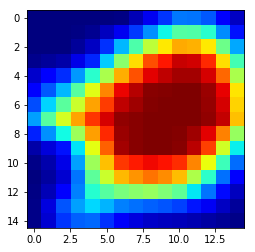

Displaying activation map 1


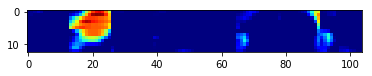

Displaying activation map 2


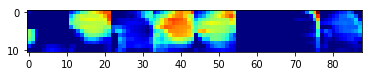

Displaying activation map 3


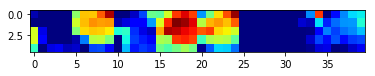

Displaying activation map 4


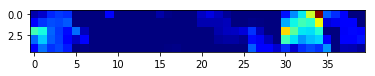

Displaying activation map 5


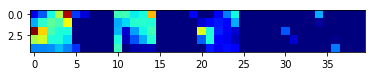

Displaying activation map 6


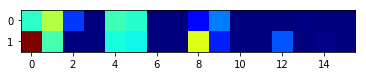

Displaying activation map 7


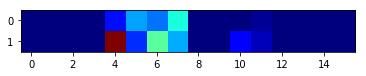

Displaying activation map 8


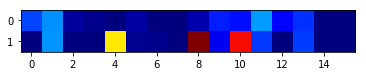

Displaying activation map 9


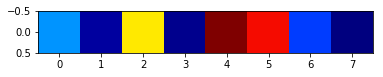

Displaying activation map 10


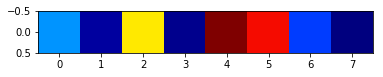

Displaying activation map 11


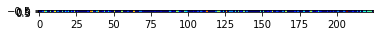

Displaying activation map 12


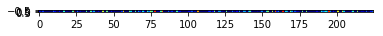

Displaying activation map 13


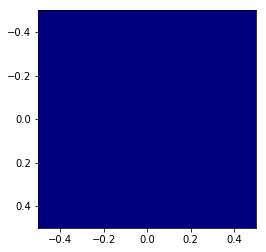

In [76]:
activ = get_activations(model, X_train[0:1])
display_activations(activ)

----- activations -----
[[[[  0.00000000e+00]
   [  0.00000000e+00]
   [  0.00000000e+00]
   [  0.00000000e+00]
   [  0.00000000e+00]
   [  0.00000000e+00]
   [  0.00000000e+00]
   [  0.00000000e+00]
   [  5.74875972e-04]
   [  9.77289211e-03]
   [  1.78211574e-02]
   [  2.08871625e-02]
   [  1.91625338e-02]
   [  6.89851213e-03]
   [  0.00000000e+00]]

  [[  0.00000000e+00]
   [  0.00000000e+00]
   [  0.00000000e+00]
   [  0.00000000e+00]
   [  0.00000000e+00]
   [  6.79398933e-03]
   [  1.51558220e-02]
   [  4.78192344e-02]
   [  8.24685767e-02]
   [  1.22605368e-01]
   [  1.56470791e-01]
   [  1.63160264e-01]
   [  1.50251687e-01]
   [  9.42274034e-02]
   [  4.80805412e-02]]

  [[  0.00000000e+00]
   [  0.00000000e+00]
   [  0.00000000e+00]
   [  0.00000000e+00]
   [  0.00000000e+00]
   [  2.26466320e-02]
   [  5.05194068e-02]
   [  1.59397438e-01]
   [  2.73066103e-01]
   [  3.77589017e-01]
   [  4.64865655e-01]
   [  4.77408409e-01]
   [  4.39867228e-01]
   [  2.92141527e-01]
   [

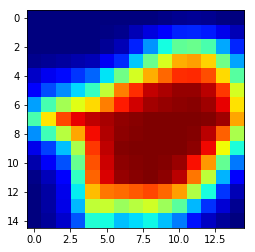

Displaying activation map 1


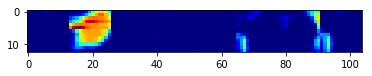

Displaying activation map 2


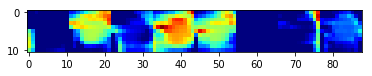

Displaying activation map 3


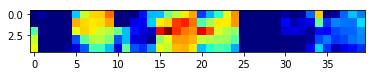

Displaying activation map 4


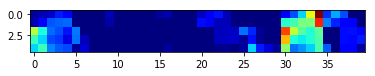

Displaying activation map 5


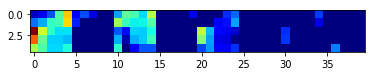

Displaying activation map 6


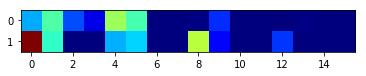

Displaying activation map 7


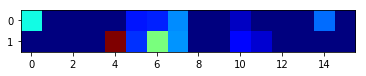

Displaying activation map 8


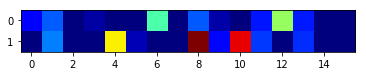

Displaying activation map 9


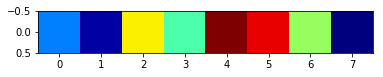

Displaying activation map 10


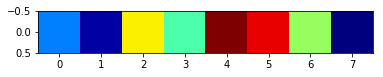

Displaying activation map 11


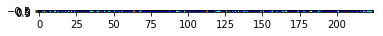

Displaying activation map 12


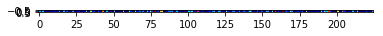

Displaying activation map 13


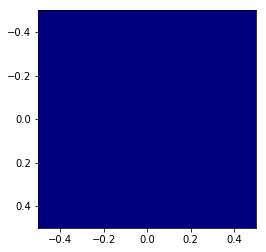

In [77]:
activ = get_activations(model, X_train[2:3])
display_activations(activ)

Displaying activation map 0


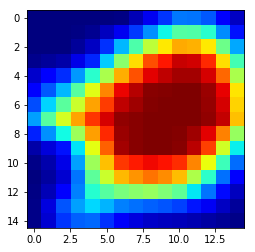

In [81]:
boi = get_activations2(model, 0, X_train[0:1])
display_activations(boi)

# Logistic Regression Visualizations

In [15]:
clf = LogisticRegression()
(acc, logloss, clfs) = runCrossValidation(clf, dpos, dneg)
(acc, logloss)

(0.96073985680190932, 0.11700017028771709)

In [22]:
import os
dataDir = os.path.join('pdf','mini_dataset_png_rot')
testFile = os.path.join(dataDir, '425175_page_34.png')

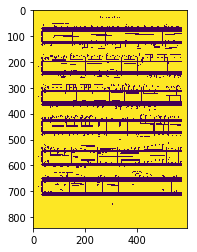

In [28]:
img = mpimg.imread(testFile)
plt.imshow(img)
#plt.show()

We'll take this file and do clf.predict() on it.

# Object Detection Strategy: Sliding Window

We'll take a 15x15 sliding window to run across the page of sheet music, and use our note detector to check each 15x15 piece and determine the probability that a note is at that particular location--this will generate a prediction matrix.

Credits for the code below to https://github.com/shreyas0906/Object-detection-with-deep-learning-and-sliding-window

In [37]:
model = getModel_convcommon2

In [38]:
(acc, logloss, models) = runCrossValidation_keras(model, dpos, dneg, nb_epoch=25, cnn=True)

Test fold score1
Train on 8100 samples, validate on 280 samples
Epoch 1/25
8100/8100 [==============================] - 1s - loss: 0.2914 - acc: 0.8963 - val_loss: 0.1765 - val_acc: 0.9607
Epoch 2/25
8100/8100 [==============================] - 1s - loss: 0.2179 - acc: 0.9206 - val_loss: 0.1407 - val_acc: 0.9607
Epoch 3/25
8100/8100 [==============================] - 1s - loss: 0.1971 - acc: 0.9260 - val_loss: 0.1437 - val_acc: 0.9643
Epoch 4/25
8100/8100 [==============================] - 1s - loss: 0.1797 - acc: 0.9349 - val_loss: 0.1103 - val_acc: 0.9643
Epoch 5/25
8100/8100 [==============================] - 1s - loss: 0.1629 - acc: 0.9433 - val_loss: 0.1573 - val_acc: 0.9536
Epoch 6/25
8100/8100 [==============================] - 2s - loss: 0.1477 - acc: 0.9485 - val_loss: 0.1216 - val_acc: 0.9571
Epoch 7/25
8100/8100 [==============================] - 2s - loss: 0.1413 - acc: 0.9540 - val_loss: 0.3039 - val_acc: 0.9000
Epoch 8/25
8100/8100 [==============================] - 2s - 

8044/8044 [==============================] - 2s - loss: 0.1466 - acc: 0.9521 - val_loss: 0.1207 - val_acc: 0.9554
Epoch 3/25
8044/8044 [==============================] - 1s - loss: 0.1242 - acc: 0.9586 - val_loss: 0.0906 - val_acc: 0.9673
Epoch 4/25
8044/8044 [==============================] - 2s - loss: 0.1149 - acc: 0.9630 - val_loss: 0.0902 - val_acc: 0.9732
Epoch 5/25
8044/8044 [==============================] - 2s - loss: 0.1083 - acc: 0.9669 - val_loss: 0.1090 - val_acc: 0.9702
Epoch 6/25
8044/8044 [==============================] - 2s - loss: 0.1034 - acc: 0.9667 - val_loss: 0.0742 - val_acc: 0.9821
Epoch 7/25
8044/8044 [==============================] - 2s - loss: 0.1002 - acc: 0.9683 - val_loss: 0.0873 - val_acc: 0.9732
Epoch 8/25
8044/8044 [==============================] - 2s - loss: 0.0937 - acc: 0.9699 - val_loss: 0.0674 - val_acc: 0.9792
Epoch 9/25
8044/8044 [==============================] - 2s - loss: 0.0919 - acc: 0.9709 - val_loss: 0.0956 - val_acc: 0.9762
Epoch 10/25

8274/8274 [==============================] - 2s - loss: 0.1552 - acc: 0.9436 - val_loss: 0.0627 - val_acc: 0.9811
Epoch 5/25
8274/8274 [==============================] - 2s - loss: 0.1383 - acc: 0.9526 - val_loss: 0.0709 - val_acc: 0.9906
Epoch 6/25
8274/8274 [==============================] - 2s - loss: 0.1266 - acc: 0.9573 - val_loss: 0.0522 - val_acc: 0.9906
Epoch 7/25
8274/8274 [==============================] - 2s - loss: 0.1247 - acc: 0.9575 - val_loss: 0.0442 - val_acc: 0.9906
Epoch 8/25
8274/8274 [==============================] - 2s - loss: 0.1192 - acc: 0.9608 - val_loss: 0.0454 - val_acc: 0.99060.972
Epoch 9/25
8274/8274 [==============================] - 2s - loss: 0.1161 - acc: 0.9629 - val_loss: 0.0442 - val_acc: 0.9906
Epoch 10/25
8274/8274 [==============================] - 2s - loss: 0.1136 - acc: 0.9639 - val_loss: 0.0420 - val_acc: 0.9906
Epoch 11/25
8274/8274 [==============================] - 1s - loss: 0.1119 - acc: 0.9654 - val_loss: 0.0385 - val_acc: 0.9906
Epoc

7962/7962 [==============================] - 1s - loss: 0.1044 - acc: 0.9656 - val_loss: 0.2239 - val_acc: 0.9067
Epoch 7/25
7962/7962 [==============================] - 1s - loss: 0.1017 - acc: 0.9675 - val_loss: 0.0852 - val_acc: 0.9785
Epoch 8/25
7962/7962 [==============================] - 1s - loss: 0.1003 - acc: 0.9676 - val_loss: 0.0994 - val_acc: 0.9665
Epoch 9/25
7962/7962 [==============================] - 1s - loss: 0.0987 - acc: 0.9663 - val_loss: 0.0797 - val_acc: 0.9880
Epoch 10/25
7962/7962 [==============================] - 1s - loss: 0.0991 - acc: 0.9677 - val_loss: 0.0772 - val_acc: 0.9880
Epoch 11/25
7962/7962 [==============================] - 1s - loss: 0.0939 - acc: 0.9704 - val_loss: 0.0838 - val_acc: 0.9737
Epoch 12/25
7962/7962 [==============================] - 1s - loss: 0.0925 - acc: 0.9707 - val_loss: 0.0781 - val_acc: 0.9856
Epoch 13/25
7962/7962 [==============================] - 1s - loss: 0.0933 - acc: 0.9695 - val_loss: 0.1855 - val_acc: 0.9139
Epoch 1

8210/8210 [==============================] - 2s - loss: 0.1116 - acc: 0.9659 - val_loss: 0.0228 - val_acc: 0.9941
Epoch 9/25
8210/8210 [==============================] - 1s - loss: 0.1129 - acc: 0.9652 - val_loss: 0.0272 - val_acc: 0.9941
Epoch 10/25
8210/8210 [==============================] - 1s - loss: 0.1049 - acc: 0.9678 - val_loss: 0.0260 - val_acc: 1.0000
Epoch 11/25
8210/8210 [==============================] - 2s - loss: 0.1091 - acc: 0.9663 - val_loss: 0.0134 - val_acc: 1.0000
Epoch 12/25
8210/8210 [==============================] - 2s - loss: 0.1060 - acc: 0.9682 - val_loss: 0.0195 - val_acc: 0.9941
Epoch 13/25
8210/8210 [==============================] - 2s - loss: 0.1036 - acc: 0.9693 - val_loss: 0.0279 - val_acc: 1.0000
Epoch 14/25
8210/8210 [==============================] - 2s - loss: 0.1020 - acc: 0.9681 - val_loss: 0.0125 - val_acc: 1.0000
Epoch 15/25
8210/8210 [==============================] - 2s - loss: 0.0976 - acc: 0.9717 - val_loss: 0.0099 - val_acc: 1.0000
Epoch

8044/8044 [==============================] - 2s - loss: 0.1042 - acc: 0.9661 - val_loss: 0.0880 - val_acc: 0.9732
Epoch 11/25
8044/8044 [==============================] - 2s - loss: 0.0984 - acc: 0.9687 - val_loss: 0.1291 - val_acc: 0.9583
Epoch 12/25
8044/8044 [==============================] - 2s - loss: 0.1011 - acc: 0.9681 - val_loss: 0.1165 - val_acc: 0.9583
Epoch 13/25
8044/8044 [==============================] - 2s - loss: 0.0985 - acc: 0.9659 - val_loss: 0.0919 - val_acc: 0.9762
Epoch 14/25
8044/8044 [==============================] - 1s - loss: 0.0983 - acc: 0.9672 - val_loss: 0.1105 - val_acc: 0.9613
Epoch 15/25
8044/8044 [==============================] - 1s - loss: 0.0990 - acc: 0.9682 - val_loss: 0.1169 - val_acc: 0.9673
Epoch 16/25
8044/8044 [==============================] - 1s - loss: 0.0967 - acc: 0.9704 - val_loss: 0.0799 - val_acc: 0.9792
Epoch 17/25
8044/8044 [==============================] - 2s - loss: 0.0963 - acc: 0.9695 - val_loss: 0.0909 - val_acc: 0.9732
Epoc

In [39]:
from keras.models import model_from_json
modelRevived = model_from_json(jsonNoteDetector)

In [47]:
model = getModel_convcommon2()
model.compile(optimizer='rmsprop',loss='binary_crossentropy',metrics=['accuracy'])

In [51]:
nb_epoch = 25

labels = np.array([]) # ground truth labels
preds = np.array([])  # predicted labels 
probs = np.array([]) # predicted probabilities
clfs = []

for score in sorted(dpos.keys()):
    (X_train, Y_train, X_test, Y_test) = getTrainTestSplit(dpos, dneg, score)
    X_train = np.expand_dims(X_train, axis=3)
    X_test = np.expand_dims(X_test, axis=3)
    model.fit(X_train, Y_train, nb_epoch=nb_epoch, validation_data=(X_test,Y_test))
    Y_pred = model.predict(X_test)
    labels = np.concatenate((labels, Y_test))
    probs = np.concatenate((probs, np.squeeze(Y_pred)))
    models.append(model)
    
acc = accuracy_score(labels, np.round(probs))
logloss = log_loss(labels, probs)

return (acc, logloss, models)

Train on 8100 samples, validate on 280 samples
Epoch 1/25
8100/8100 [==============================] - 1s - loss: 0.0947 - acc: 0.9704 - val_loss: 0.2194 - val_acc: 0.9321
Epoch 2/25
8100/8100 [==============================] - 1s - loss: 0.0913 - acc: 0.9723 - val_loss: 0.2671 - val_acc: 0.9000
Epoch 3/25
8100/8100 [==============================] - 2s - loss: 0.0909 - acc: 0.9716 - val_loss: 0.4238 - val_acc: 0.8464
Epoch 4/25
8100/8100 [==============================] - 1s - loss: 0.0913 - acc: 0.9719 - val_loss: 0.2533 - val_acc: 0.9000
Epoch 5/25
8100/8100 [==============================] - 1s - loss: 0.0912 - acc: 0.9725 - val_loss: 0.1142 - val_acc: 0.9714
Epoch 6/25
8100/8100 [==============================] - 1s - loss: 0.0894 - acc: 0.9719 - val_loss: 0.1912 - val_acc: 0.9357
Epoch 7/25
8100/8100 [==============================] - 1s - loss: 0.0893 - acc: 0.9704 - val_loss: 0.1573 - val_acc: 0.9500
Epoch 8/25
8100/8100 [==============================] - 2s - loss: 0.0877 - ac

8044/8044 [==============================] - 1s - loss: 0.0889 - acc: 0.9729 - val_loss: 0.1116 - val_acc: 0.9643
Epoch 5/25
8044/8044 [==============================] - 1s - loss: 0.0875 - acc: 0.9734 - val_loss: 0.1144 - val_acc: 0.9732
Epoch 6/25
8044/8044 [==============================] - 1s - loss: 0.0920 - acc: 0.9740 - val_loss: 0.0927 - val_acc: 0.9673
Epoch 7/25
8044/8044 [==============================] - 1s - loss: 0.0895 - acc: 0.9729 - val_loss: 0.1005 - val_acc: 0.9702
Epoch 8/25
8044/8044 [==============================] - 1s - loss: 0.0907 - acc: 0.9722 - val_loss: 0.0836 - val_acc: 0.9762
Epoch 9/25
8044/8044 [==============================] - 1s - loss: 0.0916 - acc: 0.9724 - val_loss: 0.0961 - val_acc: 0.9673
Epoch 10/25
8044/8044 [==============================] - 1s - loss: 0.0948 - acc: 0.9722 - val_loss: 0.0826 - val_acc: 0.9702
Epoch 11/25
8044/8044 [==============================] - 2s - loss: 0.0929 - acc: 0.9719 - val_loss: 0.2511 - val_acc: 0.9226
Epoch 12/

8274/8274 [==============================] - 1s - loss: 0.0999 - acc: 0.9714 - val_loss: 0.0085 - val_acc: 1.0000
Epoch 8/25
8274/8274 [==============================] - 2s - loss: 0.1145 - acc: 0.9704 - val_loss: 0.1823 - val_acc: 0.9340
Epoch 9/25
8274/8274 [==============================] - 2s - loss: 0.1132 - acc: 0.9689 - val_loss: 0.0023 - val_acc: 1.0000
Epoch 10/25
8274/8274 [==============================] - 2s - loss: 0.1083 - acc: 0.9706 - val_loss: 0.0064 - val_acc: 1.0000
Epoch 11/25
8274/8274 [==============================] - 1s - loss: 0.1208 - acc: 0.9720 - val_loss: 0.0063 - val_acc: 1.0000
Epoch 12/25
8274/8274 [==============================] - 2s - loss: 0.1168 - acc: 0.9709 - val_loss: 0.0083 - val_acc: 1.0000
Epoch 13/25
8274/8274 [==============================] - 2s - loss: 0.1209 - acc: 0.9724 - val_loss: 0.0042 - val_acc: 1.0000
Epoch 14/25
8274/8274 [==============================] - 1s - loss: 0.1279 - acc: 0.9676 - val_loss: 0.0154 - val_acc: 1.0000
Epoch 

7962/7962 [==============================] - 2s - loss: 0.1320 - acc: 0.9759 - val_loss: 0.0966 - val_acc: 0.9880
Epoch 11/25
7962/7962 [==============================] - 2s - loss: 0.1440 - acc: 0.9744 - val_loss: 0.0863 - val_acc: 0.9880
Epoch 12/25
7962/7962 [==============================] - 2s - loss: 0.1376 - acc: 0.9753 - val_loss: 0.0966 - val_acc: 0.9880
Epoch 13/25
7962/7962 [==============================] - 2s - loss: 0.1180 - acc: 0.9760 - val_loss: 0.1342 - val_acc: 0.9833
Epoch 14/25
7962/7962 [==============================] - 2s - loss: 0.1364 - acc: 0.9720 - val_loss: 0.0901 - val_acc: 0.9904
Epoch 15/25
7962/7962 [==============================] - 2s - loss: 0.1147 - acc: 0.9741 - val_loss: 0.0951 - val_acc: 0.9880
Epoch 16/25
7962/7962 [==============================] - 2s - loss: 0.1147 - acc: 0.9745 - val_loss: 0.0889 - val_acc: 0.9880
Epoch 17/25
7962/7962 [==============================] - 2s - loss: 0.1358 - acc: 0.9721 - val_loss: 0.1021 - val_acc: 0.9856
Epoc

8210/8210 [==============================] - 2s - loss: 0.2694 - acc: 0.9732 - val_loss: 0.0182 - val_acc: 0.9941
Epoch 14/25
8210/8210 [==============================] - 2s - loss: 0.1606 - acc: 0.9781 - val_loss: 0.0040 - val_acc: 1.0000
Epoch 15/25
8210/8210 [==============================] - 2s - loss: 0.1459 - acc: 0.9777 - val_loss: 0.0046 - val_acc: 1.0000
Epoch 16/25
8210/8210 [==============================] - 2s - loss: 0.1986 - acc: 0.9754 - val_loss: 0.0044 - val_acc: 1.0000
Epoch 17/25
8210/8210 [==============================] - 2s - loss: 0.1717 - acc: 0.9747 - val_loss: 0.0037 - val_acc: 1.0000
Epoch 18/25
8210/8210 [==============================] - 2s - loss: 0.3038 - acc: 0.9704 - val_loss: 0.0037 - val_acc: 1.0000
Epoch 19/25
8210/8210 [==============================] - 2s - loss: 0.1871 - acc: 0.9765 - val_loss: 0.0010 - val_acc: 1.0000
Epoch 20/25
8210/8210 [==============================] - 2s - loss: 0.1814 - acc: 0.9739 - val_loss: 5.0337e-05 - val_acc: 1.0000


8044/8044 [==============================] - 2s - loss: 0.1632 - acc: 0.9746 - val_loss: 0.2680 - val_acc: 0.9702
Epoch 17/25
8044/8044 [==============================] - 2s - loss: 0.1407 - acc: 0.9770 - val_loss: 0.2530 - val_acc: 0.9732
Epoch 18/25
8044/8044 [==============================] - 2s - loss: 0.1473 - acc: 0.9770 - val_loss: 0.2930 - val_acc: 0.9762
Epoch 19/25
8044/8044 [==============================] - 2s - loss: 0.1752 - acc: 0.9759 - val_loss: 0.1958 - val_acc: 0.9821
Epoch 20/25
8044/8044 [==============================] - 2s - loss: 0.2167 - acc: 0.9730 - val_loss: 0.2800 - val_acc: 0.9762
Epoch 21/25
8044/8044 [==============================] - 2s - loss: 0.1439 - acc: 0.9741 - val_loss: 0.1948 - val_acc: 0.9792
Epoch 22/25
8044/8044 [==============================] - 2s - loss: 0.1233 - acc: 0.9774 - val_loss: 0.1131 - val_acc: 0.9821
Epoch 23/25
8044/8044 [==============================] - 2s - loss: 0.1405 - acc: 0.9768 - val_loss: 0.3429 - val_acc: 0.9673
Epoc

SyntaxError: 'return' outside function (<ipython-input-51-081506d6e45f>, line 21)

In [52]:
model.save_weights('model.h5')

In [54]:
jsonNoteDetector = model.to_json()

import json
with open('jsonNoteDetect.json', 'w') as outfile:
    json.dump(jsonNoteDetector, outfile)
#jsonNoteDetector.save('jsonNoteDetect.json')

In [55]:
import time
import cv2
from keras.models import model_from_json # loading the model which was previously saved
import numpy as np
from skimage.measure import structural_similarity as ssim
import os

curr_dir = os.path.join('/home/dbashir/ttemp/Project', 'Summer 2018')
#curr_dir = os.path.join(curr_dir1, 'pdf')
# Storing the predicted values
TP =[]
TN =[]
FP =[]
FN =[]
scp = []
scn = []
true_positive = cv2.imread('true_piece.png', cv2.IMREAD_GRAYSCALE)
true_negative = cv2.imread('false_piece.png', cv2.IMREAD_GRAYSCALE)
tp = true_positive[:,:]/255
tn = true_negative[:,:]/255
#Test image to detect humans in the image
img = cv2.imread('test_img.png', cv2.IMREAD_GRAYSCALE)
resized = img[65:200, 250:631]/255 # Pre-processing the image and normalize
wind_row, wind_col = 45,45 # dimensions of the image
img_rows, img_cols = 45,45
#loading the model first so that it can be tested in future cases
json_file = open('jsonNoteDetect.json', 'r')
loaded_model_from_json = json_file.read()
json_file.close()
loaded_model = model_from_json(loaded_model_from_json)
loaded_model.load_weights("model.h5")
print("Model is loaded from disk")
loaded_model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

TypeError: string indices must be integers

In [75]:
#Comparing the similarity between the predicted image and actual image
def compare_images(imageA, imageB):
    return ssim(imageA, imageB, multichannel=True) #since images are not just 3D arrays

In [30]:
def sliding_window(image, stepSize, windowSize):
    for y in range(0, image.shape[0], stepSize):
        for x in range(0, image.shape[1], stepSize):
            yield (x, y, image[y:y + windowSize[1], x:x + windowSize[0]])

In [ ]:
# predicting the image
def load_model(window_image):
    return loaded_model.predict(window_image)

In [31]:
def show_window():
    for(x,y, window) in sliding_window(resized, 15, (wind_row,wind_col)):
        if window.shape[0] != wind_row or window.shape[1] != wind_col:
            continue
        clone = resized.copy()
        cv2.rectangle(clone, (x, y), (x + wind_row, y + wind_col), (0, 255, 0), 2)

        t_img = resized[y:y+wind_row,x:x+wind_col]# the image which has to be predicted

        test_img = np.expand_dims(np.expand_dims(t_img,axis =0), axis=0) # expanding the dimensions of the image to meet the dimensions of the trained model
        prediction = load_model(test_img) # predict the image
        classes = prediction[0]

        if classes[0] > 0.99999: #Applying threshold
            print("human detected with a probability: ",classes[0], '\t', "x: ",x,'\t',"y: ", y)
            S = compare_images(t_img, tp)
            scp.append(S)
            if S > 0.5:
                TP.append(1)
            else: FP.append(1)
        else:
            print("background with a probability: ", 1-classes[1], '\t', "x: ",x,'\t',"y: ", y)
            S = compare_images(t_img, tn)
            scn.append(S)
            if S > 0.5:
                TN.append(1)
            else: FN.append(1)

        cv2.imshow("sliding_window", resized[y:y+wind_row,x:x+wind_col])
        cv2.imshow("Window", clone)
        cv2.waitKey(1)
        time.sleep(0.25)

In [ ]:
def consfusion_matrix(TN,FN,TP,FP):
    print("The recall of the model: ", len(TP)/(len(TP)+len(FN)))
    print("The F1 score of the model", (2*len(TP))/(len(FP)+len(FN)+2*len(TP)))

In [ ]:
show_window()
consfusion_matrix(TN,FN,TP,FP)
print('\t',"TN=",len(TN),'\t',"FP=",len(FP))
print('\t',"FN=",len(FN),'\t',"TP=",len(TP))
cv2.waitKey(0)
cv2.destroyAllWindows()

In [56]:
def sliding_window(image, stepSize, windowSize):
    # slide a window across the image
    for y in xrange(0, image.shape[0], stepSize):
        for x in xrange(0, image.shape[1], stepSize):
            # yield the current window
            yield (x, y, image[y:y + windowSize[1], x:x + windowSize[0]])

Code immediately below from: https://medium.com/@muskulpesent/sliding-windows-for-object-detection-with-python-709250eb6161

In [20]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

# read the image and define the stepSize and window size 
# (width,height)
image = cv2.imread("true_piece.png") # your image path
tmp = image # for drawing a rectangle
stepSize = 4
(w_width, w_height) = (15, 15) # window size
# for x in range(0, image.shape[1] - w_width , stepSize):
#     for y in range(0, image.shape[0] - w_height, stepSize):
#         window = image[x:x + w_width, y:y + w_height, :]
      
#     # classify content of the window with your classifier and  
#     # determine if the window includes an object (cell) or not
#           # draw window on image
#         cv2.rectangle(tmp, (x, y), (x + w_width, y + w_height), (255, 0, 0), 2) # draw rectangle on image
#     plt.imshow(np.array(tmp).astype('uint8'))
# show all windows
plt.show()

In [13]:
def sliding_window(image, stepSize, windowSize):
    for y in range(0, image.shape[0], stepSize):
        for x in range(0, image.shape[1], stepSize):
            yield (x, y, image[y:y + windowSize[1], x:x + windowSize[0]])

In [16]:
#json_file = open('jsonNoteDetect.json', 'r')
#loaded_model_from_json = json_file.read()
#json_file.close()

#loaded_model = model_from_json(loaded_model_from_json)
loaded_model = getModel_convcommon2() #get architecture
loaded_model.load_weights("model.h5") #get weights

In [17]:
def load_model(window_image):
    return loaded_model.predict(window_image)

In [18]:
#displaying the image on which the sliding window is displayed
def show_window():
    for(x,y, window) in sliding_window(resized, 15, (wind_row,wind_col)):
        if window.shape[0] != wind_row or window.shape[1] != wind_col:
            continue
        clone = resized.copy()
        cv2.rectangle(clone, (x, y), (x + wind_row, y + wind_col), (0, 255, 0), 2)

        t_img = resized[y:y+wind_row,x:x+wind_col]# the image which has to be predicted

        test_img = np.expand_dims(np.expand_dims(t_img,axis =0), axis=0) # expanding the dimensions of the image to meet the dimensions of the trained model
        prediction = load_model(test_img) # predict the image
        classes = prediction[0]

        if classes[0] > 0.99999: #Applying threshold
            print("note detected with a probability: ",classes[0], '\t', "x: ",x,'\t',"y: ", y)
            S = compare_images(t_img, tp)
            scp.append(S)
            if S > 0.5:
                TP.append(1)
            else: FP.append(1)
        else:
            print("background with a probability: ", 1-classes[1], '\t', "x: ",x,'\t',"y: ", y)
            S = compare_images(t_img, tn)
            scn.append(S)
            if S > 0.5:
                TN.append(1)
            else: FN.append(1)

        cv2.imshow("sliding_window", resized[y:y+wind_row,x:x+wind_col])
        cv2.imshow("Window", clone)
        cv2.waitKey(1)
        time.sleep(0.25)

In [61]:
from PIL import Image

image = Image.open('true_piece.png').convert('LA') #convert to greyscale
image.save('true_piece_grey.png')
image = cv2.imread('true_piece_grey.png', cv2.IMREAD_GRAYSCALE) # your image path
print(image.shape)
(h,w) = image.shape
image = image.reshape(h,w,1)
print("new image shape is: ", image.shape)
tmp = image # for drawing a rectangle
stepSize = 4
(w_width, w_height) = (15, 15) # window size

#print(image.shape)

(842, 595)
('new image shape is: ', (842, 595, 1))


In [51]:
from skimage.measure import structural_similarity as ssim
def compare_images(imageA, imageB):
    return ssim(imageA, imageB)

In [83]:
image_check = cv2.imread('true_piece_grey.png', cv2.IMREAD_GRAYSCALE) # your image path
(h,w) = image_check.shape
image_check = image_check.reshape(h,w,1)
false_img = cv2.imread('test_img.png', cv2.IMREAD_GRAYSCALE)
(h,w) = false_img.shape
false_img = false_img.reshape(h,w,1)
print(false_img.shape)

(842, 595, 1)


In [84]:
#store predicted values:
# positive = []
# negative = []
scp = []
scn = []
TP = []
TN = []
FP = []
FN = []

#initialize prediction array
predictions = np.zeros((image.shape[1] - w_width, image.shape[0] - w_height))


for y in range(0, image.shape[0] - w_width , stepSize):
    for x in range(0, image.shape[1] - w_height, stepSize):
        window = image[y:y + w_width, x:x + w_height, :]
        #so that we have 4 dims, expand
        window = np.expand_dims(window, axis=0)

        
        prediction = load_model(window) # predict the image
        classes = prediction[0]
        classesWanted = classes[0]
        classesWanted = np.delete(classesWanted, 0) #now we actually have the number
        predictions[x][y] = classesWanted
        
        if classesWanted > 0.99999: #Applying threshold
            print("note detected with a probability: ",classesWanted, '\t', "x: ",x,'\t',"y: ", y)
            S = compare_images(image, image_check)
            scp.append(S)
            if S > 0.5:
                TP.append(1)
            else: FP.append(1)
                
        else:
            print("background with a probability: ", 1-classesWanted, '\t', "x: ",x,'\t',"y: ", y)
            S = compare_images(image, false_img)
            scn.append(S)
            if S > 0.5:
                TN.append(1)
            else: FN.append(1)
      
        # classify content of the window with your classifier and  
        # determine if the window includes an object (cell) or not
        # draw window on image
        #cv2.rectangle(tmp, (x, y), (x + w_width, y + w_height), (255, 0, 0), 2) # draw rectangle on image
#plt.imshow(np.array(tmp).astype('uint8'))
# show all windows
#plt.show()

('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 8)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 20)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 36)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 52)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 56)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 60)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 64)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 68)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 72)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 84)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 100)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 116)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 124)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 128)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 132)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 148)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 164)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 168)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 172)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 180)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 196)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 208)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 212)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 228)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 244)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 260)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 276)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 280)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 288)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 300)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 312)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 324)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 336)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 348)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 356)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 360)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 372)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 384)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 388)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 392)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 396)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 408)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 420)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 432)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 444)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 456)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 468)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 472)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 480)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 492)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 504)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 508)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 512)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 516)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 528)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 540)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 552)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 564)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 0, '\t', 'y: ', 576)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 8)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 20)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 32)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 44)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 56)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 60)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 64)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 68)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 72)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 80)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 92)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 104)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 116)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 124)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 128)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 140)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 152)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 164)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 168)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 172)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 176)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 188)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 200)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 208)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 212)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 224)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 236)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 248)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 260)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 272)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 276)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 280)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 284)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 296)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 308)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 320)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 332)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 336)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 344)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 356)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 360)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 368)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 380)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 388)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 392)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 404)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 416)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 428)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 440)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 452)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 464)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 472)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 476)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 488)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 500)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 508)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 512)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 516)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 524)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 536)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 548)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 560)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 572)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 4, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 4)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 16)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 28)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 40)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 52)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 56)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 60)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 64)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 72)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 76)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 88)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 100)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 112)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 124)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 128)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 136)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 148)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 160)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 168)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 172)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 184)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 196)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 208)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 212)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 220)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 236)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 252)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 264)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 268)
('background with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 276)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 280)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 288)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 292)
('background with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 296)
('background with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 300)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 312)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 320)
('background with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 324)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 328)
('background with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 332)
('background with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 336)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 344)
('background with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 348)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 356)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 360)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 372)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 384)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 388)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 392)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 396)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 408)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 420)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 432)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 444)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 456)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 468)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 472)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 480)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 492)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 504)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 508)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 512)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 516)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 528)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 540)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 552)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 564)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 8, '\t', 'y: ', 576)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 8)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 20)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 32)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 44)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 56)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 60)
('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 64)
('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 68)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 72)
('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 80)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 92)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 104)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 116)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 124)
('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 128)
('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 132)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 148)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 160)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 168)
('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 172)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 184)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 196)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 208)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 212)
('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 220)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 232)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 244)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 256)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 264)
('background with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 268)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 272)
('background with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 276)
('background with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 280)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 0.42377394437789917, '\t', 'x: ', 12, '\t', 'y: ', 284)
('background with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 288)
('background with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 292)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 296)
('background with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 300)
('background with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 304)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 308)
('background with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 312)
('background with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 316)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 320)
('background with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 324)
('background with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 328)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 332)
('background with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 336)
('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 340)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 344)
('background with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 348)
('background with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 352)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 356)
('background with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 360)
('background with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 364)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 376)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 388)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 392)
('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 400)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 412)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 424)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 436)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 448)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 460)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 472)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 484)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 496)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 508)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 512)
('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 516)
('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 520)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 532)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 544)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 556)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 568)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 12, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 0)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 12)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 24)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 36)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 48)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 56)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 60)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 64)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 72)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 84)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 96)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 108)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 120)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 124)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 128)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 132)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 144)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 156)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 168)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 172)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 180)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 192)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 204)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 208)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 212)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 216)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 228)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 240)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 252)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 264)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 268)
('background with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 272)
('background with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 276)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 280)
('background with a probability: ', 0.71374955773353577, '\t', 'x: ', 16, '\t', 'y: ', 284)
('background with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 288)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 292)
('background with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 296)
('background with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 300)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 304)
('background with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 308)
('background with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 312)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 324)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 332)
('background with a probability: ', 0.71374955773353577, '\t', 'x: ', 16, '\t', 'y: ', 336)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 340)
('background with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 344)
('background with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 348)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 352)
('background with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 356)
('background with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 360)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 372)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 384)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 388)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 392)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 396)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 408)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 420)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 432)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 444)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 456)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 468)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 472)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 480)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 492)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 504)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 508)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 512)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 516)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 528)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 540)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 552)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 564)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 16, '\t', 'y: ', 576)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 8)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 20)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 32)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 44)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 56)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 60)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 64)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 68)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 72)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 80)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 92)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 104)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 116)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 124)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 128)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 140)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 152)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 164)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 168)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 172)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 176)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 188)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 200)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 208)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 212)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 224)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 236)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 248)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 260)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 268)
('background with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 272)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 276)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 280)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 284)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 288)
('background with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 292)
('background with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 296)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 308)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 320)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 332)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 336)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 344)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 348)
('background with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 352)
('background with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 356)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 360)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 368)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 380)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 388)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 392)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 404)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 416)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 428)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 440)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 452)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 464)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 472)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 476)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 488)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 500)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 508)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 512)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 516)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 524)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 536)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 548)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 560)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 572)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 20, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 4)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 16)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 28)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 40)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 52)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 56)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 60)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 64)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 72)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 76)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 88)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 100)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 112)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 124)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 128)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 136)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 148)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 160)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 168)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 172)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 184)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 196)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 208)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 212)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 220)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 232)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 244)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 256)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 268)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 276)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 280)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 292)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 304)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 316)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 328)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 336)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 340)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 352)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 356)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 360)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 364)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 376)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 388)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 392)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 400)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 412)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 424)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 436)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 448)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 460)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 472)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 484)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 496)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 508)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 512)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 516)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 520)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 532)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 544)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 556)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 568)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 24, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 0)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 12)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 24)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 36)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 48)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 56)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 60)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 64)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 72)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 84)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 96)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 108)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 120)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 124)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 128)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 132)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 144)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 156)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 168)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 172)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 180)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 192)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 204)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 208)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 212)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 216)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 228)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 240)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 252)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 264)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 276)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 280)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 288)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 300)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 312)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 324)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 336)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 348)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 356)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 360)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 372)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 384)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 388)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 392)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 396)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 408)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 420)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 432)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 444)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 456)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 468)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 472)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 480)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 492)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 504)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 508)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 512)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 516)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 528)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 540)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 552)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 564)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 28, '\t', 'y: ', 576)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 8)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 20)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 32)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 44)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 56)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 60)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 64)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 68)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 72)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 80)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 92)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 104)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 116)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 124)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 128)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 140)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 152)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 164)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 168)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 172)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 176)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 188)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 200)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 208)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 212)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 224)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 236)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 248)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 260)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 272)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 276)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 280)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 284)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 296)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 308)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 320)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 332)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 336)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 344)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 356)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 360)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 368)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 380)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 388)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 392)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 404)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 416)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 428)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 440)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 452)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 464)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 472)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 476)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 488)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 500)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 508)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 512)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 516)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 524)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 536)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 548)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 560)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 572)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 32, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 4)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 16)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 28)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 40)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 52)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 56)
('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 60)
('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 64)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 72)
('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 76)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 88)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 100)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 104)
('background with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 108)
('background with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 112)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 116)
('background with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 120)
('background with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 124)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 128)
('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 136)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 148)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 152)
('background with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 156)
('background with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 160)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 168)
('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 172)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 184)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 196)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 208)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 212)
('background with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 216)
('background with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 220)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 224)
('background with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 228)
('background with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 232)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 236)
('background with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 240)
('background with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 244)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 256)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 268)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 276)
('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 280)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 292)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 304)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 316)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 328)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 336)
('background with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 340)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 344)
('background with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 348)
('background with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 352)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 356)
('background with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 360)
('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 364)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 376)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 388)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 392)
('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 400)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 412)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 424)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 436)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 448)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 452)
('background with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 456)
('background with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 460)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 464)
('background with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 468)
('background with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 472)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 476)
('background with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 480)
('background with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 484)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 496)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 508)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 512)
('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 516)
('background with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 520)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 532)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 544)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 556)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 568)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 36, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 0)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 12)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 24)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 36)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 48)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 56)
('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 60)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 64)
('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 72)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 84)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 96)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 104)
('background with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 108)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 112)
('background with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 116)
('background with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 120)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 124)
('background with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 128)
('background with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 132)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 144)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 152)
('background with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 156)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 164)
('background with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 168)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 172)
('background with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 180)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 192)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 196)
('background with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 204)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 208)
('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 212)
('background with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 216)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 220)
('background with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 224)
('background with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 228)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 232)
('background with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 236)
('background with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 240)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 244)
('background with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 248)
('background with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 252)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 256)
('background with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 264)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 276)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 280)
('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 284)
('background with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 288)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 292)
('background with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 300)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 312)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 324)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 336)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 340)
('background with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 344)
('background with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 348)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 352)
('background with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 356)
('background with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 360)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 364)
('background with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 368)
('background with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 372)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 384)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 388)
('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 392)
('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 396)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 400)
('background with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 404)
('background with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 408)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 412)
('background with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 420)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 432)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 444)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 452)
('background with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 456)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 460)
('background with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 464)
('background with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 468)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 472)
('background with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 476)
('background with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 480)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 484)
('background with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 488)
('background with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 492)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 496)
('background with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 504)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 508)
('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 512)
('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 516)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 520)
('background with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 524)
('background with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 528)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 532)
('background with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 540)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 552)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 564)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 40, '\t', 'y: ', 576)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 8)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 20)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 32)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 44)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 56)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 60)
('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 64)
('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 68)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 72)
('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 80)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 92)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 104)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 116)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 124)
('background with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 128)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 132)
('background with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 140)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 152)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 164)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 168)
('background with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 172)
('background with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 176)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 188)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 200)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 208)
('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 212)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 224)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 236)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 244)
('background with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 248)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 252)
('background with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 256)
('background with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 260)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 272)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 276)
('background with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 280)
('background with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 284)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 288)
('background with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 292)
('background with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 296)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 308)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 320)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 332)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 336)
('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 344)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 356)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 360)
('background with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 364)
('background with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 368)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 380)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 388)
('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 392)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 396)
('background with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 400)
('background with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 404)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 408)
('background with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 412)
('background with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 416)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 428)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 440)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 452)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 464)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 472)
('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 476)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 480)
('background with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 484)
('background with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 488)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 492)
('background with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 496)
('background with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 500)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 508)
('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 512)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 516)
('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 524)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 528)
('background with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 532)
('background with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 536)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 548)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 560)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 572)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 44, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 4)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 16)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 28)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 40)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 52)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 56)
('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 60)
('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 64)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 0.71374955773353577, '\t', 'x: ', 48, '\t', 'y: ', 68)
('background with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 72)
('background with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 76)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 88)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 92)
('note detected with a probability: ', 0.99999893, '\t', 'x: ', 48, '\t', 'y: ', 96)
('background with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 100)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 112)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 124)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 128)
('background with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 132)
('background with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 136)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 148)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 160)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 168)
('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 172)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 176)
('background with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 184)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 192)
('background with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 196)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 208)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 212)
('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 216)
('background with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 220)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 232)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 244)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 252)
('background with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 256)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 260)
('background with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 268)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 276)
('background with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 280)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 292)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 296)
('background with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 304)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 316)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 328)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 332)
('background with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 336)
('background with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 340)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 352)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 356)
('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 360)
('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 364)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 368)
('background with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 376)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 388)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 392)
('background with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 400)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 412)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 416)
('background with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 424)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 436)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 448)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 456)
('background with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 460)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 472)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 484)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 492)
('background with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 496)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 508)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 512)
('background with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 516)
('background with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 520)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 532)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 536)
('background with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 544)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 556)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 568)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 48, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 0)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 12)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 24)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 36)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 48)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 56)
('note detected with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 60)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 64)
('note detected with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 68)
('background with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 72)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 80)
('background with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 84)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 88)
('background with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 92)
('background with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 96)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 108)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 112)
('background with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 116)
('background with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 120)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 124)
('background with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 128)
('background with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 132)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 144)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 148)
('background with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 152)
('background with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 156)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 168)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 172)
('background with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 176)
('background with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 180)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 184)
('background with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 188)
('background with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 192)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 196)
('background with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 200)
('background with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 204)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 208)
('note detected with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 212)
('note detected with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 216)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 220)
('background with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 228)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 232)
('background with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 236)
('background with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 240)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 244)
('background with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 248)
('background with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 252)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 256)
('background with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 260)
('background with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 264)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 268)
('background with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 272)
('background with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 276)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 280)
('note detected with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 288)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 292)
('background with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 296)
('background with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 300)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 308)
('background with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 312)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 320)
('background with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 324)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 332)
('background with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 336)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 348)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 352)
('background with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 356)
('background with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 360)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 364)
('background with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 368)
('background with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 372)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 380)
('background with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 384)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 388)
('background with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 392)
('background with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 396)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 404)
('background with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 408)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 412)
('background with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 416)
('background with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 420)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 428)
('background with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 432)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 436)
('background with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 440)
('background with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 444)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 0.71374955773353577, '\t', 'x: ', 52, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 452)
('background with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 456)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 460)
('background with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 468)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 472)
('background with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 476)
('background with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 480)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 484)
('background with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 488)
('background with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 492)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 504)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 508)
('background with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 512)
('background with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 516)
('background with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 524)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 528)
('background with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 532)
('background with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 536)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 548)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 556)
('background with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 560)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 572)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 52, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 4)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 16)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 28)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 40)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 52)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 56)
('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 64)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 68)
('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 72)
('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 76)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 80)
('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 84)
('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 88)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 92)
('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 96)
('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 100)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 108)
('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 112)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 116)
('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 120)
('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 124)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 128)
('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 132)
('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 136)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 144)
('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 148)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 152)
('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 160)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 168)
('note detected with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 172)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 180)
('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 184)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 188)
('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 192)
('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 196)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 208)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 212)
('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 220)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 232)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 236)
('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 240)
('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 244)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 248)
('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 252)
('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 256)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 260)
('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 268)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 276)
('note detected with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 280)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 292)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 296)
('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 300)
('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 304)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 308)
('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 312)
('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 316)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 320)
('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 324)
('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 328)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 336)
('note detected with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 340)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 348)
('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 352)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 356)
('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 360)
('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 364)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 368)
('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 372)
('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 376)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 380)
('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 384)
('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 388)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 392)
('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 400)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 404)
('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 408)
('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 412)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 420)
('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 424)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 428)
('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 432)
('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 436)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 440)
('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 448)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 452)
('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 456)
('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 460)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 468)
('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 472)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 476)
('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 480)
('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 484)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 492)
('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 496)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 508)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 512)
('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 516)
('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 520)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 528)
('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 532)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 540)
('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 544)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 548)
('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 552)
('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 556)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 560)
('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 564)
('background with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 568)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 56, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 0)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 12)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 24)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 36)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 48)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 52)
('background with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 56)
('background with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 60)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 68)
('background with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 72)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 76)
('background with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 80)
('background with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 84)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 92)
('background with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 96)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 108)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 120)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 124)
('background with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 128)
('background with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 132)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 144)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 148)
('background with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 156)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 168)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 172)
('background with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 180)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 184)
('background with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 188)
('background with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 192)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 204)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 208)
('background with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 212)
('background with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 216)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 228)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 240)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 252)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 264)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 268)
('background with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 272)
('background with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 276)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 280)
('note detected with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 284)
('background with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 288)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 292)
('background with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 296)
('background with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 300)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 304)
('background with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 308)
('background with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 312)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 316)
('background with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 320)
('background with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 324)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 328)
('background with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 336)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 348)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 356)
('note detected with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 360)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 364)
('background with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 368)
('background with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 372)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 376)
('background with a probability: ', 0.71374955773353577, '\t', 'x: ', 60, '\t', 'y: ', 380)
('background with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 384)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 388)
('background with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 392)
('background with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 396)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 400)
('background with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 404)
('background with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 408)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 412)
('background with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 420)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 424)
('background with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 428)
('background with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 432)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 436)
('background with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 440)
('background with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 444)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 452)
('background with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 456)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 468)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 472)
('note detected with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 480)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 492)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 496)
('background with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 504)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 508)
('background with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 512)
('background with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 516)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 524)
('background with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 528)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 532)
('background with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 536)
('background with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 540)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 544)
('background with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 548)
('background with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 552)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 556)
('background with a probability: ', 0.71374955773353577, '\t', 'x: ', 60, '\t', 'y: ', 560)
('background with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 564)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 60, '\t', 'y: ', 576)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 8)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 20)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 32)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 44)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 52)
('background with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 56)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 68)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 72)
('background with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 80)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 84)
('background with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 92)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 96)
('background with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 100)
('background with a probability: ', 0.71374955773353577, '\t', 'x: ', 64, '\t', 'y: ', 104)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 116)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 124)
('background with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 128)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 132)
('background with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 140)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 144)
('background with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 148)
('background with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 152)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 160)
('background with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 164)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 168)
('background with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 172)
('background with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 176)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 180)
('background with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 184)
('background with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 188)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 192)
('background with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 196)
('background with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 200)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 208)
('background with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 212)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 216)
('background with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 220)
('background with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 224)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 236)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 248)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 252)
('background with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 256)
('background with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 260)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 268)
('background with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 272)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 276)
('note detected with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 280)
('background with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 284)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 288)
('background with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 292)
('background with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 296)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 300)
('background with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 304)
('background with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 308)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 312)
('background with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 316)
('background with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 320)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 324)
('background with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 328)
('background with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 332)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 336)
('background with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 344)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 356)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 360)
('note detected with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 364)
('background with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 368)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 376)
('background with a probability: ', 0.71374955773353577, '\t', 'x: ', 64, '\t', 'y: ', 380)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 384)
('background with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 388)
('background with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 392)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 400)
('background with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 404)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 408)
('background with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 412)
('background with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 416)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 420)
('background with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 424)
('background with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 428)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 432)
('background with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 436)
('background with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 440)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 452)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 456)
('background with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 460)
('background with a probability: ', 0.71374955773353577, '\t', 'x: ', 64, '\t', 'y: ', 464)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 472)
('note detected with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 476)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 488)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 492)
('background with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 496)
('background with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 500)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 508)
('background with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 512)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 516)
('background with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 520)
('background with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 524)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 528)
('background with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 532)
('background with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 536)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 540)
('background with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 544)
('background with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 548)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 552)
('background with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 556)
('background with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 560)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 572)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 64, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 4)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 16)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 28)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 40)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 52)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 56)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 64)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 68)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 72)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 76)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 80)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 84)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 88)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 92)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 96)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 100)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 104)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 108)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 112)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 116)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 120)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 124)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 128)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 132)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 136)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 140)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 144)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 148)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 152)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 156)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 160)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 164)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 168)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 172)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 176)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 180)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 184)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 188)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 192)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 196)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 200)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 204)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 208)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 212)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 216)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 220)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 224)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 228)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 232)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 236)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 240)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 244)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 248)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 252)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 256)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 260)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 264)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 268)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 272)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 276)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 280)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 284)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 288)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 292)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 296)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 300)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 304)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 308)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 312)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 316)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 320)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 324)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 328)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 332)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 336)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 340)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 344)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 348)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 352)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 356)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 360)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 364)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 368)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 372)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 376)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 380)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 384)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 388)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 392)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 396)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 400)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 404)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 408)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 412)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 416)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 420)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 424)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 428)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 432)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 436)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 440)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 444)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 448)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 452)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 456)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 460)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 464)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 468)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 472)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 476)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 480)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 484)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 488)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 492)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 496)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 500)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 504)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 508)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 512)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 516)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 520)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 524)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 528)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 532)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 536)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 540)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 544)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 548)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 552)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 556)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 560)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 564)
('background with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 568)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 68, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 0)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 12)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 24)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 36)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 48)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 52)
('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 56)
('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 60)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 72)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 80)
('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 84)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 88)
('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 92)
('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 96)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 100)
('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 104)
('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 108)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 112)
('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 116)
('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 120)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 124)
('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 128)
('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 132)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 136)
('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 140)
('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 144)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 148)
('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 152)
('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 156)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 160)
('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 168)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 172)
('note detected with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 176)
('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 180)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 184)
('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 192)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 200)
('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 204)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 208)
('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 212)
('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 216)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 220)
('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 224)
('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 228)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 232)
('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 236)
('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 240)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 244)
('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 248)
('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 252)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 256)
('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 260)
('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 264)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 268)
('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 272)
('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 276)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 280)
('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 284)
('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 288)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 296)
('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 300)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 304)
('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 312)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 320)
('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 324)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 328)
('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 332)
('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 336)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 340)
('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 344)
('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 348)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 352)
('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 356)
('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 360)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 364)
('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 368)
('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 372)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 376)
('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 380)
('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 384)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 388)
('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 392)
('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 396)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 400)
('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 408)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 412)
('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 416)
('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 420)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 424)
('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 432)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 440)
('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 444)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 448)
('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 452)
('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 456)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 460)
('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 464)
('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 468)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 472)
('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 476)
('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 480)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 484)
('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 488)
('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 492)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 496)
('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 500)
('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 504)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 508)
('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 512)
('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 516)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 520)
('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 524)
('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 528)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 532)
('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 536)
('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 540)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 544)
('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 552)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 556)
('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 560)
('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 564)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 72, '\t', 'y: ', 576)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 8)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 20)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 32)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 44)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 52)
('background with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 56)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 68)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 72)
('background with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 80)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 92)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 104)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 116)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 124)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 128)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 140)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 152)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 164)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 168)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 172)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 176)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 188)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 200)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 208)
('background with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 212)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 224)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 236)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 248)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 260)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 272)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 276)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 280)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 284)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 296)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 308)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 320)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 332)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 336)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 344)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 356)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 360)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 368)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 380)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 388)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 392)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 404)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 416)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 428)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 440)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 452)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 464)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 472)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 476)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 488)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 500)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 508)
('background with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 512)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 516)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 524)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 536)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 548)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 560)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 572)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 76, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 4)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 16)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 28)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 40)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 52)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 56)
('background with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 64)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 68)
('background with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 72)
('background with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 76)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 88)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 100)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 112)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 116)
('background with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 120)
('background with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 124)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 128)
('background with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 132)
('background with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 136)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 148)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 152)
('background with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 156)
('background with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 160)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 164)
('background with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 168)
('background with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 172)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 176)
('background with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 184)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 196)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 208)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 212)
('background with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 220)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 232)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 236)
('background with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 240)
('background with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 244)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 248)
('background with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 252)
('background with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 256)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 268)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 276)
('background with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 280)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 284)
('background with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 288)
('background with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 292)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 304)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 316)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 328)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 336)
('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 340)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 344)
('background with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 348)
('background with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 352)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 356)
('background with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 360)
('background with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 364)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 368)
('background with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 372)
('background with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 376)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 388)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 392)
('background with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 396)
('background with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 400)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 404)
('background with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 408)
('background with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 412)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 416)
('background with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 424)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 436)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 448)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 460)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 472)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 484)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 492)
('background with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 496)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 500)
('background with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 504)
('background with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 508)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 512)
('background with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 516)
('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 520)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 532)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 544)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 556)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 568)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 80, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 0)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 12)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 24)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 36)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 48)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 56)
('background with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 60)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 72)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 84)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 92)
('background with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 96)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 100)
('background with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 104)
('background with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 108)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 112)
('background with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 120)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 124)
('background with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 128)
('background with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 132)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 140)
('background with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 144)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 148)
('background with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 152)
('background with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 156)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 160)
('background with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 164)
('background with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 168)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 172)
('background with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 180)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 192)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 204)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 208)
('background with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 212)
('background with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 216)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 220)
('background with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 224)
('background with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 228)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 232)
('background with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 236)
('background with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 240)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 244)
('background with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 248)
('background with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 252)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 260)
('background with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 264)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 268)
('background with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 272)
('background with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 276)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 280)
('background with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 284)
('background with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 288)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 292)
('background with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 296)
('background with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 300)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 312)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 324)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 332)
('background with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 336)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 340)
('background with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 344)
('background with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 348)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 352)
('background with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 356)
('background with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 360)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 364)
('background with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 368)
('background with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 372)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 376)
('background with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 384)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 388)
('background with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 392)
('background with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 396)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 400)
('background with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 404)
('background with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 408)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 412)
('background with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 420)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 432)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 444)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 456)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 460)
('background with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 464)
('background with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 468)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 472)
('background with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 476)
('background with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 480)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 484)
('background with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 488)
('background with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 492)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 496)
('background with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 500)
('background with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 504)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 508)
('background with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 512)
('background with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 516)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 520)
('background with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 524)
('background with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 528)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 532)
('background with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 536)
('background with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 540)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 552)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 564)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 84, '\t', 'y: ', 576)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 8)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 20)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 32)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 44)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 56)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 68)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 72)
('note detected with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 80)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 92)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 96)
('background with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 100)
('background with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 104)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 108)
('background with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 112)
('background with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 116)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 124)
('background with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 128)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 132)
('background with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 136)
('background with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 140)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 144)
('background with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 148)
('background with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 152)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 156)
('background with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 164)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 168)
('background with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 172)
('background with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 176)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 188)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 200)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 208)
('background with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 212)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 216)
('background with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 220)
('background with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 224)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 228)
('background with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 232)
('background with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 236)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 244)
('background with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 248)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 252)
('background with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 256)
('background with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 260)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 264)
('background with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 268)
('background with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 272)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 276)
('note detected with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 280)
('background with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 284)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 288)
('background with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 292)
('background with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 296)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 308)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 320)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 332)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 336)
('background with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 340)
('background with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 344)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 348)
('background with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 356)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 360)
('note detected with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 364)
('background with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 368)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 372)
('background with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 376)
('background with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 380)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 388)
('background with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 392)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 404)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 408)
('background with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 412)
('background with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 416)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 428)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 440)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 452)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 456)
('background with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 460)
('background with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 464)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 468)
('background with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 472)
('background with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 476)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 480)
('background with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 484)
('background with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 488)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 492)
('background with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 496)
('background with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 500)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 504)
('background with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 508)
('background with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 512)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 516)
('background with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 520)
('background with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 524)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 528)
('background with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 532)
('background with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 536)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 548)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 560)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 572)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 88, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 4)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 16)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 28)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 40)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 52)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 56)
('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 64)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 72)
('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 76)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 88)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 100)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 112)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 124)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 128)
('background with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 132)
('background with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 136)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 140)
('background with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 144)
('background with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 148)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 160)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 168)
('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 172)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 184)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 196)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 208)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 212)
('background with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 220)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 232)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 244)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 252)
('background with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 256)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 260)
('background with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 264)
('background with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 268)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 276)
('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 280)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 284)
('background with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 292)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 304)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 316)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 328)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 336)
('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 340)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 352)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 356)
('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 360)
('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 364)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 372)
('background with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 376)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 380)
('background with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 388)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 392)
('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 400)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 412)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 424)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 436)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 448)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 460)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 472)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 484)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 496)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 500)
('background with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 504)
('background with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 508)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 512)
('background with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 516)
('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 520)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 532)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 544)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 556)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 568)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 92, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 0)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 12)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 24)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 36)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 48)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 56)
('background with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 60)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 72)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 84)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 96)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 108)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 120)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 124)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 128)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 132)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 144)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 156)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 168)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 172)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 180)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 192)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 204)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 208)
('background with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 212)
('background with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 216)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 228)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 240)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 252)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 264)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 276)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 280)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 288)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 300)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 312)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 324)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 336)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 348)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 356)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 360)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 372)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 384)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 388)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 392)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 396)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 408)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 420)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 432)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 444)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 456)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 468)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 472)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 480)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 492)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 504)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 508)
('background with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 512)
('background with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 516)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 528)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 540)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 552)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 564)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 96, '\t', 'y: ', 576)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 8)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 20)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 32)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 44)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 56)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 68)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 72)
('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 80)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 92)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 104)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 108)
('background with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 112)
('background with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 116)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 124)
('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 128)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 140)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 152)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 164)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 168)
('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 172)
('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 176)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 188)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 200)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 208)
('background with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 212)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 216)
('background with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 220)
('background with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 224)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 228)
('background with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 232)
('background with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 236)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 248)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 260)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 272)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 276)
('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 280)
('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 284)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 296)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 308)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 320)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 324)
('background with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 328)
('background with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 332)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 336)
('background with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 340)
('background with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 344)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 348)
('background with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 356)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 360)
('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 368)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 380)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 388)
('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 392)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 404)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 416)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 428)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 440)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 452)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 456)
('background with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 460)
('background with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 464)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 468)
('background with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 472)
('background with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 476)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 488)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 500)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 508)
('background with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 512)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 516)
('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 524)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 536)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 548)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 564)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 100, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 0)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 12)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 28)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 40)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 56)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('background with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 72)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 84)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 100)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 104)
('background with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 108)
('background with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 112)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 116)
('background with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 120)
('background with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 124)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 128)
('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 136)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 148)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 152)
('background with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 156)
('background with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 160)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 168)
('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 172)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 184)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 196)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 200)
('background with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 204)
('background with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 208)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 212)
('background with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 216)
('background with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 220)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 224)
('background with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 228)
('background with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 232)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 236)
('background with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 240)
('background with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 244)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 248)
('background with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 256)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 268)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 276)
('background with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 280)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 292)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 304)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 316)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 320)
('background with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 324)
('background with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 328)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 336)
('background with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 340)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 344)
('background with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 348)
('background with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 352)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 356)
('background with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 360)
('background with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 364)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 376)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 388)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 392)
('background with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 396)
('background with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 400)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 412)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 424)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 436)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 440)
('background with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 444)
('background with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 448)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 452)
('background with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 456)
('background with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 460)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 464)
('background with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 468)
('background with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 472)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 476)
('background with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 480)
('background with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 484)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 488)
('background with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 496)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 508)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 512)
('background with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 516)
('background with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 520)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 532)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 544)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 556)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 560)
('background with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 564)
('background with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 568)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 104, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 0)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 12)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 24)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 36)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 48)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 56)
('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 60)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 68)
('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 72)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 76)
('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 80)
('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 84)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 96)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 100)
('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 104)
('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 108)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 112)
('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 116)
('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 120)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 124)
('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 128)
('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 132)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 136)
('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 140)
('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 144)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 148)
('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 152)
('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 156)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 160)
('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 164)
('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 168)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 172)
('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 176)
('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 180)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 184)
('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 188)
('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 192)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 196)
('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 200)
('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 204)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 208)
('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 212)
('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 216)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 220)
('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 224)
('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 228)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 232)
('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 236)
('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 240)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 244)
('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 248)
('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 252)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 256)
('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 260)
('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 264)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 268)
('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 272)
('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 276)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 280)
('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 284)
('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 288)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 292)
('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 296)
('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 300)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 304)
('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 308)
('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 312)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 316)
('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 320)
('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 324)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 328)
('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 332)
('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 336)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 340)
('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 344)
('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 348)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 352)
('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 356)
('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 360)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 364)
('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 368)
('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 372)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 376)
('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 380)
('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 384)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 388)
('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 392)
('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 396)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 400)
('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 404)
('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 408)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 412)
('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 416)
('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 420)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 424)
('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 428)
('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 432)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 436)
('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 440)
('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 444)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 448)
('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 452)
('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 456)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 460)
('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 464)
('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 468)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 472)
('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 476)
('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 480)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 484)
('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 488)
('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 492)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 496)
('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 500)
('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 504)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 508)
('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 512)
('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 516)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 520)
('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 524)
('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 528)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 532)
('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 536)
('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 540)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 544)
('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 552)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 556)
('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 560)
('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 564)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 108, '\t', 'y: ', 576)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 8)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 20)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 32)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 44)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 52)
('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 56)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 68)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 72)
('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 76)
('background with a probability: ', 0.71374955773353577, '\t', 'x: ', 112, '\t', 'y: ', 80)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 84)
('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 88)
('background with a probability: ', 0.71374955773353577, '\t', 'x: ', 112, '\t', 'y: ', 92)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 96)
('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 100)
('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 104)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 108)
('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 112)
('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 116)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 120)
('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 124)
('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 128)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 132)
('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 136)
('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 140)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 144)
('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 148)
('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 152)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 160)
('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 164)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 168)
('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 172)
('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 176)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 180)
('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 184)
('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 188)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 192)
('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 196)
('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 200)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 204)
('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 208)
('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 212)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 216)
('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 220)
('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 224)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 228)
('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 232)
('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 236)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 240)
('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 244)
('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 248)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 252)
('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 256)
('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 260)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 264)
('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 268)
('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 272)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 276)
('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 280)
('note detected with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 284)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 288)
('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 292)
('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 296)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 300)
('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 304)
('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 308)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 316)
('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 320)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 324)
('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 328)
('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 332)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 336)
('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 340)
('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 344)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 348)
('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 352)
('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 356)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 360)
('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 364)
('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 368)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 372)
('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 376)
('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 380)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 384)
('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 388)
('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 392)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 400)
('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 404)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 408)
('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 412)
('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 416)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 420)
('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 424)
('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 428)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 432)
('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 436)
('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 440)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 444)
('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 448)
('background with a probability: ', 0.71374955773353577, '\t', 'x: ', 112, '\t', 'y: ', 452)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 456)
('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 460)
('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 464)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 468)
('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 472)
('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 476)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 480)
('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 484)
('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 488)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 492)
('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 496)
('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 500)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 504)
('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 508)
('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 512)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 516)
('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 524)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 528)
('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 532)
('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 536)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 540)
('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 544)
('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 548)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 552)
('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 556)
('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 560)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 572)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 112, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 4)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 16)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 28)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 40)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 52)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 56)
('background with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 64)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 68)
('background with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 72)
('background with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 76)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 88)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 100)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 112)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 124)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 128)
('background with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 132)
('background with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 136)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 144)
('background with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 148)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 152)
('background with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 160)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 168)
('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 172)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 176)
('background with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 184)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 188)
('background with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 192)
('background with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 196)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 204)
('background with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 208)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 212)
('background with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 216)
('background with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 220)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 232)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 244)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 252)
('background with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 256)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 260)
('background with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 268)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 276)
('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 280)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 292)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 304)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 308)
('background with a probability: ', 0.71374955773353577, '\t', 'x: ', 116, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 316)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 320)
('background with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 324)
('background with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 328)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 332)
('background with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 336)
('background with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 340)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 352)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 356)
('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 360)
('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 364)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 376)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 388)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 392)
('background with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 400)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 412)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 424)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 428)
('background with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 432)
('background with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 436)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 448)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 456)
('background with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 460)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 472)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 484)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 496)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 508)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 512)
('background with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 516)
('background with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 520)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 532)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 536)
('background with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 544)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 552)
('background with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 556)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 560)
('background with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 564)
('background with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 568)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 116, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 0)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 12)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 24)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 36)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 48)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 52)
('background with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 56)
('background with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 60)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 68)
('background with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 72)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 76)
('background with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 84)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 92)
('background with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 96)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 108)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 120)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 124)
('background with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 128)
('background with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 132)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 144)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 148)
('background with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 156)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 168)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 172)
('background with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 176)
('background with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 180)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 184)
('background with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 188)
('background with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 192)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 196)
('background with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 204)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 208)
('background with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 212)
('background with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 216)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 220)
('background with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 228)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 240)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 252)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 256)
('background with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 260)
('background with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 264)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 276)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 280)
('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 288)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 300)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 304)
('background with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 308)
('background with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 312)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 316)
('background with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 320)
('background with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 324)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 332)
('background with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 336)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 348)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 356)
('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 360)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 372)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 384)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 388)
('background with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 392)
('background with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 396)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 408)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 420)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 424)
('background with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 428)
('background with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 432)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 436)
('background with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 440)
('background with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 444)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 456)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 460)
('background with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 468)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 472)
('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 480)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 492)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 504)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 508)
('background with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 512)
('background with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 516)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 528)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 540)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 552)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 556)
('background with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 560)
('background with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 564)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 120, '\t', 'y: ', 576)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 8)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 20)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 32)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 44)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 52)
('background with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 56)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 68)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 72)
('background with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 76)
('background with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 80)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 92)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 96)
('background with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 104)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 116)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 124)
('background with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 128)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 132)
('background with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 140)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 144)
('background with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 148)
('background with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 152)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 164)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 168)
('background with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 172)
('background with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 176)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 180)
('background with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 184)
('background with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 188)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 192)
('background with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 196)
('background with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 200)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 208)
('background with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 212)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 224)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 236)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 248)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 252)
('background with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 256)
('background with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 260)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 272)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 276)
('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 280)
('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 284)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 288)
('background with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 292)
('background with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 296)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 308)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 312)
('background with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 316)
('background with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 320)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 324)
('background with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 332)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 336)
('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 344)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 356)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 360)
('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 368)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 0.71374955773353577, '\t', 'x: ', 124, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 380)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 388)
('background with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 392)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 404)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 408)
('background with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 412)
('background with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 416)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 420)
('background with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 424)
('background with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 428)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 432)
('background with a probability: ', 0.71374955773353577, '\t', 'x: ', 124, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 440)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 444)
('background with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 452)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 464)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 472)
('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 476)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 488)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 500)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 508)
('background with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 512)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 516)
('background with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 524)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 528)
('background with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 532)
('background with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 536)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 548)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 552)
('background with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 556)
('background with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 560)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 572)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 124, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 4)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 16)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 28)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 40)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 52)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 56)
('background with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 64)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 68)
('background with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 72)
('background with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 76)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 88)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 92)
('background with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 96)
('background with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 100)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 112)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 124)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 128)
('background with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 132)
('background with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 136)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 148)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 160)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 168)
('background with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 172)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 180)
('background with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 184)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 196)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 208)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 212)
('background with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 216)
('background with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 220)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 232)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 244)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 252)
('background with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 256)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 268)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 276)
('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 280)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 288)
('background with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 292)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 296)
('background with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 300)
('background with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 304)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 308)
('background with a probability: ', 0.71374955773353577, '\t', 'x: ', 128, '\t', 'y: ', 312)
('background with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 316)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 328)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 336)
('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 340)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 352)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 356)
('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 360)
('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 364)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 368)
('background with a probability: ', 0.71374955773353577, '\t', 'x: ', 128, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 376)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 388)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 392)
('background with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 400)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 404)
('background with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 408)
('background with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 412)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 420)
('background with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 424)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 428)
('background with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 436)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 448)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 460)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 472)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 484)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 496)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 508)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 512)
('background with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 516)
('background with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 520)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 524)
('background with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 528)
('background with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 532)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 540)
('background with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 544)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 548)
('background with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 552)
('background with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 556)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 568)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 128, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 0)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 12)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 24)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 36)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 48)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 56)
('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 60)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 68)
('background with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 72)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 84)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 92)
('background with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 96)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 108)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 120)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 124)
('background with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 128)
('background with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 132)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 0.71374955773353577, '\t', 'x: ', 132, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 144)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 156)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 168)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 172)
('background with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 176)
('background with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 180)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 192)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 204)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 208)
('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 212)
('background with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 216)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 220)
('background with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 228)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 240)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 252)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 256)
('background with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 264)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 276)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 280)
('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 288)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 292)
('background with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 296)
('background with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 300)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 304)
('background with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 312)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 324)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 336)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 348)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 356)
('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 360)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 364)
('background with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 372)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 384)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 388)
('background with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 392)
('background with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 396)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 0.99999577, '\t', 'x: ', 132, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 404)
('background with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 408)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 412)
('background with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 420)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 432)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 444)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 456)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 468)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 472)
('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 480)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 492)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 504)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 508)
('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 512)
('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 516)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 524)
('background with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 528)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 532)
('background with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 540)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 544)
('background with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 552)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 564)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 132, '\t', 'y: ', 576)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 8)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 20)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 32)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 44)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 56)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 68)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 72)
('background with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 80)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 92)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 96)
('background with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 104)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 116)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 124)
('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 128)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 132)
('background with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 140)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 152)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 164)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 168)
('background with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 172)
('background with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 176)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 188)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 200)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 208)
('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 212)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 220)
('background with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 224)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 236)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 248)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 260)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 272)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 276)
('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 280)
('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 284)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 288)
('background with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 292)
('background with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 296)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 308)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 320)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 332)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 336)
('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 344)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 356)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 360)
('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 368)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 380)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 388)
('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 392)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 404)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 408)
('background with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 412)
('background with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 416)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 428)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 440)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 452)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 464)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 472)
('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 476)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 488)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 500)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 508)
('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 512)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 516)
('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 524)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 528)
('background with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 532)
('background with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 536)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 548)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 560)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 572)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 136, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 4)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 16)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 28)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 40)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 52)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 56)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 64)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 72)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 76)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 88)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 100)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 112)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 124)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 128)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 136)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 148)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 160)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 168)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 172)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 184)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 196)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 208)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 212)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 220)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 232)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 244)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 256)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 268)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 276)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 280)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 292)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 304)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 316)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 328)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 336)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 340)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 352)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 356)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 360)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 364)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 376)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 388)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 392)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 400)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 412)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 424)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 436)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 448)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 460)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 472)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 484)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 496)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 508)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 512)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 516)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 520)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 532)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 544)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 556)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 568)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 140, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 0)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 12)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 24)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 36)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 48)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 56)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 60)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 72)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 84)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 96)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 108)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 120)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 124)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 128)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 132)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 144)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 156)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 168)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 172)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 180)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 192)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 204)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 208)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 212)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 216)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 228)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 240)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 252)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 264)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 276)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 280)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 288)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 300)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 312)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 324)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 336)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 348)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 356)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 360)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 372)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 384)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 388)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 392)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 396)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 408)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 420)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 432)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 444)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 456)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 468)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 472)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 480)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 492)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 504)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 508)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 512)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 516)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 528)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 540)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 552)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 564)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 144, '\t', 'y: ', 576)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 8)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 20)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 32)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 44)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 56)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 68)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 72)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 80)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 92)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 104)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 116)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 124)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 128)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 140)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 152)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 164)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 168)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 172)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 176)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 188)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 200)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 208)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 212)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 224)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 236)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 248)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 260)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 272)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 276)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 280)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 284)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 296)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 308)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 320)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 332)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 336)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 344)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 356)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 360)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 368)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 380)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 388)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 392)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 404)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 416)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 428)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 440)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 452)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 464)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 472)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 476)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 488)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 500)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 508)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 512)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 516)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 524)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 536)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 548)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 560)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 572)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 148, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 4)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 16)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 28)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 40)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 52)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 56)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 64)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 68)
('background with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 72)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 76)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 88)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 100)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 112)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 124)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 128)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 136)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 148)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 160)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 168)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 172)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 184)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 196)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 208)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 212)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 224)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 236)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 252)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 264)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 276)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 280)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 288)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 300)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 312)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 324)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 336)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 348)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 356)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 360)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 372)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 384)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 388)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 392)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 396)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 408)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 420)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 432)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 444)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 456)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 468)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 472)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 480)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 492)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 504)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 508)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 512)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 516)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 528)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 540)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 552)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 564)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 152, '\t', 'y: ', 576)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 8)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 20)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 32)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 44)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 56)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 68)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 72)
('background with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 76)
('background with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 80)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 92)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 104)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 116)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 124)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 128)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 140)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 152)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 164)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 168)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 172)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 176)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 188)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 200)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 208)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 212)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 224)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 236)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 248)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 260)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 272)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 276)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 280)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 284)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 296)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 308)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 320)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 332)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 336)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 344)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 356)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 360)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 368)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 380)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 388)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 392)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 404)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 416)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 428)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 440)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 452)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 464)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 472)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 476)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 488)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 500)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 508)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 512)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 516)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 524)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 536)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 548)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 560)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 572)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 156, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 4)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 16)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 28)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 40)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 52)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 56)
('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 64)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 68)
('background with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 72)
('background with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 76)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 88)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 100)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 104)
('background with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 108)
('background with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 112)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 116)
('background with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 120)
('background with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 124)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 128)
('background with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 132)
('background with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 136)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 140)
('background with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 148)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 160)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 168)
('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 172)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 184)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 196)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 208)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 212)
('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 220)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 232)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 244)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 256)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 268)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 276)
('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 280)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 284)
('background with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 288)
('background with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 292)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 296)
('background with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 300)
('background with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 304)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 308)
('background with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 312)
('background with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 316)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 320)
('background with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 324)
('background with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 328)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 336)
('background with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 340)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 344)
('background with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 348)
('background with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 352)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 356)
('background with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 360)
('background with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 364)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 368)
('background with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 372)
('background with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 376)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 380)
('background with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 388)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 392)
('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 400)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 412)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 424)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 436)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 448)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 460)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 472)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 484)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 496)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 508)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 512)
('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 516)
('background with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 520)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 524)
('background with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 528)
('background with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 532)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 536)
('background with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 540)
('background with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 544)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 548)
('background with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 552)
('background with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 556)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 560)
('background with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 568)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 160, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 0)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 12)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 24)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 36)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 48)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 56)
('note detected with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 60)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 68)
('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 72)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 80)
('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 84)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 88)
('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 92)
('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 96)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 100)
('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 104)
('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 108)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 112)
('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 116)
('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 120)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 124)
('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 128)
('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 132)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 136)
('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 140)
('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 144)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 148)
('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 152)
('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 156)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 160)
('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 164)
('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 168)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 172)
('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 176)
('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 180)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 184)
('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 188)
('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 192)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 196)
('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 200)
('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 204)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 208)
('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 212)
('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 216)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 220)
('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 224)
('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 228)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 232)
('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 236)
('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 240)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 244)
('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 248)
('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 252)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 256)
('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 260)
('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 264)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 268)
('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 276)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 280)
('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 284)
('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 288)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 292)
('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 296)
('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 300)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 304)
('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 308)
('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 312)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 316)
('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 320)
('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 324)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 328)
('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 332)
('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 336)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 340)
('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 344)
('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 348)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 352)
('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 356)
('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 360)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 364)
('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 368)
('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 372)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 376)
('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 380)
('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 384)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 388)
('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 392)
('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 396)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 400)
('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 404)
('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 408)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 412)
('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 416)
('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 420)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 424)
('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 428)
('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 432)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 436)
('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 440)
('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 444)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 452)
('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 456)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 460)
('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 464)
('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 468)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 472)
('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 476)
('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 480)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 484)
('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 488)
('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 492)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 496)
('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 500)
('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 504)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 508)
('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 512)
('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 516)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 520)
('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 524)
('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 528)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 532)
('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 536)
('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 540)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 544)
('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 548)
('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 552)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 556)
('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 560)
('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 564)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 164, '\t', 'y: ', 576)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 8)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 20)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 32)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 44)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 56)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 68)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 72)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 76)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 80)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 84)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 88)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 92)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 96)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 100)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 104)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 108)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 112)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 116)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 120)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 124)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 128)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 132)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 136)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 140)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 144)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 148)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 152)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 156)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 160)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 164)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 168)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 172)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 176)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 180)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 184)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 188)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 192)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 196)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 200)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 204)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 208)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 212)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 216)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 220)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 224)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 228)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 232)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 236)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 240)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 244)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 248)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 252)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 256)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 260)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 264)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 268)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 272)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 276)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 280)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 284)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 288)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 292)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 296)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 300)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 304)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 308)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 312)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 316)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 320)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 324)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 328)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 332)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 336)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 340)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 344)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 348)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 352)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 356)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 360)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 364)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 368)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 372)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 376)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 380)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 384)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 388)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 392)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 396)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 400)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 404)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 408)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 412)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 416)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 420)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 424)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 428)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 432)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 436)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 440)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 444)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 452)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 456)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 460)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 464)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 468)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 472)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 476)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 480)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 484)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 488)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 492)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 496)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 500)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 504)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 508)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 512)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 516)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 520)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 524)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 528)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 532)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 536)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 540)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 544)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 548)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 552)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 556)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 560)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 564)
('background with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 572)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 168, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 4)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 16)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 28)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 40)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 52)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 56)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 64)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 68)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 72)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 76)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 80)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 84)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 88)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 92)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 96)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 100)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 104)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 108)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 112)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 116)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 120)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 124)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 128)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 132)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 136)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 140)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 144)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 148)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 152)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 156)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 160)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 164)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 168)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 172)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 176)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 180)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 184)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 188)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 192)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 196)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 200)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 204)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 208)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 212)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 216)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 220)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 224)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 228)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 232)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 236)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 240)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 244)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 248)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 252)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 256)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 260)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 264)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 268)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 276)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 280)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 284)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 288)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 292)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 296)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 300)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 304)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 308)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 312)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 316)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 320)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 324)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 328)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 332)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 336)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 340)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 344)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 348)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 352)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 356)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 360)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 364)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 368)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 372)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 376)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 380)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 384)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 388)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 392)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 396)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 400)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 404)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 408)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 412)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 416)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 420)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 424)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 428)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 432)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 436)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 440)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 444)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 448)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 452)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 456)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 460)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 464)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 468)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 472)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 476)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 480)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 484)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 488)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 492)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 496)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 500)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 504)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 508)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 512)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 516)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 520)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 524)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 528)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 532)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 536)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 540)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 544)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 548)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 552)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 556)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 560)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 564)
('background with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 568)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 172, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 0)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 12)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 24)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 36)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 48)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 52)
('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 56)
('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 60)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 68)
('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 72)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 76)
('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 80)
('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 84)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 88)
('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 92)
('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 96)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 100)
('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 104)
('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 108)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 112)
('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 116)
('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 120)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 124)
('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 128)
('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 132)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 136)
('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 140)
('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 144)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 148)
('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 152)
('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 156)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 160)
('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 164)
('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 168)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 172)
('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 176)
('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 180)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 184)
('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 188)
('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 192)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 196)
('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 200)
('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 204)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 208)
('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 212)
('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 216)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 220)
('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 224)
('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 228)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 232)
('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 236)
('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 240)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 244)
('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 248)
('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 252)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 256)
('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 260)
('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 264)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 268)
('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 276)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 280)
('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 284)
('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 288)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 292)
('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 296)
('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 300)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 304)
('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 308)
('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 312)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 316)
('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 320)
('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 324)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 332)
('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 336)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 340)
('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 344)
('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 348)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 352)
('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 356)
('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 360)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 364)
('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 368)
('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 372)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 376)
('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 380)
('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 384)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 388)
('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 392)
('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 396)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 400)
('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 404)
('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 408)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 412)
('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 416)
('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 420)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 424)
('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 428)
('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 432)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 436)
('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 440)
('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 444)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 452)
('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 456)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 460)
('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 464)
('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 468)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 472)
('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 476)
('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 480)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 484)
('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 488)
('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 492)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 496)
('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 500)
('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 504)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 508)
('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 512)
('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 516)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 520)
('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 524)
('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 528)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 532)
('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 536)
('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 540)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 544)
('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 548)
('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 552)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 556)
('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 560)
('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 564)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 176, '\t', 'y: ', 576)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 8)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 20)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 32)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 44)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 52)
('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 56)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 68)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 72)
('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 76)
('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 80)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 84)
('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 88)
('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 92)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 96)
('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 100)
('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 104)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 108)
('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 112)
('background with a probability: ', 0.71374955773353577, '\t', 'x: ', 180, '\t', 'y: ', 116)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 120)
('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 124)
('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 128)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 132)
('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 136)
('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 140)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 144)
('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 148)
('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 152)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 156)
('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 160)
('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 164)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 168)
('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 172)
('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 176)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 180)
('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 184)
('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 188)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 192)
('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 196)
('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 200)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 204)
('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 208)
('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 212)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 216)
('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 220)
('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 224)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 228)
('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 232)
('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 236)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 240)
('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 244)
('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 248)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 252)
('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 256)
('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 260)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 264)
('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 268)
('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 272)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 276)
('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 280)
('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 284)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 288)
('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 292)
('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 296)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 300)
('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 304)
('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 308)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 312)
('background with a probability: ', 0.71374955773353577, '\t', 'x: ', 180, '\t', 'y: ', 316)
('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 320)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 324)
('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 328)
('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 332)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 336)
('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 340)
('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 344)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 348)
('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 356)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 360)
('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 364)
('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 368)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 372)
('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 376)
('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 380)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 384)
('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 388)
('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 392)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 396)
('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 400)
('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 404)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 408)
('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 412)
('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 416)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 420)
('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 424)
('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 428)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 432)
('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 436)
('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 440)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 444)
('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 452)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 456)
('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 460)
('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 464)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 468)
('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 472)
('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 476)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 480)
('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 484)
('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 488)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 492)
('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 496)
('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 500)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 504)
('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 508)
('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 512)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 516)
('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 520)
('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 524)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 528)
('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 532)
('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 536)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 540)
('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 544)
('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 548)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 552)
('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 556)
('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 560)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 564)
('background with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 572)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 180, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 4)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 16)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 28)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 40)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 52)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 56)
('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 64)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 72)
('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 76)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 80)
('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 88)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 100)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 104)
('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 108)
('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 112)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 116)
('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 120)
('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 124)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 128)
('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 136)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 140)
('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 144)
('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 148)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 152)
('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 156)
('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 160)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 164)
('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 168)
('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 172)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 180)
('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 184)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 188)
('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 192)
('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 196)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 200)
('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 204)
('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 208)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 212)
('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 220)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 224)
('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 228)
('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 232)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 240)
('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 244)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 248)
('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 252)
('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 256)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 260)
('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 264)
('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 268)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 276)
('note detected with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 280)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 284)
('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 288)
('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 292)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 296)
('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 300)
('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 304)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 308)
('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 316)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 320)
('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 324)
('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 328)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 336)
('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 340)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 344)
('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 348)
('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 352)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 356)
('note detected with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 360)
('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 364)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 376)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 380)
('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 384)
('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 388)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 392)
('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 396)
('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 400)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 404)
('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 408)
('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 412)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 420)
('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 424)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 432)
('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 436)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 440)
('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 444)
('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 448)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 452)
('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 456)
('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 460)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 464)
('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 468)
('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 472)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 476)
('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 480)
('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 484)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 488)
('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 492)
('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 496)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 500)
('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 504)
('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 508)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 512)
('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 516)
('note detected with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 520)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 524)
('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 528)
('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 532)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 540)
('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 544)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 548)
('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 556)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 560)
('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 564)
('background with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 568)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 184, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 0)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 12)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 24)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 36)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 48)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 56)
('background with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 60)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 72)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 84)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 96)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 108)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 120)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 124)
('background with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 128)
('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 132)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 140)
('background with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 144)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 148)
('background with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 156)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 160)
('background with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 168)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 172)
('background with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 180)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 188)
('background with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 192)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 204)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 208)
('background with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 212)
('background with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 216)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 224)
('background with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 228)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 240)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 248)
('background with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 252)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 264)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 268)
('background with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 276)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 280)
('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 288)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 292)
('background with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 300)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 304)
('background with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 308)
('background with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 312)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 324)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 336)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 344)
('background with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 348)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 356)
('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 360)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 364)
('background with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 372)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 384)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 388)
('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 392)
('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 396)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 408)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 420)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 432)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 440)
('background with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 444)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 456)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 468)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 472)
('background with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 480)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 484)
('background with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 488)
('background with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 492)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 504)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 508)
('background with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 512)
('background with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 516)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 524)
('background with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 528)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 540)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 544)
('background with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 552)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 560)
('background with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 564)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 188, '\t', 'y: ', 576)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 8)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 20)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 32)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 44)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 56)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 68)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 72)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 80)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 92)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 104)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 116)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 124)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 128)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 140)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 152)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 156)
('background with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 160)
('background with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 164)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 168)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 172)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 176)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 188)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 200)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 208)
('background with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 212)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 224)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 228)
('background with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 236)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 248)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 260)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 272)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 276)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 280)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 284)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 296)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 308)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 320)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 332)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 336)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 344)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 356)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 360)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 368)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 380)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 388)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 392)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 404)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 416)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 428)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 440)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 452)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 464)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 472)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 476)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 488)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 500)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 508)
('background with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 512)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 516)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 524)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 536)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 548)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 560)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 572)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 192, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 4)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 16)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 28)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 40)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 52)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 56)
('background with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 64)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 72)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 76)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 88)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 100)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 112)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 124)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 128)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 136)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 148)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 160)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 168)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 172)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 184)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 196)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 208)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 212)
('background with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 220)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 232)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 244)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 256)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 268)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 276)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 280)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 292)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 304)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 316)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 328)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 336)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 340)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 352)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 356)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 360)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 364)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 376)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 388)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 392)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 400)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 412)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 424)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 436)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 452)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 468)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 472)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 492)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 504)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 508)
('background with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 512)
('background with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 516)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 528)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 540)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 552)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 568)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 196, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 4)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 16)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 32)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 44)
('background with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 48)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('background with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 56)
('background with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 64)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('background with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 72)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 76)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 92)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 108)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 124)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 128)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 140)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 152)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 164)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 168)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 172)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 176)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 188)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 200)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 208)
('background with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 212)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 224)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 236)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 248)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 260)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 272)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 276)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 280)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 284)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 296)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 308)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 320)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 332)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 336)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 344)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 356)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 360)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 368)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 380)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 388)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 392)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 404)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 416)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 428)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 440)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 452)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 464)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 472)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 476)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 488)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 500)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 508)
('background with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 512)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 516)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 524)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 536)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 548)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 560)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 572)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 200, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 4)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 16)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 28)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 40)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 44)
('background with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 48)
('background with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 52)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 56)
('background with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 64)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 72)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 76)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 88)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 100)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 112)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 124)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 128)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 136)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 148)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 160)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 168)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 172)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 184)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 196)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 208)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 212)
('background with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 220)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 232)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 244)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 256)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 268)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 276)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 280)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 292)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 304)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 316)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 328)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 336)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 340)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 352)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 356)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 360)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 364)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 376)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 388)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 392)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 400)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 412)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 424)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 436)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 448)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 460)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 472)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 484)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 496)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 508)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 512)
('background with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 516)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 520)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 532)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 544)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 556)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 568)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 204, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 0)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 12)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 24)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 36)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 48)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 56)
('background with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 60)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 72)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 84)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 96)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 108)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 120)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 124)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 128)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 136)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 148)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 160)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 168)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 172)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 176)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 188)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 200)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 208)
('background with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 212)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 224)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 236)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 248)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 260)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 272)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 276)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 280)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 284)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 296)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 308)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 320)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 332)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 336)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 344)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 356)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 360)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 368)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 380)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 388)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 392)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 404)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 416)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 428)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 440)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 452)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 464)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 472)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 476)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 488)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 500)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 508)
('background with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 512)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 516)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 524)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 536)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 548)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 560)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 572)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 208, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 4)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 16)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 28)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 40)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 52)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 56)
('background with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 64)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 72)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 76)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 88)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 100)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 112)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 124)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 128)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 136)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 148)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 160)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 168)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 172)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 184)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 196)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 208)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 212)
('background with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 220)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 232)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 244)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 256)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 268)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 276)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 280)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 292)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 304)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 316)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 328)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 336)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 340)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 352)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 356)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 360)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 364)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 376)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 388)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 392)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 400)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 412)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 424)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 436)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 448)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 460)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 472)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 484)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 496)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 508)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 512)
('background with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 516)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 520)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 532)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 544)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 556)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 568)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 212, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 0)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 12)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 24)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 36)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 48)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 56)
('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 60)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 68)
('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 72)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 76)
('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 80)
('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 84)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 88)
('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 92)
('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 96)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 100)
('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 104)
('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 108)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 112)
('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 116)
('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 120)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 124)
('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 128)
('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 132)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 136)
('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 140)
('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 144)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 148)
('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 152)
('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 156)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 160)
('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 164)
('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 168)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 172)
('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 176)
('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 180)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 184)
('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 188)
('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 192)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 196)
('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 200)
('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 204)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 208)
('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 212)
('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 216)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 220)
('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 224)
('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 228)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 232)
('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 236)
('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 240)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 244)
('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 248)
('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 252)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 256)
('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 260)
('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 264)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 276)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 280)
('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 288)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 292)
('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 296)
('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 300)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 304)
('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 308)
('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 312)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 316)
('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 320)
('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 324)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 332)
('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 336)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 340)
('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 344)
('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 348)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 352)
('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 356)
('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 360)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 364)
('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 368)
('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 372)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 376)
('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 380)
('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 384)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 388)
('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 392)
('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 396)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 400)
('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 404)
('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 408)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 412)
('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 416)
('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 420)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 424)
('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 428)
('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 432)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 436)
('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 440)
('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 444)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 452)
('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 456)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 460)
('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 464)
('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 468)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 472)
('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 476)
('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 480)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 484)
('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 488)
('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 492)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 496)
('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 500)
('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 504)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 508)
('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 512)
('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 516)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 528)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 532)
('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 536)
('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 540)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 544)
('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 548)
('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 552)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 556)
('background with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 564)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 216, '\t', 'y: ', 576)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 8)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 20)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 32)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 44)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 52)
('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 56)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 68)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 72)
('note detected with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 80)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 84)
('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 92)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 96)
('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 100)
('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 104)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 108)
('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 112)
('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 116)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 120)
('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 124)
('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 128)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 140)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 144)
('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 148)
('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 152)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 156)
('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 160)
('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 164)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 168)
('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 172)
('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 176)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 180)
('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 184)
('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 188)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 192)
('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 196)
('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 200)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 204)
('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 208)
('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 212)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 220)
('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 224)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 228)
('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 232)
('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 236)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 240)
('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 244)
('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 248)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 252)
('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 256)
('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 260)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 268)
('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 272)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 276)
('note detected with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 280)
('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 284)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 288)
('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 292)
('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 296)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 300)
('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 304)
('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 308)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 312)
('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 316)
('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 320)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 324)
('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 328)
('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 332)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 336)
('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 340)
('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 344)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 348)
('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 352)
('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 356)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 360)
('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 364)
('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 368)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 372)
('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 376)
('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 380)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 384)
('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 388)
('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 392)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 396)
('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 400)
('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 404)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 408)
('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 412)
('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 416)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 420)
('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 424)
('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 428)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 432)
('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 436)
('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 440)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 452)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 456)
('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 460)
('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 464)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 468)
('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 472)
('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 476)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 480)
('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 484)
('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 488)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 492)
('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 500)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 508)
('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 512)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 516)
('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 520)
('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 524)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 528)
('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 532)
('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 536)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 540)
('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 544)
('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 548)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 552)
('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 556)
('background with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 560)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 572)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 220, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 4)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 16)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 28)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 40)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 52)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 56)
('background with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 64)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 68)
('background with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 72)
('background with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 76)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 80)
('background with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 84)
('background with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 88)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 92)
('background with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 96)
('background with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 100)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 112)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 116)
('background with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 120)
('background with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 124)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 128)
('background with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 132)
('background with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 136)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 140)
('background with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 144)
('background with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 148)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 152)
('background with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 156)
('background with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 160)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 168)
('note detected with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 172)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 184)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 196)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 208)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 212)
('background with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 216)
('background with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 220)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 232)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 236)
('background with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 240)
('background with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 244)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 248)
('background with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 252)
('background with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 256)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 260)
('background with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 264)
('background with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 268)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 272)
('background with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 276)
('note detected with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 280)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 284)
('background with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 292)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 304)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 316)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 324)
('background with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 328)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 332)
('background with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 336)
('background with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 340)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 348)
('background with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 352)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 356)
('note detected with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 360)
('background with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 364)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 368)
('background with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 372)
('background with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 376)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 380)
('background with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 384)
('background with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 388)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 392)
('background with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 396)
('background with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 400)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 412)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 424)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 436)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 448)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 452)
('background with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 456)
('background with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 460)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 472)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 476)
('background with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 480)
('background with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 484)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 488)
('background with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 492)
('background with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 496)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 500)
('background with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 504)
('background with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 508)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 512)
('background with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 516)
('background with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 520)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 524)
('background with a probability: ', 0.71374955773353577, '\t', 'x: ', 224, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 532)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 544)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 556)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 568)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 224, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 0)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 12)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 24)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 36)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 48)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 52)
('background with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 56)
('background with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 60)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 72)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 76)
('background with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 80)
('background with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 84)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 88)
('background with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 92)
('background with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 96)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 100)
('background with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 108)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 112)
('background with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 116)
('background with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 120)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 124)
('background with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 128)
('background with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 132)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 136)
('background with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 140)
('background with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 144)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 148)
('background with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 152)
('background with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 156)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 160)
('background with a probability: ', 0.71374955773353577, '\t', 'x: ', 228, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 168)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 172)
('note detected with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 180)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 192)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 204)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 208)
('background with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 212)
('background with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 216)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 220)
('background with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 228)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 236)
('background with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 240)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 248)
('background with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 252)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 256)
('background with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 260)
('background with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 264)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 268)
('background with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 272)
('background with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 276)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 280)
('background with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 284)
('background with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 288)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 300)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 312)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 324)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 328)
('background with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 332)
('background with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 336)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 340)
('background with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 348)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 352)
('background with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 356)
('note detected with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 360)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 364)
('background with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 368)
('background with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 372)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 376)
('background with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 380)
('background with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 384)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 388)
('note detected with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 392)
('background with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 396)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 408)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 420)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 432)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 444)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 452)
('background with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 456)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 460)
('background with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 468)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 472)
('note detected with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 476)
('background with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 480)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 484)
('background with a probability: ', 0.71374955773353577, '\t', 'x: ', 228, '\t', 'y: ', 488)
('background with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 492)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 496)
('background with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 500)
('background with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 504)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 508)
('background with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 512)
('background with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 516)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 520)
('background with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 524)
('background with a probability: ', 0.71374955773353577, '\t', 'x: ', 228, '\t', 'y: ', 528)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 0.71374955773353577, '\t', 'x: ', 228, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 540)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 552)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 564)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 228, '\t', 'y: ', 576)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 8)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 20)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 32)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 44)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 52)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 56)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 68)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 72)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 76)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 80)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 84)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 88)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 92)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 96)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 100)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 104)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 108)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 112)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 116)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 120)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 124)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 128)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 132)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 136)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 140)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 144)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 148)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 152)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 156)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 160)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 164)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 168)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 172)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 176)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 180)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 184)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 188)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 192)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 196)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 200)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 204)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 208)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 212)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 216)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 220)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 224)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 228)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 232)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 236)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 240)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 244)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 248)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 252)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 256)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 260)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 264)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 268)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 272)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 276)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 280)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 284)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 288)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 292)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 296)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 300)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 304)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 308)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 312)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 316)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 320)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 324)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 328)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 332)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 336)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 340)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 344)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 348)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 352)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 356)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 360)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 364)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 368)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 372)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 376)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 380)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 384)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 388)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 392)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 396)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 400)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 404)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 408)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 412)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 416)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 420)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 424)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 428)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 432)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 436)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 440)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 444)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 448)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 452)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 456)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 460)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 464)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 468)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 472)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 476)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 480)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 484)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 488)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 492)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 496)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 500)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 504)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 508)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 512)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 516)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 520)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 524)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 528)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 532)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 536)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 540)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 544)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 548)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 552)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 556)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 560)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 564)
('background with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 568)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 232, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 0)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 12)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 24)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 36)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 48)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 56)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 60)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 68)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 72)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 76)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 80)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 84)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 88)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 92)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 96)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 100)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 104)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 108)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 112)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 116)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 120)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 124)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 128)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 132)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 136)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 140)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 144)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 148)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 152)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 156)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 160)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 164)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 168)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 172)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 176)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 180)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 184)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 188)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 192)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 196)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 200)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 204)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 208)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 212)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 216)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 220)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 224)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 228)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 232)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 236)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 240)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 244)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 248)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 252)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 256)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 260)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 264)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 268)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 272)
('background with a probability: ', 0.71374955773353577, '\t', 'x: ', 236, '\t', 'y: ', 276)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 280)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 284)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 288)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 292)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 296)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 300)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 304)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 308)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 312)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 316)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 320)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 324)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 328)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 332)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 336)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 340)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 344)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 348)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 352)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 356)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 360)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 364)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 368)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 372)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 376)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 380)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 384)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 388)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 392)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 396)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 400)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 404)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 408)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 412)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 416)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 420)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 424)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 428)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 432)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 436)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 440)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 444)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 448)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 452)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 456)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 460)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 464)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 468)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 472)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 476)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 480)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 484)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 488)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 492)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 496)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 500)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 504)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 508)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 512)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 516)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 520)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 524)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 528)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 532)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 536)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 540)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 544)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 548)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 552)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 556)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 560)
('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 564)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 236, '\t', 'y: ', 576)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 8)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 20)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 32)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 44)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 56)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 68)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 72)
('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 80)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 92)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 104)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 116)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 120)
('background with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 124)
('background with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 128)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 132)
('background with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 136)
('background with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 140)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 152)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 164)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 168)
('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 172)
('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 176)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 188)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 200)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 208)
('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 212)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 0.4007381796836853, '\t', 'x: ', 240, '\t', 'y: ', 216)
('background with a probability: ', 0.4007381796836853, '\t', 'x: ', 240, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 224)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 236)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 248)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 252)
('background with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 256)
('background with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 260)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 272)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 276)
('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 280)
('background with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 284)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 296)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 308)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 320)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 332)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 336)
('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 344)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 356)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 360)
('background with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 364)
('background with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 368)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 372)
('background with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 376)
('background with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 380)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 388)
('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 392)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 404)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 416)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 428)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 440)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 452)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 464)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 472)
('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 476)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 488)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 492)
('background with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 496)
('background with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 500)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 504)
('background with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 508)
('background with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 512)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 516)
('background with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 520)
('background with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 524)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 536)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 548)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 560)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 572)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 240, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 4)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 16)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 28)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 40)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 52)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 56)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 60)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 64)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 72)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 76)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 88)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 100)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 112)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 124)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 128)
('background with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 136)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 140)
('background with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 148)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 152)
('background with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 156)
('background with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 160)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 168)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 172)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 184)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 196)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 208)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 212)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 220)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 232)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 244)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 268)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 276)
('background with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 280)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 284)
('background with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 292)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 304)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 316)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 328)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 336)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 340)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 352)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 356)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 360)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 364)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 376)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 380)
('background with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 388)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 392)
('background with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 400)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 412)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 424)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 436)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 448)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 460)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 472)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 484)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 496)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 508)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 512)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 516)
('background with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 520)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 532)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 544)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 556)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 568)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 244, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 0)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 12)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 24)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 36)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 48)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 56)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 60)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 64)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 72)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 84)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 96)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 108)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 120)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 124)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 128)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 132)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 144)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 152)
('background with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 156)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 168)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 172)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 180)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 192)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 204)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 208)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 212)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 216)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 228)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 240)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 252)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 264)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 276)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 280)
('background with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 284)
('background with a probability: ', 0.0061132311820983887, '\t', 'x: ', 248, '\t', 'y: ', 288)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 300)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 312)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 324)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 336)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 348)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 356)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 360)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 372)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 384)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 388)
('background with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 392)
('background with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 396)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 408)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 420)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 432)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 444)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 456)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 468)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 472)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 480)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 496)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 508)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 512)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 516)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 520)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 532)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 548)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 564)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 248, '\t', 'y: ', 576)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 8)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 24)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 40)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 56)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 60)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 64)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 68)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 72)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 80)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 92)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 104)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 116)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 124)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 128)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 144)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 152)
('background with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 156)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 168)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 172)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 180)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 192)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 204)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 208)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 212)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 216)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 228)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 240)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 252)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 264)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 276)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 280)
('background with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 288)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 300)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 312)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 324)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 336)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 348)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 356)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 360)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 372)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 384)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 388)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 392)
('background with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 396)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 408)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 420)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 432)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 444)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 456)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 468)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 472)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 480)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 492)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 504)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 508)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 512)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 516)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 528)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 540)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 552)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 564)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 252, '\t', 'y: ', 576)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 8)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 20)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 32)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 44)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 56)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 60)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 64)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 68)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 72)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 80)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 92)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 104)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 116)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 124)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 128)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 140)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 152)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 164)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 168)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 172)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 176)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 188)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 200)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 208)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 212)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 224)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 236)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 248)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 260)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 272)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 276)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 280)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 284)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 296)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 308)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 320)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 332)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 336)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 344)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 356)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 360)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 368)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 380)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 388)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 392)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 404)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 416)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 428)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 440)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 452)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 464)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 472)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 476)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 488)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 500)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 508)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 512)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 516)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 524)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 536)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 548)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 560)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 572)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 256, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 4)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 16)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 28)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 40)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 52)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 56)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 60)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 64)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 72)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 76)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 88)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 100)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 112)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 124)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 128)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 136)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 148)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 160)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 168)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 172)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 184)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 196)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 208)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 212)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 220)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 232)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 244)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 256)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 268)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 276)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 280)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 292)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 304)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 316)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 328)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 336)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 340)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 352)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 356)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 360)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 364)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 376)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 388)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 392)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 400)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 412)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 424)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 436)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 448)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 460)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 472)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 484)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 496)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 508)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 512)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 516)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 520)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 532)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 544)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 556)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 568)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 260, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 0)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 12)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 24)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 36)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 48)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 56)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 60)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 64)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 72)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 84)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 96)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 108)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 120)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 124)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 128)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 132)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 144)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 156)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 168)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 172)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 180)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 192)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 204)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 208)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 212)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 216)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 228)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 240)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 252)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 264)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 276)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 280)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 292)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 308)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 324)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 336)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 348)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 356)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 360)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 372)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 384)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 388)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 392)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 396)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 408)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 424)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 436)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 452)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 464)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 472)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 476)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 488)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 500)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 508)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 512)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 516)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 524)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 536)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 548)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 560)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 572)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 264, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 4)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 16)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 28)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 40)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 52)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 56)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 60)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 64)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 72)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 76)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 88)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 100)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 112)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 124)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 128)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 136)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 148)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 160)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 168)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 172)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 184)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 196)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 208)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 212)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 220)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 232)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 244)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 256)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 268)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 276)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 280)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 292)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 304)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 316)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 328)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 336)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 340)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 352)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 356)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 360)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 364)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 376)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 388)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 392)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 396)
('background with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 400)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 412)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 424)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 436)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 448)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 460)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 472)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 484)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 496)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 508)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 512)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 516)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 520)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 532)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 544)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 556)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 568)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 268, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 0)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 12)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 24)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 36)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 48)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 56)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 60)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 64)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 72)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 84)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 96)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 100)
('background with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 104)
('background with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 108)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 116)
('background with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 120)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 124)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 128)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 132)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 144)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 156)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 168)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 172)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 180)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 192)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 204)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 208)
('background with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 212)
('background with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 216)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 228)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 240)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 252)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 264)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 268)
('background with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 272)
('background with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 276)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 280)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 288)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 300)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 312)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 324)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 328)
('background with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 332)
('background with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 336)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 348)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 356)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 360)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 372)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 384)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 388)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 392)
('background with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 396)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 408)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 420)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 432)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 444)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 456)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 468)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 472)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 480)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 492)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 504)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 508)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 512)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 516)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 528)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 540)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 552)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 564)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 272, '\t', 'y: ', 576)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 8)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 20)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 32)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 44)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 56)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 60)
('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 64)
('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 68)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 72)
('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 80)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 92)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 100)
('background with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 104)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 116)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 120)
('background with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 124)
('background with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 128)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 140)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 148)
('background with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 152)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 164)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 168)
('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 172)
('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 176)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 188)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 200)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 208)
('background with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 212)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 216)
('background with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 220)
('background with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 224)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 236)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 248)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 260)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 264)
('background with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 268)
('background with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 272)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 276)
('background with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 280)
('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 284)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 296)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 308)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 320)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 324)
('background with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 328)
('background with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 332)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 336)
('background with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 344)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 356)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 360)
('background with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 364)
('background with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 368)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 380)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 384)
('background with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 388)
('background with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 392)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 396)
('background with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 400)
('background with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 404)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 408)
('background with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 416)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 428)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 440)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 452)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 464)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 472)
('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 476)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 488)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 500)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 508)
('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 512)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 516)
('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 524)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 536)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 548)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 560)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 572)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 276, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 4)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 16)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 28)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 40)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 52)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 56)
('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 60)
('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 64)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 72)
('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 76)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 88)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 100)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 112)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 116)
('background with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 120)
('background with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 124)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 128)
('background with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 132)
('background with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 136)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 148)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 152)
('background with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 160)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 164)
('background with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 168)
('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 172)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 184)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 188)
('background with a probability: ', 0.71374955773353577, '\t', 'x: ', 280, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 196)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 204)
('background with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 208)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 212)
('background with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 216)
('background with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 220)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 232)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 240)
('background with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 244)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 248)
('background with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 256)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 260)
('background with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 264)
('background with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 268)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 272)
('background with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 276)
('background with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 280)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 292)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 296)
('background with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 304)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 316)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 320)
('background with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 324)
('background with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 328)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 336)
('background with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 340)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 344)
('background with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 352)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 356)
('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 360)
('background with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 364)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 376)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 384)
('background with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 388)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 392)
('background with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 396)
('background with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 400)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 404)
('background with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 408)
('background with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 412)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 416)
('background with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 420)
('background with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 424)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 428)
('background with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 436)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 448)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 460)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 472)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 484)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 496)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 508)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 512)
('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 516)
('background with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 520)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 532)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 544)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 556)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 568)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 280, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 0)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 12)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 24)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 36)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 48)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 56)
('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 60)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 68)
('background with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 72)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 84)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 96)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 108)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 120)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 124)
('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 128)
('background with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 132)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 144)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 148)
('background with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 152)
('background with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 156)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 160)
('background with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 164)
('background with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 168)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 172)
('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 180)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 192)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 204)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 208)
('background with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 212)
('background with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 216)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 0.71374955773353577, '\t', 'x: ', 284, '\t', 'y: ', 220)
('background with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 224)
('background with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 228)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 240)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 244)
('background with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 248)
('background with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 252)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 260)
('background with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 264)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 268)
('background with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 276)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 280)
('background with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 288)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 292)
('background with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 296)
('background with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 300)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 312)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 320)
('background with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 324)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 336)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 340)
('background with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 344)
('background with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 348)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 356)
('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 360)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 372)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 384)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 388)
('background with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 392)
('background with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 396)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 400)
('background with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 404)
('background with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 408)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 412)
('background with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 416)
('background with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 420)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 424)
('background with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 428)
('background with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 432)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 436)
('background with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 440)
('background with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 444)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 456)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 460)
('background with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 464)
('background with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 468)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 472)
('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 480)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 484)
('background with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 492)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 500)
('background with a probability: ', 0.71374955773353577, '\t', 'x: ', 284, '\t', 'y: ', 504)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 508)
('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 512)
('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 516)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 520)
('background with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 528)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 540)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 552)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 564)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 284, '\t', 'y: ', 576)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 8)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 20)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 32)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 44)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 56)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 60)
('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 68)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 72)
('background with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 80)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 92)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 96)
('background with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 100)
('background with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 104)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 116)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 124)
('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 128)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 132)
('background with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 140)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 148)
('background with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 152)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 160)
('background with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 164)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 168)
('background with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 172)
('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 176)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 188)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 200)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 204)
('background with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 208)
('background with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 212)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 216)
('background with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 220)
('background with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 224)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 236)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 248)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 260)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 272)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 276)
('background with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 280)
('background with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 284)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 292)
('background with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 296)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 308)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 320)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 332)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 336)
('background with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 340)
('background with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 344)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 356)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 360)
('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 368)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 380)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 384)
('background with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 388)
('background with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 392)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 396)
('background with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 400)
('background with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 404)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 412)
('background with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 416)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 420)
('background with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 424)
('background with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 428)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 432)
('background with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 436)
('background with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 440)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 448)
('background with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 452)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 456)
('background with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 460)
('background with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 464)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 472)
('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 476)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 484)
('background with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 488)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 496)
('background with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 500)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 508)
('background with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 512)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 516)
('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 520)
('background with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 524)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 536)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 548)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 560)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 572)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 288, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 4)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 16)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 28)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 40)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 52)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 56)
('note detected with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 64)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 68)
('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 72)
('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 76)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 80)
('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 84)
('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 88)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 92)
('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 96)
('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 100)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 104)
('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 112)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 116)
('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 120)
('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 124)
('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 128)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 132)
('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 140)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 144)
('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 152)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 160)
('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 164)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 168)
('note detected with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 172)
('note detected with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 176)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 180)
('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 188)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 200)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 204)
('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 208)
('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 212)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 216)
('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 224)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 236)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 240)
('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 244)
('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 248)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 256)
('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 260)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 264)
('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 272)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 276)
('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 280)
('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 284)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 292)
('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 296)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 300)
('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 308)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 312)
('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 316)
('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 320)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 324)
('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 336)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 340)
('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 348)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 352)
('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 356)
('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 360)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 372)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 376)
('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 380)
('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 384)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 388)
('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 392)
('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 396)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 400)
('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 404)
('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 408)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 412)
('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 416)
('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 420)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 424)
('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 428)
('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 432)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 436)
('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 440)
('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 444)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 448)
('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 452)
('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 456)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 460)
('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 464)
('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 468)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 472)
('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 476)
('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 480)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 0.71374955773353577, '\t', 'x: ', 292, '\t', 'y: ', 484)
('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 488)
('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 492)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 496)
('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 500)
('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 504)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 508)
('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 512)
('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 516)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 520)
('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 524)
('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 528)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 532)
('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 536)
('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 540)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 548)
('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 552)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 556)
('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 560)
('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 564)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 292, '\t', 'y: ', 576)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 8)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 20)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 32)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 44)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 56)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 64)
('note detected with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 68)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 72)
('background with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 80)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 84)
('background with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 92)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 96)
('background with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 100)
('background with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 104)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 112)
('background with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 116)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 120)
('background with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 124)
('background with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 128)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 132)
('background with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 140)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 144)
('background with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 152)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 160)
('background with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 164)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 168)
('note detected with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 172)
('note detected with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 176)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 184)
('background with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 188)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 200)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 204)
('background with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 208)
('background with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 212)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 216)
('background with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 220)
('background with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 224)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 236)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 240)
('background with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 244)
('background with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 248)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 260)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 264)
('background with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 272)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 276)
('background with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 280)
('background with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 284)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 292)
('background with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 296)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 300)
('background with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 308)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 316)
('background with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 320)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 324)
('background with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 332)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 336)
('background with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 340)
('background with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 344)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 352)
('background with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 356)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 360)
('background with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 364)
('background with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 368)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 376)
('background with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 380)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 384)
('background with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 388)
('background with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 392)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 396)
('background with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 400)
('background with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 404)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 408)
('background with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 412)
('background with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 416)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 420)
('background with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 424)
('background with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 428)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 432)
('background with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 436)
('background with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 440)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 448)
('background with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 452)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 456)
('background with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 460)
('background with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 464)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 468)
('background with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 472)
('background with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 476)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 480)
('background with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 484)
('background with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 488)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 492)
('background with a probability: ', 0.71374955773353577, '\t', 'x: ', 296, '\t', 'y: ', 496)
('background with a probability: ', 0.71374955773353577, '\t', 'x: ', 296, '\t', 'y: ', 500)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 508)
('background with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 512)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 516)
('background with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 520)
('background with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 524)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 528)
('background with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 532)
('background with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 536)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 540)
('background with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 548)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 552)
('background with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 556)
('background with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 560)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 572)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 296, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 4)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 16)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 28)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 40)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 52)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 56)
('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 64)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 68)
('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 72)
('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 76)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 80)
('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 84)
('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 88)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 96)
('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 100)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 112)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 124)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 128)
('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 132)
('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 136)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 140)
('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 144)
('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 148)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 160)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 164)
('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 168)
('note detected with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 172)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 176)
('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 184)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 188)
('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 196)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 200)
('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 204)
('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 208)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 212)
('note detected with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 216)
('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 220)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 228)
('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 232)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 240)
('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 244)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 256)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 260)
('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 264)
('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 268)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 276)
('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 280)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 284)
('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 288)
('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 292)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 296)
('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 304)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 316)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 320)
('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 324)
('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 328)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 336)
('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 340)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 344)
('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 348)
('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 352)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 356)
('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 360)
('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 364)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 376)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 380)
('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 384)
('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 388)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 392)
('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 396)
('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 400)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 404)
('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 408)
('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 412)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 416)
('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 420)
('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 424)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 428)
('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 432)
('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 436)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 448)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 452)
('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 460)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 468)
('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 472)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 476)
('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 480)
('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 484)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 488)
('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 492)
('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 496)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 508)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 512)
('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 516)
('note detected with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 520)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 528)
('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 532)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 536)
('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 540)
('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 544)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 548)
('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 552)
('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 556)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 560)
('background with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 568)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 300, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 0)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 12)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 24)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 36)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 48)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 52)
('background with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 56)
('background with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 60)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 68)
('background with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 72)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 76)
('background with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 80)
('background with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 84)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 96)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 100)
('background with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 104)
('background with a probability: ', 0.71374955773353577, '\t', 'x: ', 304, '\t', 'y: ', 108)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 120)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 124)
('note detected with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 128)
('note detected with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 132)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 140)
('background with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 144)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 156)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 160)
('background with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 164)
('background with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 168)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 172)
('background with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 176)
('background with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 180)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 192)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 196)
('background with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 200)
('background with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 204)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 208)
('note detected with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 212)
('note detected with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 216)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 220)
('background with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 228)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 232)
('background with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 240)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 244)
('background with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 252)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 260)
('background with a probability: ', 0.9860784811899066, '\t', 'x: ', 304, '\t', 'y: ', 264)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 272)
('background with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 276)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 280)
('background with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 284)
('background with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 288)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 292)
('background with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 296)
('note detected with a probability: ', 0.99999601, '\t', 'x: ', 304, '\t', 'y: ', 300)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 312)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 320)
('background with a probability: ', 0.9860784811899066, '\t', 'x: ', 304, '\t', 'y: ', 324)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 332)
('background with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 336)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 340)
('background with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 344)
('background with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 348)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 352)
('background with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 356)
('background with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 360)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 372)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 376)
('background with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 380)
('background with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 384)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 388)
('background with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 392)
('background with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 396)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 400)
('background with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 404)
('background with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 408)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 412)
('background with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 416)
('background with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 420)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 424)
('background with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 428)
('background with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 432)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 436)
('background with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 444)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 448)
('background with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 452)
('background with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 456)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 460)
('background with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 464)
('background with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 468)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 472)
('background with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 476)
('background with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 480)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 484)
('background with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 488)
('background with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 492)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 496)
('background with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 504)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 508)
('background with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 512)
('background with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 516)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 528)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 532)
('background with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 536)
('background with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 540)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 544)
('background with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 548)
('background with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 552)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 556)
('background with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 560)
('background with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 564)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 0.71374955773353577, '\t', 'x: ', 304, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 304, '\t', 'y: ', 576)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 8)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 20)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 32)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 44)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 52)
('background with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 56)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 68)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 72)
('background with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 76)
('background with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 80)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 92)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 100)
('background with a probability: ', 0.71374955773353577, '\t', 'x: ', 308, '\t', 'y: ', 104)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 0.71374955773353577, '\t', 'x: ', 308, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 116)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 124)
('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 128)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 140)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 144)
('background with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 152)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 160)
('background with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 164)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 168)
('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 172)
('background with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 176)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 180)
('background with a probability: ', 0.71374955773353577, '\t', 'x: ', 308, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 188)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 196)
('background with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 200)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 208)
('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 212)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 224)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 228)
('background with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 232)
('background with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 236)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 0.71374955773353577, '\t', 'x: ', 308, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 248)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 260)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 272)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 276)
('background with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 280)
('background with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 284)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 288)
('background with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 292)
('background with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 296)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 308)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 320)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 332)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 336)
('background with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 340)
('background with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 344)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 348)
('background with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 352)
('background with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 356)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 0.71374955773353577, '\t', 'x: ', 308, '\t', 'y: ', 360)
('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 368)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 376)
('background with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 380)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 388)
('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 392)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 404)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 416)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 428)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 440)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 448)
('background with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 452)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 456)
('background with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 460)
('background with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 464)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 468)
('background with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 472)
('background with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 476)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 480)
('background with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 484)
('background with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 488)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 492)
('background with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 496)
('background with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 500)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 508)
('background with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 512)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 516)
('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 524)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 528)
('background with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 532)
('background with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 536)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 540)
('background with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 544)
('background with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 548)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 552)
('background with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 556)
('background with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 560)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 564)
('background with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 572)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 308, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 4)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 16)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 28)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 40)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 52)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 56)
('background with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 64)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 72)
('background with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 76)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 88)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 100)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 112)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 124)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 128)
('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 136)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 140)
('background with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 144)
('background with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 148)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 160)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 168)
('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 172)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 176)
('background with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 180)
('background with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 184)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 196)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 200)
('background with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 208)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 212)
('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 220)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 232)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 236)
('background with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 244)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 256)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 268)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 276)
('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 280)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 288)
('background with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 292)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 304)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 316)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 328)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 336)
('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 340)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 348)
('background with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 352)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 356)
('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 360)
('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 364)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 376)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 380)
('background with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 388)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 392)
('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 400)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 412)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 424)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 436)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 448)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 460)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 472)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 484)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 496)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 508)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 512)
('background with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 516)
('background with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 520)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 524)
('background with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 528)
('background with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 532)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 536)
('background with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 540)
('background with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 544)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 548)
('background with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 552)
('background with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 556)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 568)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 312, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 0)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 12)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 24)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 36)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 48)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 52)
('background with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 56)
('background with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 60)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 68)
('background with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 72)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 84)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 96)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 108)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 120)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 124)
('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 128)
('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 132)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 140)
('background with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 144)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 156)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 168)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 172)
('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 176)
('background with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 180)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 192)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 196)
('background with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 200)
('background with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 204)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 208)
('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 212)
('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 216)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 224)
('background with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 228)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 232)
('background with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 236)
('background with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 240)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 244)
('background with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 248)
('background with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 252)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 260)
('background with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 264)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 268)
('background with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 272)
('background with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 276)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 280)
('background with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 284)
('background with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 288)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 292)
('background with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 296)
('background with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 300)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 304)
('background with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 308)
('background with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 312)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 324)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 336)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 340)
('background with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 344)
('background with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 348)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 352)
('background with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 356)
('background with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 360)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 364)
('background with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 368)
('background with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 372)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 376)
('background with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 380)
('background with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 384)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 388)
('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 392)
('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 396)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 408)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 420)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 432)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 444)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 456)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 468)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 472)
('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 480)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 492)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 504)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 508)
('background with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 512)
('background with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 516)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 520)
('background with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 524)
('background with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 528)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 532)
('background with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 536)
('background with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 540)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 544)
('background with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 548)
('background with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 552)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 556)
('background with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 564)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 316, '\t', 'y: ', 576)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 8)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 20)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 32)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 44)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 56)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 68)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 72)
('background with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 80)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 92)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 104)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 116)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 120)
('background with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 124)
('background with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 128)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 132)
('background with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 140)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 144)
('background with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 152)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 164)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 168)
('note detected with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 172)
('note detected with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 176)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 188)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 192)
('background with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 196)
('background with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 200)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 204)
('background with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 208)
('background with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 212)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 216)
('background with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 220)
('background with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 224)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 228)
('background with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 232)
('background with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 236)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 240)
('background with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 244)
('background with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 248)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 252)
('background with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 260)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 264)
('background with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 268)
('background with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 272)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 276)
('background with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 280)
('background with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 284)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 288)
('background with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 292)
('background with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 296)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 300)
('background with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 308)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 312)
('background with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 320)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 324)
('background with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 328)
('background with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 332)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 336)
('background with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 340)
('background with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 344)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 348)
('background with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 352)
('background with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 356)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 360)
('background with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 364)
('background with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 368)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 372)
('background with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 376)
('background with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 380)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 388)
('note detected with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 392)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 404)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 416)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 428)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 440)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 452)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 464)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 472)
('note detected with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 476)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 488)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 500)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 508)
('note detected with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 512)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 516)
('note detected with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 524)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 536)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 540)
('background with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 544)
('background with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 548)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 552)
('background with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 556)
('background with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 560)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 572)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 320, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 4)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 16)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 28)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 40)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 52)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 56)
('background with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 64)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 72)
('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 76)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 88)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 96)
('background with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 100)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 104)
('background with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 108)
('background with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 112)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 116)
('background with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 124)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 128)
('background with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 132)
('background with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 136)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 140)
('background with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 144)
('background with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 148)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 152)
('background with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 156)
('background with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 160)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 164)
('background with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 168)
('background with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 172)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 184)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 188)
('background with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 192)
('background with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 196)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 200)
('background with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 204)
('background with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 208)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 212)
('background with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 216)
('background with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 220)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 224)
('background with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 228)
('background with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 232)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 236)
('background with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 240)
('background with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 244)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 248)
('background with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 252)
('background with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 256)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 268)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 276)
('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 280)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 292)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 304)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 308)
('background with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 312)
('background with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 316)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 320)
('background with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 324)
('background with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 328)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 332)
('background with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 336)
('background with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 340)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 344)
('background with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 348)
('background with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 352)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 356)
('background with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 360)
('background with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 364)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 368)
('background with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 372)
('background with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 376)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 380)
('background with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 384)
('background with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 388)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 392)
('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 400)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 412)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 424)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 436)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 448)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 460)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 472)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 484)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 496)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 508)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 512)
('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 516)
('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 520)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 532)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 544)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 556)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 568)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 324, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 0)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 12)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 24)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 36)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 48)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 56)
('background with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 60)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 72)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 84)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 96)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 100)
('background with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 104)
('background with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 108)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 112)
('background with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 116)
('background with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 120)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 124)
('background with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 128)
('background with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 132)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 136)
('background with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 140)
('background with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 144)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 148)
('background with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 152)
('background with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 156)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 160)
('background with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 164)
('background with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 168)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 172)
('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 180)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 192)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 204)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 208)
('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 212)
('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 216)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 228)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 240)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 252)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 264)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 272)
('background with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 276)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 280)
('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 288)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 300)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 312)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 324)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 328)
('background with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 332)
('background with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 336)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 340)
('background with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 344)
('background with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 348)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 356)
('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 360)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 368)
('background with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 372)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 376)
('background with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 380)
('background with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 384)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 388)
('background with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 392)
('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 396)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 408)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 420)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 432)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 444)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 456)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 468)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 472)
('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 480)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 492)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 504)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 508)
('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 512)
('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 516)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 528)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 540)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 552)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 564)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 328, '\t', 'y: ', 576)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 8)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 20)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 32)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 44)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 56)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 68)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 72)
('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 80)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 92)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 104)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 116)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 120)
('background with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 124)
('background with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 128)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 132)
('background with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 136)
('background with a probability: ', 0.035778403282165527, '\t', 'x: ', 332, '\t', 'y: ', 140)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 144)
('background with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 152)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 156)
('background with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 160)
('background with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 164)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 168)
('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 172)
('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 176)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 188)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 200)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 204)
('background with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 208)
('background with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 212)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 216)
('background with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 220)
('background with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 224)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 236)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 248)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 260)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 272)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 276)
('background with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 280)
('background with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 284)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 296)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 308)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 320)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 324)
('background with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 328)
('background with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 332)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 336)
('background with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 340)
('background with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 344)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 356)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 360)
('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 364)
('background with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 368)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 0.99999821, '\t', 'x: ', 332, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 376)
('background with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 380)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 388)
('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 392)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 404)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 416)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 428)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 440)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 452)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 464)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 472)
('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 476)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 488)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 500)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 508)
('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 512)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 516)
('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 524)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 536)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 548)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 560)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 572)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 332, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 4)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 16)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 28)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 40)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 52)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 56)
('background with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 64)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 72)
('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 76)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 88)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 100)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 112)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 124)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 128)
('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 136)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 140)
('background with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 144)
('background with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 148)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 160)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 168)
('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 172)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 184)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 196)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 204)
('background with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 208)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 212)
('background with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 216)
('background with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 220)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 224)
('background with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 232)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 244)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 256)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 264)
('background with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 268)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 272)
('background with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 276)
('background with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 280)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 284)
('background with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 292)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 304)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 316)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 324)
('background with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 328)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 332)
('background with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 336)
('background with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 340)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 344)
('background with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 352)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 356)
('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 360)
('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 364)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 376)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 380)
('background with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 388)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 392)
('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 400)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 412)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 424)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 436)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 448)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 460)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 472)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 484)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 496)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 508)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 512)
('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 516)
('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 520)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 532)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 544)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 556)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 568)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 336, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 0)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 12)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 24)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 36)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 48)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 56)
('background with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 64)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('background with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 72)
('note detected with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 80)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 96)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 104)
('background with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 108)
('background with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 112)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('background with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 116)
('background with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 124)
('note detected with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 128)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 140)
('background with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 144)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('background with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 160)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 168)
('note detected with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 172)
('note detected with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 176)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 192)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 208)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('background with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 212)
('background with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 216)
('background with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 220)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 224)
('background with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 228)
('note detected with a probability: ', 0.99999797, '\t', 'x: ', 340, '\t', 'y: ', 232)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 244)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 248)
('background with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 256)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 264)
('background with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 268)
('background with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 272)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('background with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 276)
('background with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 280)
('background with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 284)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 288)
('background with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 292)
('background with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 296)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 308)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 320)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 324)
('background with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 328)
('background with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 332)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 336)
('background with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 340)
('background with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 344)
('background with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 348)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('background with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 352)
('background with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 356)
('note detected with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 360)
('note detected with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 364)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('background with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 368)
('background with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 376)
('background with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 380)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('background with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 388)
('note detected with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 392)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 396)
('background with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 404)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 416)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 428)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 440)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 452)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 460)
('background with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 464)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 468)
('background with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 472)
('background with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 476)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 480)
('background with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 484)
('background with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 488)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 492)
('background with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 496)
('background with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 500)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 508)
('note detected with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 512)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 516)
('background with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 520)
('background with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 524)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 528)
('background with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 532)
('background with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 536)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 540)
('background with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 544)
('background with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 548)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 552)
('background with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 556)
('background with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 560)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 572)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 340, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 4)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 16)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 28)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 40)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 52)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 56)
('background with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 64)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 72)
('note detected with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 76)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 88)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 100)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 104)
('background with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 108)
('background with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 112)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 116)
('background with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 120)
('background with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 124)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 128)
('background with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 136)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 140)
('background with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 144)
('background with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 148)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 152)
('background with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 160)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 168)
('note detected with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 172)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 184)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 196)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 208)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 212)
('background with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 216)
('background with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 220)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 224)
('background with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 228)
('background with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 232)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 236)
('background with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 244)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 248)
('background with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 256)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 264)
('background with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 268)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 276)
('note detected with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 280)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 284)
('background with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 288)
('background with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 292)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 296)
('background with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 300)
('background with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 304)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 316)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 324)
('background with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 328)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 336)
('note detected with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 340)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 344)
('background with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 348)
('background with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 352)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 356)
('note detected with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 360)
('background with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 364)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 368)
('background with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 376)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 380)
('background with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 384)
('background with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 388)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 392)
('background with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 396)
('background with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 400)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 412)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 424)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 436)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 448)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 456)
('background with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 460)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 464)
('background with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 468)
('background with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 472)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 476)
('background with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 480)
('background with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 484)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 488)
('background with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 492)
('background with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 496)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 500)
('background with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 504)
('background with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 508)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 512)
('background with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 516)
('background with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 520)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 524)
('background with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 528)
('background with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 532)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 536)
('background with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 540)
('background with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 544)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 548)
('background with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 552)
('background with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 556)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 560)
('background with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 568)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 344, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 0)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 12)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 24)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 36)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 48)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 56)
('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 60)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 68)
('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 72)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 76)
('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 80)
('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 84)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 96)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 100)
('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 104)
('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 108)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 112)
('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 116)
('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 120)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 124)
('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 128)
('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 132)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 136)
('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 140)
('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 144)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 148)
('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 152)
('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 156)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 160)
('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 164)
('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 168)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 172)
('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 176)
('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 180)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 184)
('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 188)
('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 192)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 196)
('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 200)
('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 204)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 208)
('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 212)
('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 216)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 220)
('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 224)
('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 228)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 232)
('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 236)
('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 240)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 244)
('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 248)
('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 252)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 256)
('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 260)
('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 264)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 268)
('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 272)
('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 276)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 280)
('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 284)
('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 288)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 292)
('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 296)
('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 300)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 304)
('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 308)
('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 312)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 316)
('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 320)
('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 324)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 328)
('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 332)
('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 336)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 340)
('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 344)
('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 348)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 352)
('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 356)
('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 360)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 364)
('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 368)
('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 372)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 376)
('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 380)
('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 384)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 388)
('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 392)
('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 396)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 404)
('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 408)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 412)
('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 416)
('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 420)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 424)
('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 428)
('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 432)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 436)
('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 440)
('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 444)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 448)
('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 452)
('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 456)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 460)
('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 464)
('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 468)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 472)
('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 476)
('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 480)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 484)
('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 488)
('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 492)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 496)
('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 500)
('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 504)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 508)
('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 512)
('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 516)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 520)
('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 524)
('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 528)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 532)
('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 536)
('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 540)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 544)
('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 548)
('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 552)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 556)
('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 560)
('background with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 564)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 0.71374955773353577, '\t', 'x: ', 348, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 348, '\t', 'y: ', 576)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 8)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 20)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 32)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 44)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 52)
('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 56)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 68)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 72)
('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 76)
('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 80)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 84)
('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 92)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 96)
('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 100)
('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 104)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 108)
('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 112)
('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 116)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 120)
('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 124)
('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 128)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 132)
('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 136)
('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 140)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 144)
('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 148)
('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 152)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 156)
('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 160)
('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 164)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 168)
('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 172)
('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 176)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 180)
('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 184)
('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 188)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 192)
('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 196)
('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 200)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 204)
('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 208)
('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 212)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 216)
('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 220)
('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 224)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 228)
('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 232)
('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 236)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 240)
('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 244)
('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 248)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 252)
('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 256)
('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 260)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 264)
('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 268)
('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 272)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 276)
('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 280)
('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 284)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 288)
('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 292)
('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 296)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 300)
('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 304)
('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 308)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 312)
('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 316)
('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 320)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 324)
('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 328)
('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 332)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 336)
('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 340)
('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 344)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 348)
('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 352)
('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 356)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 360)
('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 368)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 372)
('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 376)
('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 380)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 388)
('note detected with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 392)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 396)
('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 404)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 408)
('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 412)
('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 416)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 420)
('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 424)
('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 428)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 432)
('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 436)
('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 440)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 444)
('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 448)
('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 452)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 456)
('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 464)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 472)
('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 476)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 488)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 496)
('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 500)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 504)
('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 508)
('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 512)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 516)
('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 524)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 536)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 548)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 552)
('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 560)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 564)
('background with a probability: ', 0.71374955773353577, '\t', 'x: ', 352, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 572)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 352, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 4)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 16)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 28)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 40)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 52)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 56)
('background with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 64)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 68)
('background with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 72)
('background with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 76)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 0.71374955773353577, '\t', 'x: ', 356, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 88)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 96)
('background with a probability: ', 0.0082964897155761719, '\t', 'x: ', 356, '\t', 'y: ', 100)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 112)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 124)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 128)
('background with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 132)
('background with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 136)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 148)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 152)
('background with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 160)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 164)
('background with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 168)
('background with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 172)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 176)
('background with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 184)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 196)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 204)
('background with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 208)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 212)
('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 216)
('background with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 220)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 232)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 0.99991552513529314, '\t', 'x: ', 356, '\t', 'y: ', 236)
('background with a probability: ', 0.88915878534317017, '\t', 'x: ', 356, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 244)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 256)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 268)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 276)
('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 280)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 288)
('background with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 292)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 304)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 316)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 320)
('background with a probability: ', 0.52557989954948425, '\t', 'x: ', 356, '\t', 'y: ', 324)
('background with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 328)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 336)
('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 340)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 348)
('background with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 352)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 356)
('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 360)
('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 364)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 376)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 388)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 392)
('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 400)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 412)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 424)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 436)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 440)
('background with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 448)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 452)
('background with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 456)
('background with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 460)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 464)
('background with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 472)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 484)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 496)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 500)
('background with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 508)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 512)
('background with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 516)
('background with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 520)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 524)
('background with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 532)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 544)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 548)
('background with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 552)
('background with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 556)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 568)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 356, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 0)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 12)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 24)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 36)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 48)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 52)
('background with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 56)
('background with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 60)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 68)
('background with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 72)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 76)
('background with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 84)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 96)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 0.27601844072341919, '\t', 'x: ', 360, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 108)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 120)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 124)
('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 128)
('background with a probability: ', 0.71374955773353577, '\t', 'x: ', 360, '\t', 'y: ', 132)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 144)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 156)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 168)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 172)
('background with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 176)
('background with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 180)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 184)
('background with a probability: ', 0.71374955773353577, '\t', 'x: ', 360, '\t', 'y: ', 188)
('background with a probability: ', 0.71374955773353577, '\t', 'x: ', 360, '\t', 'y: ', 192)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 0.71374955773353577, '\t', 'x: ', 360, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 204)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 208)
('background with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 212)
('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 216)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 228)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 240)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 252)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 264)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 268)
('background with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 276)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 280)
('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 288)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 300)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 312)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 324)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 336)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 348)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 356)
('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 360)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 372)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 384)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 388)
('background with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 392)
('background with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 396)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 400)
('background with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 404)
('background with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 408)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 420)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 432)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 444)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 452)
('background with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 456)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 460)
('background with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 464)
('background with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 468)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 472)
('background with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 480)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 492)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 496)
('background with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 500)
('background with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 504)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 508)
('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 512)
('background with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 516)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 520)
('background with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 524)
('background with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 528)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 532)
('background with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 540)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 552)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 564)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 360, '\t', 'y: ', 576)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 8)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 20)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 32)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 44)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 56)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 68)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 72)
('background with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 76)
('background with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 80)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 92)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 96)
('background with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 100)
('background with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 104)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 116)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 124)
('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 128)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 140)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 148)
('background with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 152)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 156)
('background with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 160)
('background with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 164)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 168)
('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 172)
('background with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 176)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 188)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 0.71374955773353577, '\t', 'x: ', 364, '\t', 'y: ', 192)
('background with a probability: ', 0.71374955773353577, '\t', 'x: ', 364, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 200)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 204)
('background with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 208)
('background with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 212)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 224)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 236)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 248)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 260)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 264)
('background with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 268)
('background with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 272)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 276)
('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 280)
('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 284)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 296)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 308)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 320)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 332)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 336)
('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 344)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 356)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 360)
('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 368)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 376)
('note detected with a probability: ', 0.9999972, '\t', 'x: ', 364, '\t', 'y: ', 380)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 384)
('background with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 388)
('background with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 392)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 396)
('background with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 400)
('background with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 404)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 412)
('background with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 416)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 420)
('background with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 424)
('background with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 428)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 440)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 452)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 464)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 468)
('background with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 472)
('background with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 476)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 480)
('background with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 484)
('background with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 488)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 496)
('background with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 500)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 508)
('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 512)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 516)
('background with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 520)
('background with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 524)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 528)
('background with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 532)
('background with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 536)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 540)
('background with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 544)
('background with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 548)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 560)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 572)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 364, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 4)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 16)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 28)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 40)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 52)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 56)
('background with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 64)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 68)
('background with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 72)
('background with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 76)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 88)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 96)
('background with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 100)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 112)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 124)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 128)
('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 136)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 140)
('background with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 148)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 152)
('background with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 156)
('background with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 160)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 164)
('background with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 168)
('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 172)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 184)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 196)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 204)
('background with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 208)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 212)
('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 220)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 232)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 244)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 256)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 268)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 276)
('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 280)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 292)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 304)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 316)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 328)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 336)
('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 340)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 352)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 356)
('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 360)
('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 364)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 376)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 384)
('background with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 388)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 392)
('background with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 396)
('background with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 400)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 404)
('background with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 408)
('background with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 412)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 416)
('background with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 420)
('background with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 424)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 428)
('background with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 432)
('background with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 436)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 448)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 460)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 472)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 480)
('background with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 484)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 496)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 508)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 512)
('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 516)
('background with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 520)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 532)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 540)
('background with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 544)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 548)
('background with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 552)
('background with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 556)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 568)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 368, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 0)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 12)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 24)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 36)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 48)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 56)
('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 60)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 68)
('background with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 72)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 84)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 96)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 100)
('background with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 108)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 120)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 124)
('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 128)
('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 132)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 144)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 148)
('background with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 152)
('background with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 156)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 160)
('background with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 164)
('background with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 168)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 172)
('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 180)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 192)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 204)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 208)
('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 212)
('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 216)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 228)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 240)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 252)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 264)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 276)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 280)
('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 288)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 300)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 312)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 324)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 336)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 348)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 356)
('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 360)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 372)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 384)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 388)
('background with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 392)
('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 396)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 404)
('background with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 408)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 412)
('background with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 416)
('background with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 420)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 424)
('background with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 428)
('background with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 432)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 436)
('background with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 444)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 456)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 468)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 472)
('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 480)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 492)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 504)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 508)
('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 512)
('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 516)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 528)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 540)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 548)
('background with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 552)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 556)
('background with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 560)
('background with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 564)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 372, '\t', 'y: ', 576)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 8)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 20)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 32)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 44)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 56)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 68)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 72)
('background with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 80)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 92)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 96)
('background with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 100)
('background with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 104)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 116)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 124)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 128)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 140)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 152)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 160)
('background with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 164)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 168)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 172)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 176)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 188)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 200)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 208)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 212)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 224)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 236)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 248)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 260)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 272)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 276)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 280)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 284)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 296)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 308)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 320)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 332)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 336)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 344)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 356)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 360)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 368)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 380)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 388)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 392)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 404)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 416)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 428)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 432)
('background with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 436)
('background with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 440)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 452)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 464)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 472)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 476)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 488)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 500)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 508)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 512)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 516)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 524)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 536)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 548)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 556)
('background with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 560)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 572)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 376, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 4)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 16)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 28)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 40)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 52)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 56)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 64)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 72)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 76)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 88)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 100)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 112)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 124)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 128)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 136)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 148)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 160)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 168)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 172)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 184)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 196)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 208)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 212)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 220)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 232)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 244)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 256)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 268)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 276)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 280)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 292)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 304)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 316)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 328)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 336)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 340)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 352)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 356)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 360)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 364)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 376)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 388)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 392)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 400)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 412)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 424)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 436)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 448)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 460)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 472)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 484)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 496)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 508)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 512)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 516)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 520)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 532)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 544)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 556)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 568)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 380, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 0)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 12)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 24)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 36)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 48)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 56)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 60)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 72)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 84)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 96)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 108)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 120)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 124)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 128)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 132)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 144)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 156)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 168)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 172)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 180)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 192)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 204)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 208)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 212)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 216)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 228)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 240)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 252)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 264)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 276)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 280)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 288)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 300)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 312)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 324)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 336)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 348)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 356)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 360)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 372)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 384)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 388)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 392)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 396)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 408)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 420)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 432)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 444)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 456)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 468)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 472)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 480)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 492)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 504)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 508)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 512)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 516)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 520)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 532)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 548)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 564)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 384, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 0)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 16)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 28)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 44)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 56)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 60)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('background with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 72)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 76)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 88)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 100)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 112)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 124)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 128)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 136)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 148)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 160)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 168)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 172)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 184)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 196)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 208)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 212)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 220)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 232)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 244)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 256)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 268)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 276)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 280)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 292)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 304)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 316)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 328)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 336)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 340)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 352)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 356)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 360)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 364)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 376)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 388)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 392)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 400)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 412)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 424)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 436)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 448)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 460)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 472)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 484)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 496)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 508)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 512)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 516)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 520)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 532)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 544)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 556)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 568)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 388, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 0)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 12)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 24)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 36)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 48)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 56)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 60)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 72)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 84)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 96)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 108)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 120)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 124)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 128)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 132)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 144)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 156)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 168)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 172)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 180)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 192)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 204)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 208)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 212)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 216)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 228)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 240)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 252)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 264)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 276)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 280)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 288)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 300)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 312)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 324)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 336)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 348)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 356)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 360)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 372)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 384)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 388)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 392)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 396)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 408)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 420)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 432)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 444)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 456)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 468)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 472)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 480)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 492)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 504)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 508)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 512)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 516)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 528)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 540)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 552)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 564)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 392, '\t', 'y: ', 576)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 8)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 20)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 32)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 44)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 56)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 68)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 72)
('background with a probability: ', 0.00023275613784790039, '\t', 'x: ', 396, '\t', 'y: ', 76)
('background with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 80)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 92)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 104)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 116)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 124)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 128)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 140)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 152)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 164)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 168)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 172)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 176)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 188)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 200)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 208)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 212)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 224)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 236)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 248)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 260)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 264)
('background with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 268)
('background with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 272)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 276)
('background with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 280)
('background with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 284)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 288)
('background with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 292)
('background with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 296)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 300)
('background with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 304)
('background with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 308)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 320)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 332)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 336)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 344)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 356)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 360)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 368)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 380)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 388)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 392)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 404)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 416)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 428)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 440)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 452)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 464)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 472)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 476)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 488)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 500)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 508)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 512)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 516)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 524)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 536)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 548)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 560)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 572)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 396, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 4)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 16)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 28)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 40)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 52)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 56)
('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 64)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 68)
('background with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 72)
('background with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 76)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 88)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 100)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 104)
('background with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 108)
('background with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 112)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 116)
('background with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 120)
('background with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 124)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 128)
('background with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 132)
('background with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 136)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 140)
('background with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 148)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 152)
('background with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 156)
('background with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 160)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 164)
('background with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 168)
('background with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 172)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 176)
('background with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 180)
('background with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 184)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 188)
('background with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 192)
('background with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 196)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 208)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 212)
('background with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 216)
('background with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 220)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 224)
('background with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 228)
('background with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 232)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 236)
('background with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 240)
('background with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 244)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 248)
('background with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 252)
('background with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 256)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 264)
('background with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 268)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 272)
('background with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 276)
('background with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 280)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 284)
('background with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 288)
('background with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 292)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 296)
('background with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 300)
('background with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 304)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 308)
('background with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 316)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 328)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 336)
('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 340)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 352)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 356)
('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 360)
('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 364)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 376)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 388)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 392)
('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 400)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 412)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 424)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 436)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 448)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 460)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 472)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 484)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 496)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 508)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 512)
('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 516)
('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 520)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 532)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 544)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 556)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 568)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 400, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 0)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 12)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 24)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 36)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 48)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 56)
('background with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 60)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 68)
('background with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 72)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 80)
('background with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 84)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 96)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 104)
('background with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 108)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 112)
('background with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 116)
('background with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 120)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 124)
('background with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 128)
('background with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 132)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 136)
('background with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 140)
('background with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 144)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 152)
('background with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 156)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 160)
('background with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 164)
('background with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 168)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 172)
('background with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 176)
('background with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 180)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 184)
('background with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 188)
('background with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 192)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 196)
('background with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 200)
('background with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 204)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 208)
('background with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 212)
('background with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 216)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 220)
('background with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 224)
('background with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 228)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 232)
('background with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 236)
('background with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 240)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 244)
('background with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 248)
('background with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 252)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 256)
('background with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 264)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 268)
('background with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 272)
('background with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 276)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 280)
('background with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 284)
('background with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 288)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 292)
('background with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 296)
('background with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 300)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 304)
('background with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 308)
('background with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 312)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 324)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 336)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 348)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 356)
('note detected with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 360)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 372)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 376)
('background with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 380)
('background with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 384)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 388)
('background with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 392)
('note detected with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 396)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 408)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 420)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 432)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 444)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 452)
('background with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 456)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 468)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 472)
('note detected with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 480)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 492)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 504)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 508)
('note detected with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 512)
('note detected with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 516)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 528)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 540)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 552)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 564)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 404, '\t', 'y: ', 576)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 8)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 20)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 32)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 44)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 56)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 68)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 72)
('background with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 80)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 84)
('background with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 88)
('background with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 92)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 104)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 108)
('background with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 112)
('background with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 116)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 120)
('background with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 124)
('background with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 128)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 132)
('background with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 136)
('background with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 140)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 144)
('background with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 152)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 156)
('background with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 164)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 168)
('background with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 172)
('background with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 176)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 180)
('background with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 184)
('background with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 188)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 192)
('background with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 196)
('background with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 200)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 208)
('background with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 212)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 216)
('background with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 220)
('background with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 224)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 228)
('background with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 232)
('background with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 236)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 240)
('background with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 244)
('background with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 248)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 252)
('background with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 256)
('background with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 260)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 264)
('background with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 268)
('background with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 272)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 276)
('background with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 280)
('background with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 284)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 296)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 300)
('background with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 308)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 320)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 324)
('background with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 328)
('background with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 332)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 336)
('background with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 340)
('background with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 344)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 356)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 360)
('background with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 364)
('background with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 368)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 376)
('background with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 380)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 384)
('background with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 388)
('background with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 392)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 404)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 408)
('background with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 416)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 424)
('background with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 428)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 440)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 0.99999999914736581, '\t', 'x: ', 408, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 452)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 456)
('background with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 464)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 468)
('background with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 472)
('background with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 476)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 484)
('background with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 488)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 500)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 0.99999999914736581, '\t', 'x: ', 408, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 508)
('note detected with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 512)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 516)
('background with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 524)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 528)
('background with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 532)
('background with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 536)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 544)
('background with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 548)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 560)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 0.99999999914736581, '\t', 'x: ', 408, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 572)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 408, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 4)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 16)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 28)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 40)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 52)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 56)
('background with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 64)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 68)
('background with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 72)
('background with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 76)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 84)
('background with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 88)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 100)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 108)
('background with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 112)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 124)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 128)
('background with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 132)
('background with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 136)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 140)
('background with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 144)
('background with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 148)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 152)
('background with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 156)
('background with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 160)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 164)
('background with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 168)
('background with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 172)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 184)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 188)
('background with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 192)
('background with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 196)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 204)
('background with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 208)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 212)
('background with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 216)
('background with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 220)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 224)
('background with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 232)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 236)
('background with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 240)
('background with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 244)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 252)
('background with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 256)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 260)
('background with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 264)
('background with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 268)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 272)
('background with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 276)
('background with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 280)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 284)
('background with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 292)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 296)
('background with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 300)
('background with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 304)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 316)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 320)
('background with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 324)
('background with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 328)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 332)
('background with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 336)
('background with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 340)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 344)
('background with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 348)
('background with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 352)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 356)
('background with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 360)
('background with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 364)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 368)
('background with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 372)
('background with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 376)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 380)
('background with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 384)
('background with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 388)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 392)
('background with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 400)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 404)
('background with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 408)
('background with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 412)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 424)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 428)
('background with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 436)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 448)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 452)
('background with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 456)
('background with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 460)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 468)
('background with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 472)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 484)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 488)
('background with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 496)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 508)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 512)
('background with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 516)
('background with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 520)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 528)
('background with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 532)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 544)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 548)
('background with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 556)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 568)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 412, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 0)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 12)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 24)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 36)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 48)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 52)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 56)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 60)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 68)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 72)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 76)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 80)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 84)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 88)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 92)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 96)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 100)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 104)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 108)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 112)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 116)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 120)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 124)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 128)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 132)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 136)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 140)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 144)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 148)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 152)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 156)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 160)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 164)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 168)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 172)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 176)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 180)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 184)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 188)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 192)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 196)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 200)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 204)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 208)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 212)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 216)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 220)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 224)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 228)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 232)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 236)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 240)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 244)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 248)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 252)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 256)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 260)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 264)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 268)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 272)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 276)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 280)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 284)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 288)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 292)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 296)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 300)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 304)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 308)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 312)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 316)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 320)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 324)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 328)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 332)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 336)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 340)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 344)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 348)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 352)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 356)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 360)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 364)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 368)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 372)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 376)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 380)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 384)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 388)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 392)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 396)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 400)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 404)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 408)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 412)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 416)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 420)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 424)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 428)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 432)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 436)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 440)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 444)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 448)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 452)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 456)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 460)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 464)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 468)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 472)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 476)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 480)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 484)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 488)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 492)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 496)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 500)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 504)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 508)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 512)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 516)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 520)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 524)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 528)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 532)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 536)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 540)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 544)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 548)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 552)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 556)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 560)
('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 564)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 416, '\t', 'y: ', 576)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 8)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 20)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 32)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 44)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 52)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 56)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 68)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 72)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 76)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 80)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 84)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 88)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 92)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 96)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 100)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 104)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 108)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 112)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 116)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 120)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 124)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 128)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 132)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 136)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 140)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 144)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 148)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 152)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 156)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 160)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 164)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 168)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 172)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 176)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 180)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 184)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 188)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 192)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 196)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 200)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 204)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 208)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 212)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 216)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 220)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 224)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 228)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 232)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 236)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 240)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 244)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 248)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 252)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 256)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 260)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 264)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 268)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 272)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 276)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 280)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 284)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 288)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 292)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 296)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 300)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 304)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 308)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 316)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 320)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 324)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 328)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 332)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 336)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 340)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 344)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 348)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 352)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 356)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 360)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 364)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 368)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 372)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 376)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 380)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 384)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 388)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 392)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 396)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 400)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 404)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 408)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 412)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 416)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 420)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 424)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 428)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 432)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 436)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 440)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 444)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 448)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 452)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 456)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 460)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 464)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 468)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 472)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 476)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 480)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 484)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 488)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 492)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 496)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 500)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 504)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 508)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 512)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 516)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 520)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 524)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 528)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 532)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 536)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 540)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 544)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 548)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 552)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 556)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 560)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 564)
('background with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 572)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 420, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 4)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 16)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 28)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 40)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 52)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 56)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 64)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 68)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 72)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 76)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 80)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 84)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 88)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 92)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 96)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 100)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 104)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 108)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 112)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 116)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 120)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 124)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 128)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 132)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 136)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 140)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 144)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 148)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 152)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 156)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 160)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 164)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 168)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 172)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 176)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 180)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 184)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 188)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 192)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 196)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 204)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 208)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 212)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 216)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 220)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 224)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 228)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 232)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 236)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 240)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 244)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 248)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 252)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 256)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 260)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 264)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 268)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 272)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 276)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 280)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 284)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 288)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 292)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 296)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 300)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 304)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 308)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 316)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 320)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 324)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 328)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 332)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 336)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 340)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 344)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 348)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 352)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 356)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 360)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 364)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 368)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 372)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 376)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 380)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 384)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 388)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 392)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 396)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 400)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 404)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 408)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 412)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 416)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 420)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 424)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 428)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 432)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 436)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 440)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 444)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 448)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 452)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 456)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 460)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 464)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 468)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 472)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 476)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 480)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 484)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 488)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 492)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 496)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 500)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 504)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 508)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 512)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 516)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 520)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 524)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 528)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 532)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 536)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 540)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 544)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 548)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 552)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 556)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 560)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 564)
('background with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 568)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 424, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 0)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 12)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 24)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 36)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 48)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 56)
('background with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 60)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 72)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 84)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 96)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 108)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 112)
('background with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 120)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 124)
('background with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 128)
('background with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 132)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 136)
('background with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 140)
('background with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 144)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 156)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 160)
('background with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 168)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 172)
('background with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 176)
('background with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 180)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 192)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 196)
('background with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 204)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 208)
('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 212)
('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 216)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 228)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 240)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 252)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 264)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 276)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 280)
('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 288)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 300)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 312)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 324)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 328)
('background with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 332)
('background with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 336)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 340)
('background with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 344)
('background with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 348)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 352)
('background with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 356)
('background with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 360)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 364)
('background with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 368)
('background with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 372)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 376)
('background with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 380)
('background with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 384)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 388)
('background with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 392)
('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 396)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 408)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 420)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 432)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 444)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 448)
('background with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 452)
('background with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 456)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 468)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 472)
('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 480)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 492)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 504)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 508)
('background with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 512)
('background with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 516)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 528)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 540)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 552)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 564)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 428, '\t', 'y: ', 576)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 8)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 20)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 32)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 44)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 56)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 68)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 72)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 80)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 92)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 104)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 116)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 124)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 128)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 140)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 144)
('background with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 152)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 164)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 168)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 172)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 176)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 188)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 200)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 208)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 212)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 224)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 236)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 248)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 260)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 272)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 276)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 280)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 284)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 296)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 308)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 320)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 332)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 336)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 344)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 356)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 360)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 368)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 376)
('background with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 380)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 384)
('background with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 388)
('background with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 392)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 408)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 424)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 436)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 448)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 452)
('background with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 460)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 472)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 484)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 496)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 508)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 512)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 516)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 520)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 532)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 548)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 560)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 572)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 432, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 4)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 16)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 28)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 40)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 52)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 56)
('background with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 64)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 72)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 76)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 88)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 104)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 116)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 124)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 128)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 140)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 144)
('background with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 156)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 168)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 172)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 180)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 192)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 204)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 208)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 212)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 216)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 228)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 240)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 252)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 268)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 276)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 280)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 292)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 304)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 316)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 328)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 336)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 340)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 352)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 356)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 360)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 364)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 376)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 380)
('background with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 384)
('background with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 388)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 392)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 400)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 412)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 424)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 436)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 448)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 460)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 472)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 484)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 496)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 508)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 512)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 516)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 520)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 532)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 544)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 556)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 568)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 436, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 0)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 12)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 24)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 36)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 44)
('background with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 48)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 56)
('background with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 60)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 72)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 84)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 96)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 108)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 120)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 124)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 128)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 132)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 140)
('background with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 144)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 156)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 168)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 172)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 180)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 192)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 204)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 208)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 212)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 216)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 228)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 240)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 252)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 264)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 276)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 280)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 288)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 300)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 312)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 324)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 336)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 348)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 356)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 360)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 372)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 376)
('background with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 380)
('background with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 384)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 388)
('background with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 392)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 396)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 408)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 420)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 432)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 444)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 456)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 468)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 472)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 480)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 492)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 504)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 508)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 512)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 516)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 528)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 540)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 552)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 564)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 440, '\t', 'y: ', 576)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 8)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 20)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 32)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 44)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 48)
('background with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 56)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 68)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 72)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 80)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 92)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 104)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 116)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 124)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 128)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 140)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 144)
('background with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 152)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 164)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 168)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 172)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 176)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 188)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 200)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 208)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 212)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 224)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 236)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 248)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 260)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 272)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 276)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 280)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 284)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 296)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 308)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 320)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 332)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 336)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 344)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 356)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 360)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 368)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 376)
('background with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 380)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 388)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 392)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 404)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 416)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 428)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 440)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 452)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 464)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 472)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 476)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 488)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 500)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 508)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 512)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 516)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 524)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 536)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 548)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 560)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 572)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 444, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 4)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 16)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 28)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 40)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 52)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 56)
('background with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 64)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 72)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 76)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 88)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 100)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 112)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 124)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 128)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 136)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 140)
('background with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 144)
('background with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 148)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 160)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 168)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 172)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 184)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 196)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 208)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 212)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 220)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 232)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 244)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 256)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 268)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 276)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 280)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 284)
('background with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 292)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 304)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 316)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 320)
('background with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 324)
('background with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 328)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 336)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 340)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 344)
('background with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 348)
('background with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 352)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 356)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 360)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 364)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 376)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 380)
('background with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 384)
('background with a probability: ', 0.71374955773353577, '\t', 'x: ', 448, '\t', 'y: ', 388)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 0.71374955773353577, '\t', 'x: ', 448, '\t', 'y: ', 392)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 400)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 412)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 424)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 436)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 448)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 460)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 472)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 484)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 496)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 508)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 512)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 516)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 520)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 532)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 544)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 556)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 568)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 448, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 0)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 12)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 24)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 36)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 48)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 56)
('background with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 60)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 72)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 84)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 96)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 108)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 120)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 124)
('background with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 128)
('background with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 132)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 136)
('background with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 140)
('background with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 144)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 156)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 168)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 172)
('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 180)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 192)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 204)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 208)
('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 212)
('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 216)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 228)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 240)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 252)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 264)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 268)
('background with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 276)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 280)
('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 288)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 300)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 308)
('background with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 312)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 316)
('background with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 320)
('background with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 324)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 328)
('background with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 336)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 344)
('background with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 348)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 352)
('background with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 356)
('background with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 360)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 364)
('background with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 372)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 376)
('background with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 380)
('background with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 384)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 388)
('background with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 392)
('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 396)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 408)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 420)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 432)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 444)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 456)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 468)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 472)
('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 480)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 492)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 504)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 508)
('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 512)
('background with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 516)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 528)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 540)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 552)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 564)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 452, '\t', 'y: ', 576)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 8)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 20)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 32)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 44)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 56)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 68)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 72)
('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 76)
('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 80)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 88)
('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 92)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 96)
('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 100)
('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 104)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 108)
('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 112)
('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 116)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 120)
('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 124)
('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 128)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 132)
('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 136)
('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 140)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 144)
('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 148)
('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 152)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 156)
('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 160)
('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 164)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 168)
('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 172)
('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 176)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 180)
('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 184)
('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 188)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 196)
('background with a probability: ', 0.71374955773353577, '\t', 'x: ', 456, '\t', 'y: ', 200)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 204)
('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 208)
('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 212)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 216)
('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 220)
('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 224)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 228)
('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 232)
('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 236)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 240)
('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 244)
('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 248)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 252)
('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 256)
('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 260)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 264)
('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 268)
('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 272)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 276)
('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 280)
('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 284)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 288)
('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 296)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 300)
('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 304)
('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 308)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 312)
('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 316)
('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 320)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 324)
('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 328)
('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 332)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 336)
('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 340)
('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 344)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 348)
('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 352)
('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 356)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 360)
('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 368)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 372)
('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 376)
('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 380)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 384)
('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 388)
('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 392)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 400)
('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 404)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 408)
('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 412)
('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 416)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 420)
('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 424)
('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 428)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 432)
('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 436)
('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 440)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 444)
('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 448)
('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 452)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 464)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 468)
('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 472)
('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 476)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 480)
('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 484)
('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 488)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 492)
('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 496)
('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 500)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 504)
('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 508)
('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 512)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 516)
('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 524)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 528)
('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 532)
('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 536)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 540)
('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 544)
('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 548)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 552)
('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 556)
('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 560)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 564)
('background with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 572)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 456, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 4)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 16)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 28)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 40)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 52)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 56)
('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 64)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 68)
('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 72)
('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 76)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 80)
('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 84)
('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 88)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 92)
('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 96)
('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 100)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 104)
('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 108)
('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 112)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 116)
('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 120)
('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 124)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 128)
('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 132)
('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 136)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 140)
('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 144)
('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 148)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 152)
('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 156)
('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 160)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 164)
('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 168)
('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 172)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 176)
('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 180)
('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 184)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 188)
('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 192)
('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 196)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 200)
('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 204)
('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 208)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 212)
('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 216)
('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 220)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 224)
('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 228)
('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 232)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 236)
('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 240)
('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 244)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 248)
('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 252)
('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 256)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 260)
('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 264)
('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 268)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 276)
('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 280)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 284)
('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 288)
('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 292)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 296)
('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 300)
('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 304)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 308)
('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 312)
('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 316)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 320)
('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 324)
('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 328)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 336)
('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 340)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 344)
('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 348)
('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 352)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 356)
('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 360)
('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 364)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 368)
('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 372)
('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 376)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 380)
('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 384)
('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 388)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 392)
('note detected with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 400)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 404)
('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 408)
('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 412)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 416)
('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 420)
('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 424)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 428)
('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 432)
('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 436)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 440)
('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 444)
('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 448)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 452)
('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 456)
('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 460)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 464)
('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 468)
('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 472)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 476)
('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 480)
('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 484)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 488)
('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 492)
('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 496)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 500)
('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 504)
('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 508)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 512)
('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 516)
('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 520)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 524)
('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 528)
('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 532)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 536)
('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 540)
('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 544)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 548)
('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 552)
('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 556)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 560)
('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 564)
('background with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 568)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 460, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 0)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 12)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 24)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 36)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 48)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 52)
('background with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 56)
('background with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 60)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 68)
('background with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 72)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 76)
('background with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 80)
('background with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 84)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 96)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 100)
('background with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 108)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 112)
('background with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 116)
('background with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 120)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 124)
('background with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 128)
('background with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 132)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 136)
('background with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 140)
('background with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 144)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 156)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 164)
('background with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 168)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 172)
('background with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 176)
('background with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 180)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 184)
('background with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 188)
('background with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 192)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 196)
('background with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 200)
('background with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 204)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 208)
('background with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 212)
('note detected with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 216)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 220)
('background with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 224)
('background with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 228)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 232)
('background with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 240)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 244)
('background with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 248)
('background with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 252)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 260)
('background with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 264)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 276)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 280)
('background with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 284)
('background with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 288)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 292)
('background with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 296)
('background with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 300)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 304)
('background with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 312)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 316)
('background with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 320)
('background with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 324)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 328)
('background with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 336)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 340)
('background with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 344)
('background with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 348)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 356)
('background with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 360)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 372)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 376)
('background with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 380)
('background with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 384)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 388)
('background with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 392)
('note detected with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 396)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 404)
('background with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 408)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 420)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 424)
('background with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 428)
('background with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 432)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 444)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 448)
('background with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 452)
('background with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 456)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 468)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 472)
('background with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 480)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 484)
('background with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 488)
('background with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 492)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 504)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 508)
('background with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 512)
('background with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 516)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 528)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 532)
('background with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 540)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 544)
('background with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 548)
('background with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 552)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 564)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 464, '\t', 'y: ', 576)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 8)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 20)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 32)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 44)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 52)
('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 56)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 68)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 72)
('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 76)
('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 80)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 84)
('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 92)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 96)
('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 100)
('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 104)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 112)
('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 116)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 120)
('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 124)
('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 128)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 132)
('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 136)
('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 140)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 144)
('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 152)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 160)
('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 164)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 168)
('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 172)
('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 176)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 188)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 192)
('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 196)
('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 200)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 204)
('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 208)
('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 212)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 220)
('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 224)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 228)
('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 232)
('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 236)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 240)
('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 244)
('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 248)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 252)
('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 260)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 264)
('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 268)
('background with a probability: ', 0.53193193674087524, '\t', 'x: ', 468, '\t', 'y: ', 272)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 276)
('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 280)
('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 284)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 288)
('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 292)
('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 296)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 304)
('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 308)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 316)
('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 320)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 324)
('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 328)
('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 332)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 336)
('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 340)
('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 344)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 348)
('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 352)
('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 356)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 360)
('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 364)
('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 368)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 372)
('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 376)
('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 380)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 384)
('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 388)
('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 392)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 404)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 408)
('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 416)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 424)
('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 428)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 440)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 448)
('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 452)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 464)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 468)
('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 472)
('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 476)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 484)
('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 488)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 500)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 508)
('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 512)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 516)
('note detected with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 524)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 528)
('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 532)
('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 536)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 544)
('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 548)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 552)
('background with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 560)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 572)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 468, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 4)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 16)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 28)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 40)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 52)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 56)
('background with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 64)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 68)
('background with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 72)
('note detected with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 76)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 80)
('background with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 84)
('background with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 88)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 100)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 104)
('background with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 112)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 116)
('background with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 120)
('background with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 124)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 128)
('background with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 132)
('background with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 136)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 140)
('background with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 144)
('background with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 148)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 152)
('background with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 160)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 164)
('background with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 168)
('background with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 172)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 176)
('background with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 180)
('background with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 184)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 0.71374955773353577, '\t', 'x: ', 472, '\t', 'y: ', 188)
('background with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 192)
('background with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 196)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 200)
('background with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 204)
('background with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 208)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 212)
('background with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 220)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 224)
('background with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 228)
('background with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 232)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 236)
('background with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 240)
('background with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 244)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 248)
('background with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 252)
('background with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 256)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 260)
('background with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 264)
('background with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 268)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 0.53193193674087524, '\t', 'x: ', 472, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 276)
('background with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 280)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 284)
('background with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 288)
('background with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 292)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 296)
('background with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 304)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 308)
('background with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 312)
('background with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 316)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 320)
('background with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 324)
('background with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 328)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 336)
('background with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 340)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 344)
('background with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 348)
('background with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 352)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 356)
('background with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 360)
('background with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 364)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 368)
('background with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 372)
('background with a probability: ', 0.8726421594619751, '\t', 'x: ', 472, '\t', 'y: ', 376)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 380)
('background with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 384)
('background with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 388)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 392)
('background with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 400)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 412)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 424)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 428)
('background with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 432)
('background with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 436)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 448)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 452)
('background with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 456)
('background with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 460)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 472)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 484)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 488)
('background with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 492)
('background with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 496)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 508)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 512)
('background with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 516)
('note detected with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 520)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 532)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 544)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 548)
('background with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 552)
('background with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 556)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 0.71374955773353577, '\t', 'x: ', 472, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 568)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 472, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 0)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 12)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 24)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 36)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 48)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 56)
('background with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 60)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 68)
('background with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 72)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 84)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 96)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 100)
('background with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 104)
('background with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 108)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 120)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 124)
('background with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 128)
('background with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 132)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 136)
('background with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 140)
('background with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 144)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 148)
('background with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 152)
('background with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 156)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 164)
('background with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 168)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 172)
('background with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 176)
('background with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 180)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 188)
('background with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 192)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 196)
('background with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 200)
('background with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 204)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 208)
('background with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 212)
('background with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 216)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 220)
('background with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 224)
('background with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 228)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 232)
('background with a probability: ', 0.71374955773353577, '\t', 'x: ', 476, '\t', 'y: ', 236)
('background with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 240)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 244)
('background with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 248)
('background with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 252)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('background with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 256)
('background with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 260)
('background with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 264)
('background with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 268)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('background with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 276)
('background with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 280)
('background with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 284)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('background with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 288)
('background with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 292)
('background with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 296)
('background with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 300)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 308)
('background with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 312)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 316)
('background with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 324)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 336)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 340)
('background with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 344)
('background with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 348)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 356)
('background with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 360)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 364)
('background with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 368)
('background with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 372)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 376)
('background with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 380)
('background with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 384)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 388)
('background with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 392)
('background with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 396)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 408)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 420)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 428)
('background with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 432)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 444)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 448)
('background with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 452)
('background with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 456)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 468)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 472)
('note detected with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 480)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 488)
('background with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 492)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 504)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 508)
('background with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 512)
('background with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 516)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 528)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 544)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 548)
('background with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 552)
('background with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 560)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 476, '\t', 'y: ', 576)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 8)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 20)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 36)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 48)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 56)
('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 60)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 72)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 84)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 100)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 112)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 124)
('background with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 128)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('background with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 140)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 144)
('background with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 148)
('background with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 152)
('background with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 156)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 164)
('background with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 168)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 172)
('background with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 176)
('background with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 180)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 188)
('background with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 192)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 200)
('background with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 204)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 208)
('background with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 212)
('background with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 216)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 228)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 232)
('background with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 236)
('background with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 240)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 244)
('background with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 248)
('background with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 252)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 256)
('background with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 260)
('background with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 264)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 268)
('background with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 276)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 280)
('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 284)
('background with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 288)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 292)
('background with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 296)
('background with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 300)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 304)
('background with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 312)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 316)
('background with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 320)
('background with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 324)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 336)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 344)
('background with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 348)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 352)
('background with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 356)
('background with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 360)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 364)
('background with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 368)
('background with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 372)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 380)
('background with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 384)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 388)
('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 392)
('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 396)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 408)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 420)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 432)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 444)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 448)
('background with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 452)
('background with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 456)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 468)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 472)
('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 480)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 492)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 504)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 508)
('background with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 512)
('background with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 516)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 528)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 540)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 552)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 564)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 480, '\t', 'y: ', 576)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 8)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 20)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 32)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 44)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 56)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 60)
('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 64)
('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 68)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 72)
('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 80)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 92)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 104)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 116)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 124)
('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 128)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 140)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 148)
('background with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 152)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 164)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 168)
('background with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 172)
('background with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 176)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 180)
('background with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 184)
('background with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 188)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 192)
('background with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 200)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 204)
('background with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 208)
('background with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 212)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 224)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 228)
('background with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 232)
('background with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 236)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 240)
('background with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 244)
('background with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 248)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 252)
('background with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 260)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 272)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 276)
('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 280)
('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 284)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 288)
('background with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 292)
('background with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 296)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 300)
('background with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 304)
('background with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 308)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 320)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 324)
('background with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 332)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 336)
('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 344)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 348)
('background with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 352)
('background with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 356)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 360)
('background with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 364)
('background with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 368)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 372)
('background with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 380)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 384)
('background with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 388)
('background with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 392)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 404)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 416)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 428)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 440)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 448)
('background with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 452)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 456)
('background with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 464)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 472)
('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 476)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 488)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 500)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 508)
('background with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 512)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 516)
('background with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 524)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 536)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 548)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 560)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 572)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 484, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 4)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 16)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 28)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 40)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 52)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 56)
('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 60)
('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 64)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 72)
('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 76)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 88)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 100)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 112)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 124)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 128)
('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 136)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 148)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 152)
('background with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 160)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 168)
('background with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 172)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 176)
('background with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 180)
('background with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 184)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 188)
('background with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 192)
('background with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 196)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 204)
('background with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 208)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 212)
('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 220)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 228)
('background with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 232)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 236)
('background with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 240)
('background with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 244)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 248)
('background with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 252)
('background with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 256)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 260)
('background with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 268)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 276)
('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 280)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 284)
('background with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 288)
('background with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 292)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 296)
('background with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 300)
('background with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 304)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 308)
('background with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 316)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 328)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 336)
('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 340)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 352)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 356)
('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 360)
('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 364)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 376)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 388)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 392)
('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 400)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 412)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 424)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 436)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 448)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 460)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 472)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 484)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 496)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 508)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 512)
('background with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 516)
('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 520)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 532)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 544)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 556)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 568)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 488, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 0)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 12)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 24)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 36)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 48)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 56)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 60)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 64)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 72)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 84)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 96)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 108)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 120)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 124)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 128)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 132)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 144)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 148)
('background with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 152)
('background with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 156)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 168)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 172)
('background with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 176)
('background with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 180)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 184)
('background with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 188)
('background with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 192)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 196)
('background with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 204)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 208)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 212)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 216)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 228)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 240)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 248)
('background with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 252)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 264)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 276)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 280)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 288)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 300)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 312)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 324)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 336)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 348)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 356)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 360)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 372)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 384)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 388)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 392)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 396)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 408)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 420)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 432)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 444)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 448)
('background with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 456)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 468)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 472)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 480)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 492)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 504)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 508)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 512)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 516)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 528)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 540)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 552)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 564)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 492, '\t', 'y: ', 576)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 8)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 20)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 32)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 44)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 56)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 60)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 64)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 68)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 72)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 80)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 92)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 104)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 116)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 124)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 128)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 140)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 152)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 164)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 168)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 172)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 176)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 188)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 200)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 208)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 212)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 224)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 236)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 248)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 260)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 272)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 276)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 280)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 284)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 296)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 308)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 320)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 332)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 336)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 344)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 356)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 360)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 368)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 380)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 388)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 392)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 404)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 416)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 428)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 440)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 452)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 464)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 472)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 476)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 488)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 500)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 508)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 512)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 516)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 524)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 536)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 548)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 560)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 572)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 496, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 4)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 16)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 28)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 40)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 52)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 56)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 60)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 64)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 72)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 76)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 88)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 100)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 112)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 124)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 128)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 136)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 148)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 160)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 168)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 172)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 184)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 196)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 208)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 212)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 220)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 232)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 244)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 256)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 268)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 276)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 280)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 292)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 304)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 316)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 328)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 336)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 340)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 352)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 356)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 360)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 364)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 376)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 388)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 392)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 400)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 412)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 424)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 436)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 448)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 460)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 472)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 484)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 496)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 508)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 512)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 516)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 520)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 532)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 544)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 556)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 568)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 500, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 0)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 12)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 24)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 36)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 48)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 56)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 60)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 64)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 72)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 84)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 96)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 108)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 120)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 124)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 128)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 132)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 144)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 156)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 168)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 172)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 180)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 192)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 204)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 208)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 212)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 216)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 228)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 240)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 252)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 264)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 276)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 280)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 288)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 300)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 312)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 324)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 336)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 348)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 356)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 360)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 372)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 384)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 388)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 392)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 396)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 408)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 420)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 432)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 444)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 456)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 468)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 472)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 480)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 492)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 504)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 508)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 512)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 516)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 528)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 540)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 552)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 564)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 504, '\t', 'y: ', 576)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 8)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 20)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 32)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 44)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 56)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 60)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 64)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 68)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 72)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 80)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 92)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 104)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 116)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 124)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 128)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 140)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 152)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 164)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 168)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 172)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 176)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 188)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 200)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 208)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 212)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 224)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 236)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 248)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 260)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 272)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 276)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 280)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 284)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 296)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 308)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 320)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 332)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 336)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 344)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 356)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 360)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 368)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 380)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 388)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 392)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 404)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 416)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 428)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 440)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 452)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 464)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 472)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 476)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 488)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 500)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 508)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 512)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 516)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 524)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 536)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 548)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 560)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 572)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 508, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 4)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 16)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 28)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 40)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 52)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 56)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 60)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 64)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 72)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 76)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 88)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 100)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 112)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 124)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 128)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 136)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 148)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 160)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 168)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 172)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 184)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 196)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 208)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 212)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 220)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 232)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 244)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 256)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 268)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 276)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 280)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 292)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 304)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 316)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 328)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 336)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 340)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 352)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 356)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 360)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 364)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 376)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 388)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 392)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 400)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 412)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 424)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 436)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 448)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 460)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 472)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 484)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 496)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 508)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 512)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 516)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 520)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 532)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 544)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 556)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 568)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 512, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 0)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 12)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 24)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 36)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 48)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 56)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 60)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 64)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 72)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 84)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 96)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 108)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 120)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 124)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 128)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 132)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 144)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 156)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 168)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 172)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 180)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 188)
('background with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 192)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 196)
('background with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 200)
('background with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 204)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 208)
('background with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 212)
('background with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 216)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 228)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 240)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 252)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 264)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 276)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 280)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 288)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 300)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 312)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 324)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 336)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 348)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 356)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 360)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 372)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 384)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 388)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 392)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 396)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 408)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 420)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 432)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 444)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 456)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 468)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 472)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 480)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 492)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 504)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 508)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 512)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 516)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 528)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 540)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 552)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 564)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 516, '\t', 'y: ', 576)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 8)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 20)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 32)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 44)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 56)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 60)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 64)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 68)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 72)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 80)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 92)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 104)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 116)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 124)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 128)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 140)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 152)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 164)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 168)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 172)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 176)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 188)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 192)
('background with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 196)
('background with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 200)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 204)
('background with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 208)
('background with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 212)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 216)
('background with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 224)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 236)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 248)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 260)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 272)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 276)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 280)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 284)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 296)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 308)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 320)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 332)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 336)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 344)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 356)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 360)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 368)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 380)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 388)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 392)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 404)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 416)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 428)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 440)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 452)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 464)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 472)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 476)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 488)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 500)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 508)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 512)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 516)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 524)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 536)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 548)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 560)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 572)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 520, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 4)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 16)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 28)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 40)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 52)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 56)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 60)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 64)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 72)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 76)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 88)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 100)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 112)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 124)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 128)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 136)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 148)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 160)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 168)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 172)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 184)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 188)
('background with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 192)
('background with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 196)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 208)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 212)
('background with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 216)
('background with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 220)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 232)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 244)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 256)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 268)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 276)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 280)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 292)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 304)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 308)
('background with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 316)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 328)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 336)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 340)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 352)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 356)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 360)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 364)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 376)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 388)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 392)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 400)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 412)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 424)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 436)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 448)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 460)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 472)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 476)
('background with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 480)
('background with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 484)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 488)
('background with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 492)
('background with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 496)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 508)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 512)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 516)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 520)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 532)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 544)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 556)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 568)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 524, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 0)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 12)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 24)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 36)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 48)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 56)
('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 60)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 64)
('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 68)
('background with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 72)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 84)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 96)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 104)
('background with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 108)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 112)
('background with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 116)
('background with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 120)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 124)
('background with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 128)
('background with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 132)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 136)
('background with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 140)
('background with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 144)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 156)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 168)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 172)
('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 180)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 192)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 196)
('background with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 204)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 208)
('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 212)
('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 216)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 228)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 240)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 252)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 264)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 276)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 280)
('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 288)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 300)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 312)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 324)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 336)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 340)
('background with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 348)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 356)
('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 360)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 368)
('background with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 372)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 384)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 388)
('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 392)
('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 396)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 400)
('background with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 404)
('background with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 408)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 420)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 432)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 444)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 456)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 468)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 472)
('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 480)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 484)
('background with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 488)
('background with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 492)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 496)
('background with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 504)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 0.71374955773353577, '\t', 'x: ', 528, '\t', 'y: ', 508)
('background with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 512)
('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 516)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 528)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 544)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 556)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 568)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 528, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 0)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 12)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 24)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 36)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 48)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 56)
('note detected with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 60)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 68)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 72)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 80)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 84)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 88)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 92)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 96)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 100)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 104)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 108)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 112)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 116)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 120)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 124)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 128)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 132)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 136)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 140)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 148)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 152)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 156)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 160)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 164)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 168)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 172)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 176)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 180)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 184)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 188)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 192)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 196)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 200)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 204)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 208)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 212)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 216)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 220)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 224)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 228)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 232)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 236)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 240)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 244)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 248)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 252)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 256)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 260)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 264)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 268)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 272)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 276)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 280)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 284)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 288)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 292)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 296)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 300)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 304)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 308)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 312)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 316)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 320)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 324)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 328)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 332)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 336)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 340)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 344)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 348)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 352)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 356)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 360)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 364)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 368)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 372)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 376)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 380)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 384)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 388)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 392)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 396)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 400)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 404)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 408)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 412)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 416)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 420)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 424)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 428)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 432)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 436)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 440)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 444)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 452)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 456)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 460)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 464)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 468)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 472)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 476)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 480)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 484)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 488)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 492)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 496)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 500)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 504)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 508)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 512)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 516)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 520)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 524)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 528)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 532)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 536)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 540)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 544)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 548)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 552)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 556)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 560)
('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 564)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 532, '\t', 'y: ', 576)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 8)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 20)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 32)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 44)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 56)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 68)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 72)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 76)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 80)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 84)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 88)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 92)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 96)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 100)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 104)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 108)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 112)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 116)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 120)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 124)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 128)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 132)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 136)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 140)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 144)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 148)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 152)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 156)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 160)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 164)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 168)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 172)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 176)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 180)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 184)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 188)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 192)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 196)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 200)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 204)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 208)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 212)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 216)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 220)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 224)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 232)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 236)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 240)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 244)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 248)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 252)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 256)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 260)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 264)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 268)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 272)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 276)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 280)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 284)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 288)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 292)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 296)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 300)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 304)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 308)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 312)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 316)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 320)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 324)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 328)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 332)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 336)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 340)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 344)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 348)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 352)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 356)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 360)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 364)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 368)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 372)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 376)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 380)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 384)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 388)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 392)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 396)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 400)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 404)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 408)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 412)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 416)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 420)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 424)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 428)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 432)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 436)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 440)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 444)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 448)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 452)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 456)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 460)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 464)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 468)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 472)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 476)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 480)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 484)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 488)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 492)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 496)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 500)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 504)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 508)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 512)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 516)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 520)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 524)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 528)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 532)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 536)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 540)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 544)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 548)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 552)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 556)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 560)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 564)
('background with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 572)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 536, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 4)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 16)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 28)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 40)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 52)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 56)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 64)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 68)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 72)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 76)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 80)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 84)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 88)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 92)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 96)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 100)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 104)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 108)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 112)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 116)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 120)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 124)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 128)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 132)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 136)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 140)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 144)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 148)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 152)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 156)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 160)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 164)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 168)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 172)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 176)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 180)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 184)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 188)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 192)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 196)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 200)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 204)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 208)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 212)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 216)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 220)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 224)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 232)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 236)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 240)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 244)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 248)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 252)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 256)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 260)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 264)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 268)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 272)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 276)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 280)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 284)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 288)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 292)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 296)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 300)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 304)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 308)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 312)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 316)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 320)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 324)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 328)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 332)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 336)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 340)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 344)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 348)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 352)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 356)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 360)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 364)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 368)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 372)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 376)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 380)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 384)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 388)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 392)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 396)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 400)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 404)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 408)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 412)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 416)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 420)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 424)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 428)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 432)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 436)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 440)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 444)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 448)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 452)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 456)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 460)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 464)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 468)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 472)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 476)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 480)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 484)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 488)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 492)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 496)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 500)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 504)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 508)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 512)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 516)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 520)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 524)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 528)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 532)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 536)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 540)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 544)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 548)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 552)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 556)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 560)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 564)
('background with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 568)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 540, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 0)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 12)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 24)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 36)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 48)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 52)
('background with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 56)
('background with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 60)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 68)
('background with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 72)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 76)
('background with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 84)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 92)
('background with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 96)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 100)
('background with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 104)
('background with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 108)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 112)
('background with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 116)
('background with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 120)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 124)
('background with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 128)
('background with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 132)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 136)
('background with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 140)
('background with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 144)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 148)
('background with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 156)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 164)
('background with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 168)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 172)
('background with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 176)
('background with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 180)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 192)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 196)
('background with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 204)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 208)
('note detected with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 212)
('background with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 216)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 224)
('background with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 228)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 240)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 244)
('background with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 248)
('background with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 252)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 256)
('background with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 260)
('background with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 264)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 276)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 280)
('background with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 288)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 300)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 304)
('background with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 312)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 324)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 328)
('background with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 336)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 340)
('background with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 348)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 356)
('background with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 360)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 368)
('background with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 372)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 384)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 388)
('background with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 392)
('background with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 396)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 400)
('background with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 404)
('background with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 408)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 420)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 424)
('background with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 432)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 444)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 448)
('background with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 456)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 468)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 472)
('background with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 480)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 492)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 496)
('background with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 500)
('background with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 504)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 508)
('note detected with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 512)
('note detected with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 516)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 520)
('background with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 528)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 536)
('background with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 540)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 544)
('background with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 552)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 564)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 544, '\t', 'y: ', 576)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 8)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 20)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 32)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 44)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 52)
('background with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 56)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 68)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 72)
('background with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 76)
('background with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 80)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 92)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 96)
('background with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 100)
('background with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 104)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 108)
('background with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 112)
('background with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 116)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 120)
('background with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 124)
('background with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 128)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 132)
('background with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 136)
('background with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 140)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 152)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 164)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 168)
('background with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 172)
('background with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 176)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 180)
('background with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 188)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 192)
('background with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 196)
('background with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 200)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 208)
('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 212)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 216)
('background with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 224)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 228)
('background with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 236)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 244)
('background with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 248)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('background with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 252)
('background with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 256)
('background with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 260)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 272)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 276)
('background with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 280)
('background with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 284)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 296)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 308)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 320)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 324)
('background with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 328)
('background with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 332)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 0.30172902345657349, '\t', 'x: ', 548, '\t', 'y: ', 336)
('background with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 340)
('background with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 344)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 356)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 360)
('background with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 368)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 372)
('background with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 380)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 388)
('background with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 392)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 400)
('background with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 404)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 416)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 420)
('background with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 424)
('background with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 428)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 440)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 452)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 464)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 468)
('background with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 472)
('background with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 476)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 488)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 500)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 508)
('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 512)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 516)
('background with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 520)
('background with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 524)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 536)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 548)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 560)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 572)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 548, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 4)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 16)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 28)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 40)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 52)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 56)
('background with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 64)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 72)
('background with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 76)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 88)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 96)
('background with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 100)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 104)
('background with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 112)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 120)
('background with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 124)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 128)
('background with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 132)
('background with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 136)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 140)
('background with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 148)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 160)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 164)
('background with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 168)
('background with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 172)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 176)
('background with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 180)
('background with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 184)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 188)
('background with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 192)
('background with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 196)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 200)
('background with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 208)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 212)
('background with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 216)
('background with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 220)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 224)
('background with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 228)
('background with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 232)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 244)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 248)
('background with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 252)
('background with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 256)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 260)
('background with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 264)
('background with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 268)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 276)
('background with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 280)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 292)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 304)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 316)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 324)
('background with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 328)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 332)
('background with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 336)
('background with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 340)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 344)
('background with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 352)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 356)
('background with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 360)
('background with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 364)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 368)
('background with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 372)
('background with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 376)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 388)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 392)
('background with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 396)
('background with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 400)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 404)
('background with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 408)
('background with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 412)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 420)
('background with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 424)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 436)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 448)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 460)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 468)
('background with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 472)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 484)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 496)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 508)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 512)
('note detected with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 516)
('background with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 520)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 532)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 544)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 556)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 568)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 552, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 0)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 12)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 24)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 36)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 48)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 52)
('background with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 56)
('background with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 60)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 68)
('background with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 72)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 84)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 96)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 100)
('background with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 108)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 120)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 124)
('background with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 128)
('background with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 132)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 144)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 156)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 164)
('background with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 168)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 172)
('background with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 180)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 184)
('background with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 188)
('background with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 192)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 196)
('background with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 200)
('background with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 204)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 208)
('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 212)
('background with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 216)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 220)
('background with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 224)
('background with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 228)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 232)
('background with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 240)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 244)
('background with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 248)
('background with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 252)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 256)
('background with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 260)
('background with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 264)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 276)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 280)
('background with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 288)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 300)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 312)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 324)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 328)
('background with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 332)
('background with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 336)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 344)
('background with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 348)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 356)
('background with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 360)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 364)
('background with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 368)
('background with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 372)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 376)
('background with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 384)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 388)
('background with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 392)
('background with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 396)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 400)
('background with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 404)
('background with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 408)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 420)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 424)
('background with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 432)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 444)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 456)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 468)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 472)
('background with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 480)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 492)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 504)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 508)
('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 512)
('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 516)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 520)
('background with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 528)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 540)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 552)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 564)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 556, '\t', 'y: ', 576)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 8)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 20)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 32)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 44)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 56)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 68)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 72)
('background with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 80)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 92)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 104)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 116)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 124)
('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 128)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 140)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 152)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 164)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 168)
('background with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 172)
('background with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 176)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 188)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 200)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 208)
('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 212)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 224)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 236)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 248)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 260)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 272)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 276)
('background with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 280)
('background with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 284)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 296)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 308)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 320)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 332)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 336)
('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 344)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 356)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 360)
('background with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 368)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 380)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 388)
('background with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 392)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 404)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 416)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 428)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 440)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 452)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 464)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 468)
('background with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 472)
('background with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 476)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 488)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 500)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 508)
('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 512)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 516)
('background with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 520)
('background with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 524)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 536)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 548)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 560)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 572)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 560, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 4)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 16)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 28)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 40)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 52)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 56)
('background with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 64)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 72)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 76)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 88)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 100)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 112)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 124)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 128)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 136)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 148)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 160)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 164)
('background with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 168)
('background with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 172)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 184)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 196)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 208)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 212)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 220)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 232)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 244)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 256)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 268)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 276)
('background with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 280)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 292)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 304)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 316)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 328)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 336)
('background with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 340)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 352)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 356)
('background with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 360)
('background with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 364)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 376)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 388)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 392)
('background with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 400)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 412)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 424)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 436)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 448)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 460)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 468)
('background with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 472)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 484)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 496)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 508)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 512)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 516)
('background with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 520)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 532)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 544)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 556)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 568)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 564, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 0)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 12)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 24)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 36)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 48)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 56)
('background with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 60)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 72)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 84)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 96)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 108)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 120)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 124)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 128)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 132)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 144)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 156)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 164)
('background with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 168)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 172)
('background with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 180)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 192)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 204)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 208)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 212)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 216)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 228)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 240)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 252)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 264)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 276)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 280)
('background with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 288)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 300)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 312)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 324)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 332)
('background with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 336)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 348)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 356)
('background with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 360)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 372)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 384)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 388)
('background with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 392)
('background with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 396)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 408)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 420)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 432)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 444)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 456)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 468)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 472)
('background with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 480)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 492)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 504)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 508)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 512)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 516)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 520)
('background with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 528)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 540)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 552)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 564)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 568, '\t', 'y: ', 576)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 8)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 20)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 32)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 44)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 56)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 68)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 72)
('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 80)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 92)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 104)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 116)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 124)
('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 128)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 140)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 152)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 164)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 168)
('background with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 172)
('background with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 176)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 188)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 200)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 208)
('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 212)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 224)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 236)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 248)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 260)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 272)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 276)
('background with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 280)
('background with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 284)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 296)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 308)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 320)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 332)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 336)
('background with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 344)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 356)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 360)
('background with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 368)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 380)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 388)
('background with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 392)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 404)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 416)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 428)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 440)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 452)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 464)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 468)
('background with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 472)
('background with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 476)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 488)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 500)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 508)
('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 512)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 516)
('background with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 520)
('background with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 524)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 536)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 548)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 560)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 572)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 572, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 4)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 16)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 28)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 40)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 52)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 56)
('background with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 64)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 72)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 76)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 88)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 100)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 112)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 124)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 128)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 136)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 148)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 160)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 164)
('background with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 168)
('background with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 172)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 184)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 196)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 208)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 212)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 220)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 232)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 244)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 256)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 268)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 276)
('background with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 280)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 292)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 304)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 316)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 328)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 332)
('background with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 336)
('background with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 340)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 352)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 356)
('background with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 360)
('background with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 364)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 376)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 388)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 392)
('background with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 400)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 412)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 424)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 436)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 448)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 460)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 468)
('background with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 472)
('background with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 476)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 492)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 504)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 508)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 512)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 516)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 520)
('background with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 528)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 540)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 552)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 568)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 576, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 0)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 12)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 24)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 36)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 48)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 56)
('background with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 60)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 72)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 84)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 96)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 112)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 124)
('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 128)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 140)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 144)
('background with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 148)
('background with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 152)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 156)
('background with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 164)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 168)
('background with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 172)
('background with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 176)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 192)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 208)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 212)
('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 224)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 240)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 256)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 272)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 276)
('background with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 280)
('background with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 288)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 300)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 304)
('background with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 308)
('background with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 312)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 324)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 336)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 348)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 356)
('background with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 360)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 372)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 384)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 388)
('background with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 392)
('background with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 396)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 408)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 420)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 436)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 444)
('background with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 448)
('background with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 452)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('background with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 468)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('background with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 472)
('background with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 480)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 492)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 504)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 508)
('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 512)
('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 516)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 520)
('background with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 528)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 540)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 552)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 564)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 580, '\t', 'y: ', 576)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 8)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 20)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 32)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 44)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 52)
('background with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 56)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 68)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 72)
('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 80)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 92)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 104)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 120)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 124)
('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 128)
('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 136)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 140)
('background with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 144)
('background with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 148)
('background with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 152)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 164)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 168)
('background with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 172)
('background with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 176)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 188)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('background with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 204)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 208)
('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 212)
('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 220)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 236)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 252)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 264)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 276)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 280)
('background with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 288)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 300)
('background with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 304)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('background with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 308)
('background with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 320)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 336)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 348)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 356)
('background with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 360)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 368)
('background with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 372)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 384)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 388)
('background with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 392)
('background with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 396)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 400)
('background with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 404)
('background with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 408)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 420)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 432)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 444)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 448)
('background with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 452)
('background with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 456)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 468)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 472)
('background with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 480)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 492)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 504)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 508)
('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 512)
('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 516)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 520)
('background with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 528)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 540)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 552)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 564)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 584, '\t', 'y: ', 576)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 8)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 20)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 32)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 44)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 52)
('background with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 56)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 68)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 72)
('background with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 76)
('note detected with a probability: ', 0.99999738, '\t', 'x: ', 588, '\t', 'y: ', 80)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 84)
('background with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 92)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 104)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 116)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 124)
('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 128)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 132)
('background with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 136)
('background with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 140)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 144)
('background with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 148)
('background with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 152)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 164)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 168)
('background with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 172)
('background with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 176)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 180)
('background with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 188)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 192)
('background with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 196)
('background with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 200)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 208)
('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 212)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 216)
('background with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 224)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 236)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 244)
('background with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 248)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 260)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 272)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 276)
('background with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 280)
('background with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 284)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 296)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 304)
('background with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 308)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 320)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 332)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 336)
('background with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 340)
('background with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 344)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 356)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 360)
('background with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 368)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 372)
('background with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 380)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 388)
('background with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 392)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 400)
('background with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 404)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 416)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 420)
('background with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 424)
('background with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 428)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 440)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 448)
('background with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 452)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 464)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 468)
('background with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 472)
('background with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 476)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 488)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 500)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 508)
('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 512)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 516)
('background with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 520)
('background with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 524)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 536)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 548)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 560)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 572)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 588, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 4)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 16)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 28)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 40)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 52)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 56)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 64)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 68)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 72)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 76)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 0.71374955773353577, '\t', 'x: ', 592, '\t', 'y: ', 80)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 84)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 88)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 92)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 96)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 100)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 104)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 108)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 112)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 116)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 120)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 124)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 128)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 132)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 136)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 144)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 148)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 152)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 156)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 160)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 164)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 168)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 172)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 176)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 180)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 184)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 188)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 192)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 196)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 200)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 204)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 208)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 212)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 216)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 220)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 224)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 228)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 232)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 236)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 240)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 244)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 248)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 252)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 256)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 260)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 264)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 268)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 272)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 276)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 280)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 284)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 288)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 292)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 296)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 300)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 304)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 308)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 312)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 316)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 320)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 324)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 328)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 332)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 336)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 340)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 344)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 348)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 352)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 356)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 360)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 364)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 368)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 372)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 376)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 380)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 384)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 388)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 392)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 396)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 400)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 404)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 408)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 412)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 416)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 420)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 424)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 428)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 432)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 436)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 440)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 444)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 448)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 452)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 456)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 460)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 464)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 468)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 472)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 476)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 480)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 484)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 488)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 492)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 496)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 500)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 504)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 508)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 512)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 516)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 520)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 524)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 528)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 532)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 536)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 540)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 544)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 548)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 552)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 556)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 560)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 564)
('background with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 568)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 592, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 0)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 12)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 24)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 36)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 48)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 52)
('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 56)
('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 60)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 68)
('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 72)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 76)
('background with a probability: ', 0.93109282106161118, '\t', 'x: ', 596, '\t', 'y: ', 80)
('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 84)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 88)
('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 92)
('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 96)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 100)
('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 104)
('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 108)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 112)
('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 116)
('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 120)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 124)
('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 128)
('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 132)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 144)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 148)
('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 152)
('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 156)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 160)
('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 164)
('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 168)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 172)
('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 176)
('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 180)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 184)
('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 188)
('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 192)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 196)
('background with a probability: ', 0.71374955773353577, '\t', 'x: ', 596, '\t', 'y: ', 200)
('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 204)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 208)
('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 212)
('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 216)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 220)
('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 224)
('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 228)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 232)
('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 236)
('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 240)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 244)
('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 248)
('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 252)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 256)
('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 260)
('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 264)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 268)
('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 272)
('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 276)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 280)
('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 284)
('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 288)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 292)
('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 296)
('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 300)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 304)
('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 308)
('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 312)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 316)
('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 320)
('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 324)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 328)
('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 332)
('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 336)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 340)
('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 344)
('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 348)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 352)
('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 356)
('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 360)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 364)
('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 368)
('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 372)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 376)
('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 380)
('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 384)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 388)
('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 392)
('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 396)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 400)
('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 404)
('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 408)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 412)
('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 416)
('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 420)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 424)
('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 428)
('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 432)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 436)
('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 440)
('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 444)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 448)
('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 452)
('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 456)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 460)
('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 464)
('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 468)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 472)
('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 476)
('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 480)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 484)
('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 488)
('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 492)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 496)
('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 500)
('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 504)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 508)
('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 512)
('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 516)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 520)
('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 524)
('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 528)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 532)
('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 536)
('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 540)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 544)
('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 548)
('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 552)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 556)
('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 560)
('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 564)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 596, '\t', 'y: ', 576)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 8)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 20)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 32)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 44)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 52)
('background with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 56)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 68)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 72)
('background with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 76)
('background with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 80)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 92)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 104)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 108)
('background with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 112)
('background with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 116)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 124)
('background with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 128)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 140)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 152)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 156)
('background with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 160)
('background with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 164)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 168)
('background with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 172)
('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 176)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 180)
('background with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 188)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 200)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 208)
('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 212)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 224)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 228)
('background with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 236)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 248)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 260)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 272)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 276)
('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 280)
('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 284)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 296)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 308)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 320)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 332)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 336)
('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 344)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 356)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 360)
('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 368)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 372)
('background with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 380)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 388)
('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 392)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 400)
('background with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 404)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 416)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 428)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 440)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 452)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 464)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 472)
('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 476)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 488)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 500)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 508)
('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 512)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 516)
('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 524)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 536)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 548)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 560)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 572)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 600, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 4)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 16)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 28)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 40)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 52)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 56)
('background with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 64)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 72)
('background with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 76)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 88)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 100)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 112)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 116)
('background with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 124)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 128)
('background with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 136)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 148)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 160)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 168)
('background with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 172)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 176)
('background with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 180)
('background with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 184)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 196)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 208)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 212)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 220)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 232)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 244)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 256)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 268)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 276)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 280)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 284)
('background with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 292)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 304)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 316)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 328)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 336)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 340)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 352)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 356)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 360)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 364)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 376)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 388)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 392)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 400)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 412)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 424)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 436)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 448)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 460)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 472)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 484)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 496)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 508)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 512)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 516)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 520)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 532)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 544)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 556)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 568)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 604, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 0)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 12)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 24)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 36)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 48)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 56)
('background with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 60)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 68)
('background with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 72)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 84)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 96)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 108)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 112)
('background with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 120)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 124)
('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 128)
('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 132)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 144)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 156)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 168)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 172)
('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 180)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 188)
('background with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 192)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 204)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 208)
('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 212)
('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 216)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 220)
('background with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 224)
('background with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 228)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 240)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 252)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 256)
('background with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 260)
('background with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 264)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 276)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 280)
('background with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 284)
('background with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 288)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 300)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 312)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 324)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 332)
('background with a probability: ', 0.71374955773353577, '\t', 'x: ', 608, '\t', 'y: ', 336)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 0.0025069117546081543, '\t', 'x: ', 608, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 348)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 356)
('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 360)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 364)
('background with a probability: ', 0.71374955773353577, '\t', 'x: ', 608, '\t', 'y: ', 368)
('background with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 372)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 384)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 388)
('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 392)
('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 396)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 400)
('background with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 404)
('background with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 408)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 420)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 432)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 444)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 456)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 468)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 472)
('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 480)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 492)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 504)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 508)
('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 512)
('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 516)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 528)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 540)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 552)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 564)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 608, '\t', 'y: ', 576)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 8)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 20)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 32)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 44)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 56)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 68)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 72)
('background with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 80)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 92)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 100)
('background with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 104)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 108)
('background with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 112)
('background with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 116)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 124)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 128)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 140)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 152)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 164)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 168)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 172)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 176)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 188)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 192)
('background with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 200)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 208)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 212)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 220)
('background with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 224)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 236)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 248)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 256)
('background with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 260)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 272)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 276)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 280)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 284)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 296)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 308)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 320)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 332)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 336)
('background with a probability: ', 0.71374955773353577, '\t', 'x: ', 612, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 344)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 356)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 360)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 368)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 0.71374955773353577, '\t', 'x: ', 612, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 380)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 388)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 392)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 396)
('background with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 400)
('background with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 404)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 416)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 428)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 440)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 452)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 464)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 472)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 476)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 488)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 500)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 508)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 512)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 516)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 524)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 536)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 548)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 560)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 572)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 612, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 4)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 16)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 28)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 40)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 52)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 56)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 64)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 68)
('background with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 72)
('background with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 76)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 88)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 100)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 104)
('background with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 112)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 116)
('background with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 124)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 128)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 136)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 148)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 160)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 168)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 172)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 184)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 196)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 208)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 212)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 220)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 232)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 244)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 256)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 268)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 276)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 280)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 292)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 304)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 316)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 328)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 336)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 340)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 352)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 356)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 360)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 364)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 376)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 388)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 392)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 400)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 412)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 424)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 436)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 448)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 460)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 472)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 484)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 496)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 508)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 512)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 516)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 520)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 532)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 544)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 556)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 568)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 616, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 0)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 12)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 24)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 36)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 48)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 56)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 60)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 72)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 84)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 96)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 100)
('background with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 104)
('background with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 108)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 120)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 124)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 128)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 132)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 144)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 156)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 168)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 172)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 180)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 192)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 204)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 208)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 212)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 216)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 228)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 240)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 252)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 264)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 276)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 280)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 288)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 300)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 312)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 324)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 336)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 348)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 356)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 360)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 372)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 384)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 388)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 392)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 396)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 408)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 420)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 432)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 444)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 456)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 468)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 472)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 480)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 492)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 504)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 508)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 512)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 516)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 528)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 540)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 552)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 564)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 620, '\t', 'y: ', 576)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 8)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 20)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 32)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 44)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 56)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 68)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 72)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 80)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 92)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 100)
('background with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 104)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 108)
('background with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 116)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 124)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 128)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 140)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 152)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 164)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 168)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 172)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 176)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 188)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 192)
('background with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 200)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 204)
('background with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 208)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 212)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 224)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 236)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 248)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 260)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 272)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 276)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 280)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 284)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 296)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 308)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 320)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 332)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 336)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 344)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 356)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 360)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 368)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 380)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 388)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 392)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 404)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 416)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 428)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 440)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 452)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 464)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 472)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 476)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 480)
('background with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 488)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 500)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 504)
('background with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 508)
('background with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 512)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 516)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 524)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 536)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 548)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 560)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 572)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 624, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 4)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 16)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 28)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 40)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 52)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 56)
('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 64)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 72)
('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 76)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 88)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 100)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 112)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 124)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 128)
('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 136)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 148)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 160)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 168)
('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 172)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 184)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 188)
('background with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 192)
('background with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 196)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 208)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 212)
('background with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 216)
('background with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 220)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 232)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 244)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 256)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 268)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 276)
('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 280)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 292)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 304)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 316)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 328)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 336)
('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 340)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 352)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 356)
('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 360)
('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 364)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 376)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 388)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 392)
('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 400)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 412)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 424)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 436)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 448)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 460)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 472)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 476)
('background with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 480)
('background with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 484)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 488)
('background with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 496)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 504)
('background with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 508)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 512)
('background with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 516)
('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 520)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 524)
('background with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 528)
('background with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 532)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 536)
('background with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 540)
('background with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 544)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 548)
('background with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 552)
('background with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 556)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 568)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 628, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 0)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 12)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 24)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 36)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 48)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 56)
('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 60)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 68)
('background with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 72)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 84)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 96)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 108)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 120)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 124)
('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 128)
('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 132)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 144)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 156)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 168)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 172)
('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 180)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 188)
('background with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 192)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 204)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 208)
('background with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 212)
('background with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 216)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 228)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 240)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 252)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 264)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 276)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 280)
('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 288)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 300)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 312)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 324)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 336)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 348)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 356)
('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 360)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 372)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 384)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 388)
('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 392)
('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 396)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 408)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 420)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 432)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 444)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 456)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 468)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 472)
('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 476)
('background with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 480)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 484)
('background with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 488)
('background with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 492)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 504)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 508)
('background with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 512)
('background with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 516)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 524)
('background with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 528)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 532)
('background with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 536)
('background with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 540)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 544)
('background with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 548)
('background with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 552)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 556)
('background with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 560)
('background with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 564)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 632, '\t', 'y: ', 576)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 8)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 20)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 32)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 44)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 56)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 68)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 72)
('background with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 76)
('background with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 80)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 92)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 104)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 116)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 124)
('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 128)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 140)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 152)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 164)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 168)
('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 172)
('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 176)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 188)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 192)
('background with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 196)
('background with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 200)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 208)
('background with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 212)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 224)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 236)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 248)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 260)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 272)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 276)
('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 280)
('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 284)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 296)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 304)
('background with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 308)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 320)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 332)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 336)
('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 344)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 356)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 360)
('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 368)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 372)
('background with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 380)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 388)
('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 392)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 400)
('background with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 404)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 416)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 428)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 440)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 444)
('background with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 448)
('background with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 452)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 464)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 472)
('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 476)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 488)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 500)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 508)
('background with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 512)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 516)
('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 524)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 536)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 548)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 552)
('background with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 556)
('background with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 560)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 564)
('background with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 572)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 636, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 4)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 16)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 28)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 40)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 52)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 56)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 64)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 68)
('background with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 72)
('background with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 76)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 88)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 100)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 112)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 124)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 128)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 136)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 148)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 160)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 168)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 172)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 184)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 192)
('background with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 196)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 208)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 212)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 220)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 232)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 244)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 256)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 268)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 276)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 280)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 292)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 304)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 308)
('background with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 316)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 328)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 336)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 340)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 352)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 356)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 360)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 364)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 368)
('background with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 372)
('background with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 376)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 388)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 392)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 400)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 404)
('background with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 412)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 424)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 436)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 440)
('background with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 444)
('background with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 448)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 452)
('background with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 460)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 472)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 484)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 496)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 508)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 512)
('background with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 516)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 520)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 532)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 544)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 556)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 568)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 640, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 0)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 12)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 24)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 36)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 48)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 56)
('background with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 60)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 68)
('background with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 72)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 80)
('background with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 84)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 96)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 100)
('background with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 104)
('background with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 108)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 120)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 124)
('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 128)
('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 132)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 144)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 156)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 164)
('background with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 168)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 172)
('background with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 176)
('background with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 180)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 188)
('background with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 192)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 196)
('background with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 204)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 208)
('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 212)
('background with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 216)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 220)
('background with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 224)
('background with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 228)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 240)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 244)
('background with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 248)
('background with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 252)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 256)
('background with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 260)
('background with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 264)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 276)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 280)
('background with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 288)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 300)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 304)
('background with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 308)
('background with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 312)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 324)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 332)
('background with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 336)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 340)
('background with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 348)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 356)
('background with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 360)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 364)
('background with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 368)
('background with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 372)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 384)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 388)
('background with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 392)
('background with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 396)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 400)
('background with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 404)
('background with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 408)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 420)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 424)
('background with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 432)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 440)
('background with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 444)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 448)
('background with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 456)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 468)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 472)
('background with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 480)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 492)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 504)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 508)
('background with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 512)
('background with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 516)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 520)
('background with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 528)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 540)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 552)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 564)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 644, '\t', 'y: ', 576)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 8)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 20)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 32)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 44)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 52)
('background with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 56)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 68)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 72)
('background with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 80)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 84)
('background with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 92)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 100)
('background with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 104)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 116)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 120)
('background with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 124)
('background with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 128)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 140)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 144)
('background with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 148)
('background with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 152)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 164)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 168)
('background with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 172)
('background with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 176)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 180)
('background with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 188)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 192)
('background with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 196)
('background with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 200)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 208)
('note detected with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 212)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 216)
('background with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 220)
('background with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 224)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 228)
('background with a probability: ', 0.71374955773353577, '\t', 'x: ', 648, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 236)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 244)
('background with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 248)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 252)
('background with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 256)
('background with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 260)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 272)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 276)
('background with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 280)
('background with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 284)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 296)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 300)
('background with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 304)
('background with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 308)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 320)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 328)
('background with a probability: ', 0.71374955773353577, '\t', 'x: ', 648, '\t', 'y: ', 332)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 336)
('background with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 340)
('background with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 344)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 356)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 360)
('background with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 364)
('background with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 368)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 372)
('background with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 380)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 388)
('background with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 392)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 396)
('background with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 400)
('background with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 404)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 416)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 420)
('background with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 424)
('background with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 428)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 440)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 444)
('background with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 448)
('background with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 452)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 464)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 468)
('background with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 472)
('background with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 476)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 488)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 492)
('background with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 496)
('background with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 500)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 508)
('background with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 512)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 516)
('background with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 520)
('background with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 524)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 536)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 548)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 552)
('background with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 556)
('background with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 560)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 572)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 648, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 4)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 16)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 28)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 40)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 52)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 56)
('background with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 64)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 68)
('background with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 72)
('background with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 76)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 88)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 100)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 112)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 120)
('background with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 124)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 128)
('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 136)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 144)
('background with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 148)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 152)
('background with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 160)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 164)
('background with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 168)
('background with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 172)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 176)
('background with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 180)
('background with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 184)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 192)
('background with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 196)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 208)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 212)
('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 220)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 224)
('background with a probability: ', 0.71374955773353577, '\t', 'x: ', 652, '\t', 'y: ', 228)
('background with a probability: ', 0.71374955773353577, '\t', 'x: ', 652, '\t', 'y: ', 232)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 244)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 256)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 268)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 276)
('background with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 280)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 292)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 300)
('background with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 304)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 308)
('background with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 316)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 328)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 336)
('background with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 340)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 352)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 356)
('background with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 360)
('background with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 364)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 368)
('background with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 372)
('background with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 376)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 388)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 392)
('background with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 400)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 404)
('background with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 412)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 424)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 436)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 444)
('background with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 448)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 452)
('background with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 460)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 468)
('background with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 472)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 476)
('background with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 480)
('background with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 484)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 492)
('background with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 496)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 508)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 512)
('background with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 516)
('background with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 520)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 532)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 536)
('background with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 540)
('background with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 544)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 552)
('background with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 556)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 560)
('background with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 568)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 652, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 0)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 12)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 24)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 36)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 48)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 52)
('background with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 56)
('background with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 60)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 68)
('background with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 72)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 76)
('background with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 84)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 92)
('background with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 96)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 100)
('background with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 104)
('background with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 108)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 120)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 124)
('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 128)
('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 132)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 144)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 148)
('background with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 152)
('background with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 156)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 164)
('background with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 168)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 172)
('background with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 176)
('background with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 180)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 192)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 196)
('background with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 204)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 208)
('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 212)
('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 216)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 228)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 240)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 252)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 264)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 276)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 280)
('background with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 288)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 300)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 304)
('background with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 308)
('background with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 312)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 324)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 336)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 340)
('background with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 348)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 356)
('background with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 360)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 368)
('background with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 372)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 384)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 388)
('background with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 392)
('background with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 396)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 400)
('background with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 404)
('background with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 408)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 420)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 432)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 444)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 448)
('background with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 452)
('background with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 456)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 468)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 472)
('background with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 476)
('background with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 480)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 492)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 504)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 508)
('background with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 512)
('background with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 516)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 520)
('background with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 528)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 532)
('background with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 536)
('background with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 540)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 544)
('background with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 552)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 564)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 656, '\t', 'y: ', 576)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 8)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 20)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 32)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 44)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 52)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 56)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 68)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 72)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 76)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 80)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 84)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 88)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 92)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 96)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 100)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 104)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 108)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 112)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 116)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 120)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 124)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 128)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 132)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 136)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 140)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 144)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 148)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 152)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 156)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 160)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 164)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 168)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 172)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 176)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 180)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 184)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 188)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 192)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 196)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 200)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 204)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 208)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 212)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 216)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 220)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 224)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 228)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 232)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 236)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 240)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 244)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 248)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 252)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 256)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 260)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 264)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 268)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 272)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 276)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 280)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 284)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 288)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 292)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 296)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 300)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 304)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 308)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 312)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 316)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 320)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 324)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 328)
('background with a probability: ', 0.71374955773353577, '\t', 'x: ', 660, '\t', 'y: ', 332)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 336)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 340)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 344)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 348)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 352)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 356)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 360)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 364)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 368)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 372)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 376)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 380)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 384)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 388)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 392)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 396)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 400)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 404)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 408)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 412)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 416)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 420)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 424)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 428)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 432)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 436)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 440)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 444)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 448)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 452)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 456)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 460)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 464)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 468)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 472)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 476)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 480)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 484)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 488)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 492)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 496)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 500)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 504)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 508)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 512)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 516)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 520)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 524)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 528)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 532)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 536)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 540)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 544)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 548)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 552)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 556)
('background with a probability: ', 0.71374955773353577, '\t', 'x: ', 660, '\t', 'y: ', 560)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 564)
('background with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 572)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 660, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 4)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 16)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 28)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 40)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 52)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 56)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 64)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 72)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 76)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 80)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 84)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 88)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 92)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 96)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 100)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 104)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 108)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 112)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 116)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 120)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 124)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 128)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 132)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 136)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 140)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 144)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 148)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 152)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 156)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 160)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 164)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 168)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 172)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 180)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 184)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 188)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 192)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 196)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 200)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 204)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 208)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 212)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 216)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 220)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 224)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 228)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 232)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 236)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 240)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 244)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 248)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 252)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 256)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 260)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 264)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 268)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 272)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 276)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 280)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 284)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 288)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 292)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 296)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 300)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 304)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 308)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 312)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 316)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 320)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 324)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 328)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 332)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 336)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 340)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 344)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 348)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 352)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 356)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 360)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 364)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 368)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 372)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 376)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 380)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 384)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 388)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 392)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 396)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 400)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 404)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 408)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 412)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 416)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 420)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 424)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 428)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 432)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 436)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 440)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 444)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 448)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 452)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 456)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 460)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 464)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 468)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 472)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 476)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 480)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 484)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 488)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 492)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 496)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 500)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 504)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 508)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 512)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 516)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 520)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 524)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 528)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 532)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 536)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 540)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 544)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 548)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 552)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 556)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 560)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 564)
('background with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 568)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 664, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 0)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 12)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 24)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 36)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 48)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 56)
('background with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 60)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 72)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 84)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 92)
('background with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 96)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 100)
('background with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 104)
('background with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 108)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 120)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 124)
('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 128)
('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 132)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 144)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 156)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 164)
('background with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 168)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 172)
('background with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 180)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 188)
('background with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 192)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 204)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 208)
('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 212)
('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 216)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 220)
('background with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 224)
('background with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 228)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 240)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 252)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 264)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 276)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 280)
('background with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 288)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 300)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 312)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 324)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 328)
('background with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 332)
('background with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 336)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 348)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 356)
('background with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 360)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 364)
('background with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 368)
('background with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 372)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 384)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 388)
('background with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 392)
('background with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 396)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 400)
('background with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 408)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 420)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 432)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 444)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 456)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 468)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 472)
('background with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 480)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 492)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 496)
('background with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 504)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 508)
('background with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 512)
('background with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 516)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 520)
('background with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 524)
('background with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 528)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 532)
('background with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 536)
('background with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 540)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 544)
('background with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 548)
('background with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 552)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 556)
('background with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 564)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 668, '\t', 'y: ', 576)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 8)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 20)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 32)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 44)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 56)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 68)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 72)
('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 80)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 92)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 96)
('background with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 100)
('background with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 104)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 116)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 124)
('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 128)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 140)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 152)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 164)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 168)
('background with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 172)
('background with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 176)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 188)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 200)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 208)
('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 212)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 224)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 236)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 248)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 260)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 272)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 276)
('background with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 280)
('background with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 284)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 296)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 308)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 320)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 332)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 336)
('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 344)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 356)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 360)
('background with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 368)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 380)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 388)
('background with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 392)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 404)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 416)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 428)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 440)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 452)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 464)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 468)
('background with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 472)
('background with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 476)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 488)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 496)
('background with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 500)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 508)
('background with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 512)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 516)
('background with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 520)
('background with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 524)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 528)
('background with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 532)
('background with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 536)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 540)
('background with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 544)
('background with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 548)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 552)
('background with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 556)
('background with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 560)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 572)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 672, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 4)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 16)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 28)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 40)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 52)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 56)
('background with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 64)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 72)
('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 76)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 88)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 96)
('background with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 100)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 112)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 124)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 128)
('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 136)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 148)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 160)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 164)
('background with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 168)
('background with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 172)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 184)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 192)
('background with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 196)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 208)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 212)
('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 220)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 232)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 244)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 256)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 268)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 276)
('background with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 280)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 292)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 304)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 316)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 328)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 336)
('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 340)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 352)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 356)
('background with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 360)
('background with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 364)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 376)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 388)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 392)
('background with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 400)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 416)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 428)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 440)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 452)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 464)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 468)
('background with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 472)
('background with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 476)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 488)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 496)
('background with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 500)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 508)
('background with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 512)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 516)
('background with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 520)
('background with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 524)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('background with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 528)
('background with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 532)
('background with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 536)
('background with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 540)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 544)
('background with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 552)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 564)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 676, '\t', 'y: ', 576)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 12)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 24)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 36)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 44)
('background with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 48)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 56)
('background with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 60)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 72)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 84)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 96)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 108)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 120)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 124)
('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 128)
('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 132)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 144)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 156)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 164)
('background with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 168)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 172)
('background with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 180)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 192)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 208)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 212)
('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 220)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 232)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 244)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 256)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 268)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 276)
('background with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 280)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 292)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 304)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 316)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 328)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 332)
('background with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 336)
('background with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 340)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 352)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 356)
('background with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 360)
('background with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 364)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 376)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 388)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 392)
('background with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 400)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 412)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 424)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 436)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 448)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 460)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 468)
('background with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 472)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 484)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 496)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 508)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 512)
('background with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 516)
('background with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 520)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 532)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 540)
('background with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 544)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 556)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 568)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 680, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 0)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 12)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 24)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 36)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 44)
('background with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 48)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 56)
('background with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 60)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 72)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 84)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 96)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 108)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 120)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 124)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 128)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 132)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 144)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 156)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 164)
('background with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 168)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 172)
('background with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 180)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 192)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 204)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 208)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 212)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 216)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 228)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 240)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 252)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 264)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 276)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 280)
('background with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 288)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 300)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 312)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 324)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 332)
('background with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 336)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 348)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 356)
('background with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 360)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 372)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 384)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 388)
('background with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 392)
('background with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 396)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 408)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 420)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 432)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 444)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 456)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 468)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 472)
('background with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 480)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 492)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 504)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 508)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 512)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 516)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 520)
('background with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 528)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 540)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 552)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 564)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 684, '\t', 'y: ', 576)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 8)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 20)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 32)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 44)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 56)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 68)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 72)
('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 80)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 92)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 104)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 116)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 124)
('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 128)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 140)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 152)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 164)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 168)
('background with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 172)
('background with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 176)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 188)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 200)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 208)
('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 212)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 224)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 236)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 248)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 260)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 272)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 276)
('background with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 280)
('background with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 284)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 296)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 308)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 320)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 332)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 336)
('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 344)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 356)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 360)
('background with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 368)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 380)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 388)
('background with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 392)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 404)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 416)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 428)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 440)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 452)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 464)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 468)
('background with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 472)
('background with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 476)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 488)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 500)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 508)
('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 512)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 516)
('background with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 520)
('background with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 524)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 536)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 540)
('background with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 548)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 556)
('background with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 560)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 572)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 688, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 4)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 16)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 28)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 40)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 52)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 56)
('background with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 64)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 72)
('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 76)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 88)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 100)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 112)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 124)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 128)
('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 136)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 148)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 160)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 164)
('background with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 168)
('background with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 172)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 184)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 196)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 208)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 212)
('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 220)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 232)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 244)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 256)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 268)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 276)
('background with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 280)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 292)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 304)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 316)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 328)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 336)
('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 340)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 352)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 356)
('background with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 360)
('background with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 364)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 376)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 388)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 392)
('background with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 400)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 412)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 424)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 436)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 448)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 460)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 468)
('background with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 472)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 484)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 496)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 508)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 512)
('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 516)
('background with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 520)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 532)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 536)
('background with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 540)
('background with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 544)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 552)
('background with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 556)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 560)
('background with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 568)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 692, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 0)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 12)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 24)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 36)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 48)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 56)
('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 60)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 68)
('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 72)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 76)
('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 80)
('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 84)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 88)
('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 92)
('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 96)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 108)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 112)
('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 116)
('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 120)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 124)
('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 128)
('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 132)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 136)
('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 140)
('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 144)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 148)
('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 152)
('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 156)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 160)
('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 164)
('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 168)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 172)
('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 176)
('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 180)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 184)
('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 188)
('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 192)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 196)
('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 200)
('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 204)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 208)
('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 212)
('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 216)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 220)
('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 224)
('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 228)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 232)
('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 236)
('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 240)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 244)
('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 248)
('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 252)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 256)
('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 260)
('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 264)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 268)
('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 272)
('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 276)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 280)
('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 284)
('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 288)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 292)
('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 296)
('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 300)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 308)
('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 312)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 316)
('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 320)
('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 324)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 328)
('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 332)
('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 336)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 340)
('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 344)
('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 348)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 352)
('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 356)
('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 360)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 368)
('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 372)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 376)
('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 380)
('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 384)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 388)
('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 392)
('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 396)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 400)
('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 404)
('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 408)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 412)
('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 416)
('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 420)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 424)
('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 428)
('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 432)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 436)
('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 440)
('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 444)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 456)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 460)
('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 464)
('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 468)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 472)
('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 476)
('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 480)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 484)
('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 488)
('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 492)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 496)
('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 500)
('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 504)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 508)
('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 512)
('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 516)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 520)
('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 524)
('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 528)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 532)
('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 536)
('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 540)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 544)
('background with a probability: ', 0.71374955773353577, '\t', 'x: ', 696, '\t', 'y: ', 548)
('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 552)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 556)
('background with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 564)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 696, '\t', 'y: ', 576)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 8)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 20)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 32)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 44)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 52)
('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 56)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 68)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 72)
('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 76)
('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 80)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 84)
('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 88)
('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 92)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 96)
('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 104)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 112)
('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 116)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 120)
('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 124)
('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 128)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 132)
('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 136)
('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 140)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 144)
('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 148)
('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 152)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 156)
('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 160)
('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 164)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 168)
('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 172)
('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 176)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 180)
('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 184)
('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 188)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 192)
('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 196)
('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 200)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 204)
('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 208)
('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 212)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 216)
('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 220)
('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 224)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 236)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 240)
('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 244)
('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 248)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 252)
('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 256)
('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 260)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 268)
('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 272)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 276)
('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 280)
('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 284)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 288)
('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 292)
('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 296)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 300)
('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 308)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 312)
('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 316)
('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 320)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 324)
('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 328)
('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 332)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 336)
('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 340)
('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 344)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 348)
('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 352)
('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 356)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 360)
('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 368)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 372)
('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 380)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 384)
('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 388)
('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 392)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 400)
('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 404)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 412)
('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 416)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 420)
('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 424)
('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 428)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 432)
('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 436)
('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 440)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 444)
('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 448)
('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 452)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 460)
('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 464)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 468)
('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 472)
('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 476)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 480)
('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 484)
('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 488)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 492)
('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 496)
('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 500)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 504)
('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 508)
('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 512)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 516)
('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 520)
('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 524)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 528)
('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 532)
('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 536)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 544)
('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 548)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 552)
('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 556)
('background with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 560)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 572)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 700, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 4)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 16)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 28)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 40)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 52)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 56)
('background with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 64)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 68)
('background with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 72)
('background with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 76)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 80)
('background with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 84)
('background with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 88)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 96)
('background with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 100)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 112)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 120)
('background with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 124)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 128)
('note detected with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 136)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 144)
('background with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 148)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 160)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 164)
('background with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 168)
('background with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 172)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 176)
('background with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 180)
('background with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 184)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 188)
('background with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 192)
('background with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 196)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 208)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 212)
('background with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 216)
('background with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 220)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 224)
('background with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 228)
('background with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 232)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 244)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 248)
('background with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 252)
('background with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 256)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 260)
('background with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 268)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 276)
('background with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 280)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 292)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 300)
('background with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 304)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 308)
('background with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 316)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 324)
('background with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 328)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 332)
('background with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 336)
('background with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 340)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 352)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 356)
('background with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 360)
('background with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 364)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 368)
('background with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 372)
('background with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 376)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 388)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 392)
('background with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 396)
('background with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 400)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 404)
('background with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 412)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 420)
('background with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 424)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 436)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 444)
('background with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 448)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 452)
('background with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 460)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 468)
('background with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 472)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 484)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 492)
('background with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 496)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 500)
('background with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 508)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 512)
('note detected with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 516)
('background with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 520)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 524)
('background with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 528)
('background with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 532)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 544)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 548)
('background with a probability: ', 0.71374955773353577, '\t', 'x: ', 704, '\t', 'y: ', 552)
('background with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 556)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 568)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 704, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 0)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 12)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 24)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 36)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 48)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 52)
('background with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 56)
('background with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 60)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 68)
('background with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 72)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 76)
('background with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 80)
('background with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 84)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 96)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 100)
('background with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 108)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 120)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 124)
('background with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 128)
('note detected with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 132)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 144)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 148)
('background with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 156)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 164)
('background with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 168)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 172)
('background with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 176)
('background with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 180)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 188)
('background with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 192)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 196)
('background with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 204)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 208)
('note detected with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 212)
('background with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 216)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 220)
('background with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 224)
('background with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 228)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 240)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 244)
('background with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 248)
('background with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 252)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 256)
('background with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 260)
('background with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 264)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 276)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 280)
('background with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 288)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 300)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 304)
('background with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 308)
('background with a probability: ', 0.71374955773353577, '\t', 'x: ', 708, '\t', 'y: ', 312)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 324)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 328)
('background with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 332)
('background with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 336)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 340)
('background with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 348)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 356)
('background with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 360)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 364)
('background with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 368)
('background with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 372)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 384)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 388)
('background with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 392)
('background with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 396)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 400)
('background with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 404)
('background with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 408)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 420)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 424)
('background with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 432)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 444)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 448)
('background with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 452)
('background with a probability: ', 0.71374955773353577, '\t', 'x: ', 708, '\t', 'y: ', 456)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 468)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 472)
('background with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 480)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 492)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 496)
('background with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 500)
('background with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 504)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 508)
('note detected with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 512)
('note detected with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 516)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 520)
('background with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 524)
('background with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 528)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 540)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 544)
('background with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 552)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 564)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 708, '\t', 'y: ', 576)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 8)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 20)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 32)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 44)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 52)
('background with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 56)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 68)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 72)
('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 80)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 84)
('background with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 92)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 96)
('background with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 100)
('background with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 104)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 116)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 124)
('background with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 128)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 140)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 152)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 164)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 168)
('background with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 172)
('background with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 176)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 180)
('background with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 188)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 192)
('background with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 196)
('background with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 200)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 208)
('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 212)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 216)
('background with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 224)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 228)
('background with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 236)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 244)
('background with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 248)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 256)
('background with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 260)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 272)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 276)
('background with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 280)
('background with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 284)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 296)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 308)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 320)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 324)
('background with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 328)
('background with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 332)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 336)
('background with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 340)
('background with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 344)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 356)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 360)
('background with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 368)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 372)
('background with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 380)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 388)
('background with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 392)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 400)
('background with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 404)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 416)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 420)
('background with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 424)
('background with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 428)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 440)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 452)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 464)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 468)
('background with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 472)
('background with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 476)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 488)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 500)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 508)
('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 512)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 516)
('background with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 520)
('background with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 524)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 536)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 544)
('background with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 548)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 556)
('background with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 560)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 572)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 712, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 4)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 16)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 28)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 40)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 52)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 56)
('background with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 60)
('background with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 64)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 68)
('background with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 72)
('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 76)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 88)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 96)
('background with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 100)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 104)
('background with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 112)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 124)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 128)
('background with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 136)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 148)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 160)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 164)
('background with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 168)
('background with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 172)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 176)
('background with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 180)
('background with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 184)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 192)
('background with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 196)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 208)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 212)
('background with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 216)
('background with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 220)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 224)
('background with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 228)
('background with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 232)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 244)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 248)
('background with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 252)
('background with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 256)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 260)
('background with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 268)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 276)
('background with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 280)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 284)
('background with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 292)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 304)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 316)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 324)
('background with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 328)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 332)
('background with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 336)
('background with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 340)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 352)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 356)
('background with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 360)
('background with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 364)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 368)
('background with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 372)
('background with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 376)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 388)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 392)
('background with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 396)
('background with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 400)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 404)
('background with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 412)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 420)
('background with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 424)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 428)
('background with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 436)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 448)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 460)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 468)
('background with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 472)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 476)
('background with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 484)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 496)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 508)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 512)
('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 516)
('background with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 520)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 524)
('background with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 532)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 544)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 556)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 568)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 716, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 0)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 12)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 24)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 36)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 48)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 56)
('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 60)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 64)
('background with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 72)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 84)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 96)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 100)
('background with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 108)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 120)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 124)
('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 128)
('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 132)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 144)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 156)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 168)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 172)
('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 180)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 184)
('background with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 188)
('background with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 192)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 196)
('background with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 204)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 208)
('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 212)
('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 216)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 220)
('background with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 224)
('background with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 228)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 240)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 248)
('background with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 252)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 256)
('background with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 264)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 276)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 280)
('background with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 284)
('background with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 288)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 300)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 312)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 324)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 328)
('background with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 332)
('background with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 336)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 340)
('background with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 348)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 356)
('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 360)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 364)
('background with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 368)
('background with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 372)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 384)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 388)
('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 392)
('background with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 396)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 400)
('background with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 404)
('background with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 408)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 420)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 424)
('background with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 428)
('background with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 432)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 444)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 456)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 468)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 472)
('background with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 476)
('background with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 480)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 492)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 504)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 508)
('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 512)
('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 516)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 528)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 532)
('background with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 536)
('background with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 540)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 544)
('background with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 548)
('background with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 552)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 556)
('background with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 564)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 720, '\t', 'y: ', 576)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 8)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 20)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 32)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 44)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 56)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 60)
('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 64)
('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 68)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 72)
('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 80)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 92)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 96)
('background with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 100)
('background with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 104)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 116)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 124)
('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 128)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 140)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 152)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 164)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 168)
('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 172)
('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 176)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 188)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 192)
('background with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 200)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 208)
('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 212)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 220)
('background with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 224)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 236)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 248)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 252)
('background with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 256)
('background with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 260)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 272)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 276)
('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 280)
('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 284)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 296)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 308)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 320)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 332)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 336)
('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 344)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 356)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 360)
('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 364)
('background with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 368)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 380)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 388)
('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 392)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 396)
('background with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 400)
('background with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 404)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 416)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 428)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 440)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 452)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 464)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 472)
('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 476)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 488)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 500)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 508)
('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 512)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 516)
('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 524)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 532)
('background with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 536)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 540)
('background with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 544)
('background with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 548)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 552)
('background with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 556)
('background with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 560)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 572)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 724, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 4)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 16)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 28)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 40)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 52)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 56)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 60)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 64)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 72)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 76)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 88)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 96)
('background with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 100)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 112)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 124)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 128)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 136)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 148)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 160)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 168)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 172)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 184)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 196)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 208)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 212)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 220)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 232)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 244)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 256)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 268)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 276)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 280)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 292)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 304)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 316)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 328)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 336)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 340)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 352)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 356)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 360)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 364)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 376)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 388)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 392)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 400)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 412)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 424)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 436)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 448)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 460)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 472)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 484)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 496)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 508)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 512)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 516)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 520)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 532)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 536)
('background with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 540)
('background with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 544)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 556)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 568)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 728, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 0)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 12)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 24)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 36)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 48)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 56)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 60)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 64)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 72)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 84)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 96)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 108)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 120)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 124)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 128)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 132)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 144)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 156)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 168)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 172)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 180)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 192)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 204)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 208)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 212)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 216)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 228)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 240)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 252)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 264)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 276)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 280)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 288)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 300)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 312)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 324)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 336)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 348)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 356)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 360)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 372)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 384)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 388)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 392)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 396)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 408)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 420)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 432)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 444)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 456)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 468)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 472)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 480)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 492)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 504)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 508)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 512)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 516)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 528)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 540)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 552)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 564)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 732, '\t', 'y: ', 576)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 8)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 20)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 32)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 44)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 56)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 60)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 64)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 68)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 72)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 80)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 92)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 104)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 116)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 124)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 128)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 140)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 152)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 164)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 168)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 172)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 176)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 188)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 200)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 208)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 212)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 224)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 236)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 248)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 260)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 272)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 276)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 280)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 284)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 296)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 308)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 320)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 332)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 336)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 344)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 356)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 360)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 368)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 380)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 388)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 392)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 404)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 416)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 428)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 440)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 452)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 464)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 472)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 476)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 488)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 500)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 508)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 512)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 516)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 524)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 536)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 548)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 560)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 572)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 736, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 4)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 16)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 28)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 40)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 52)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 56)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 60)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 64)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 72)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 76)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 88)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 100)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 112)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 124)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 128)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 136)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 148)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 160)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 168)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 172)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 184)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 196)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 208)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 212)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 220)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 232)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 244)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 256)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 268)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 276)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 280)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 292)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 304)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 316)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 328)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 336)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 340)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 352)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 356)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 360)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 364)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 376)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 388)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 392)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 400)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 412)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 424)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 436)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 448)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 460)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 472)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 484)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 496)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 508)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 512)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 516)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 520)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 532)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 544)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 556)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 568)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 740, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 0)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 12)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 24)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 36)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 48)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 56)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 60)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 64)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 72)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 84)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 96)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 108)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 120)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 124)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 128)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 132)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 144)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 156)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 168)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 172)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 180)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 192)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 204)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 208)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 212)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 216)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 228)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 240)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 252)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 264)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 276)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 280)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 288)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 300)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 312)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 324)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 336)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 348)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 356)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 360)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 372)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 384)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 388)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 392)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 396)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 408)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 420)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 432)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 444)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 456)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 468)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 472)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 480)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 492)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 504)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 508)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 512)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 516)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 528)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 540)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 552)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 564)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 744, '\t', 'y: ', 576)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 8)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 20)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 32)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 44)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 56)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 60)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 64)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 68)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 72)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 80)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 92)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 104)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 116)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 124)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 128)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 140)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 152)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 164)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 168)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 172)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 176)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 188)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 200)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 208)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 212)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 224)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 236)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 248)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 260)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 272)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 276)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 280)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 284)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 296)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 308)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 316)
('background with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 320)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 332)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 336)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 344)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 356)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 360)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 368)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 380)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 388)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 392)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 404)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 416)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 428)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 440)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 452)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 464)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 472)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 476)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 488)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 500)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 508)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 512)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 516)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 524)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 536)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 548)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 560)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 572)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 748, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 4)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 16)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 28)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 40)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 52)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 56)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 60)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 64)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 72)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 76)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 88)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 100)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 112)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 124)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 128)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 136)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 148)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 160)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 168)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 172)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 184)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 196)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 208)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 212)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 220)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 232)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 244)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 256)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 268)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 276)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 280)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 292)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 304)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 312)
('background with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 316)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 328)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 336)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 340)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 352)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 356)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 360)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 364)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 376)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 388)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 392)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 400)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 412)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 424)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 436)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 448)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 460)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 472)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 484)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 496)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 508)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 512)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 516)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 520)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 532)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 544)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 556)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 568)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 752, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 0)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 12)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 24)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 36)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 48)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 56)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 60)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 64)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 72)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 84)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 96)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 108)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 120)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 124)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 128)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 132)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 144)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 156)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 168)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 172)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 180)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 192)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 204)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 208)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 212)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 216)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 228)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 240)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 252)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 264)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 276)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 280)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 288)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 300)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 312)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('background with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 316)
('background with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 324)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 336)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 348)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 356)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 360)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 372)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 384)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 388)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 392)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 396)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 408)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 420)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 432)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 444)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 456)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 468)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 472)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 480)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 492)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 504)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 508)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 512)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 516)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 528)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 540)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 552)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 564)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 756, '\t', 'y: ', 576)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 8)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 20)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 32)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 44)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 56)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 60)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 64)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 68)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 72)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 80)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 92)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 104)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 116)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 124)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 128)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 140)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 152)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 164)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 168)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 172)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 176)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 188)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 200)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 208)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 212)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 224)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 236)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 248)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 260)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 272)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 276)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 280)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 284)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 296)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 308)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 320)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 332)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 336)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 344)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 356)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 360)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 368)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 380)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 388)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 392)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 404)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 416)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 428)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 440)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 452)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 464)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 472)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 476)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 488)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 500)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 508)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 512)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 516)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 524)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 536)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 548)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 560)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 572)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 760, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 4)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 16)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 28)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 40)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 52)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 56)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 60)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 64)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 72)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 76)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 88)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 100)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 112)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 124)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 128)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 136)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 148)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 160)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 168)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 172)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 184)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 196)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 208)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 212)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 220)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 232)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 244)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 256)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 268)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 276)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 280)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 292)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 304)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 316)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 328)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 336)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 340)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 352)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 356)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 360)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 364)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 376)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 388)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 392)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 400)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 412)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 424)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 436)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 448)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 460)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 472)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 484)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 496)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 508)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 512)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 516)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 520)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 532)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 544)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 556)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 568)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 764, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 0)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 12)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 24)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 36)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 48)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 56)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 60)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 64)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 72)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 84)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 96)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 108)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 120)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 124)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 128)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 132)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 144)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 156)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 168)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 172)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 180)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 192)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 204)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 208)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 212)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 216)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 228)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 240)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 256)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 272)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 276)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 280)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 288)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 300)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 312)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 324)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 336)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 340)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 356)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 360)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 368)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 380)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 388)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 392)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 396)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 408)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 420)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 432)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 444)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 456)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 468)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 472)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 480)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 492)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 504)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 508)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 512)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 516)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 528)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 540)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 552)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 564)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 768, '\t', 'y: ', 576)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 8)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 24)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 36)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 48)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 56)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 60)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 64)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 72)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 88)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 104)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 116)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 124)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 128)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 132)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 148)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 164)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 168)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 172)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 180)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 196)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 208)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 212)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 228)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 240)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 256)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 272)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 276)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 280)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 284)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 296)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 308)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 320)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 332)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 336)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 344)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 356)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 360)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 368)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 384)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 388)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 392)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 400)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 416)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 428)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 440)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 452)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 464)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 472)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 476)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 488)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 500)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 508)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 512)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 516)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 524)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 536)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 548)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 560)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 572)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 772, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 4)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 16)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 28)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 40)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 52)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 56)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 60)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 64)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 72)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 76)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 88)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 100)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 112)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 124)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 128)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 136)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 148)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 160)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 168)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 172)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 184)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 196)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 208)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 212)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 220)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 232)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 244)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 256)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 268)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 276)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 280)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 292)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 304)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 316)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 328)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 336)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 340)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 352)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 356)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 360)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 364)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 376)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 388)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 392)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 400)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 412)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 424)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 436)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 448)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 460)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 472)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 484)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 496)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 508)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 512)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 516)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 520)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 532)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 544)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 556)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 568)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 776, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 0)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 12)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 24)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 36)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 48)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 56)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 60)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 64)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 72)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 84)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 96)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 108)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 120)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 124)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 128)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 132)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 144)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 156)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 168)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 172)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 180)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 192)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 204)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 208)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 212)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 216)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 228)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 240)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 252)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 264)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 276)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 280)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 288)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234

('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 300)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 312)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 324)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 336)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 348)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 356)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 360)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 372)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 384)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 388)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 392)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 396)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 408)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 420)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 432)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 444)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 456)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 468)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 472)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 480)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 492)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 504)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 508)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 512)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 516)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 528)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 540)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 552)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 564)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 780, '\t', 'y: ', 576)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 8)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 20)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 32)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 44)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 56)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 60)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 64)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 68)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 72)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 80)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 92)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 104)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 116)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 124)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 128)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 140)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 152)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 164)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 168)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 172)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 176)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 188)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 200)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 208)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 212)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 224)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 236)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 248)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 260)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 272)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 276)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 280)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 284)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 296)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 308)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 320)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 332)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 336)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 344)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 356)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 360)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 368)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 380)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 388)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 392)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 404)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 416)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 428)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 440)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 452)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 464)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 472)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 476)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 488)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 500)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 508)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 512)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 516)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 524)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 536)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 548)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 560)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 572)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 784, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 4)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 16)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 28)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 40)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 52)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 56)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 60)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 64)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 72)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 76)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 88)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 100)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 112)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 124)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 128)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 136)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 148)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 160)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 168)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 172)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 184)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 196)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 208)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 212)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 220)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 232)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 244)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 256)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 268)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 276)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 280)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 292)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 304)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 316)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 328)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 336)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 340)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 352)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 356)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 360)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 364)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 376)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 388)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 392)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 400)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 412)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 424)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 436)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 448)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 460)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 472)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 484)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 496)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 508)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 512)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 516)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 520)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 532)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 544)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 556)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 568)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 788, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 0)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 12)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 24)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 36)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 48)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 56)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 60)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 64)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 72)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 84)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 96)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 108)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 120)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 124)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 128)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 132)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 144)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 156)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 168)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 172)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 180)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 192)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 204)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 208)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 212)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 216)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 228)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 240)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 252)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 264)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 276)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 280)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 288)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 300)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 312)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 324)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 336)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 348)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 356)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 360)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 372)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 384)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 388)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 392)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 396)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 408)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 420)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 432)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 444)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 456)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 468)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 472)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 480)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 492)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 504)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 508)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 512)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 516)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 528)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 540)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 552)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 564)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 792, '\t', 'y: ', 576)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 8)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 20)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 32)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 44)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 56)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 60)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 64)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 68)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 72)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 80)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 92)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 104)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 116)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 124)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 128)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 140)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 152)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 164)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 168)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 172)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 176)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 188)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 200)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 208)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 212)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 224)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 236)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 248)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 260)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 272)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 276)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 280)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 284)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 296)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 308)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 320)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 332)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 336)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 344)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 356)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 360)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 368)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 380)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 388)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 392)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 404)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 416)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 428)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 440)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 452)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 464)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 472)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 476)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 488)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 500)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 508)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 512)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 516)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 524)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 536)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 548)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 560)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 572)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 796, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 4)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 16)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 28)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 40)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 52)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 56)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 60)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 64)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 72)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 76)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 88)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 100)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 112)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 124)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 128)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 136)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 148)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 160)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 168)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 172)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 184)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 196)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 208)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 212)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 220)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 232)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 244)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 256)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 268)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 276)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 280)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 292)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 304)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 316)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 328)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 336)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 340)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 352)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 356)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 360)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 364)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 376)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 388)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 392)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 400)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 412)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 424)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 436)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 448)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 460)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 472)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 484)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 496)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 508)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 512)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 516)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 520)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 532)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 544)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 556)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 568)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 800, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 0)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 12)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 24)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 36)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 48)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 56)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 60)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 64)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 72)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 84)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 96)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 108)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 120)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 124)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 128)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 132)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 144)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 156)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 168)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 172)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 180)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 192)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 204)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 208)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 212)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 216)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 228)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 240)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 252)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 264)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 276)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 280)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 288)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 300)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 312)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 324)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 336)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 348)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 356)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 360)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 372)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 384)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 388)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 392)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 396)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 408)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 420)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 432)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 444)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 456)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 468)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 472)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 480)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 492)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 504)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 508)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 512)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 516)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 528)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 540)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 552)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 564)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 804, '\t', 'y: ', 576)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 8)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 20)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 32)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 44)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 56)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 60)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 64)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 68)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 72)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 80)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 92)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 104)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 116)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 124)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 128)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 140)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 152)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 164)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 168)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 172)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 176)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 188)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 200)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 208)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 212)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 224)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 236)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 248)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 260)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 272)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 276)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 280)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 284)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 296)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 308)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 320)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 332)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 336)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 344)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 356)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 360)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 368)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 380)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 388)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 392)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 404)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 416)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 428)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 440)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 452)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 464)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 472)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 476)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 488)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 500)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 508)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 512)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 516)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 524)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 536)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 548)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 560)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 572)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 808, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 4)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 16)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 28)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 40)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 52)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 56)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 60)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 64)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 72)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 76)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 88)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 100)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 112)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 124)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 128)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 136)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 148)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 160)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 168)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 172)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 184)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 196)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 208)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 212)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 220)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 232)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 244)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 256)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 268)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 276)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 280)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 292)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 304)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 316)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 328)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 336)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 340)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 352)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 356)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 360)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 364)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 376)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 388)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 392)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 400)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 412)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 424)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 436)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 448)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 460)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 472)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 484)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 496)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 508)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 512)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 516)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 520)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 532)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 544)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 556)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 568)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 812, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 0)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 12)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 24)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 36)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 48)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 56)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 60)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 64)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 72)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 84)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 96)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 108)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 120)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 124)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 128)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 132)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 144)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 156)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 168)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 172)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 180)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 192)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 204)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 208)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 212)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 216)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 228)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 240)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 252)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 264)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 276)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 280)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 288)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 300)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 312)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 324)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 336)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 348)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 356)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 360)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 372)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 384)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 388)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 392)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 396)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 408)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 420)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 432)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 444)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 456)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 468)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 472)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 480)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 492)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 504)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 508)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 512)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 516)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 528)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 540)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 552)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 564)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 816, '\t', 'y: ', 576)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 4)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 8)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 16)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 20)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 28)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 32)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 40)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 44)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 52)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 56)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 60)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 64)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 68)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 72)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 76)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 80)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 88)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 92)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 100)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 104)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 112)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 116)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 124)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 128)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 136)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 140)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 148)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 152)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 160)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 164)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 168)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 172)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 176)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 184)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 188)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 196)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 200)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 208)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 212)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 220)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 224)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 232)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 236)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 244)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 248)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 256)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 260)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 268)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 272)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 276)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 280)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 284)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 292)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 296)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 304)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 308)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 316)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 320)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 328)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 332)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 336)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 340)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 344)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 352)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 356)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 360)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 364)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 368)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 376)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 380)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 388)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 392)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 400)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 404)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 412)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 416)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 424)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 428)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 436)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 440)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 448)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 452)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 460)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 464)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 472)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 476)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 484)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 488)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 496)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 500)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 508)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 512)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 516)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 520)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 524)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 532)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 536)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 544)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 548)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 556)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 560)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 568)
('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 572)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 820, '\t', 'y: ', 576)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 0)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 4)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 8)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 12)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 16)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 20)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 24)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 28)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 32)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 36)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 40)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 44)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 48)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 52)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 56)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 60)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 64)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 68)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 72)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 76)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 80)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 84)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 88)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 92)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 96)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 100)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 104)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 108)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 112)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 116)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 120)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 124)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 128)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 132)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 136)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 140)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 144)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 148)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 152)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 156)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 160)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 164)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 168)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 172)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 176)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 180)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 184)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 188)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 192)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 196)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 200)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 204)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 208)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 212)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 216)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 220)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 224)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 228)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 232)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 236)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 240)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 244)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 248)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 252)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 256)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 260)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 264)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 268)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 272)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 276)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 280)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 284)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 288)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 292)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 296)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 300)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 304)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 308)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 312)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 316)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 320)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 324)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 328)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 332)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 336)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 340)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 344)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 348)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 352)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 356)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 360)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 364)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 368)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 372)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 376)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 380)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 384)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 388)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 392)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 396)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 400)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 404)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 408)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 412)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 416)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 420)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 424)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 428)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 432)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 436)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 440)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 444)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 448)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 452)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 456)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 460)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 464)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 468)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 472)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 476)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 480)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 484)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 488)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 492)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 496)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 500)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 504)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 508)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 512)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 516)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 520)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 524)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 528)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 532)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 536)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 540)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 544)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 548)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 552)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 556)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 560)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 564)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 568)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,
/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 572)
('note detected with a probability: ', 1.0, '\t', 'x: ', 824, '\t', 'y: ', 576)


/home/dbashir/anaconda2/lib/python2.7/site-packages/skimage/measure/_structural_similarity.py:234: skimage_deprecation: Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.
  def structural_similarity(X, Y, win_size=None, gradient=False,


Now we'll actually print everything to see what it is:

In [85]:
print(predictions)

[[ 1.  0.  0. ...,  1.  0.  0.]
 [ 0.  0.  0. ...,  0.  0.  0.]
 [ 0.  0.  0. ...,  0.  0.  0.]
 ..., 
 [ 0.  0.  0. ...,  0.  0.  0.]
 [ 0.  0.  0. ...,  0.  0.  0.]
 [ 0.  0.  0. ...,  0.  0.  0.]]


# More Visualizations

In [14]:
from read_activations import *

In [15]:
loaded_model = getModel_convcommon2() #get architecture
loaded_model.load_weights("model.h5") #get weights

In [16]:
image = cv2.imread('true_piece_grey.png', cv2.IMREAD_GRAYSCALE)
#plt.imshow(image_check)
(h,w) = image.shape
image = image.reshape(h,w,1)
# image2 = Image.fromarray(image)
# image2.show()

In [17]:
(w_width, w_height) = (15,15)
stepSize = 5

In [ ]:
for x in range(0, image.shape[0] - w_width , stepSize):
    for y in range(0, image.shape[1] - w_height, stepSize):
        window = image[x:x + w_width, y:y + w_height, :]
        window = np.expand_dims(window, axis=0)
        
        cv2.imshow('window', window)
        
#         activ = get_activations(loaded_model, window)
#         print("activation at location: ", '\t', "x: ",x,'\t',"y: ", y)
#         display_activations(activ)

Papers with approaches to object detction:
1. Spatial pyramid poolint
2. RCNN
3. Fast RCNN